# КРАТКОЕ СОДЕРЖАНИЕ
**ПОДГОТОВКА ДАННЫХ**

1. Создание сквозных номеров по всем годам
2. Фильтруем только болота
3. Проверка синглтонов
4. Нормализация, матрица вместе с синглтонами и без них
5. Сводная таблица среднего обилия по субстратам
6. Функция для вывода среднего обилия конкретных таксонов по субстратам

**ТАКСОНОМИЧЕСКИЙ АНАЛИЗ**

1. Таксономическое разнообразие по субстратным группам (таблица, тепловая карта и радиальная диаграмма)
2. То же самое для таксономического разрешения
3. Создание стандардизованных чеклистов
4. Матрица сравнения диаграммы Венна между группами
5. Сравнение внутри макромицетов: загрузка списка семейств для сравнения
6. Загрузка данных учетов на площадках (event, occurrence, taxon)
7. Нормализация к максимум учетов и метабаркодинга
8. Отбор обильных видов (>95%) и сравнение списков (визуализация и экспорт)

**АНАЛИЗ СООБЩЕСТВ (МЕТАБАРКОДИНГ)**

1. Ординация PCoA, TSNE (общая и по парам субстратов)
2. Матрица пермутационного анализа и столбчатая диаграмма по субстратам
3. Кривые видового богатства общая и по субстратам
4. Рассчет индексов разнообразия общих и по субстратам (экспорт и визуализация)

**АНАЛИЗ ПО ОТДЕЛЬНЫМ ЭКОЛОГИЧЕСКИМ ПАРАМЕТРАМ**

1. Дереворазрушающие грибы (серии разложение, год, вид древесины): PCoA, Permanova
2. Микоризные грибы (сезон, локалитет, растение хозяин)
3. Анаэробный торф (глубина, тип сообщества)
4. Аэробный торф (тип сообщества, глубина, сезон, вид сфагнума)
5. Загрязнения (локалитет)
6. Опад болотных растений (сезон, год, растение хозяин, опад vs. мешочки, серии времени разложения)

**АНАЛИЗ ЭКОЛОГИЧЕСКИХ ГРУПП ПО БАЗЕ ДАННЫХ FunGuild**

1. Общая оценка числа видов по трофическим группам
2. Стандартизация трофических группам
3. Количественный анализ и оценка значимости различий по трофическим группам между субстратами


**АНАЛИЗ ИНДИКАТОРНЫХ ВИДОВ**

1. Рассчет списков индикаторных видов
2. Визуализация и экспорт сводной таблицы индикаторных видов по субстратам

# DATA PREPARATION

## LIBRARY IMPORTS AND DATA LOADING

In [1]:
# Set up the scikit-bio environment
!pip install scikit-bio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 71.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 55.0 MB/s eta 0:00:00


In [2]:
# Set up the other environments

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [3]:
# Mount Google Drive
from google.colab import drive

drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
## Загрузка таблиц данных и метаданных с гугл диска

file_path1 = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/Illumina_all_years/data_all_years.csv' #данные
file_path2 = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/Illumina_all_years//metadata_all_years.csv' #метаданные
file_path7 = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/Illumina_all_years/checklist.csv' #все чеклисты
file_path11 = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/Illumina_all_years/idcurated1.csv' #курированные otu_id

In [5]:
## Превращаем исходное скачивание данных в таблицу
data = pd.read_csv(file_path1,\
                 sep=';')

data

,ID,Year,SampleName,Count,Kingdom Sklearn,Phylum Sklearn,Class Sklearn,Order Sklearn,Family Sklearn,Genus Sklearn,...,Kingdom Blast,Phylum Blast,Class Blast,Order Blast,Family Blast,Genus Blast,Species Blast,% identity,evalue,Sequence
0,3e9341d2ff16e8a94c49985a51775e7a437eb436,2022,1,358.0,Fungi,Ascomycota,Dothideomycetes,Cladosporiales,Cladosporiaceae,Cladosporium,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,99.552,5.130000e-113,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCCTGGTATTCC...
1,aa58af1ac4d913a41389735c132c99aca18705a0,2022,1,132.0,Fungi,Basidiomycota,Tremellomycetes,Tremellales,Bulleribasidiaceae,Vishniacozyma,...,Fungi,Basidiomycota,Tremellomycetes,Tremellales,Bulleribasidiaceae,Vishniacozyma,Vishniacozyma_victoriae,100.000,1.710000e-142,GTGAATCATCGAATCTTTGAACGCACCTTGCGCCCTTTGGTATTCC...
2,99114ec1905d779b2d1b0a6c43714f521c5e09e5,2022,1,126.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Hyaloscyphaceae,Hyaloscypha,...,Fungi,Ascomycota,Leotiomycetes,Helotiales,Hyaloscyphaceae,Hyaloscypha,Hyaloscypha_aureliella,99.541,3.010000e-110,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCTTGGTATTCC...
3,02d38d7d96236dbdb369ed09bcea4517c8e4bb59,2022,1,135.0,Fungi,NaN,NaN,NaN,NaN,NaN,...,Fungi,Ascomycota,Dothideomycetes,Cladosporiales,Cladosporiaceae,Cladosporium,Cladosporium_herbarum,100.000,1.400000e-128,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCCTGGTATTCC...
4,ac1ab3ed478f605166604b328848fc7f48978837,2022,1,78.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,...,Fungi,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,Helotiales_sp,100.000,5.090000e-113,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCTTGGTATTCC...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222836,f630d87809b7d416ee203625bb80589dd640fed7,2024,200,1.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,NaN,NaN,...,Fungi,Ascomycota,Leotiomycetes,Helotiales,Helotiaceae,Gremmenia,Gremmenia_infestans,98.190,2.380000e-106,GTGAGTCATCGAATCTTTGAACGCACCTTGCGCCCTGTGGTATTCC...
222837,f93bb01007a4f1373ef2c5efb4da8d55edda1d88,2024,200,1.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,NaN,NaN,...,Fungi,Ascomycota,Leotiomycetes,Helotiales,Hyaloscyphaceae,Hyaloscypha,Hyaloscypha_variabilis,98.291,1.420000e-113,GTGAGTCATCGAATCTTTGAACGCACATTGCGCCCCTTGGTATTCC...
222838,fa8b08ba2f5d557ab20e372e2f9866c3e3788d94,2024,200,1.0,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,...,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,Xeromphalina_sp,98.611,1.690000e-143,GTGAGTCATCGAATCTTTGAACGCACCTTGCGCTCCTTGGTATTCC...
222839,fb4e1af899e95c4f8abb8e2b75660c61726edb26,2024,200,1.0,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,...,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,Xeromphalina_cirris,98.540,1.020000e-135,GTGAGTCATCGAATCTTTGAACGCACCTTGCGCTCCTTGGTATTCC...


In [6]:
# Превращаем исходное скачивание данных в таблицу
metadata = pd.read_csv(file_path2,\
                 sep='\t',
                index_col=0)
metadata = metadata.reset_index() # Сбрасываем индекс, чтобы SampleID стал столбцом

metadata


,SampleID,SampleName,ID запусков,Number of reads,eventDate,month,day,Year,series,season,...,extractionReplica,depth,depthModified,ecosystem,habitat,spill,locality,plotNumber,plantHost,Number of reads < 1500 (exclude from analysis)
0,151,151,Евроген-151,954.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Treed bog,NaN,Mukhrino,Hu 1,Rubus chamaemorus,1.0
1,152,152,Евроген-152,1027.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Treed bog,NaN,Mukhrino,Hu 1,Chamaedaphne calyculata,1.0
2,153,153,Евроген-153,671.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Treed bog,NaN,Mukhrino,Hu 1,Ledum palustre,1.0
3,154,154,Евроген-154,682.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Sphagnum lawn,NaN,Mukhrino,Ho 1,Andromeda polifolia,1.0
4,155,155,Евроген-155,63293.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Sphagnum lawn,NaN,Mukhrino,Ho 1,Eriophorum vaginatum,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
568,759,169,Синтол_25_169,NaN,NaN,NaN,NaN,2024,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Mukhrino,5,NaN,NaN
569,760,170,Синтол_25_170,NaN,NaN,NaN,NaN,2024,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Mukhrino,5,NaN,NaN
570,761,171,Синтол_25_171,NaN,NaN,NaN,NaN,2024,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Mukhrino,6,NaN,NaN
571,762,172,Синтол_25_172,NaN,NaN,NaN,NaN,2024,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Mukhrino,6,NaN,NaN


In [7]:
## Превращаем исходное скачивание данных в таблицу
checklist = pd.read_csv(file_path7,\
                 sep=',')

checklist

,checklist,SH,kingdom,phylum,class,order,family,genus,binom,qualifier,qualifierNumber
0,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Gymnopilus,NaN,NaN,NaN
1,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Russulales,Russulaceae,Russula,Russula emetica,NaN,NaN
2,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,NaN,NaN,NaN,NaN
3,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Omphalotaceae,Gymnopus,Gymnopus junquilleus,NaN,NaN
4,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Omphalotaceae,Gymnopus,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
237,wood decay survey,NaN,Fungi,Basidiomycota,Agaricomycetes,Atheliales,Atheliaceae,Tylospora,Tylospora asterophora,NaN,NaN
238,wood decay survey,NaN,Fungi,Basidiomycota,Agaricomycetes,Russulales,Xenasmataceae,Xenasmatella,Xenasmatella vaga,NaN,NaN
239,wood decay survey,NaN,Fungi,Basidiomycota,Agaricomycetes,Hymenochaetales,Schizoporaceae,Xylodon,Xylodon asper,NaN,NaN
240,wood decay survey,NaN,Fungi,Basidiomycota,Agaricomycetes,Hymenochaetales,Schizoporaceae,Xylodon,Xylodon borealis,NaN,NaN


In [8]:
# Создаем сквозные номера по всем пробам

# Добавляем пустой столбец SampleID
data['SampleID'] = None

# Для 2022 года: заполняем SampleID значениями из SampleName
data.loc[data['Year'] == 2022, 'SampleID'] = data.loc[data['Year'] == 2022, 'SampleName']

# Проверка перед объединением
def check_before_merge(year):
    print(f"\nПроверка для {year} года:")
    print(f"Уникальных SampleName в data: {data[data['Year'] == year]['SampleName'].nunique()}")
    print(f"Уникальных SampleName в metadata: {metadata[metadata['Year'] == year]['SampleName'].nunique()}")
    print(f"Дубликаты в metadata: {metadata[metadata['Year'] == year]['SampleName'].duplicated().sum()}")

check_before_merge(2023)
check_before_merge(2024)

# Обработка возможных дубликатов в metadata
metadata_2023 = metadata[metadata['Year'] == 2023].drop_duplicates(subset='SampleName')
metadata_2024 = metadata[metadata['Year'] == 2024].drop_duplicates(subset='SampleName')

# Альтернативный способ заполнения (более безопасный)
for year in [2023, 2024]:
    meta_filtered = metadata[metadata['Year'] == year].drop_duplicates('SampleName')
    mapping = meta_filtered.set_index('SampleName')['SampleID'].to_dict()
    data.loc[data['Year'] == year, 'SampleID'] = data.loc[data['Year'] == year, 'SampleName'].map(mapping)


data


Проверка для 2023 года:
Уникальных SampleName в data: 181
Уникальных SampleName в metadata: 181
Дубликаты в metadata: 0

Проверка для 2024 года:
Уникальных SampleName в data: 200
Уникальных SampleName в metadata: 200
Дубликаты в metadata: 0


,ID,Year,SampleName,Count,Kingdom Sklearn,Phylum Sklearn,Class Sklearn,Order Sklearn,Family Sklearn,Genus Sklearn,...,Phylum Blast,Class Blast,Order Blast,Family Blast,Genus Blast,Species Blast,% identity,evalue,Sequence,SampleID
0,3e9341d2ff16e8a94c49985a51775e7a437eb436,2022,1,358.0,Fungi,Ascomycota,Dothideomycetes,Cladosporiales,Cladosporiaceae,Cladosporium,...,NaN,NaN,NaN,NaN,NaN,NaN,99.552,5.130000e-113,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCCTGGTATTCC...,1
1,aa58af1ac4d913a41389735c132c99aca18705a0,2022,1,132.0,Fungi,Basidiomycota,Tremellomycetes,Tremellales,Bulleribasidiaceae,Vishniacozyma,...,Basidiomycota,Tremellomycetes,Tremellales,Bulleribasidiaceae,Vishniacozyma,Vishniacozyma_victoriae,100.000,1.710000e-142,GTGAATCATCGAATCTTTGAACGCACCTTGCGCCCTTTGGTATTCC...,1
2,99114ec1905d779b2d1b0a6c43714f521c5e09e5,2022,1,126.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Hyaloscyphaceae,Hyaloscypha,...,Ascomycota,Leotiomycetes,Helotiales,Hyaloscyphaceae,Hyaloscypha,Hyaloscypha_aureliella,99.541,3.010000e-110,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCTTGGTATTCC...,1
3,02d38d7d96236dbdb369ed09bcea4517c8e4bb59,2022,1,135.0,Fungi,NaN,NaN,NaN,NaN,NaN,...,Ascomycota,Dothideomycetes,Cladosporiales,Cladosporiaceae,Cladosporium,Cladosporium_herbarum,100.000,1.400000e-128,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCCTGGTATTCC...,1
4,ac1ab3ed478f605166604b328848fc7f48978837,2022,1,78.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,...,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,Helotiales_sp,100.000,5.090000e-113,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCTTGGTATTCC...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222836,f630d87809b7d416ee203625bb80589dd640fed7,2024,200,1.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,NaN,NaN,...,Ascomycota,Leotiomycetes,Helotiales,Helotiaceae,Gremmenia,Gremmenia_infestans,98.190,2.380000e-106,GTGAGTCATCGAATCTTTGAACGCACCTTGCGCCCTGTGGTATTCC...,790
222837,f93bb01007a4f1373ef2c5efb4da8d55edda1d88,2024,200,1.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,NaN,NaN,...,Ascomycota,Leotiomycetes,Helotiales,Hyaloscyphaceae,Hyaloscypha,Hyaloscypha_variabilis,98.291,1.420000e-113,GTGAGTCATCGAATCTTTGAACGCACATTGCGCCCCTTGGTATTCC...,790
222838,fa8b08ba2f5d557ab20e372e2f9866c3e3788d94,2024,200,1.0,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,...,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,Xeromphalina_sp,98.611,1.690000e-143,GTGAGTCATCGAATCTTTGAACGCACCTTGCGCTCCTTGGTATTCC...,790
222839,fb4e1af899e95c4f8abb8e2b75660c61726edb26,2024,200,1.0,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,...,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,Xeromphalina_cirris,98.540,1.020000e-135,GTGAGTCATCGAATCTTTGAACGCACCTTGCGCTCCTTGGTATTCC...,790


In [9]:
# Фильтруем metadata по условию ecosystem == 'peatland' (так как в исходных данных трех запусков есть и другие пробы)
metadata = metadata[metadata['ecosystem'] == 'peatland']

# Получаем список ID в строковом формате
filtered_ids = metadata['SampleID'].astype(str).tolist()

metadata

,SampleID,SampleName,ID запусков,Number of reads,eventDate,month,day,Year,series,season,...,extractionReplica,depth,depthModified,ecosystem,habitat,spill,locality,plotNumber,plantHost,Number of reads < 1500 (exclude from analysis)
0,151,151,Евроген-151,954.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Treed bog,NaN,Mukhrino,Hu 1,Rubus chamaemorus,1.0
1,152,152,Евроген-152,1027.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Treed bog,NaN,Mukhrino,Hu 1,Chamaedaphne calyculata,1.0
2,153,153,Евроген-153,671.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Treed bog,NaN,Mukhrino,Hu 1,Ledum palustre,1.0
3,154,154,Евроген-154,682.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Sphagnum lawn,NaN,Mukhrino,Ho 1,Andromeda polifolia,1.0
4,155,155,Евроген-155,63293.0,31.05.2022,5.0,31.0,2022,1.0,NaN,...,NaN,na,NaN,peatland,Sphagnum lawn,NaN,Mukhrino,Ho 1,Eriophorum vaginatum,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,192,192,Евроген-192,232.0,13.09.2022,9.0,13.0,2022,NaN,NaN,...,NaN,- 2-5 cm,NaN,peatland,Sphagnum lawn,nodamage,Mukhrino,Ho 2,Sphagnum papillosum,1.0
475,100,100,Евроген-100,45741.0,04.08.2022,8.0,4.0,2022,NaN,NaN,...,2.0,- 25-30 cm,NaN,peatland,Sphagnum lawn,nodamage,Mukhrino,Ho 1,Sphagnum jensenii,NaN
476,104,104,Евроген-104,105676.0,04.08.2022,8.0,4.0,2022,NaN,NaN,...,2.0,- 25-30 cm,NaN,peatland,Treed bog,nodamage,Mukhrino,Hu 3,Sphagnum fuscum,NaN
477,182,182,Евроген-182,57685.0,04.08.2022,8.0,4.0,2022,NaN,NaN,...,1.0,- 25-30 cm,NaN,peatland,Treed bog,nodamage,Mukhrino,Hu 3,Sphagnum fuscum,NaN


In [10]:
# Фильтруем data: оставляем только столбцы, чьи названия есть в filtered_ids (чтобы оставить только болота)

data = data[data['SampleID'].astype(str).isin(filtered_ids)]
data.to_csv('data_peatlands.csv', index=False, encoding='utf-8-sig')
data



,ID,Year,SampleName,Count,Kingdom Sklearn,Phylum Sklearn,Class Sklearn,Order Sklearn,Family Sklearn,Genus Sklearn,...,Phylum Blast,Class Blast,Order Blast,Family Blast,Genus Blast,Species Blast,% identity,evalue,Sequence,SampleID
0,3e9341d2ff16e8a94c49985a51775e7a437eb436,2022,1,358.0,Fungi,Ascomycota,Dothideomycetes,Cladosporiales,Cladosporiaceae,Cladosporium,...,NaN,NaN,NaN,NaN,NaN,NaN,99.552,5.130000e-113,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCCTGGTATTCC...,1
1,aa58af1ac4d913a41389735c132c99aca18705a0,2022,1,132.0,Fungi,Basidiomycota,Tremellomycetes,Tremellales,Bulleribasidiaceae,Vishniacozyma,...,Basidiomycota,Tremellomycetes,Tremellales,Bulleribasidiaceae,Vishniacozyma,Vishniacozyma_victoriae,100.000,1.710000e-142,GTGAATCATCGAATCTTTGAACGCACCTTGCGCCCTTTGGTATTCC...,1
2,99114ec1905d779b2d1b0a6c43714f521c5e09e5,2022,1,126.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Hyaloscyphaceae,Hyaloscypha,...,Ascomycota,Leotiomycetes,Helotiales,Hyaloscyphaceae,Hyaloscypha,Hyaloscypha_aureliella,99.541,3.010000e-110,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCTTGGTATTCC...,1
3,02d38d7d96236dbdb369ed09bcea4517c8e4bb59,2022,1,135.0,Fungi,NaN,NaN,NaN,NaN,NaN,...,Ascomycota,Dothideomycetes,Cladosporiales,Cladosporiaceae,Cladosporium,Cladosporium_herbarum,100.000,1.400000e-128,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCCTGGTATTCC...,1
4,ac1ab3ed478f605166604b328848fc7f48978837,2022,1,78.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,...,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,Helotiales_sp,100.000,5.090000e-113,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCCTTGGTATTCC...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219195,fcea1236091425fb76399021b14d815b1bed1639,2024,189,1.0,Fungi,Ascomycota,NaN,NaN,NaN,NaN,...,Ascomycota,Leotiomycetes,Helotiales,Mollisiaceae,Mollisia,Mollisia_palustris,93.519,6.690000e-87,GTGAATCATCGAATCTTTGAACGCACCTTGCGCCCTGTGGTATTCC...,779
219196,fd7cadf06789f48eab568e3b2b3640b109c2a07d,2024,189,1.0,Fungi,Ascomycota,Lecanoromycetes,NaN,NaN,NaN,...,Glomeromycota,Glomeromycetes,Glomerales,Glomeraceae,Glomeraceae_gen_Incertae_sedis,Glomeraceae_sp,100.000,5.130000e-10,GTGAGTCATCGAATCTTTGAACGCAAATTGCGCTCGAGGCCTCGGC...,779
219197,fd82a82e0f856e0395d5de5065cf9104c5ae7b3c,2024,189,1.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Mollisiaceae,Mollisia,...,Ascomycota,Leotiomycetes,Helotiales,Mollisiaceae,Mollisia,Mollisia_palustris,94.977,1.440000e-93,GTGAATCATCGAATCTTTGAACGCACATTGCGCCCTGTGGTATTCC...,779
219198,fe78e31ea2324af2a34626603f2f8bc04b58dbf1,2024,189,1.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,...,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,Helotiales_sp,99.535,1.390000e-108,GTGAGTCATCGAATCTTTGAACGCACATTGCGCCCTCTGGTATTCC...,779


In [11]:
# Фильтруем таблицу курированной классикации по ID таблицы data (только болота)

idcurated = pd.read_csv(file_path11,\
                 sep=',')
idcurated


,ID,kingdom,phylum,class,order,family,genus,binom,qualifier,qualifierNumber
0,180eb7e1d622fc0d0df57adbf5c4160fc8850902,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Tricholomataceae,Tricholoma,Tricholoma psammopus,aff,1.0
1,35009af3fb08c8eecb2a93bee2dcf3d7a0e87737,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Agaricaceae,Agaricus,Agaricus xanthodermus,aff,2.0
2,e1766bb78c0925ab2485cb918d7a37d797afb31a,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Agaricaceae,Agaricus,Agaricus xanthodermus,aff,2.0
3,e33e947260be6c6f5916016eb66488c05050f966,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius athabascus,aff,2.0
4,9b020cf8b5aec82a9f30209e065a25f1bc722e58,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius casimirii,aff,2.0
...,...,...,...,...,...,...,...,...,...,...
19697,da3d666fa033fca49b76431e28999ad6e704ac5f,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Amanitaceae,Zhuliangomyces,Zhuliangomyces illinitus,NaN,NaN
19698,17f048be86e64da792a2ba0012b1bd2c718174d3,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Amanitaceae,Zhuliangomyces,Zhuliangomyces illinitus,NaN,NaN
19699,3ec392f160d473b53fe3573a7a2755a6f59a0d7a,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Amanitaceae,Zhuliangomyces,Zhuliangomyces illinitus,NaN,NaN
19700,a413bacd6995e26ebea4a2781347ca1e1aa89e94,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Amanitaceae,Zhuliangomyces,Zhuliangomyces illinitus,NaN,NaN


In [12]:
# фильтрация
mask = idcurated['ID'].isin(data['ID'])
filtered_idcurated = idcurated[mask]

# Проверка результатов
print(f"Исходный размер idcurated: {len(idcurated)}")
print(f"Отфильтрованный размер: {len(filtered_idcurated)}")
print(f"Количество уникальных id в data: {data['ID'].nunique()}")

# Показать первые несколько строк
filtered_idcurated.head()

Исходный размер idcurated: 19702
Отфильтрованный размер: 4712
Количество уникальных id в data: 88400


,ID,kingdom,phylum,class,order,family,genus,binom,qualifier,qualifierNumber
3,e33e947260be6c6f5916016eb66488c05050f966,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius athabascus,aff,2.0
49,1f2f8190ee07805bd4817ebc5a48ebe503f34f71,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius suberi,aff,2.0
50,3a959492defa23204bef8cbb8aaa60a9be023702,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius tabularis,aff,2.0
51,54b83598e9f6615c267ea7706268433c210504c2,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius tabularis,aff,2.0
90,4216fe8765bdcfd7a89d807f5a4db1bf11567786,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Galerina,Galerina atkinsoniana,aff,2.0


In [13]:
# Сначала фильтруем таблицу idcurated
filtered_idcurated = idcurated[idcurated['ID'].isin(data['ID'])]

# Затем добавляем поле Species Blast из таблицы data
result_table = filtered_idcurated.merge(
    data[['ID', 'Species Blast', 'Genus Blast', 'Family Blast']],  # выбираем только нужные колонки из data
    on='ID',                         # объединяем по полю id
    how='left'                       # left join чтобы сохранить все строки из filtered_idcurated
)

# Альтернативный вариант (если хотите все в одной строке):
# result_table = idcurated[idcurated['id'].isin(data['id'])].merge(
#     data[['id', 'Species Blast']], on='id', how='left'
# )

# Проверка результатов
print(f"Исходный размер idcurated: {len(idcurated)}")
print(f"Размер после фильтрации: {len(filtered_idcurated)}")
print(f"Размер итоговой таблицы: {len(result_table)}")
print("\nПервые 5 строк итоговой таблицы:")
result_table.head()

# 1) Создаем поле sp и очищаем Species Blast от _sp
# Функция для обработки значений
def process_species_blast(value):
    if pd.notna(value):
        if '_sp' in value:
            # Очищаем от _sp и возвращаем только название рода
            return value.replace('_sp', '')
    return value

# Применяем функцию к полю Species Blast
result_table['Species Blast'] = result_table['Species Blast'].apply(process_species_blast)

# Создаем поле sp (True если было _sp, иначе False)
result_table['sp'] = result_table['Species Blast'].apply(
    lambda x: 'sp' if pd.notna(x) and '_sp' in str(x) else ''
)

# 2) Убираем нижние подчеркивания из всех полей (если нужно только из определенных, укажите)
# Для поля Species Blast (если остались другие подчеркивания)
result_table['Species Blast'] = result_table['Species Blast'].str.replace('_', ' ', regex=False)

# Для поля binom (если там тоже есть подчеркивания)
result_table['binom'] = result_table['binom'].str.replace('_', ' ', regex=False)

# 3) Добавляем поле match и заполняем его
result_table['match'] = result_table['Species Blast'] == result_table['binom']

# Для обработки NaN значений (если есть пропуски)
result_table['match'] = result_table.apply(
    lambda row: row['Species Blast'] == row['binom'] if pd.notna(row['Species Blast']) and pd.notna(row['binom']) else False,
    axis=1
)

# Проверяем результаты
print("Статистика по полю sp:")
print(result_table['sp'].value_counts())
print("\nСтатистика по полю match:")
print(result_table['match'].value_counts())
print("\nПервые 10 строк результата:")
result_table.head(10)

result_table.to_csv ('curation_results.csv', index=False, encoding='utf-8')

Исходный размер idcurated: 19702
Размер после фильтрации: 4712
Размер итоговой таблицы: 5373

Первые 5 строк итоговой таблицы:
Статистика по полю sp:
sp
    5373
Name: count, dtype: int64

Статистика по полю match:
match
True     3129
False    2244
Name: count, dtype: int64

Первые 10 строк результата:


In [14]:
#превращаем исходное скачивание данных в чеклист
checklist = pd.read_csv(file_path7,\
                 sep=',',
                index_col=0)
checklist = checklist.reset_index()

checklist

,checklist,SH,kingdom,phylum,class,order,family,genus,binom,qualifier,qualifierNumber
0,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Gymnopilus,NaN,NaN,NaN
1,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Russulales,Russulaceae,Russula,Russula emetica,NaN,NaN
2,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,NaN,NaN,NaN,NaN
3,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Omphalotaceae,Gymnopus,Gymnopus junquilleus,NaN,NaN
4,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Omphalotaceae,Gymnopus,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
237,wood decay survey,NaN,Fungi,Basidiomycota,Agaricomycetes,Atheliales,Atheliaceae,Tylospora,Tylospora asterophora,NaN,NaN
238,wood decay survey,NaN,Fungi,Basidiomycota,Agaricomycetes,Russulales,Xenasmataceae,Xenasmatella,Xenasmatella vaga,NaN,NaN
239,wood decay survey,NaN,Fungi,Basidiomycota,Agaricomycetes,Hymenochaetales,Schizoporaceae,Xylodon,Xylodon asper,NaN,NaN
240,wood decay survey,NaN,Fungi,Basidiomycota,Agaricomycetes,Hymenochaetales,Schizoporaceae,Xylodon,Xylodon borealis,NaN,NaN


In [15]:
# слияние курированной классификации с чеклистом
# 1) Оставляем только нужные поля в result_table
selected_columns = ['kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom', 'qualifier', 'qualifierNumber']
result_table = result_table[selected_columns]

# 2) Удаляем дубликаты
result_table = result_table.drop_duplicates()

# 3) Добавляем недостающие колонки в result_table для совместимости с checklist
result_table['checklist'] = 'metab curated'  # добавляем поле checklist
result_table['SH'] = None  # добавляем поле SH и заполняем None

# 4) Переупорядочиваем колонки в result_table в том же порядке, что и в checklist
checklist_columns_order = ['checklist', 'SH', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom', 'qualifier', 'qualifierNumber']
result_table = result_table[checklist_columns_order]

# 5) Объединяем таблицы вертикально
allchecklists = pd.concat([checklist, result_table], axis=0, ignore_index=True)

# Проверяем результат
print(f"Размер checklist: {len(checklist)}")
print(f"Размер result_table: {len(result_table)}")
print(f"Размер allchecklists: {len(allchecklists)}")
print("\nПервые 5 строк allchecklists:")
print(allchecklists.head())
print("\nПоследние 5 строк allchecklists:")
print(allchecklists.tail())

allchecklists.to_csv ('allchecklists.csv', index=False, encoding='utf-8')


Размер checklist: 242
Размер result_table: 321
Размер allchecklists: 563

Первые 5 строк allchecklists:
              checklist   SH kingdom         phylum           class  \
0  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   
1  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   
2  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   
3  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   
4  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   

        order            family       genus                 binom qualifier  \
0  Agaricales  Hymenogastraceae  Gymnopilus                   NaN       NaN   
1  Russulales       Russulaceae     Russula       Russula emetica       NaN   
2  Agaricales    Cortinariaceae         NaN                   NaN       NaN   
3  Agaricales     Omphalotaceae    Gymnopus  Gymnopus junquilleus       NaN   
4  Agaricales     Omphalotaceae    Gymnopus                   NaN       Na

In [16]:
# создание чеклиста из таблицы data

# 1) Создаем таблицу metab_taxonomy с нужными столбцами
metab_taxonomy = data[['SampleID','ID', 'SH', 'Kingdom Blast', 'Phylum Blast', 'Class Blast',
                       'Order Blast', 'Family Blast', 'Genus Blast', 'Species Blast']].copy()

# 2) Удаляем дубликаты
metab_taxonomy = metab_taxonomy.drop_duplicates()

# 3) Переименовываем столбцы
rename_dict = {
    'Kingdom Blast': 'kingdom',
    'Phylum Blast': 'phylum',
    'Class Blast': 'class',
    'Order Blast': 'order',
    'Family Blast': 'family',
    'Genus Blast': 'genus',
    'Species Blast': 'binom'
}
metab_taxonomy = metab_taxonomy.rename(columns=rename_dict)

# 4) Очищаем ячейки с "Incertae_sedis" во всей таблице
for column in metab_taxonomy.columns:
    if metab_taxonomy[column].dtype == 'object':
        metab_taxonomy[column] = metab_taxonomy[column].replace(
            r'.*Incertae_sedis.*',
            '',
            regex=True
        )

# 5) Очищаем поле binom: если есть фрагмент "_sp", то полностью очищаем поле
metab_taxonomy['binom'] = metab_taxonomy['binom'].apply(
    lambda x: '' if pd.notna(x) and '_sp' in str(x) else x
)

# 5.1) Удаляем нижние подчеркивания в поле binom (например Phlebiopsis_gigantea -> Phlebiopsis gigantea)
metab_taxonomy['binom'] = metab_taxonomy['binom'].replace(
    r'_',
    ' ',
    regex=True
)

# 6) Теперь добавляем поле scientificName
def is_valid(value):
    """Проверяет, является ли значение валидным (не NaN и не пустая строка)"""
    return pd.notna(value) and str(value).strip() != ''

# Создаем поле scientificName
metab_taxonomy['scientificName'] = ''

# Заполняем scientificName по иерархии: если заполнено binom, то используем его, иначе идем по иерархии
for idx in metab_taxonomy.index:
    row = metab_taxonomy.loc[idx]

    if is_valid(row.get('binom')):
        # Если binom заполнен, просто переносим его значение
        metab_taxonomy.at[idx, 'scientificName'] = row['binom']
    elif is_valid(row.get('genus')):
        metab_taxonomy.at[idx, 'scientificName'] = row['genus']
    elif is_valid(row.get('family')):
        metab_taxonomy.at[idx, 'scientificName'] = row['family']
    elif is_valid(row.get('order')):
        metab_taxonomy.at[idx, 'scientificName'] = row['order']
    elif is_valid(row.get('class')):
        metab_taxonomy.at[idx, 'scientificName'] = row['class']
    elif is_valid(row.get('phylum')):
        metab_taxonomy.at[idx, 'scientificName'] = row['phylum']
    elif is_valid(row.get('kingdom')):
        metab_taxonomy.at[idx, 'scientificName'] = row['kingdom']

# 7) Добавляем поле curatedScientificName и qualifier из таблицы idcurated
curated_dict = {}
qualifier_dict = {}

for idx, row in idcurated.iterrows():
    # Создаем curatedScientificName
    if is_valid(row.get('binom')):
        curated_dict[row['ID']] = str(row['binom'])
    elif is_valid(row.get('genus')):
        curated_dict[row['ID']] = str(row['genus'])
    else:
        curated_dict[row['ID']] = ''

    # Создаем qualifier
    qualifier_parts = []

    if is_valid(row.get('qualifier')):
        qualifier_parts.append(str(row['qualifier']).strip())

    if is_valid(row.get('qualifierNumber')):
        # Обрабатываем qualifierNumber - убираем .0 у целых чисел
        qualifier_num = row['qualifierNumber']
        if isinstance(qualifier_num, float) and qualifier_num.is_integer():
            qualifier_num = int(qualifier_num)
        qualifier_parts.append(str(qualifier_num).strip())

    qualifier_dict[row['ID']] = ' '.join(qualifier_parts).strip()

# Добавляем поля в таблицу
metab_taxonomy['curatedScientificName'] = metab_taxonomy['ID'].map(curated_dict).fillna('')
metab_taxonomy['qualifier'] = metab_taxonomy['ID'].map(qualifier_dict).fillna('')

# Добавляем curatedScientificName используя словарь
metab_taxonomy['curatedScientificName'] = metab_taxonomy['ID'].map(curated_dict).fillna('')

# Проверяем и удаляем полностью пустые строки
print(f"Размер таблицы перед удалением пустых строк: {len(metab_taxonomy)}")

# Удаляем строки, где все значения пустые (кроме возможно некоторых служебных полей)
# Сначала определим, какие поля проверять на пустоту
columns_to_check = ['SH','kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom', 'scientificName']

# Удаляем строки, где все указанные поля пустые
empty_mask = metab_taxonomy[columns_to_check].isna().all(axis=1) | (metab_taxonomy[columns_to_check] == '').all(axis=1)
metab_taxonomy = metab_taxonomy[~empty_mask]

print(f"Размер таблицы после удаления полностью пустых строк: {len(metab_taxonomy)}")
print(f"Удалено полностью пустых строк: {empty_mask.sum()}")

# Заполняем пустые значения в поле kingdom значением 'Fungi'
kingdom_empty_before = metab_taxonomy['kingdom'].isna().sum() | (metab_taxonomy['kingdom'] == '').sum()
print(f"Пустых значений в поле kingdom до заполнения: {kingdom_empty_before}")

metab_taxonomy['kingdom'] = metab_taxonomy['kingdom'].fillna('Fungi')
metab_taxonomy['kingdom'] = metab_taxonomy['kingdom'].replace('', 'Fungi')

kingdom_empty_after = metab_taxonomy['kingdom'].isna().sum() | (metab_taxonomy['kingdom'] == '').sum()
print(f"Пустых значений в поле kingdom после заполнения: {kingdom_empty_after}")

metab_taxonomy.to_csv ('metab_taxonomy.csv', index=True, encoding='utf-8')

/tmp/ipython-input-3946511207.py:25: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  metab_taxonomy[column] = metab_taxonomy[column].replace(


Размер таблицы перед удалением пустых строк: 106742
Размер таблицы после удаления полностью пустых строк: 106742
Удалено полностью пустых строк: 0
Пустых значений в поле kingdom до заполнения: 4890
Пустых значений в поле kingdom после заполнения: 0


In [17]:
# создаем дополнительный чеклист metab litter

# 1. Фильтруем таблицу metab_taxonomy по таблице metadata (substrate = 'litter')
# Предполагаем, что у нас есть таблица metadata с полями SampleID и substrate
metab_litter_ids = metadata[metadata['substrate'] == 'litter']['SampleID'].unique()
metab_litter_taxonomy = metab_taxonomy[metab_taxonomy['SampleID'].isin(metab_litter_ids)].copy()

print(f"Размер отфильтрованной таблицы metab litter: {len(metab_litter_taxonomy)}")

# 2. Удаляем поле SampleID из отфильтрованной таблицы
metab_litter_taxonomy = metab_litter_taxonomy.drop(columns=['SampleID'])
metab_litter_taxonomy = metab_litter_taxonomy.drop(columns=['ID'])

# 3. Удаляем дубликаты по всем оставшимся полям
metab_litter_taxonomy = metab_litter_taxonomy.drop_duplicates()

print(f"Размер таблицы metab litter после удаления SampleID и дубликатов: {len(metab_litter_taxonomy)}")

# 4. Финальная проверка дубликатов
final_duplicates = metab_litter_taxonomy.duplicated().sum()
print(f"Количество дубликатов в таблице metab litter: {final_duplicates}")

if final_duplicates == 0:
    print("✓ Дубликатов нет! Таблица metab litter готова.")
else:
    print("⚠ Внимание: остались дубликаты!")

# 5. Подготавливаем данные metab litter для добавления в combined_checklists
# Выбираем нужные колонки
columns_to_add = ['SH', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom']

# Создаем временную таблицу для добавления
metab_litter_to_add = metab_litter_taxonomy[columns_to_add].copy()

# Добавляем служебные поля
metab_litter_to_add['checklist'] = 'metab litter'
metab_litter_to_add['qualifier'] = ''
metab_litter_to_add['qualifierNumber'] = ''

# Приводим к тому же порядку колонок, что и в combined_checklists
metab_litter_to_add = metab_litter_to_add[allchecklists.columns]


# 6. Объединяем с основной таблицей
allchecklists = pd.concat([allchecklists, metab_litter_to_add], axis=0, ignore_index=True)

print(f"Размер allchecklists после добавления metab litter: {len(allchecklists)}")
print(f"Добавлено строк metab litter: {len(metab_litter_to_add)}")

# 7. Сохраняем обновленную таблицу
allchecklists.to_csv('allchecklists.csv', index=False)
print("Обновленная таблица успешно сохранена в allchecklists.csv")

# 8. Проверяем результат
print("\nСтатистика по полю checklist:")
print(allchecklists['checklist'].value_counts())

print("\nПервые 5 строк из добавленной части metab litter:")
print(allchecklists[allchecklists['checklist'] == 'metab litter'].head())

Размер отфильтрованной таблицы metab litter: 39604
Размер таблицы metab litter после удаления SampleID и дубликатов: 2982
Количество дубликатов в таблице metab litter: 0
✓ Дубликатов нет! Таблица metab litter готова.
Размер allchecklists после добавления metab litter: 3545
Добавлено строк metab litter: 2982
Обновленная таблица успешно сохранена в allchecklists.csv

Статистика по полю checklist:
checklist
metab litter            2982
metab curated            321
barcoding macrofungi      94
lichen survey             69
wood decay survey         49
plant litter survey       30
Name: count, dtype: int64

Первые 5 строк из добавленной части metab litter:
        checklist                                      SH kingdom      phylum  \
563  metab litter  SH0172521.10FU_KP889409_reps_singleton   Fungi  Ascomycota   
564  metab litter         SH1255301.10FU_UDB03475710_reps   Fungi  Ascomycota   
565  metab litter            SH1255416.10FU_AY762619_refs   Fungi  Ascomycota   
566  metab litter

In [18]:
# создаем дополнительный чеклист metab mycopins

# 1. Фильтруем таблицу metab_taxonomy по таблице metadata (substrate = 'mycopins')
# Предполагаем, что у нас есть таблица metadata с полями SampleID и substrate
metab_mycopins_ids = metadata[metadata['substrate'] == 'mycopins']['SampleID'].unique()
metab_mycopins_taxonomy = metab_taxonomy[metab_taxonomy['SampleID'].isin(metab_mycopins_ids)].copy()

print(f"Размер отфильтрованной таблицы metab mycopins: {len(metab_mycopins_taxonomy)}")

# 2. Удаляем поле SampleID из отфильтрованной таблицы
metab_mycopins_taxonomy = metab_mycopins_taxonomy.drop(columns=['SampleID'])
metab_mycopins_taxonomy = metab_mycopins_taxonomy.drop(columns=['ID'])


# 3. Удаляем дубликаты по всем оставшимся полям
metab_mycopins_taxonomy = metab_mycopins_taxonomy.drop_duplicates()

print(f"Размер таблицы metab mycopins после удаления SampleID и дубликатов: {len(metab_mycopins_taxonomy)}")

# 4. Финальная проверка дубликатов
final_duplicates = metab_mycopins_taxonomy.duplicated().sum()
print(f"Количество дубликатов в таблице metab mycopins: {final_duplicates}")

if final_duplicates == 0:
    print("✓ Дубликатов нет! Таблица metab mycopins готова.")
else:
    print("⚠ Внимание: остались дубликаты!")

# 5. Подготавливаем данные metab mycopins для добавления в combined_checklists
# Выбираем нужные колонки
columns_to_add = ['SH', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom']

# Создаем временную таблицу для добавления
metab_mycopins_to_add = metab_mycopins_taxonomy[columns_to_add].copy()

# Добавляем служебные поля
metab_mycopins_to_add['checklist'] = 'metab mycopins'
metab_mycopins_to_add['qualifier'] = ''
metab_mycopins_to_add['qualifierNumber'] = ''

# Приводим к тому же порядку колонок, что и в combined_checklists
metab_mycopins_to_add = metab_mycopins_to_add[allchecklists.columns]

# 6. Объединяем с основной таблицей
allchecklists = pd.concat([allchecklists, metab_mycopins_to_add], axis=0, ignore_index=True)

print(f"Размер allchecklists после добавления metab mycopins: {len(allchecklists)}")
print(f"Добавлено строк metab mycopins: {len(metab_mycopins_to_add)}")

# 7. Сохраняем обновленную таблицу
allchecklists.to_csv('allchecklists.csv', index=False)
print("Обновленная таблица успешно сохранена в allchecklists.csv")

# 8. Проверяем результат
print("\nСтатистика по полю checklist:")
print(allchecklists['checklist'].value_counts())

print("\nПервые 5 строк из добавленной части metab mycopins:")
print(allchecklists[allchecklists['checklist'] == 'metab mycopins'].head())

Размер отфильтрованной таблицы metab mycopins: 10142
Размер таблицы metab mycopins после удаления SampleID и дубликатов: 873
Количество дубликатов в таблице metab mycopins: 0
✓ Дубликатов нет! Таблица metab mycopins готова.
Размер allchecklists после добавления metab mycopins: 4418
Добавлено строк metab mycopins: 873
Обновленная таблица успешно сохранена в allchecklists.csv

Статистика по полю checklist:
checklist
metab litter            2982
metab mycopins           873
metab curated            321
barcoding macrofungi      94
lichen survey             69
wood decay survey         49
plant litter survey       30
Name: count, dtype: int64

Первые 5 строк из добавленной части metab mycopins:
           checklist                                         SH kingdom  \
3545  metab mycopins               SH1843548.10FU_JN906978_refs   Fungi   
3546  metab mycopins               SH1303804.10FU_AF444469_refs   Fungi   
3547  metab mycopins               SH1255475.10FU_EU940229_refs   Fungi   


In [19]:
# присоединяем таксономический список метабаркодинга ко всем чеклистам

# Удаляем поле ID
metab_taxonomy = metab_taxonomy.drop(columns=['ID'])
metab_taxonomy = metab_taxonomy.drop(columns=['SampleID'])

# Удаляем дубликаты по всем оставшимся полям
metab_taxonomy = metab_taxonomy.drop_duplicates()

print(f"Размер таблицы после удаления ID и дубликатов: {len(metab_taxonomy)}")

# Финальная проверка
final_duplicates = metab_taxonomy.duplicated().sum()
print(f"Количество дубликатов в итоговой таблице: {final_duplicates}")

if final_duplicates == 0:
    print("✓ Дубликатов нет! Таблица готова.")
else:
    print("⚠ Внимание: остались дубликаты!")

# Добавляем поля созданной таблицы к allchecklists.csv

# 1. Сначала загрузим существующую таблицу allchecklists
try:
    allchecklists = pd.read_csv('allchecklists.csv')
    print(f"Загружена существующая таблица allchecklists, размер: {len(allchecklists)}")
except FileNotFoundError:
    print("Файл allchecklists.csv не найден, создаем новую таблицу")
    # Создаем пустую таблицу с нужными колонками
    allchecklists = pd.DataFrame(columns=[
        'checklist', 'SH', 'kingdom', 'phylum', 'class', 'order',
        'family', 'genus', 'binom', 'qualifier', 'qualifierNumber'
    ])

# 2. Подготовим данные из metab_taxonomy для добавления
# Выбираем нужные колонки из metab_taxonomy
columns_to_add = ['SH', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom']

# Создаем временную таблицу для добавления
metab_to_add = metab_taxonomy[columns_to_add].copy()

# Добавляем служебные поля
metab_to_add['checklist'] = 'metabarcoding'
metab_to_add['qualifier'] = ''
metab_to_add['qualifierNumber'] = ''

# Приводим к тому же порядку колонок, что и в allchecklists
metab_to_add = metab_to_add[allchecklists.columns]

# 3. Объединяем таблицы
allchecklists = pd.concat([allchecklists, metab_to_add], axis=0, ignore_index=True)

print(f"Размер после объединения: {len(allchecklists)}")
print(f"Добавлено строк: {len(metab_to_add)}")

# 4. Сохраняем результат
allchecklists.to_csv('allchecklists.csv', index=False)
print("Таблица успешно сохранена в allchecklists.csv")

# 5. Проверяем результат
print("\nСтатистика по полю checklist:")
print(allchecklists['checklist'].value_counts())

print("\nПервые 5 строк из исходной части:")
print(allchecklists[allchecklists['checklist'] != 'metabarcoding'].head())

print("\nПервые 5 строк из добавленной части:")
print(allchecklists[allchecklists['checklist'] == 'metabarcoding'].head())

Размер таблицы после удаления ID и дубликатов: 5066
Количество дубликатов в итоговой таблице: 0
✓ Дубликатов нет! Таблица готова.
Загружена существующая таблица allchecklists, размер: 4418
Размер после объединения: 9484
Добавлено строк: 5066
Таблица успешно сохранена в allchecklists.csv

Статистика по полю checklist:
checklist
metabarcoding           5066
metab litter            2982
metab mycopins           873
metab curated            321
barcoding macrofungi      94
lichen survey             69
wood decay survey         49
plant litter survey       30
Name: count, dtype: int64

Первые 5 строк из исходной части:
              checklist   SH kingdom         phylum           class  \
0  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   
1  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   
2  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   
3  barcoding macrofungi  NaN   Fungi  Basidiomycota  Agaricomycetes   
4  barcoding macrofungi

## PRIOR DATA ANALYSIS

Top-10 most frequent SHs:
                                          SH  Count
0               SH1255416.10FU_AY762619_refs   5808
1     SH0083069.10FU_MH909060_reps_singleton   3365
2            SH1255185.10FU_UDB03457430_reps   1886
3               SH1268841.10FU_HQ701747_reps   1474
4  SH0206607.10FU_UDB02105535_reps_singleton   1410
5               SH1290110.10FU_MW764165_reps   1230
6            SH1255022.10FU_UDB03462694_reps   1225
7               SH1255355.10FU_AJ319078_refs   1179
8               SH1255230.10FU_FJ152529_reps   1055
9              SH1315282.10FU_UDB015800_refs   1041

SH distribution by frequency:
                    Category  Count
0           Total unique SHs   4963
1  Singletons (1 occurrence)   1970
2            Occur 2-4 times   1334
3            Occur 5-9 times    563
4            Occur ≥10 times   1096

Impact of filtering on data:
               Filter  Unique SHs  Total records  Average frequency
0           No filter        4963         106742         

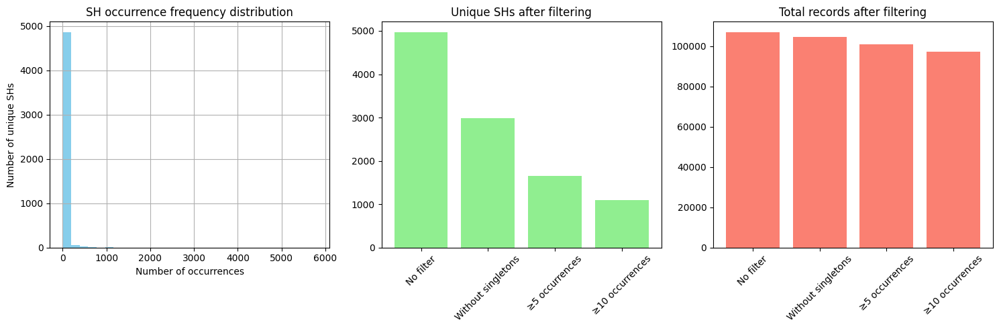


Examples of singletons (1970 total):
['SH1398314.10FU_MT444107_reps', 'SH1365379.10FU_MT935409_refs', 'SH1366591.10FU_AJ242890_reps', 'SH0002342.10FU_ON063373_reps_singleton', 'SH1268874.10FU_UDB065504_reps', 'SH1320134.10FU_UDB05340079_reps', 'SH1381029.10FU_UDB02618588_reps', 'SH1195685.10FU_UDB02280989_reps', 'SH1944187.10FU_UDB021486_refs', 'SH1337232.10FU_MG836660_reps']


In [20]:
## Checking for the presence and quantity of singletons and rare (1, 5, 10) SHs

import pandas as pd
import matplotlib.pyplot as plt

# 1. Counting SH occurrence frequencies
sh_counts = data['SH'].value_counts().reset_index()
sh_counts.columns = ['SH', 'Count']

print("Top-10 most frequent SHs:")
print(sh_counts.head(10))

# 2. Analysis of singletons and rare values
summary = pd.DataFrame({
    'Category': ['Total unique SHs',
                 'Singletons (1 occurrence)',
                 'Occur 2-4 times',
                 'Occur 5-9 times',
                 'Occur ≥10 times'],
    'Count': [
        len(sh_counts),
        len(sh_counts[sh_counts['Count'] == 1]),
        len(sh_counts[(sh_counts['Count'] >= 2) & (sh_counts['Count'] < 5)]),
        len(sh_counts[(sh_counts['Count'] >= 5) & (sh_counts['Count'] < 10)]),
        len(sh_counts[sh_counts['Count'] >= 10])
    ]
})

print("\nSH distribution by frequency:")
print(summary)

# 3. Data filtering and impact analysis
results = []

# Original data
results.append({
    'Filter': 'No filter',
    'Unique SHs': data['SH'].nunique(),
    'Total records': len(data),
    'Average frequency': data['SH'].value_counts().mean()
})

# Filters
filter_conditions = [
    ('Without singletons', lambda x: x > 1),
    ('≥5 occurrences', lambda x: x >= 5),
    ('≥10 occurrences', lambda x: x >= 10)
]

for name, condition in filter_conditions:
    # Find SHs satisfying the condition
    valid_sh = sh_counts[condition(sh_counts['Count'])]['SH']

    # Filter data
    filtered = data[data['SH'].isin(valid_sh)]

    results.append({
        'Filter': name,
        'Unique SHs': filtered['SH'].nunique(),
        'Total records': len(filtered),
        'Average frequency': filtered['SH'].value_counts().mean()
    })

# Filtering results
result_df = pd.DataFrame(results)
print("\nImpact of filtering on data:")
print(result_df)

# Visualization
plt.figure(figsize=(15, 5))

# Frequency distribution plot
plt.subplot(1, 3, 1)
sh_counts['Count'].hist(bins=30, color='skyblue')
plt.title('SH occurrence frequency distribution')
plt.xlabel('Number of occurrences')
plt.ylabel('Number of unique SHs')

# Unique SHs after filtering plot
plt.subplot(1, 3, 2)
plt.bar(result_df['Filter'], result_df['Unique SHs'], color='lightgreen')
plt.title('Unique SHs after filtering')
plt.xticks(rotation=45)

# Total records plot
plt.subplot(1, 3, 3)
plt.bar(result_df['Filter'], result_df['Total records'], color='salmon')
plt.title('Total records after filtering')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Additional information about singletons
singletons = sh_counts[sh_counts['Count'] == 1]['SH']
print(f"\nExamples of singletons ({len(singletons)} total):")
print(singletons.head(10).to_list())

Top-10 most frequent OTUs:
                                         ID  Count
0  3d455ac65ea26c4b5f8d0f07d9b85bce6ebebaa5    104
1  c8efa713da646c485be82cc7e1ab15c2e1ec46d9     79
2  02d38d7d96236dbdb369ed09bcea4517c8e4bb59     76
3  7ede552f383b79d58f9243e5d3ae5fda950a9847     73
4  96aa3f70c3d24e6e190be35ed142be639c3b3c82     68
5  6b9a4a76a4a34fe0e9b65b3d626fc4761bbe875d     67
6  3fdc55d5cb553ad25515d44b2b89873d8a1ca70f     64
7  0db2435b7cf8aed272a12a8f72f405eb31b4a871     63
8  ea14e803416cba266de4fba2baa1e76e053e8021     63
9  84e2a57d1b6900f1d31779c3b30cd1c182f9cae9     60

OTUs distribution by frequency:
                    Category  Count
0           Total unique SHs  88400
1  Singletons (1 occurrence)  83389
2            Occur 2-4 times   3859
3            Occur 5-9 times    694
4            Occur ≥10 times    458

Impact of filtering on data:
               Filter  Unique OTUs  Total records  Average frequency
0           No filter        88400         106742           1.20

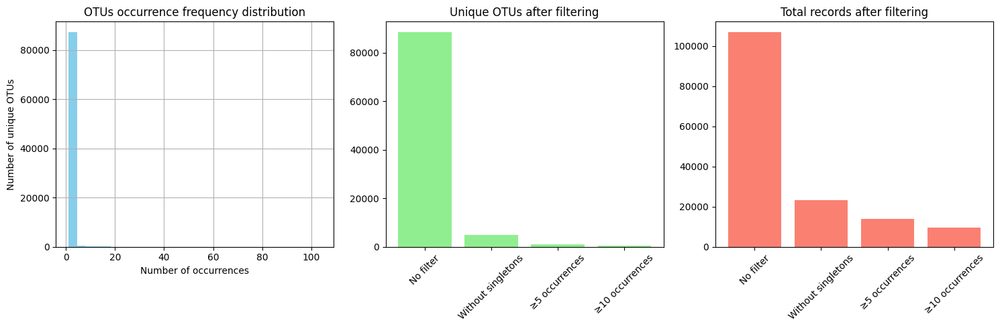


Examples of singletons (83389 total):
['a2d191bd39eb275b8318f4c8703f14d007b42c1e', '2d84666e06f9d4a819ba0401e7a928c39289d12f', '0e563087763c389e9c73bc55da99fce9b79b23ad', 'a79e56b0d5c3aa0a31f89727740da523c1895e68', '39244c07379440c829202bbecd8a6bbdfcdfaa25', 'f646fca3c15e5562b4a84802fc805ec44864b165', '2b73cf1d270e0f6430564e9682b88a13df6fb641', '2b74cab456d987b9cc42469db28760e67855332c', 'a836e91fdf2c1b268bbe8dc083209269e9331ff0', '177a7362a790de96e4b422c1b57b05be3803741c']


In [21]:
## Checking for the presence and quantity of singletons and rare (1, 5, 10) OTUs

import pandas as pd
import matplotlib.pyplot as plt

# 1. Counting SH occurrence frequencies
sh_counts = data['ID'].value_counts().reset_index()
sh_counts.columns = ['ID', 'Count']

print("Top-10 most frequent OTUs:")
print(sh_counts.head(10))

# 2. Analysis of singletons and rare values
summary = pd.DataFrame({
    'Category': ['Total unique SHs',
                 'Singletons (1 occurrence)',
                 'Occur 2-4 times',
                 'Occur 5-9 times',
                 'Occur ≥10 times'],
    'Count': [
        len(sh_counts),
        len(sh_counts[sh_counts['Count'] == 1]),
        len(sh_counts[(sh_counts['Count'] >= 2) & (sh_counts['Count'] < 5)]),
        len(sh_counts[(sh_counts['Count'] >= 5) & (sh_counts['Count'] < 10)]),
        len(sh_counts[sh_counts['Count'] >= 10])
    ]
})

print("\nOTUs distribution by frequency:")
print(summary)

# 3. Data filtering and impact analysis
results = []

# Original data
results.append({
    'Filter': 'No filter',
    'Unique OTUs': data['ID'].nunique(),
    'Total records': len(data),
    'Average frequency': data['ID'].value_counts().mean()
})

# Filters
filter_conditions = [
    ('Without singletons', lambda x: x > 1),
    ('≥5 occurrences', lambda x: x >= 5),
    ('≥10 occurrences', lambda x: x >= 10)
]

for name, condition in filter_conditions:
    # Find SHs satisfying the condition
    valid_sh = sh_counts[condition(sh_counts['Count'])]['ID']

    # Filter data
    filtered = data[data['ID'].isin(valid_sh)]

    results.append({
        'Filter': name,
        'Unique OTUs': filtered['ID'].nunique(),
        'Total records': len(filtered),
        'Average frequency': filtered['ID'].value_counts().mean()
    })

# Filtering results
result_df = pd.DataFrame(results)
print("\nImpact of filtering on data:")
print(result_df)

# Visualization
plt.figure(figsize=(15, 5))

# Frequency distribution plot
plt.subplot(1, 3, 1)
sh_counts['Count'].hist(bins=30, color='skyblue')
plt.title('OTUs occurrence frequency distribution')
plt.xlabel('Number of occurrences')
plt.ylabel('Number of unique OTUs')

# Unique SHs after filtering plot
plt.subplot(1, 3, 2)
plt.bar(result_df['Filter'], result_df['Unique OTUs'], color='lightgreen')
plt.title('Unique OTUs after filtering')
plt.xticks(rotation=45)

# Total records plot
plt.subplot(1, 3, 3)
plt.bar(result_df['Filter'], result_df['Total records'], color='salmon')
plt.title('Total records after filtering')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Additional information about singletons
singletons = sh_counts[sh_counts['Count'] == 1]['ID']
print(f"\nExamples of singletons ({len(singletons)} total):")
print(singletons.head(10).to_list())

In [22]:
## Нормализация и приведение в матричный вид таблицы данных


# 1. Группируем по SH и SampleID, суммируем Count (если есть повторы)
grouped = data.groupby(['SH', 'SampleID'])['Count'].sum().reset_index()

# 2. Нормализуем Count до % в каждой пробе
# Считаем сумму Count для каждой пробы
sample_totals = grouped.groupby('SampleID')['Count'].transform('sum')

# Вычисляем относительную численность (%)
grouped['RelativeAbundance'] = (grouped['Count'] / sample_totals) * 100

# 3. Преобразуем в матрицу (SH × SampleID)
normalized_data = grouped.pivot_table(
    index='SH',          # Строки — виды
    columns='SampleID',  # Столбцы — пробы
    values='RelativeAbundance',  # Значения — %
    fill_value=0         # Заменяем пропуски на 0
)

# Проверка: сумма по столбцам (пробам) должна быть ~100%
print(normalized_data.sum(axis=0).head())

# Сохраняем в файл (если нужно)
normalized_data.to_csv("otu_matrix_relative_abundance.csv", sep="\t")
normalized_data

SampleID
1    100.0
2    100.0
3    100.0
4    100.0
5    100.0
dtype: float64


SampleID,1,2,3,4,5,6,7,8,9,10,...,770,771,772,773,774,775,776,777,778,779
SH,,,,,,,,,,,,,,,,,,,,,
SH0001579.10FU_KX461969_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.036166,0.0,0.0,0.0,0.0,0.017705,0.01998,0.053638,0.029214,0.000000
SH0001652.10FU_UDB01931429_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000
SH0001807.10FU_UDB02777268_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000
SH0001823.10FU_UDB03008422_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000
SH0001824.10FU_UDB03389824_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SH1957084.10FU_DQ677655_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.159955,0.0,0.0,0.0,...,0.018083,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.016964
SH1957257.10FU_EU280098_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000
SH1957645.10FU_MH287489_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000


In [23]:
# Удаление видов с числом встреч <= 5 из таблицы data

# 1. Подсчет количества проб, где встречается каждый SH (число встреч)
sh_occurrences = data.groupby('SH')['SampleID'].nunique().reset_index()
sh_occurrences.columns = ['SH', 'NumOccurrences']

# 2. Получаем список SH с числом встреч <= 5
rare_sh = sh_occurrences[sh_occurrences['NumOccurrences'] <= 5]['SH']

# 3. Фильтруем исходные данные, оставляя только записи с SH, встречающимися > 5 раз
data_no_rare = data[~data['SH'].isin(rare_sh)].copy()

# 4. Проверка результатов
print(f"Исходное количество записей: {len(data)}")
print(f"Количество записей после фильтрации: {len(data_no_rare)}")
print(f"Удалено записей: {len(data) - len(data_no_rare)}")
print(f"Исходное количество уникальных SH: {data['SH'].nunique()}")
print(f"Уникальных SH после фильтрации: {data_no_rare['SH'].nunique()}")
print(f"Удалено SH с числом встреч <= 5: {len(rare_sh)}")

# Дополнительная статистика
print("\nДополнительная статистика:")
occurrence_stats = sh_occurrences['NumOccurrences'].describe()
print(f"Распределение числа встреч по SH:\n{occurrence_stats}")

Исходное количество записей: 106742
Количество записей после фильтрации: 97747
Удалено записей: 8995
Исходное количество уникальных SH: 4963
Уникальных SH после фильтрации: 1219
Удалено SH с числом встреч <= 5: 3744

Дополнительная статистика:
Распределение числа встреч по SH:
count    4963.000000
mean        6.457586
std        13.685282
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       261.000000
Name: NumOccurrences, dtype: float64


In [24]:
## Нормализация без редких видов (< 5)


# 1. Группируем по SH и SampleID, суммируем Count (если есть повторы)
grouped = data_no_rare.groupby(['SH', 'SampleID'])['Count'].sum().reset_index()

# 2. Нормализуем Count до % в каждой пробе
# Считаем сумму Count для каждой пробы
sample_totals = grouped.groupby('SampleID')['Count'].transform('sum')

# Вычисляем относительную численность (%)
grouped['RelativeAbundance'] = (grouped['Count'] / sample_totals) * 100

# 3. Преобразуем в матрицу (SH × SampleID)
normalized_data_no_rare = grouped.pivot_table(
    index='SH',          # Строки — виды
    columns='SampleID',  # Столбцы — пробы
    values='RelativeAbundance',  # Значения — %
    fill_value=0         # Заменяем пропуски на 0
)

# Проверка: сумма по столбцам (пробам) должна быть ~100%
print(normalized_data_no_rare.sum(axis=0).head())

# Сохраняем в файл (если нужно)
normalized_data_no_rare.to_csv("otu_matrix_relative_abundance.csv", sep="\t")
normalized_data_no_rare

SampleID
1    100.0
2    100.0
3    100.0
4    100.0
5    100.0
dtype: float64


SampleID,1,2,3,4,5,6,7,8,9,10,...,770,771,772,773,774,775,776,777,778,779
SH,,,,,,,,,,,,,,,,,,,,,
SH0001579.10FU_KX461969_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.036657,0.0,0.0,0.000000,0.000000,0.01796,0.021772,0.091491,0.029555,0.000000
SH0001883.10FU_KU325451_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.044494,0.020117,3.89727,0.000000,0.000000,0.000000,0.000000
SH0001884.10FU_KU325455_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.01796,0.000000,0.000000,0.000000,0.000000
SH0001898.10FU_KU325079_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.00000,0.021772,0.000000,0.014778,0.000000
SH0002175.10FU_KU515880_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SH1950739.10FU_KX926423_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.014778,0.000000
SH1951723.10FU_FN908919_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
SH1955666.10FU_UDB027977_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000


In [25]:
# Экспорт матрицы со средним обилием видов по субстратам
import pandas as pd

# 1. Приводим ключи к одному формату
data['SH'] = data['SH'].astype(str).str.strip()
metadata['SampleID'] = metadata['SampleID'].astype(str).str.strip()
data['SampleID'] = data['SampleID'].astype(str).str.strip()

# 2. Объединяем данные (только нужные столбцы)
merged = pd.merge(
    data[['SampleID', 'Count', 'SH']],
    metadata[['SampleID', 'substrate']],
    on='SampleID',
    how='inner'
)

# 3. Группируем по SH и субстрату, считаем СРЕДНЕЕ abundance
summary = merged.groupby(['SH', 'substrate'])['Count'].mean().unstack(fill_value=0)

# 4. Добавляем таксономическую информацию
taxonomy = data[['SH', 'Kingdom Sklearn', 'Phylum Sklearn', 'Class Sklearn',
                 'Order Sklearn', 'Family Sklearn', 'Genus Sklearn', 'Species Sklearn']].drop_duplicates()

result = pd.merge(
    summary.reset_index(),
    taxonomy,
    on='SH',
    how='left'
)

# 5. Переименовываем таксономические столбцы
result = result.rename(columns={
    'Kingdom Sklearn': 'Kingdom',
    'Phylum Sklearn': 'Phylum',
    'Class Sklearn': 'Class',
    'Order Sklearn': 'Order',
    'Family Sklearn': 'Family',
    'Genus Sklearn': 'Genus',
    'Species Sklearn': 'Species'
})

# 6. Сохраняем результат
print("Размер итоговой таблицы:", result.shape)
print("\nПервые 5 строк:")
display(result.head())

result.to_csv('SH_substrate_mean_abundance.csv', index=False)

/tmp/ipython-input-1056579935.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['SH'] = data['SH'].astype(str).str.strip()
/tmp/ipython-input-1056579935.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata['SampleID'] = metadata['SampleID'].astype(str).str.strip()
/tmp/ipython-input-1056579935.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://p

Размер итоговой таблицы: (9293, 15)

Первые 5 строк:


,SH,litter,litter bag,mycopins,mycorrhiza,peatspill,peatstrat,peatupper,Kingdom,Phylum,Class,Order,Family,Genus,Species
0,SH0001579.10FU_KX461969_reps_singleton,1.416667,1.0,0.0,0.0,1.0,0.0,0.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Helotiales_fam_Incertae_sedis,Helotiales_gen_Incertae_sedis,Helotiales_sp
1,SH0001579.10FU_KX461969_reps_singleton,1.416667,1.0,0.0,0.0,1.0,0.0,0.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,Leptodontidiaceae,Leptodontidium,Leptodontidium_sp
2,SH0001579.10FU_KX461969_reps_singleton,1.416667,1.0,0.0,0.0,1.0,0.0,0.0,Fungi,Ascomycota,Leotiomycetes,Helotiales,NaN,NaN,NaN
3,SH0001579.10FU_KX461969_reps_singleton,1.416667,1.0,0.0,0.0,1.0,0.0,0.0,Fungi,Ascomycota,NaN,NaN,NaN,NaN,NaN
4,SH0001652.10FU_UDB01931429_reps_singleton,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,Fungi,Ascomycota,Sordariomycetes,Hypocreales,Nectriaceae,Nectriaceae_gen_Incertae_sedis,Nectriaceae_sp


In [26]:
# Функция для вывода среднего обилия конкретных таксонов по субстратным группам

# Укажите нужные таксоны и уровень группировки
target_taxa = ["Ascocoryne"]  # Список таксонов
taxon_level = "Genus"  # Уровень таксона: "Genus", "Family", "Order" и т.д.

# 1. Фильтруем данные по выбранным таксонам
filtered_data = result[result[taxon_level].isin(target_taxa)]

# 2. Группируем по таксону и субстратам, считаем среднее
substrate_cols = ['litter', 'litter bag', 'mycopins', 'mycorrhiza',
                 'peatspill', 'peatstrat', 'peatupper']
summary = filtered_data.groupby(taxon_level)[substrate_cols].mean().reset_index()

# 3. Выводим результат
print(f"\nСреднее abundance для {taxon_level} ({', '.join(target_taxa)}):")
display(summary)

# 4. Сохраняем в CSV (опционально)
summary.to_csv(f"mean_abundance_{taxon_level}_multiple.csv", index=False)


Среднее abundance для Genus (Ascocoryne):


,Genus,litter,litter bag,mycopins,mycorrhiza,peatspill,peatstrat,peatupper
0,Ascocoryne,31.925868,4.804233,15.333333,0.333333,2.611111,0.333333,8.139847


# TAXONOMIC ANALYSIS AND COMPARISON BY GROUPS


## GENERAL TAXONOMIC ANALYSIS


In [27]:
# создадим дополнительный чеклист (метабаркодинг стандартизован по лишайникам)

# 1. Получаем список уникальных семейств из чеклиста 'lichen survey'
lichen_survey_families = allchecklists[allchecklists['checklist'] == 'lichen survey']['family'].unique()
lichen_survey_families = [f for f in lichen_survey_families if pd.notna(f)]  # Убираем NaN

# 2. Выбираем только записи из 'metabarcoding', которые принадлежат этим семействам
metabarcoding_data = allchecklists[allchecklists['checklist'] == 'metabarcoding'].copy()
new_checklist = metabarcoding_data[metabarcoding_data['family'].isin(lichen_survey_families)].copy()

# 3. Добавляем метку нового чеклиста
new_checklist['checklist'] = 'std metab/lichens'

# 4. Объединяем с исходными данными (если нужно сохранить)
allchecklists = pd.concat([allchecklists, new_checklist], ignore_index=True)
allchecklists

,checklist,SH,kingdom,phylum,class,order,family,genus,binom,qualifier,qualifierNumber
0,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Gymnopilus,NaN,NaN,NaN
1,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Russulales,Russulaceae,Russula,Russula emetica,NaN,NaN
2,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,NaN,NaN,NaN,NaN
3,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Omphalotaceae,Gymnopus,Gymnopus junquilleus,NaN,NaN
4,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Omphalotaceae,Gymnopus,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
9593,std metab/lichens,SH1203337.10FU_MN483156_reps,Fungi,Ascomycota,Lecanoromycetes,Baeomycetales,Trapeliaceae,Trapelia,Trapelia coarctata,,
9594,std metab/lichens,SH1201772.10FU_KF291172_refs,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hygrophoraceae,Hygrocybe,Hygrocybe cantharellus,,
9595,std metab/lichens,SH0079889.10FU_KJ462317_refs_singleton,Fungi,Ascomycota,Lecanoromycetes,Baeomycetales,Xylographaceae,Xylographa,Xylographa septentrionalis,,
9596,std metab/lichens,SH1199222.10FU_JQ813502_reps,Fungi,Ascomycota,Lecanoromycetes,Lecanorales,Parmeliaceae,Melanohalea,Melanohalea exasperatula,,


In [28]:
# создадим дополнительный чеклист (метабаркодинг курированный стандартизован по макромицетам)

# 1. Получаем список уникальных семейств из чеклиста 'barcoding macrofungi'
macrofungi_families = allchecklists[allchecklists['checklist'] == 'barcoding macrofungi']['family'].unique()
macrofungi_families = [f for f in macrofungi_families if pd.notna(f)]  # Убираем NaN

# 2. Выбираем только записи из 'metabarcoding', которые принадлежат этим семействам
metabarcoding_data = allchecklists[allchecklists['checklist'] == 'metab curated'].copy()
new_checklist = metabarcoding_data[metabarcoding_data['family'].isin(macrofungi_families)].copy()

# 3. Добавляем метку нового чеклиста
new_checklist['checklist'] = 'std metab curated/macrofungi'

# 4. Объединяем с исходными данными (если нужно сохранить)
allchecklists = pd.concat([allchecklists, new_checklist], ignore_index=True)
allchecklists

,checklist,SH,kingdom,phylum,class,order,family,genus,binom,qualifier,qualifierNumber
0,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Gymnopilus,NaN,NaN,NaN
1,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Russulales,Russulaceae,Russula,Russula emetica,NaN,NaN
2,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,NaN,NaN,NaN,NaN
3,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Omphalotaceae,Gymnopus,Gymnopus junquilleus,NaN,NaN
4,barcoding macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Omphalotaceae,Gymnopus,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
9852,std metab curated/macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Thaxterogaster,Thaxterogaster talus,NaN,NaN
9853,std metab curated/macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Tricholomataceae,Tricholoma,Tricholoma fulvum,NaN,NaN
9854,std metab curated/macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,Xeromphalina campanelloides,NaN,NaN
9855,std metab curated/macrofungi,NaN,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Xeromphalina,Xeromphalina enigmatica,NaN,NaN


In [29]:
# Таксономическое разнообразие по проектам

import pandas as pd

def create_taxonomic_counts(allchecklists, output_file='taxonomic_counts.csv'):
    """
    Создает сводную таблицу с количеством уникальных таксонов на каждом уровне для каждого чеклиста
    и дополнительно рассчитывает для комбинированной группы чеклистов

    Параметры:
    combined_checklists - исходная таблица с данными
    output_file - имя файла для сохранения результатов
    """
    # Проверяем необходимые столбцы
    required_columns = ['checklist', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom', 'SH']
    for col in required_columns:
        if col not in allchecklists.columns:
            raise ValueError(f"В таблице отсутствует необходимый столбец: {col}")

    # Создаем пустую сводную таблицу
    summary = pd.DataFrame()

    # Для каждого чеклиста считаем количество уникальных таксонов на каждом уровне
    for checklist in allchecklists['checklist'].unique():
        # Фильтруем данные по текущему чеклисту
        subset = allchecklists[allchecklists['checklist'] == checklist]

        # Считаем количество уникальных значений на каждом таксономическом уровне
        counts = {
            'checklist': checklist,
            'Kingdom': subset['kingdom'].nunique(),
            'Phylum': subset['phylum'].nunique(),
            'Class': subset['class'].nunique(),
            'Order': subset['order'].nunique(),
            'Family': subset['family'].nunique(),
            'Genus': subset['genus'].nunique(),
            'Binom': subset['binom'].nunique(),
            'SH': subset['SH'].nunique()
        }

        # Добавляем в сводную таблицу
        summary = pd.concat([summary, pd.DataFrame([counts])], ignore_index=True)

    # Добавляем расчет для комбинированной группы чеклистов
    target_checklists = ['barcoding macrofungi', 'lichen survey', 'plant litter survey', 'wood decay survey']
    combined_subset = allchecklists[allchecklists['checklist'].isin(target_checklists)]

    if not combined_subset.empty:
        combined_counts = {
            'checklist': 'survey totally',
            'Kingdom': combined_subset['kingdom'].nunique(),
            'Phylum': combined_subset['phylum'].nunique(),
            'Class': combined_subset['class'].nunique(),
            'Order': combined_subset['order'].nunique(),
            'Family': combined_subset['family'].nunique(),
            'Genus': combined_subset['genus'].nunique(),
            'Binom': combined_subset['binom'].nunique(),
            'SH': combined_subset['SH'].nunique()
        }
        summary = pd.concat([summary, pd.DataFrame([combined_counts])], ignore_index=True)

    # Упорядочиваем столбцы
    summary = summary[['checklist', 'Kingdom', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Binom', 'SH']]

    # Выводим таблицу
    print("Сводная таблица количества таксонов по чеклистам:")
    print(summary)

    # Сохраняем в CSV
    summary.to_csv(output_file, index=False, encoding='utf-8-sig')
    print(f"\nТаблица сохранена в файл: {output_file}")

    return summary

# Пример использования
if __name__ == "__main__":
    # Замените на вашу реальную таблицу
    # combined_checklists = pd.read_csv('your_file.csv')

    # Создаем сводную таблицу
    taxonomic_counts = create_taxonomic_counts(allchecklists)

Сводная таблица количества таксонов по чеклистам:
                       checklist  Kingdom  Phylum  Class  Order  Family  \
0           barcoding macrofungi        1       2      3      6      18   
1                  lichen survey        1       2      5     11      17   
2            plant litter survey        1       2      5      8      14   
3              wood decay survey        1       2      4     16      29   
4                  metab curated        2       3      8     17      49   
5                   metab litter        1      10     36    116     282   
6                 metab mycopins        1       7     29     82     172   
7                  metabarcoding        1      13     47    146     369   
8              std metab/lichens        1       2      5      9      14   
9   std metab curated/macrofungi        1       2      2      4      16   
10                survey totally        1       3     12     33      74   

    Genus  Binom    SH  
0      26     68    76  

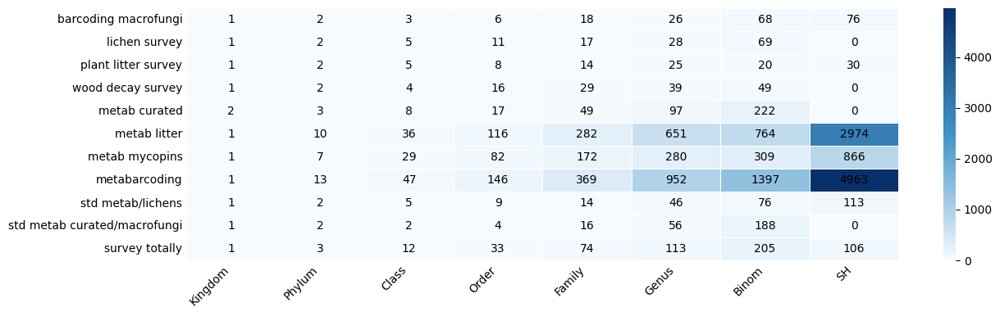

In [30]:
# Тепловая карта для таксономического разнообразия по проектам

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Создаем кастомную цветовую карту
colors = ["#f7fbff", "#4292c6", "#08306b"]
cmap = LinearSegmentedColormap.from_list("taxon_cmap", colors)

# Подготовка данных
heatmap_data = taxonomic_counts.set_index('checklist')

# Настраиваем размер графика
plt.figure(figsize=(14, 4))

# Создаем тепловую карту с улучшенными параметрами
ax = sns.heatmap(
    heatmap_data,
    annot=True,
    fmt='d',
    cmap=cmap,
    linewidths=0.5,
    linecolor='white',
    cbar_kws={'label': 'Количество таксонов'},
    annot_kws={'size': 10, 'color': 'black'}
)

# Настраиваем оформление
plt.title('', pad=20, fontsize=16)
plt.xlabel('', fontsize=12)
plt.ylabel('', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Добавляем сетку для лучшей читаемости
ax.grid(False)
ax.tick_params(axis='both', which='both', length=0)

# Улучшаем отображение цветовой шкалы
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)
cbar.set_label('', rotation=270, labelpad=20)

# Сохраняем в высоком качестве
plt.savefig('taxonomic_heatmap.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()

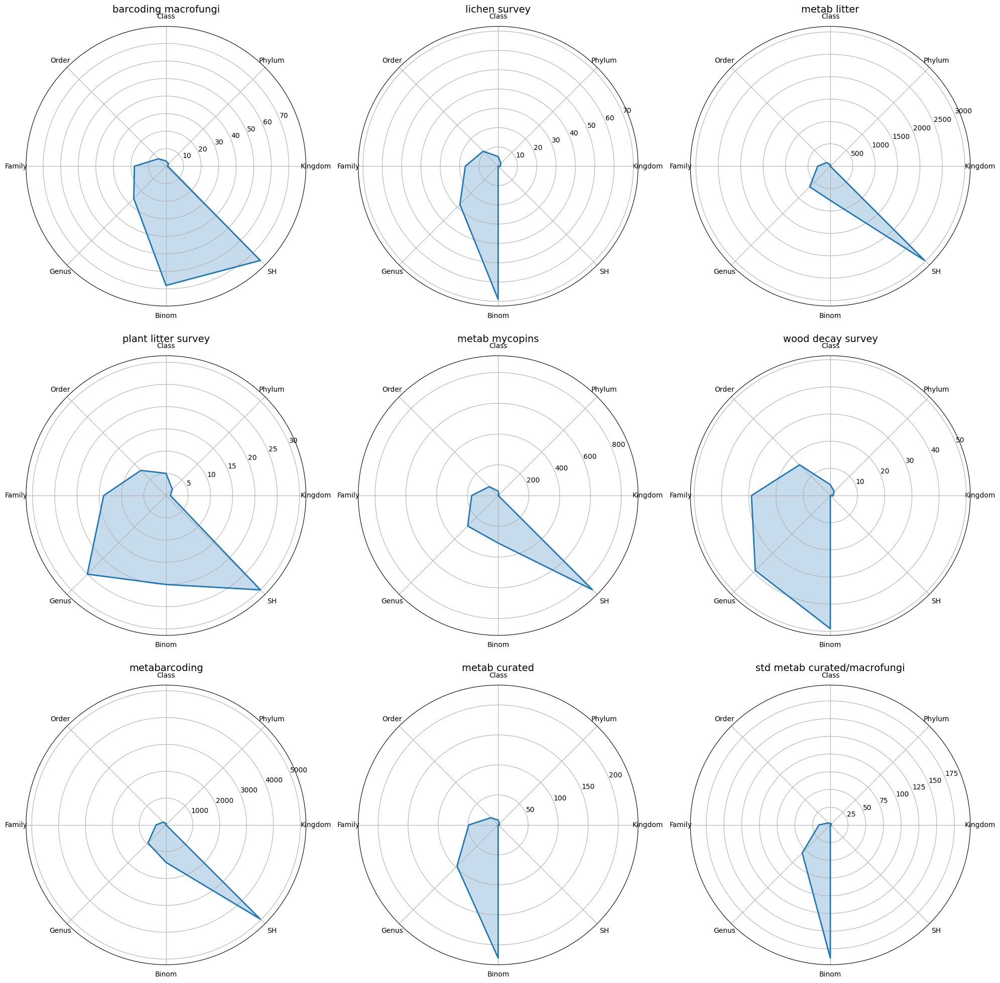

In [31]:
# Радиальные диаграммы для таксономического разнообразия по проектам
import numpy as np
import matplotlib.pyplot as plt

# Задаем строгий порядок проектов
project_order = [
    'barcoding macrofungi',
    'lichen survey',
    'metab litter',
    'plant litter survey',
    'metab mycopins',
    'wood decay survey',
    'metabarcoding',
    'metab curated',
    'std metab curated/macrofungi'
]

# Фильтруем и сортируем данные согласно порядку
taxonomic_counts_ordered = taxonomic_counts.set_index('checklist').loc[project_order].reset_index()

# Настройка сетки
n_projects = len(taxonomic_counts_ordered)
n_cols = 3
n_rows = int(np.ceil(n_projects / n_cols))

# Создаем фигуру с увеличенными шрифтами
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20), subplot_kw=dict(polar=True))
fig.suptitle('', y=1.05, fontsize=16)

# Увеличенные размеры шрифтов
title_fontsize = 14  # было 10
label_fontsize = 12   # было 8
tick_fontsize = 10    # было (не задано явно)

# Для каждого проекта в заданном порядке
for idx, (_, row) in enumerate(taxonomic_counts_ordered.iterrows()):
    ax = axes.flatten()[idx]

    # Данные и углы
    categories = ['Kingdom','Phylum','Class','Order','Family','Genus','Binom','SH']
    values = row[categories].values
    angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False)

    # Замыкаем график
    values = np.concatenate((values,[values[0]]))
    angles = np.concatenate((angles,[angles[0]]))

    # Рисуем
    ax.plot(angles, values, linewidth=2, linestyle='solid')
    ax.fill(angles, values, alpha=0.25)
    ax.set_title(row['checklist'], pad=20, fontsize=title_fontsize)

    # Настройка осей с увеличенными шрифтами
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=label_fontsize)
    ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)

    # Единый масштаб для всех диаграмм
    #ax.set_ylim(0, taxonomic_counts[categories].max().max() * 1.0)

# Убираем пустые графики
for idx in range(n_projects, n_rows*n_cols):
    axes.flatten()[idx].set_visible(False)

plt.tight_layout()
plt.savefig('radar_matrix_ordered_large_fonts.png', dpi=300, bbox_inches='tight')
plt.show()

In [32]:
# Таксономическое разрешение по группам

import pandas as pd

def create_taxonomic_resolution(allchecklists, output_file='taxonomic_resolution.csv'):
    """
    Анализирует таксономическое разрешение
    """
    required_columns = ['checklist', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom']
    for col in required_columns:
        if col not in allchecklists.columns:
            raise ValueError(f"Отсутствует столбец: {col}")

    # Сначала проверим данные
    print("Проверка данных:")
    print(f"Всего записей: {len(allchecklists)}")
    for col in ['kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom']:
        non_null = allchecklists[col].notna().sum()
        non_empty = allchecklists[col].astype(str).str.strip().ne('').sum()
        print(f"{col}: {non_null} notnull, {non_empty} non-empty")

    resolution_summary = pd.DataFrame()

    for checklist in allchecklists['checklist'].unique():
        print(f"\nАнализируем чеклист: {checklist}")

        # Создаем копию подмножества
        subset = allchecklists[allchecklists['checklist'] == checklist].copy()
        print(f"Записей в чеклисте: {len(subset)}")

        def get_max_resolution(row):
            # Проверяем не только на NaN, но и на пустые строки
            if pd.notna(row['binom']) and str(row['binom']).strip() != '':
                return 'Species'
            elif pd.notna(row['genus']) and str(row['genus']).strip() != '':
                return 'Genus'
            elif pd.notna(row['family']) and str(row['family']).strip() != '':
                return 'Family'
            elif pd.notna(row['order']) and str(row['order']).strip() != '':
                return 'Order'
            elif pd.notna(row['class']) and str(row['class']).strip() != '':
                return 'Class'
            elif pd.notna(row['phylum']) and str(row['phylum']).strip() != '':
                return 'Phylum'
            elif pd.notna(row['kingdom']) and str(row['kingdom']).strip() != '':
                return 'Kingdom'
            else:
                return 'Unidentified'

        # Применяем функцию
        subset.loc[:, 'max_resolution'] = subset.apply(get_max_resolution, axis=1)

        # Проверим распределение
        resolution_counts = subset['max_resolution'].value_counts()
        print("Распределение разрешений:")
        print(resolution_counts)

        resolution_data = {
            'checklist': checklist,
            'Kingdom_only': resolution_counts.get('Kingdom', 0),
            'Phylum_only': resolution_counts.get('Phylum', 0),
            'Class_only': resolution_counts.get('Class', 0),
            'Order_only': resolution_counts.get('Order', 0),
            'Family_only': resolution_counts.get('Family', 0),
            'Genus_only': resolution_counts.get('Genus', 0),
            'Species': resolution_counts.get('Species', 0),
            'Unidentified': resolution_counts.get('Unidentified', 0),
            'Total_records': len(subset)
        }

        resolution_summary = pd.concat([resolution_summary, pd.DataFrame([resolution_data])],
                                    ignore_index=True)

    column_order = ['checklist', 'Total_records', 'Species', 'Genus_only', 'Family_only',
                   'Order_only', 'Class_only', 'Phylum_only', 'Kingdom_only', 'Unidentified']

    # Выводим таблицу
    print("\n" + "="*80)
    print("ИТОГОВАЯ ТАБЛИЦА:")
    print("="*80)
    print(resolution_summary[column_order])

    # Сохраняем в CSV
    resolution_summary[column_order].to_csv(output_file, index=False, encoding='utf-8-sig')
    print(f"\nТаблица сохранена в файл: {output_file}")

    return resolution_summary[column_order]

# Дополнительная функция для отладки
def debug_checklist(allchecklists, checklist_name):
    """Отладочная информация по конкретному чеклисту"""
    subset = allchecklists[allchecklists['checklist'] == checklist_name]
    print(f"\nДЕБАГ чеклиста: {checklist_name}")
    print(f"Всего записей: {len(subset)}")

    # Посмотрим несколько записей
    print("\nПервые 5 записей:")
    print(subset[['kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'binom']].head())

    # Проверим заполненность
    for col in ['binom', 'genus', 'family', 'order', 'class', 'phylum', 'kingdom']:
        filled = subset[col].notna() & (subset[col].astype(str).str.strip() != '')
        print(f"{col}: {filled.sum()} заполнено")

# Пример использования
if __name__ == "__main__":
    # Сначала отладим проблемные чеклисты
    debug_checklist(allchecklists, 'barcoding macrofungi')
    debug_checklist(allchecklists, 'metabarcoding')

    # Затем запустим основной анализ
    resolution_table = create_taxonomic_resolution(allchecklists)
    print("Таксономическое разрешение:")
    print(resolution_table)


ДЕБАГ чеклиста: barcoding macrofungi
Всего записей: 94

Первые 5 записей:
  kingdom         phylum           class       order            family  \
0   Fungi  Basidiomycota  Agaricomycetes  Agaricales  Hymenogastraceae   
1   Fungi  Basidiomycota  Agaricomycetes  Russulales       Russulaceae   
2   Fungi  Basidiomycota  Agaricomycetes  Agaricales    Cortinariaceae   
3   Fungi  Basidiomycota  Agaricomycetes  Agaricales     Omphalotaceae   
4   Fungi  Basidiomycota  Agaricomycetes  Agaricales     Omphalotaceae   

        genus                 binom  
0  Gymnopilus                   NaN  
1     Russula       Russula emetica  
2         NaN                   NaN  
3    Gymnopus  Gymnopus junquilleus  
4    Gymnopus                   NaN  
binom: 74 заполнено
genus: 89 заполнено
family: 94 заполнено
order: 94 заполнено
class: 94 заполнено
phylum: 94 заполнено
kingdom: 94 заполнено

ДЕБАГ чеклиста: metabarcoding
Всего записей: 5066

Первые 5 записей:
     kingdom         phylum           

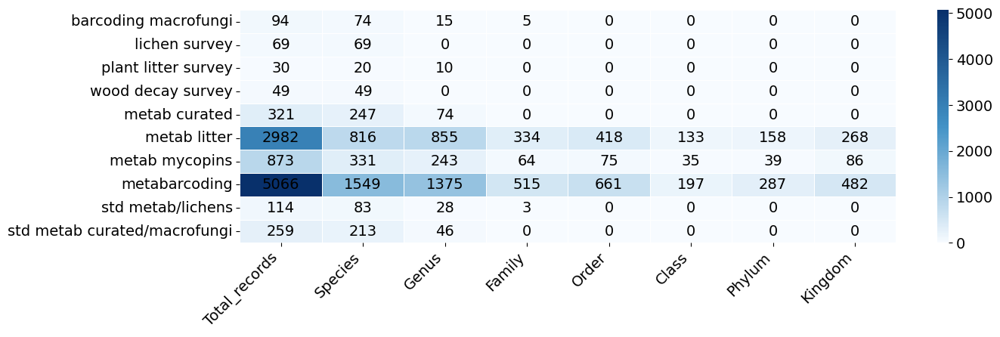

In [33]:
# Тепловая карта таксономического разрешения по группам

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Создаем кастомную цветовую карту (градации синего)
colors = ["#f7fbff", "#4292c6", "#08306b"]
cmap = LinearSegmentedColormap.from_list("resolution_cmap", colors)

# Подготовка данных (используем созданную ранее таблицу resolution_table)
heatmap_data = resolution_table.set_index('checklist')

# Удаляем столбец Unidentified для визуализации (если нужно)
heatmap_data = heatmap_data.drop(columns=['Unidentified'], errors='ignore')

# Настраиваем размер графика
plt.figure(figsize=(14, 4))

# Создаем тепловую карту
ax = sns.heatmap(
    heatmap_data,
    annot=True,
    fmt='d',
    cmap=cmap,
    linewidths=0.5,
    linecolor='white',
    cbar_kws={'label': 'Количество записей'},
    annot_kws={'size': 14, 'color': 'black'},
    square=False
)

# Настраиваем оформление
plt.title('', pad=20, fontsize=16)
plt.xlabel('', fontsize=14)
plt.ylabel('', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(rotation=0, fontsize=14)

# Улучшаем отображение цветовой шкалы
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=14)
cbar.set_label('', rotation=270, labelpad=20)

# Добавляем подписи к осям
ax.set_xticklabels([x.replace('_only', '') for x in heatmap_data.columns], rotation=45)
ax.set_yticklabels(heatmap_data.index, rotation=0)

# Сохраняем в высоком качестве
plt.savefig('taxonomic_resolution_heatmap.png',
            dpi=300,
            bbox_inches='tight',
            transparent=True)

plt.show()

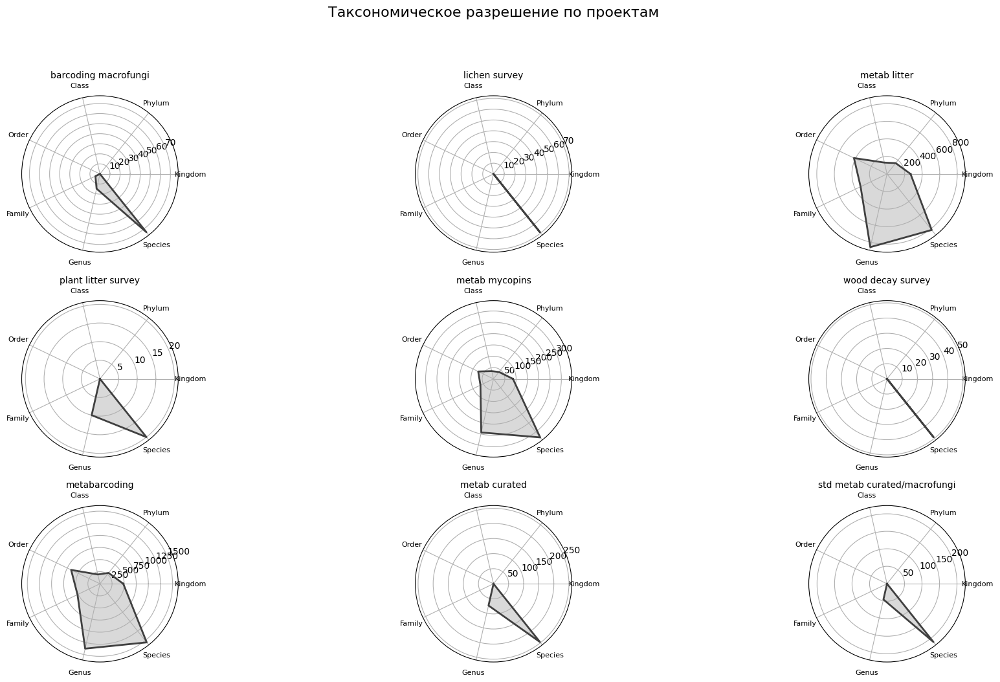

In [34]:
# Таксономическое разрешение по проектам в виде радиальных диаграмм

import numpy as np
import matplotlib.pyplot as plt

# Задаем строгий порядок проектов
project_order = [
    'barcoding macrofungi',
    'lichen survey',
    'metab litter',
    'plant litter survey',
    'metab mycopins',
    'wood decay survey',
    'metabarcoding',
    'metab curated',
    'std metab curated/macrofungi'
]

# Фильтруем и сортируем данные согласно порядку
resolution_ordered = resolution_table.set_index('checklist').loc[project_order].reset_index()

# Настройка сетки
n_projects = len(resolution_ordered)
n_cols = 3
n_rows = int(np.ceil(n_projects / n_cols))

# Создаем фигуру
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10), subplot_kw=dict(polar=True))
fig.suptitle('Таксономическое разрешение по проектам', y=1.05, fontsize=16)

# Категории для радиальных диаграмм (без '_only')
categories = ['Kingdom', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']
column_mapping = {
    'Kingdom': 'Kingdom_only',
    'Phylum': 'Phylum_only',
    'Class': 'Class_only',
    'Order': 'Order_only',
    'Family': 'Family_only',
    'Genus': 'Genus_only',
    'Species': 'Species'
}

# Цветовая схема
colors = plt.cm.viridis(np.linspace(0, 1, len(categories)))

# Для каждого проекта в заданном порядке
for idx, (_, row) in enumerate(resolution_ordered.iterrows()):
    ax = axes.flatten()[idx]

    # Подготовка данных
    values = [row[column_mapping[cat]] for cat in categories]
    angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False)

    # Замыкаем график
    values = np.concatenate((values,[values[0]]))
    angles = np.concatenate((angles,[angles[0]]))

    # Рисуем с заливкой
    ax.plot(angles, values, linewidth=2, linestyle='solid', color='#404040')
    ax.fill(angles, values, alpha=0.25, color='#696969')
    ax.set_title(row['checklist'], pad=20, fontsize=10)

    # Настройка осей
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=8)

    # Единый масштаб для всех диаграмм
    #max_value = resolution_table[list(column_mapping.values())].max().max()
    #ax.set_ylim(0, max_value * 1.1)  # +10% запаса

# Убираем пустые графики
for idx in range(n_projects, n_rows*n_cols):
    axes.flatten()[idx].set_visible(False)

plt.tight_layout()
plt.savefig('resolution_radar_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

## COMPARISON OF TAXONOMIC CHECKLISTS BY GROUPS


In [35]:
from sklearn.metrics import pairwise_distances
import seaborn as sns


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/pairwise.py:2466: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Предупреждение: чеклист ('std metab/macrofungi', 'metabarcoding') не найден в данных


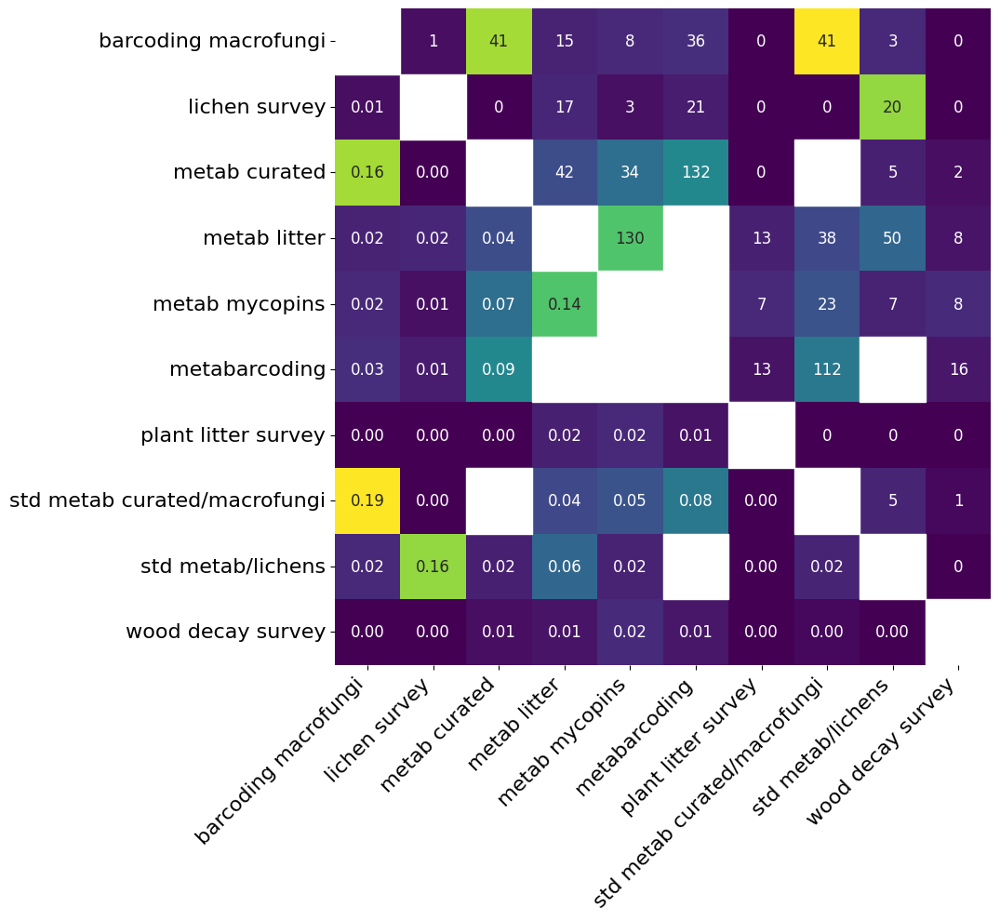

In [36]:
# Матрица сходства по всем группам

import numpy as np
import pandas as pd
from sklearn.metrics import pairwise_distances
import seaborn as sns
import matplotlib.pyplot as plt

# Создаём сводную таблицу
pivot = pd.crosstab(allchecklists['checklist'], allchecklists['binom'])
pivot_values = pivot.values

# 1. Матрица коэффициентов Жаккара
jaccard_dist = pairwise_distances(pivot_values, metric='jaccard')
jaccard_sim = 1 - jaccard_dist

# 2. Матрица количества общих таксонов
common_taxa = np.zeros_like(jaccard_sim, dtype=int)
for i in range(len(pivot)):
    for j in range(i + 1, len(pivot)):
        common_taxa[i, j] = np.sum((pivot_values[i] > 0) & (pivot_values[j] > 0))

# 3. Создаем текстовую матрицу для аннотаций
annot_matrix = np.zeros_like(jaccard_sim, dtype=object)
for i in range(len(pivot)):
    for j in range(len(pivot)):
        if i < j:
            annot_matrix[i, j] = f"{common_taxa[i, j]}"
        elif i > j:
            annot_matrix[i, j] = f"{jaccard_sim[i, j]:.2f}"
        else:
            annot_matrix[i, j] = "—"

# 4. Определяем бессмысленные сравнения
nonsense_pairs = [
    ('metab litter', 'metabarcoding'),
    ('metab mycopins', 'metabarcoding'),
    ('std metab/lichens', 'metabarcoding'),
    ('std metab/macrofungi', 'metabarcoding'),
    ('std metab curated/macrofungi', 'metab curated')
]

# 5. Создаем маску
mask = np.eye(len(pivot), dtype=bool)
checklist_names = list(pivot.index)
for pair in nonsense_pairs:
    try:
        i = checklist_names.index(pair[0])
        j = checklist_names.index(pair[1])
        mask[i, j] = True
        mask[j, i] = True
    except ValueError:
        print(f"Предупреждение: чеклист {pair} не найден в данных")

# Визуализация с настройками шрифта
plt.figure(figsize=(12, 10))
ax = sns.heatmap(
    jaccard_sim,
    annot=annot_matrix,
    fmt="",
    mask=mask,
    xticklabels=pivot.index,
    yticklabels=pivot.index,
    cmap="viridis",
    cbar=False,  # Убираем легенду
    square=True
)

# Устанавливаем размер шрифта для всех элементов
plt.xticks(fontsize=16, rotation=45, ha='right')
plt.yticks(fontsize=16, rotation=0)

# Увеличиваем шрифт аннотаций в матрице
for text in ax.texts:
    text.set_fontsize(12)

# Добавляем белые прямоугольники
for i in range(len(pivot)):
    for j in range(len(pivot)):
        if mask[i, j]:
            ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True, color='white', lw=1))

plt.tight_layout()
plt.show()

In [37]:
# Сохранение результатов сравнения таксономических групп в виде сводных таблиц

import pandas as pd
import os

def compare_taxa_groups(allchecklists, group_pairs, output_dir='taxa_comparison'):
    """
    Сравнивает таксономические группы и сохраняет результаты в CSV

    Параметры:
    checklist_df - DataFrame с данными
    group_pairs - список кортежей (group1, group2, output_name)
    output_dir - папка для сохранения результатов
    """
    os.makedirs(output_dir, exist_ok=True)

    def get_shared_unique(allchecklists, checklist1, checklist2):
        taxa1 = set(allchecklists[allchecklists['checklist'] == checklist1]['binom'].dropna())
        taxa2 = set(allchecklists[allchecklists['checklist'] == checklist2]['binom'].dropna())

        shared = sorted(taxa1 & taxa2)
        unique1 = sorted(taxa1 - taxa2)
        unique2 = sorted(taxa2 - taxa1)

        # Находим максимальную длину для выравнивания
        max_len = max(len(shared), len(unique1), len(unique2))

        # Дополняем списки None до одинаковой длины
        shared += [None] * (max_len - len(shared))
        unique1 += [None] * (max_len - len(unique1))
        unique2 += [None] * (max_len - len(unique2))

        return {
            'shared': shared,
            'unique1': unique1,
            'unique2': unique2,
            'count_shared': len(shared),
            'count_unique1': len(unique1),
            'count_unique2': len(unique2)
        }

    # Создаем сводную таблицу
    summary_data = []

    for group1, group2, output_name in group_pairs:
        result = get_shared_unique(allchecklists, group1, group2)

        # Сохраняем детальные данные
        pd.DataFrame({
            'Shared': result['shared'],
            f'Unique_to_{group1}': result['unique1'],
            f'Unique_to_{group2}': result['unique2']
        }).to_csv(f'{output_dir}/{output_name}_detailed.csv', index=False, encoding='utf-8-sig')

        # Добавляем в сводку
        summary_data.append({
            'Group': output_name,
            'Checklist 1': group1,
            'Checklist 2': group2,
            'Shared taxa': result['count_shared'],
            f'Unique to {group1}': result['count_unique1'],
            f'Unique to {group2}': result['count_unique2']
        })

    # Сохраняем сводную таблицу
    pd.DataFrame(summary_data).to_csv(
        f'{output_dir}/summary_comparison.csv',
        index=False,
        encoding='utf-8-sig'
    )

    print(f"Результаты сохранены в папке {output_dir}")

# Определяем группы для сравнения
comparison_groups = [
    ('std metab/lichens', 'lichen survey', 'lichens'),
    ('std metab/macrofungi', 'barcoding macrofungi', 'macrofungi'),
    ('std metab/wood decay', 'wood decay survey', 'wood_decay'),
    ('metab litter', 'plant litter survey', 'plant_litter'),
    ('std metab curated/macrofungi', 'barcoding macrofungi', 'macrofungi_curated')
]

# Выполняем сравнение (убедитесь, что переменная checklist существует)
compare_taxa_groups(allchecklists, comparison_groups)

Результаты сохранены в папке taxa_comparison


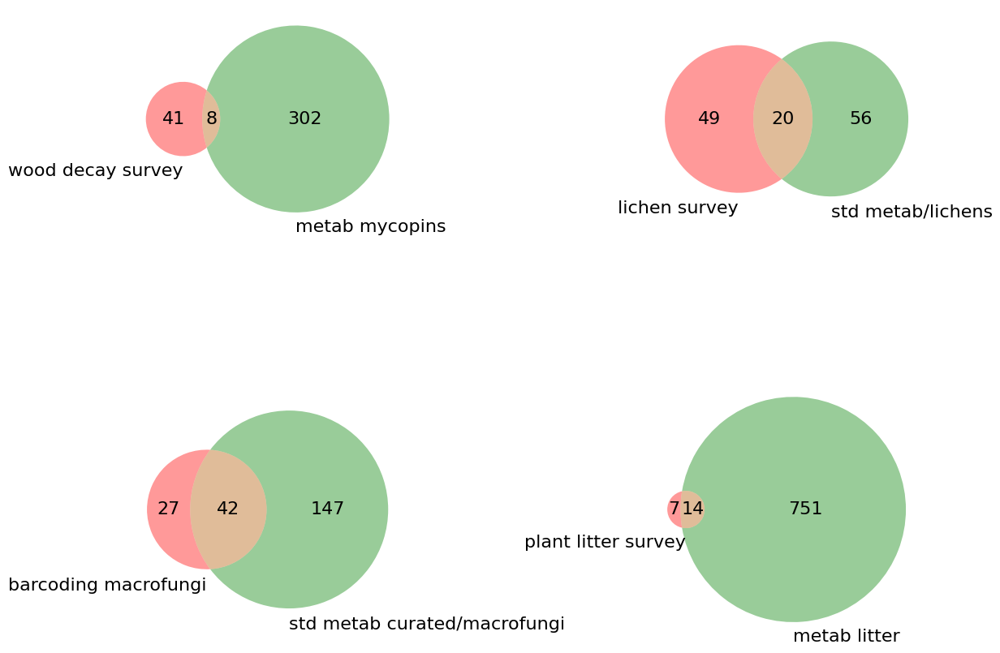

In [38]:
# Визуализация сходства списков в диаграммах Венна
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Создаем фигуру с 4 субплoтами (2x2)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('', fontsize=16)

# Список чеклистов для сравнения
checklist_pairs = [
    (('wood decay survey', 'metab mycopins'), axes[0, 0]),
    (('lichen survey', 'std metab/lichens'), axes[0, 1]),
    (('barcoding macrofungi', 'std metab curated/macrofungi'), axes[1, 0]),
    (('plant litter survey', 'metab litter'), axes[1, 1])
]

# Функция для создания диаграммы Венна
def plot_venn(pair, ax):
    set1 = set(allchecklists[allchecklists['checklist'] == pair[0]]['binom'])
    set2 = set(allchecklists[allchecklists['checklist'] == pair[1]]['binom'])
    v = venn2([set1, set2], set_labels=pair, ax=ax)

    # Устанавливаем размер шрифта для всех текстовых элементов
    for text in v.set_labels:
        if text is not None:
            text.set_fontsize(16)
    for text in v.subset_labels:
        if text is not None:
            text.set_fontsize(16)

    # Устанавливаем размер шрифта для заголовка
    #ax.set_title(f"{pair[0]} vs {pair[1]}", fontsize=16)

# Строим все диаграммы
for (pair1, pair2), ax in checklist_pairs:
    plot_venn((pair1, pair2), ax)

plt.tight_layout()
plt.show()

## COMPARISON OF MACROFUNGI COMMUNITY BY DIFFERENT METHODS


In [39]:
file_path3 = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/Illumina_all_years/sharedmacrofamilies.csv' #список семейств, присутствующих в учетах

In [40]:
#превращаем исходное скачивание данных в таблицу площадок
sharedmacrofamilies = pd.read_csv(file_path3,\
                 sep=';',
                index_col=0)
sharedmacrofamilies = sharedmacrofamilies.reset_index()
sharedmacrofamilies


,family
0,Agaricaceae
1,Amanitaceae
2,Auriscalpiaceae
3,Boletaceae
4,Clavariaceae
5,Cortinariaceae
6,Crepidotaceae
7,Entolomataceae
8,Hydnangiaceae
9,Hygrophoraceae


In [41]:
# ЗАГРУЗКА ДАННЫХ УЧЕТОВ МАКРОМИЦЕТОВ НА ПЛОЩАДКАХ

file_path4 = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/Illumina_all_years/bogfun_taxon.csv' #таксономическая структура для учетов
file_path5 = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/Illumina_all_years/bogfun_event.csv' #учеты
file_path6 = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/Illumina_all_years/bogfun_occur.csv' #метаданные учетов

In [42]:
#превращаем исходное скачивание данных в таблицу
bogfun_taxon = pd.read_csv(file_path4,\
                 sep=',',
                index_col=0)
bogfun_taxon = bogfun_taxon.reset_index()

bogfun_taxon = bogfun_taxon.rename(columns={'species': 'binom'})

bogfun_taxon

,occurrenceId,verbatimScientificName,scientificName,key,matchType,confidence,status,rank,kingdom,phylum,class,order,family,genus,binom,canonicalName,authorship,usageKey,acceptedUsageKey
0,BogFungi_0001,Cortinarius,"Cortinarius (Pers.) Gray, 1821",2524960,EXACT,92,DOUBTFUL,GENUS,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,NaN,Cortinarius,"(Pers.) Gray, 1821",2524960,NaN
1,BogFungi_0002,Cortinarius,"Cortinarius (Pers.) Gray, 1821",2524960,EXACT,92,DOUBTFUL,GENUS,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,NaN,Cortinarius,"(Pers.) Gray, 1821",2524960,NaN
2,BogFungi_0003,Galerina atkinsoniana,Galerina atkinsoniana A.H.Sm.,2533879,EXACT,97,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Galerina,Galerina atkinsoniana,Galerina atkinsoniana,A.H.Sm.,2533879,NaN
3,BogFungi_0004,Mycena epipterygia,Mycena epipterygia (Scop.) Gray,4911751,EXACT,99,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Mycena,Mycena epipterygia,Mycena epipterygia,(Scop.) Gray,4911751,NaN
4,BogFungi_0005,Collybia cirrhata,Collybia cirrhata (Schumach.) Quél.,2532440,EXACT,97,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Tricholomataceae,Collybia,Collybia cirrhata,Collybia cirrhata,(Schumach.) Quél.,2532440,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9871,BogFungi_9920,Cortinarius sphagnoravus,"Cortinarius sphagnoravus Liimat., Kytöv., Nisk...",9693059,EXACT,99,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius sphagnoravus,Cortinarius sphagnoravus,"Liimat., Kytöv., Niskanen & Ammirati",9693059,NaN
9872,BogFungi_9921,Cortinarius semisanguineus/cruentiphyllus,Cortinarius semisanguineus (Fr.) Gillet,2529327,EXACT,97,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius semisanguineus,Cortinarius semisanguineus,(Fr.) Gillet,2529327,NaN
9873,BogFungi_9922,Cortinarius biformis,Cortinarius biformis Fr.,2528973,EXACT,99,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius biformis,Cortinarius biformis,Fr.,2528973,NaN
9874,BogFungi_9923,Cortinarius aurantiobasis/cinnamomeus/davemall...,Cortinarius aurantiobasis Ammirati & A.H.Sm.,3351066,EXACT,99,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius aurantiobasis,Cortinarius aurantiobasis,Ammirati & A.H.Sm.,3351066,NaN


In [43]:
# ПРИВОДИМ СПИСОК К СЕМЕЙСТВАМ В SHAREDMACROFAMILIES
bogfun_taxon = bogfun_taxon[bogfun_taxon['family'].isin(sharedmacrofamilies['family'])]
bogfun_taxon

,occurrenceId,verbatimScientificName,scientificName,key,matchType,confidence,status,rank,kingdom,phylum,class,order,family,genus,binom,canonicalName,authorship,usageKey,acceptedUsageKey
0,BogFungi_0001,Cortinarius,"Cortinarius (Pers.) Gray, 1821",2524960,EXACT,92,DOUBTFUL,GENUS,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,NaN,Cortinarius,"(Pers.) Gray, 1821",2524960,NaN
1,BogFungi_0002,Cortinarius,"Cortinarius (Pers.) Gray, 1821",2524960,EXACT,92,DOUBTFUL,GENUS,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,NaN,Cortinarius,"(Pers.) Gray, 1821",2524960,NaN
2,BogFungi_0003,Galerina atkinsoniana,Galerina atkinsoniana A.H.Sm.,2533879,EXACT,97,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Galerina,Galerina atkinsoniana,Galerina atkinsoniana,A.H.Sm.,2533879,NaN
3,BogFungi_0004,Mycena epipterygia,Mycena epipterygia (Scop.) Gray,4911751,EXACT,99,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Mycena,Mycena epipterygia,Mycena epipterygia,(Scop.) Gray,4911751,NaN
4,BogFungi_0005,Collybia cirrhata,Collybia cirrhata (Schumach.) Quél.,2532440,EXACT,97,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Tricholomataceae,Collybia,Collybia cirrhata,Collybia cirrhata,(Schumach.) Quél.,2532440,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9871,BogFungi_9920,Cortinarius sphagnoravus,"Cortinarius sphagnoravus Liimat., Kytöv., Nisk...",9693059,EXACT,99,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius sphagnoravus,Cortinarius sphagnoravus,"Liimat., Kytöv., Niskanen & Ammirati",9693059,NaN
9872,BogFungi_9921,Cortinarius semisanguineus/cruentiphyllus,Cortinarius semisanguineus (Fr.) Gillet,2529327,EXACT,97,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius semisanguineus,Cortinarius semisanguineus,(Fr.) Gillet,2529327,NaN
9873,BogFungi_9922,Cortinarius biformis,Cortinarius biformis Fr.,2528973,EXACT,99,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius biformis,Cortinarius biformis,Fr.,2528973,NaN
9874,BogFungi_9923,Cortinarius aurantiobasis/cinnamomeus/davemall...,Cortinarius aurantiobasis Ammirati & A.H.Sm.,3351066,EXACT,99,ACCEPTED,SPECIES,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius aurantiobasis,Cortinarius aurantiobasis,Ammirati & A.H.Sm.,3351066,NaN


In [44]:
#превращаем исходное скачивание данных в таблицу площадок
bogfun_event= pd.read_csv(file_path5,\
                 sep=',',
                index_col=0)
bogfun_event = bogfun_event.reset_index()
bogfun_event

,eventID,parentEventID,habitat,decimalLatitude,decimalLongitude,minimumElevationInMeters,samplingProtocol,sampleSizeValue,sampleSizeUnit,eventDate,country,countryCode,stateProvince,municipality,locality,geodeticDatum,coordinateUncertaintyInMeters,coordinatePrecision
0,BogFungi_Plot_001_001,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",60.89106,68.68896,37,Plot-based fruitbodies count,5,square metre,2014-06-14,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001
1,BogFungi_Plot_002_001,BogFungi_Plot_002,"Raised bog community with Pinus sylvestris, dw...",60.89108,68.68885,37,Plot-based fruitbodies count,5,square metre,2014-06-14,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001
2,BogFungi_Plot_003_001,BogFungi_Plot_003,"Raised bog community with Pinus sylvestris, dw...",60.89109,68.68879,37,Plot-based fruitbodies count,5,square metre,2014-06-14,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001
3,BogFungi_Plot_004_001,BogFungi_Plot_004,"Raised bog community with Pinus sylvestris, dw...",60.89108,68.68879,36,Plot-based fruitbodies count,5,square metre,2014-06-14,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001
4,BogFungi_Plot_005_001,BogFungi_Plot_005,"Raised bog community with Pinus sylvestris, dw...",60.89107,68.68877,37,Plot-based fruitbodies count,5,square metre,2014-06-14,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28880,BogFungi_Plot_263_109,BogFungi_Plot_263,"Raised bog community with Pinus sylvestris, dw...",60.89147,68.67651,31,Plot-based fruitbodies count,5,square metre,2024-09-11,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001
28881,BogFungi_Plot_264_109,BogFungi_Plot_264,"Raised bog community with Pinus sylvestris, dw...",60.89145,68.67644,31,Plot-based fruitbodies count,5,square metre,2024-09-11,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001
28882,BogFungi_Plot_265_109,BogFungi_Plot_265,"Raised bog community with Pinus sylvestris, dw...",60.89148,68.67658,31,Plot-based fruitbodies count,5,square metre,2024-09-11,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001
28883,BogFungi_Plot_266_109,BogFungi_Plot_266,"Raised bog community with Pinus sylvestris, dw...",60.89143,68.67667,30,Plot-based fruitbodies count,5,square metre,2024-09-11,Russia,RU,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,Khanty-Mansiysk,Mukhrino Field Station of Yugra State Universi...,WGS84,3,0.00001


In [45]:
#превращаем исходное скачивание данных в таблицу находок
bogfun_occur= pd.read_csv(file_path6,\
                 sep=',',
                index_col=0)
bogfun_occur = bogfun_occur.reset_index()

bogfun_occur = bogfun_occur.rename(
    columns={'species' : 'verbatimScientificName'}
)

bogfun_occur

,basisOfRecord,occurrenceID,eventID,chrono,plot,verbatimScientificName,count,organismQuantityType,kingdom
0,HumanObservation,BogFungi_0001,BogFungi_Plot_001_024,24,1,Cortinarius,1.0,number of fruitbodies,Fungi
1,HumanObservation,BogFungi_0002,BogFungi_Plot_001_023,23,1,Cortinarius,1.0,number of fruitbodies,Fungi
2,HumanObservation,BogFungi_0003,BogFungi_Plot_001_009,9,1,Galerina atkinsoniana,1.0,number of fruitbodies,Fungi
3,HumanObservation,BogFungi_0004,BogFungi_Plot_001_009,9,1,Mycena epipterygia,3.0,number of fruitbodies,Fungi
4,HumanObservation,BogFungi_0005,BogFungi_Plot_001_010,10,1,Collybia cirrhata,3.0,number of fruitbodies,Fungi
...,...,...,...,...,...,...,...,...,...
9871,HumanObservation,BogFungi_9920,BogFungi_Plot_172_109,109,172,Cortinarius sphagnoravus,1.0,number of fruitbodies,Fungi
9872,HumanObservation,BogFungi_9921,BogFungi_Plot_172_109,109,172,Cortinarius semisanguineus/cruentiphyllus,3.0,number of fruitbodies,Fungi
9873,HumanObservation,BogFungi_9922,BogFungi_Plot_172_109,109,172,Cortinarius biformis,5.0,number of fruitbodies,Fungi
9874,HumanObservation,BogFungi_9923,BogFungi_Plot_172_109,109,172,Cortinarius aurantiobasis/cinnamomeus/davemall...,4.0,number of fruitbodies,Fungi


In [46]:
# объединяем учеты с метаданными
bogfun_full = pd.merge(
    bogfun_event,
    bogfun_occur,
    on='eventID',         # Ключевое поле для объединения
    how='outer',      # Полное внешнее соединение (сохранит все записи)
)

bogfun_full


,eventID,parentEventID,habitat,decimalLatitude,decimalLongitude,minimumElevationInMeters,samplingProtocol,sampleSizeValue,sampleSizeUnit,eventDate,...,coordinateUncertaintyInMeters,coordinatePrecision,basisOfRecord,occurrenceID,chrono,plot,verbatimScientificName,count,organismQuantityType,kingdom
0,BogFungi_Plot_001_001,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",60.89106,68.68896,37,Plot-based fruitbodies count,5,square metre,2014-06-14,...,3,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BogFungi_Plot_001_002,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",60.89106,68.68896,37,Plot-based fruitbodies count,5,square metre,2014-06-21,...,3,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BogFungi_Plot_001_003,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",60.89106,68.68896,37,Plot-based fruitbodies count,5,square metre,2014-06-28,...,3,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BogFungi_Plot_001_004,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",60.89106,68.68896,37,Plot-based fruitbodies count,5,square metre,2014-07-05,...,3,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BogFungi_Plot_001_005,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",60.89106,68.68896,37,Plot-based fruitbodies count,5,square metre,2014-07-12,...,3,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32819,BogFungi_Plot_267_105,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",60.89142,68.67670,31,Plot-based fruitbodies count,5,square metre,2024-07-24,...,3,0.00001,HumanObservation,BogFungi_9164,105.0,267.0,Arrhenia bigelowii,3.0,number of fruitbodies,Fungi
32820,BogFungi_Plot_267_106,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",60.89142,68.67670,31,Plot-based fruitbodies count,5,square metre,2024-08-06,...,3,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32821,BogFungi_Plot_267_107,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",60.89142,68.67670,31,Plot-based fruitbodies count,5,square metre,2024-08-19,...,3,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32822,BogFungi_Plot_267_108,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",60.89142,68.67670,31,Plot-based fruitbodies count,5,square metre,2024-09-03,...,3,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
# Создаем сводную таблицу с сохранением habitat
bogfun_full = (
    bogfun_full
    .groupby(['parentEventID', 'habitat', 'verbatimScientificName'])['count']
    .sum()
    .reset_index()
)
bogfun_full


,parentEventID,habitat,verbatimScientificName,count
0,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Amanita porphyria,2.0
1,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Collybia cirrhata,3.0
2,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Cortinarius,5.0
3,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Cortinarius lindstroemii,1.0
4,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Cortinarius semisanguineus/cruentiphyllus,6.0
...,...,...,...,...
2674,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",Galerina allospora/sp/sp2,2.0
2675,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",Galerina sphagnicola,5.0
2676,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",Galerina sphagnorum,1.0
2677,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",Galerina tibiicystis,1.0


In [48]:
# Убедимся, что в bogfun_taxonomy нет дубликатов по ключевому полю
bogfun_taxon_unique = bogfun_taxon.drop_duplicates(
    subset=['verbatimScientificName'],
    keep='first'  # или 'last' - в зависимости от логики данных
)

In [49]:
# Выполняем LEFT JOIN (сохраняем ВСЕ строки из bogfun_full)
bogfuntaxon = pd.merge(
    bogfun_full,
    bogfun_taxon_unique,
    on='verbatimScientificName',
    how='left',  # Важно: left, а не inner!
    suffixes=('', '_tax')  # Добавляем суффикс к конфликтующим столбцам
)

bogfuntaxon

,parentEventID,habitat,verbatimScientificName,count,occurrenceId,scientificName,key,matchType,confidence,status,...,phylum,class,order,family,genus,binom,canonicalName,authorship,usageKey,acceptedUsageKey
0,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Amanita porphyria,2.0,BogFungi_0194,Amanita porphyria Alb. & Schwein.,5240279.0,EXACT,97.0,ACCEPTED,...,Basidiomycota,Agaricomycetes,Agaricales,Amanitaceae,Amanita,Amanita porphyria,Amanita porphyria,Alb. & Schwein.,5240279.0,NaN
1,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Collybia cirrhata,3.0,BogFungi_0005,Collybia cirrhata (Schumach.) Quél.,2532440.0,EXACT,97.0,ACCEPTED,...,Basidiomycota,Agaricomycetes,Agaricales,Tricholomataceae,Collybia,Collybia cirrhata,Collybia cirrhata,(Schumach.) Quél.,2532440.0,NaN
2,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Cortinarius,5.0,BogFungi_0001,"Cortinarius (Pers.) Gray, 1821",2524960.0,EXACT,92.0,DOUBTFUL,...,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,NaN,Cortinarius,"(Pers.) Gray, 1821",2524960.0,NaN
3,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Cortinarius lindstroemii,1.0,BogFungi_0015,"Cortinarius lindstroemii Niskanen, Kytov. & Li...",11884086.0,EXACT,99.0,ACCEPTED,...,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius lindstroemii,Cortinarius lindstroemii,"Niskanen, Kytov. & Liimat.",11884086.0,NaN
4,BogFungi_Plot_001,"Raised bog community with Pinus sylvestris, dw...",Cortinarius semisanguineus/cruentiphyllus,6.0,BogFungi_0007,Cortinarius semisanguineus (Fr.) Gillet,2529327.0,EXACT,97.0,ACCEPTED,...,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius semisanguineus,Cortinarius semisanguineus,(Fr.) Gillet,2529327.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2674,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",Galerina allospora/sp/sp2,2.0,BogFungi_0008,Galerina allospora A.H.Sm. & Singer,2533906.0,EXACT,99.0,ACCEPTED,...,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Galerina,Galerina allospora,Galerina allospora,A.H.Sm. & Singer,2533906.0,NaN
2675,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",Galerina sphagnicola,5.0,BogFungi_0067,Galerina sphagnicola (G.F.Atk.) A.H.Sm. & Singer,3342671.0,EXACT,99.0,ACCEPTED,...,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Galerina,Galerina sphagnicola,Galerina sphagnicola,(G.F.Atk.) A.H.Sm. & Singer,3342671.0,NaN
2676,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",Galerina sphagnorum,1.0,BogFungi_8331,Galerina sphagnorum (Pers.) Kühner,9067519.0,EXACT,99.0,ACCEPTED,...,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Galerina,Galerina sphagnorum,Galerina sphagnorum,(Pers.) Kühner,9067519.0,NaN
2677,BogFungi_Plot_267,"Raised bog community with Pinus sylvestris, dw...",Galerina tibiicystis,1.0,BogFungi_0162,Galerina tibiicystis (G.F.Atk.) Kühner,2533865.0,EXACT,99.0,ACCEPTED,...,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Galerina,Galerina tibiicystis,Galerina tibiicystis,(G.F.Atk.) Kühner,2533865.0,NaN


In [50]:
# создание сводной для учетов макромицетов

# Создаем сводную таблицу с суммой count для каждого вида
pivot_bogfun = bogfuntaxon.groupby('binom')['count'].sum().reset_index()

# Нормализация к максимуму
pivot_bogfun['count_normalized_max'] = pivot_bogfun['count'] / pivot_bogfun['count'].max()


# Преобразуем 'count' в числовой формат (если это не float/int)
pivot_bogfun['count']  = pd.to_numeric(pivot_bogfun['count'], errors='coerce')

# 2. Удаляем строки с NaN (если они есть)
pivot_bogfun = pivot_bogfun.dropna(subset=['count'])

# 3. Нормализуем к сумме = 1
pivot_bogfun['count_normalized'] = pivot_bogfun['count'] / pivot_bogfun['count'].sum()

# Проверяем сумму (должна быть ~1.0)
print("Сумма нормализованных значений:", pivot_bogfun['count_normalized'].sum())

pivot_bogfun

Сумма нормализованных значений: 1.0


,binom,count,count_normalized_max,count_normalized
0,Amanita porphyria,4.0,0.000986,0.000162
1,Arrhenia bigelowii,290.0,0.071517,0.011777
2,Arrhenia gerardiana,414.0,0.102096,0.016813
3,Auriscalpium vulgare,1.0,0.000247,0.000041
4,Bogbodia uda,1731.0,0.426880,0.070297
...,...,...,...,...
67,Thaxterogaster scaurus,27.0,0.006658,0.001096
68,Thaxterogaster vibratilis,5.0,0.001233,0.000203
69,Thelephora terrestris,15.0,0.003699,0.000609
70,Tubaria furfuracea,2.0,0.000493,0.000081


In [51]:
# фильтруем только семейства макромицетов из таблицы метабаркодинга

datamacro = data[data['Family Sklearn'].isin(sharedmacrofamilies['family'])]
datamacro


,ID,Year,SampleName,Count,Kingdom Sklearn,Phylum Sklearn,Class Sklearn,Order Sklearn,Family Sklearn,Genus Sklearn,...,Phylum Blast,Class Blast,Order Blast,Family Blast,Genus Blast,Species Blast,% identity,evalue,Sequence,SampleID
6,0507e6f77304117e08bfb29870140b0fc8570b86,2022,1,55.0,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Naucoria,...,Basidiomycota,Agaricomycetes,Agaricales,Hymenogastraceae,Naucoria,Naucoria_tantilla,99.652,1.680000e-148,GTGAATCATCGAATCTTTGAACGCACCTTGCGCTCCTTGGTATTCC...,1
10,8652bde75977e6fd61cb88efdb2c1f99b6780ba5,2022,1,41.0,Fungi,Basidiomycota,Agaricomycetes,Russulales,Auriscalpiaceae,Lentinellus,...,Basidiomycota,Agaricomycetes,Russulales,Auriscalpiaceae,Lentinellus,Lentinellus_micheneri,98.601,2.170000e-142,GTGAATCATCGAATCTTTGAACGCACCTTGCACCCCTTGGTATTCC...,1
14,0e956253472188c3a20f45141865e1f5358eb23d,2022,1,10.0,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,...,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius_rusticus,99.231,2.630000e-131,GTGAATCATCGAATCTTTGAACGCACCTTGCGCTCCTTGGTATTCC...,1
32,6505b4e85f53a59040be358a65447fa7255671d2,2022,1,1.0,Fungi,Basidiomycota,Agaricomycetes,Russulales,Russulaceae,Lactarius,...,Basidiomycota,Agaricomycetes,Russulales,Russulaceae,Lactarius,Lactarius_pubescens,98.780,3.090000e-166,GTGAATCATCGAATCTTTGAACGCACCTTGCGCCCCTTGGTATTCC...,1
44,e4ef10fbc9f8f81eee14afea64a5cfad49f4b8ed,2022,1,1.0,Fungi,Basidiomycota,Agaricomycetes,Russulales,Auriscalpiaceae,Lentinellus,...,Basidiomycota,Agaricomycetes,Russulales,Auriscalpiaceae,Lentinellus,Lentinellus_micheneri,98.239,1.310000e-139,GTGGAATCATCGAATCTTTGAACGCACCTTGCACCCCTTGTTATTC...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219059,d1763edf7ad4b923bb8fbf35d3a80836b2c0179e,2024,189,1.0,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Mycena,...,Basidiomycota,Agaricomycetes,Agaricales,Mycenaceae,Mycena,Mycena_epipterygia,99.310,1.700000e-148,GTGAATCATCGAATCTTTGAACGCACCTTGCGCCCTTTGGTATTCC...,779
219063,d2a21aff41d2bdcaa839c0f854a5ee063d7328fc,2024,189,1.0,Fungi,Basidiomycota,Agaricomycetes,Thelephorales,Thelephoraceae,Thelephoraceae_gen_Incertae_sedis,...,Basidiomycota,Agaricomycetes,Thelephorales,Thelephoraceae,Thelephoraceae_gen_Incertae_sedis,Thelephoraceae_sp,98.299,1.040000e-145,GTGAGTCATCGAATCTTTGAACACACCTTGCGCCCTTTGGATCTTC...,779
219086,d6e08e0b1c86e973e53709199e02db352e12f256,2024,189,2.0,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,...,Basidiomycota,Agaricomycetes,Agaricales,Cortinariaceae,Cortinarius,Cortinarius_acutovelatus,99.293,1.300000e-144,GTGAGTCATCGAATCTTTGAACGCATCTTGCGCTCCTTGGTATTCC...,779
219102,dba9801c5588b96a330d39c5504fdd71f438e01c,2024,189,1.0,Fungi,Basidiomycota,Agaricomycetes,Russulales,Russulaceae,Russula,...,Basidiomycota,Agaricomycetes,Russulales,Russulaceae,Russula,Russula_versicolor,98.214,8.480000e-167,GTGAATCATCGAATCTTTGAACGCACCTTTCGCCCCTTGGCATTCC...,779


In [52]:
# добавляем к таблице datamacro поле binom из таблицы курируемых OTU
datamacro = pd.merge(
    datamacro,
    idcurated[['ID', 'binom']],  # выбираем только нужные колонки
    on='ID',
    how='left'  # или 'inner' в зависимости от нужного типа соединения
)

# Показать результат
print(datamacro.head())
datamacro.to_csv ('datamacro.csv', index=False, encoding='utf-8')

                                         ID  Year  SampleName  Count  \
0  0507e6f77304117e08bfb29870140b0fc8570b86  2022           1   55.0   
1  8652bde75977e6fd61cb88efdb2c1f99b6780ba5  2022           1   41.0   
2  0e956253472188c3a20f45141865e1f5358eb23d  2022           1   10.0   
3  6505b4e85f53a59040be358a65447fa7255671d2  2022           1    1.0   
4  e4ef10fbc9f8f81eee14afea64a5cfad49f4b8ed  2022           1    1.0   

  Kingdom Sklearn Phylum Sklearn   Class Sklearn Order Sklearn  \
0           Fungi  Basidiomycota  Agaricomycetes    Agaricales   
1           Fungi  Basidiomycota  Agaricomycetes    Russulales   
2           Fungi  Basidiomycota  Agaricomycetes    Agaricales   
3           Fungi  Basidiomycota  Agaricomycetes    Russulales   
4           Fungi  Basidiomycota  Agaricomycetes    Russulales   

     Family Sklearn Genus Sklearn  ...     Class Blast  Order Blast  \
0  Hymenogastraceae      Naucoria  ...  Agaricomycetes   Agaricales   
1   Auriscalpiaceae   Lentin

In [55]:
# создание сводной для otu

# Создаем сводную таблицу с суммой count для каждого вида
pivot_bogotu = datamacro.groupby('binom')['Count'].sum().reset_index()

# Нормализация к максимуму
pivot_bogotu['count_normalized_max'] = pivot_bogotu['Count'] / pivot_bogotu['Count'].max()


# Преобразуем 'count' в числовой формат (если это не float/int)
pivot_bogotu['Count']  = pd.to_numeric(pivot_bogotu['Count'], errors='coerce')

# 2. Удаляем строки с NaN (если они есть)
pivot_bogotu = pivot_bogotu.dropna(subset=['Count'])

# 3. Нормализуем к сумме = 1
pivot_bogotu['count_normalized'] = pivot_bogotu['Count'] / pivot_bogotu['Count'].sum()

# Проверяем сумму (должна быть ~1.0)
print("Сумма нормализованных значений:", pivot_bogotu['count_normalized'].sum())

pivot_bogotu
pivot_bogotu.to_csv('pivot_bogotu.csv')

Сумма нормализованных значений: 0.9999999999999999


In [56]:
# ОТБОР ДОМИНАНТНЫХ ВИДОВ (СУММА ОБИЛИЯ СОСТАВЛЯЕТ 95%)

def get_dominant_species(pivot_table, coverage=0.95):
    # Сортируем по убыванию обилия
    pivot_sorted = pivot_table.sort_values('count_normalized', ascending=False)

    # Кумулятивная сумма (накопленный вклад)
    pivot_sorted['cumulative_sum'] = pivot_sorted['count_normalized'].cumsum()

    # Выбираем виды, пока не достигнем 90%
    dominant_species = pivot_sorted[pivot_sorted['cumulative_sum'] <= coverage]

    return dominant_species

# Применяем функцию к обеим таблицам
dominant_bogfun = get_dominant_species(pivot_bogfun)
dominant_otudata = get_dominant_species(pivot_bogotu)

dominant_bogfun


,binom,count,count_normalized_max,count_normalized,cumulative_sum
33,Galerina sphagnicola,4055.0,1.000000,0.164677,0.164677
9,Cortinarius aurantiobasis,3503.0,0.863872,0.142260,0.306936
60,Sphagnurus paluster,3200.0,0.789149,0.129955,0.436891
26,Galerina allospora,1807.0,0.445623,0.073384,0.510275
4,Bogbodia uda,1731.0,0.426880,0.070297,0.580572
8,Cortinarius armeniacus,1384.0,0.341307,0.056205,0.636777
35,Galerina tibiicystis,897.0,0.221208,0.036428,0.673205
28,Galerina calyptrata,818.0,0.201726,0.033220,0.706425
37,Gymnopus androsaceus,743.0,0.183231,0.030174,0.736598
40,Hebeloma incarnatulum,672.0,0.165721,0.027290,0.763889


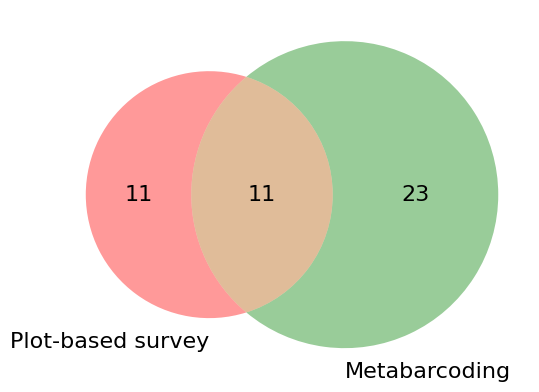

In [57]:
# Диаграмма Венна
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Получаем множества видов
set_bogfun = set(dominant_bogfun['binom']) # Создаём множество уникальных видов из таблицы dominant_bogfun
set_otudata = set(dominant_otudata['binom']) # Создаём множество уникальных видов из таблицы dominant_otudata

# Рисуем диаграмму Венна с новыми названиями
venn2([set_bogfun, set_otudata],
      ('Plot-based survey', 'Metabarcoding'))  # Изменённые названия групп

# Настройка заголовка (оставлен пустым по вашему примеру)
plt.title("")

# Увеличиваем шрифт подписей
plt.rcParams['font.size'] = 16
for text in plt.gca().texts:
    text.set_fontsize(16)

plt.show()

In [58]:
# Коэффициэнт Жаккара
jaccard = len(set_bogfun & set_otudata) / len(set_bogfun | set_otudata)
print(f"Коэффициент Жаккара (сходство списков): {jaccard:.2f}")

Коэффициент Жаккара (сходство списков): 0.24


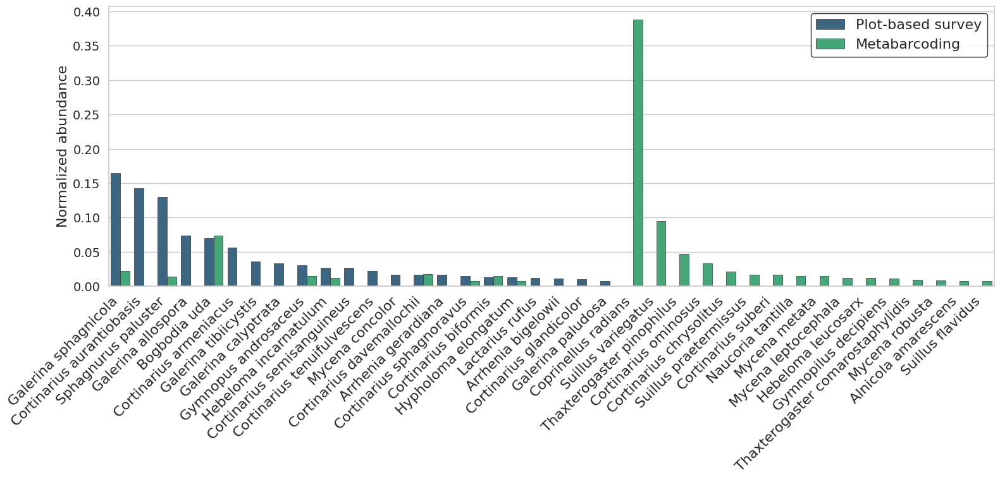

In [59]:
# Объединяем данные для сравнения

import seaborn as sns
import matplotlib.pyplot as plt

# Объединяем данные для сравнения
top_bogfun = dominant_bogfun.head(25).copy()
top_bogfun['method'] = 'Plot-based survey'  # Измененное название
top_otudata = dominant_otudata.head(25).copy()
top_otudata['method'] = 'Metabarcoding'    # Измененное название

combined = pd.concat([top_bogfun, top_otudata])

# Настройка стиля и размера шрифтов
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 12})

# Строим график с палитрой viridis
plt.figure(figsize=(16, 8))
ax = sns.barplot(
    data=combined,
    x='binom',
    y='count_normalized',
    hue='method',
    palette="viridis",  # Используем палитру viridis
    edgecolor=".2",     # Границы столбцов
    linewidth=.5        # Толщина границ
)

# Настройка осей и подписей
plt.xticks(rotation=45, ha='right', fontsize=16)
plt.yticks(fontsize=14)
plt.title("", fontsize=14, pad=20)
plt.xlabel("Вид", fontsize=12)
plt.ylabel("Normalized abundance", fontsize=16)

# Настройка легенды
plt.legend(
    title='',
    title_fontsize=16,
    fontsize=16,
    frameon=True,
    framealpha=0.8,
    edgecolor='black'
)

# Улучшаем компоновку
plt.tight_layout()
plt.xlabel('')
plt.show()

In [60]:
# Экспорт доминанов по методам в таблицу csv
import pandas as pd
from itertools import zip_longest

# Convert sets to lists
only_bogfun = list(set_bogfun - set_otudata)
only_otudata = list(set_otudata - set_bogfun)
common_species = list(set_bogfun & set_otudata)

# Pad shorter lists with empty strings to match the longest list
max_len = max(len(only_bogfun), len(only_otudata), len(common_species))
padded_data = {
    'Only in BogFun': only_bogfun + [''] * (max_len - len(only_bogfun)),
    'Only in OtuData': only_otudata + [''] * (max_len - len(only_otudata)),
    'Common species': common_species + [''] * (max_len - len(common_species))
}

# Create DataFrame
comparison = pd.DataFrame(padded_data)
print(comparison)

comparison.to_csv = 'comparison_dominant_species.csv'

                Only in BogFun                   Only in OtuData  \
0   Cortinarius semisanguineus           Lichenomphalia velutina   
1    Cortinarius aurantiobasis  Thaxterogaster comarostaphylidis   
2              Lactarius rufus                Lepiota magnispora   
3            Galerina paludosa                Cortinarius suberi   
4          Galerina calyptrata             Suillus praetermissus   
5           Galerina allospora                   Suillus bovinus   
6      Cortinarius glandicolor                     Mycena metata   
7          Arrhenia gerardiana                 Naucoria tantilla   
8         Galerina tibiicystis               Alnicola amarescens   
9           Arrhenia bigelowii              Tubaria romagnesiana   
10             Mycena concolor               Mycena leptocephala   
11                                    Cortinarius neofurvolaesus   
12                                          Cortinarius ominosus   
13                                          Gymn

# COMMUNITY ANALYSIS, ALPHA AND BETA DIVERSITY USING METABARCODING DATA


## ORDINATION AND PERMANOVA ANALYSES

### PCoA and PERMANOVA analysis for all substrates together (parameter - substrate)


In [61]:
# Приводим все к строковому типу и удаляем лишние пробелы
normalized_data.columns = normalized_data.columns.astype(str).str.strip()
data.columns = data.columns.astype(str).str.strip()
metadata['SampleID'] = metadata['SampleID'].astype(str).str.strip()

normalized_data_no_rare.columns = normalized_data_no_rare.columns.astype(str).str.strip()
data_no_rare.columns = data_no_rare.columns.astype(str).str.strip()

/tmp/ipython-input-2821290649.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata['SampleID'] = metadata['SampleID'].astype(str).str.strip()


Вычисление матрицы расстояний...
Выполнение PCoA...
Подготовка данных...


/usr/local/lib/python3.12/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.3156573913363638 whereas the largest positive one is 16.07596293799062.
  warn(
/tmp/ipython-input-719247741.py:99: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=16)
/tmp/ipython-input-719247741.py:100: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel

Визуализация завершена!


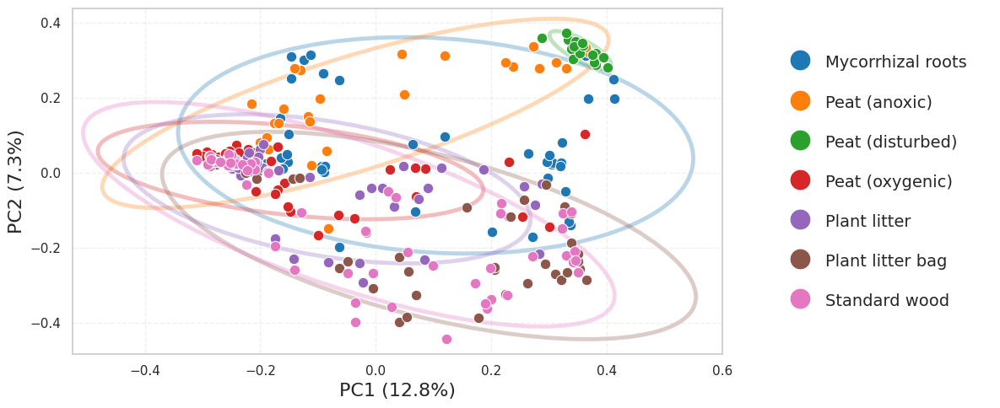

In [62]:
# Ординация по субстратам для всех проб

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
from skbio.stats.distance import DistanceMatrix  # Добавьте этот импорт

# Загрузка данных
# normalized_data - DataFrame с нормализованными OTU (столбцы - пробы, строки - OTU)
# metadata - DataFrame с метаданными, включая колонку 'substrate'

# 1. Рассчитываем матрицу расстояний Брея-Кертиса
print("Вычисление матрицы расстояний...")
bc_dist_all = beta_diversity('braycurtis', normalized_data.T, ids=metadata['SampleID'])
bc_dist_matrix_all = DistanceMatrix(bc_dist_all.data, ids=bc_dist_all.ids)

# 2. Выполняем PCoA анализ
print("Выполнение PCoA...")
pcoa_results_all = pcoa(bc_dist_all)

# 3. Подготовка данных для визуализации
print("Подготовка данных...")
samples = pcoa_results_all.samples.copy()
samples['substrate'] = metadata['substrate'].values

# Словарь для переименования подписей
substrate_names = {
    'peatspill': 'Peat (disturbed)',
    'peatupper': 'Peat (oxygenic)',
    'peatstrat': 'Peat (anoxic)',
    'litter': 'Plant litter',
    'litter bag':'Plant litter bag',
    'bog plant fungi': 'Plant litter',
    'mycopins': 'Standard wood',
    'mycorrhiza': 'Mycorrhizal roots',

}

# Применяем переименование
samples['substrate'] = samples['substrate'].map(substrate_names)

# 4. Визуализация с эллипсами доверия
plt.figure(figsize=(12, 5))  # Увеличиваем размер фигуры
ax = plt.gca()

# Параметры стиля (увеличиваем размер шрифта в легенде)
palette = sns.color_palette("tab10", n_colors=7)
point_size = 80
legend_fontsize = 14
legend_markerscale = 2.0  # Увеличиваем размер маркеров в легенде

# Функция для рисования эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# Рисуем точки и эллипсы для каждой группы
for i, (substrate, group) in enumerate(samples.groupby('substrate')):
    # Точки
    sns.scatterplot(
        x='PC1',
        y='PC2',
        data=group,
        color=palette[i],
        label=substrate,
        s=point_size,
        ax=ax
    )
    # Эллипсы доверия
    confidence_ellipse(
        x=group['PC1'],
        y=group['PC2'],
        ax=ax,
        n_std=2,
        edgecolor=palette[i],
        linewidth=3.5,
        alpha=0.3,
        zorder=0
    )

# Настройка графиков
plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=16)
plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=16)
plt.title('', fontsize=16, pad=15)

# Оптимизированная легенда с:
# - Увеличенным размером
# - Расположением справа от графика
# - Горизонтальным расположением элементов
legend = plt.legend(
    loc='center left',          # Центрируем по вертикали
    bbox_to_anchor=(1.05, 0.5), # Смещаем вправо за пределы графика
    fontsize=legend_fontsize,
    markerscale=legend_markerscale,
    frameon=False,               # Рамка вокруг легенды
    ncol=1,                     # Один столбец для лучшей читаемости
    handlelength=1.5,           # Увеличиваем длину маркеров
    handleheight=1.5,           # Увеличиваем высоту маркеров
    borderpad=1.5,              # Отступ внутри рамки
    labelspacing=1.2            # Расстояние между элементами
)

# Добавляем больше места справа для легенды
plt.subplots_adjust(right=0.75)  # Освобождаем 25% пространства справа

plt.grid(linestyle='--', alpha=0.3)
plt.tight_layout()
print("Визуализация завершена!")
plt.show()

Вычисление матрицы расстояний...
Выполнение t-SNE...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Подготовка данных...
Визуализация завершена!


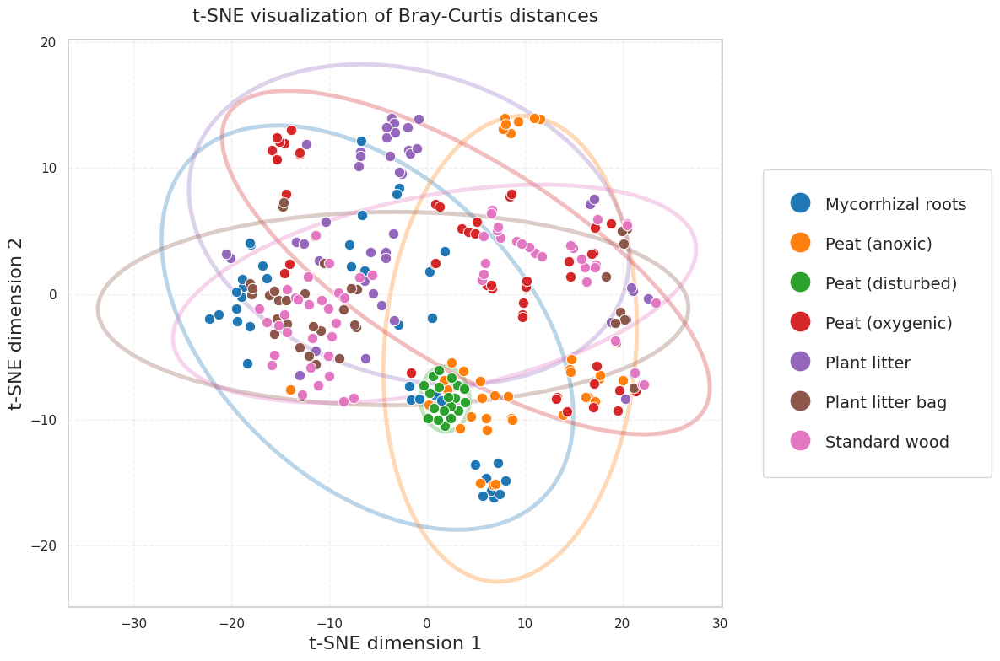

In [63]:
# То же самое метод T-SNE

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from sklearn.manifold import TSNE
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
from skbio.stats.distance import DistanceMatrix

# Загрузка данных
# normalized_data - DataFrame с нормализованными OTU (столбцы - пробы, строки - OTU)
# metadata - DataFrame с метаданными, включая колонку 'substrate'

# 1. Рассчитываем матрицу расстояний Брея-Кертиса
print("Вычисление матрицы расстояний...")
bc_dist_all = beta_diversity('braycurtis', normalized_data.T, ids=metadata['SampleID'])
bc_dist_matrix_all = DistanceMatrix(bc_dist_all.data, ids=bc_dist_all.ids)

# 2. Выполняем t-SNE анализ
print("Выполнение t-SNE...")
# Преобразуем матрицу расстояний в массив numpy
distance_matrix = bc_dist_all.data

# Инициализируем t-SNE с параметрами
tsne = TSNE(
    n_components=2,
    perplexity=30,          # Типичные значения между 5 и 50
    early_exaggeration=12,  # Стандартное значение
    learning_rate='auto',   # Автоматический подбор learning rate
    n_iter=1000,            # Количество итераций
    metric='precomputed',   # Используем предварительно вычисленную матрицу расстояний
    init='random',          # Инициализация случайными значениями
    random_state=42         # Для воспроизводимости
)

# Выполняем t-SNE преобразование
tsne_results = tsne.fit_transform(distance_matrix)

# 3. Подготовка данных для визуализации
print("Подготовка данных...")
samples = pd.DataFrame(tsne_results, columns=['tSNE1', 'tSNE2'])
samples['SampleID'] = bc_dist_all.ids
samples['substrate'] = metadata['substrate'].values

# Словарь для переименования подписей
substrate_names = {
    'peatspill': 'Peat (disturbed)',
    'peatupper': 'Peat (oxygenic)',
    'peatstrat': 'Peat (anoxic)',
    'litter': 'Plant litter',
    'litter bag':'Plant litter bag',
    'bog plant fungi': 'Plant litter',
    'mycopins': 'Standard wood',
    'mycorrhiza': 'Mycorrhizal roots',
}

# Применяем переименование
samples['substrate'] = samples['substrate'].map(substrate_names)

# 4. Визуализация с эллипсами доверия
plt.figure(figsize=(12, 8))  # Увеличиваем размер фигуры
ax = plt.gca()

# Параметры стиля (увеличиваем размер шрифта в легенде)
palette = sns.color_palette("tab10", n_colors=7)
point_size = 80
legend_fontsize = 14
legend_markerscale = 2.0  # Увеличиваем размер маркеров в легенде

# Функция для рисования эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# Рисуем точки и эллипсы для каждой группы
for i, (substrate, group) in enumerate(samples.groupby('substrate')):
    # Точки
    sns.scatterplot(
        x='tSNE1',
        y='tSNE2',
        data=group,
        color=palette[i],
        label=substrate,
        s=point_size,
        ax=ax
    )
    # Эллипсы доверия
    confidence_ellipse(
        x=group['tSNE1'],
        y=group['tSNE2'],
        ax=ax,
        n_std=2,
        edgecolor=palette[i],
        linewidth=3.5,
        alpha=0.3,
        zorder=0
    )

# Настройка графиков
plt.xlabel('t-SNE dimension 1', fontsize=16)
plt.ylabel('t-SNE dimension 2', fontsize=16)
plt.title('t-SNE visualization of Bray-Curtis distances', fontsize=16, pad=15)

# Оптимизированная легенда
legend = plt.legend(
    loc='center left',
    bbox_to_anchor=(1.05, 0.5),
    fontsize=legend_fontsize,
    markerscale=legend_markerscale,
    frameon=True,
    ncol=1,
    handlelength=1.5,
    handleheight=1.5,
    borderpad=1.5,
    labelspacing=1.2
)

# Добавляем больше места справа для легенды
plt.subplots_adjust(right=0.75)

plt.grid(linestyle='--', alpha=0.3)
plt.tight_layout()
print("Визуализация завершена!")
plt.show()

In [64]:
# Визуализация матрицы расстояний и столбчатая диаграмма, но тут потеряна часть кода с созданием переменных

def visualize_permanova_results(permanova_matrix, dissimilarity_df):
    """
    Финальная версия визуализации:
    - Только одна матрица PERMANOVA слева
    - Столбчатая диаграмма справа с обратным порядком
    - Без артефактов
    """
    # Задаем жесткий порядок (для диаграммы будет обратный)
    substrate_order = [
        'Plant litter',
        'Plant litter bag',
        'Standard wood',
        'Mycorrhizal roots',
        'Peat (disturbed)',
        'Peat (anoxic)',
        'Peat (oxygenic)'
    ]

    # Заданный порядок значимости (от большего к меньшему)
    significance_order = [
        'Mycorrhizal roots',
        'Peat (anoxic)',
        'Standard wood',
        'Peat (oxygenic)',
        'Plant litter',
        'Plant litter bag',
        'Peat (disturbed)'
    ]

    # Создаем фигуру
    fig = plt.figure(figsize=(20, 10))
    gs = GridSpec(1, 2, width_ratios=[1.2, 0.8], wspace=0.1)

    # --- 1. Матрица PERMANOVA (слева) ---
    ax1 = fig.add_subplot(gs[0])

    # Приводим матрицу к нужному порядку
    ordered_matrix = permanova_matrix.loc[substrate_order, substrate_order]

    # Создаем маски
    mask_upper = np.triu(np.ones_like(ordered_matrix, dtype=bool), k=1)
    mask_lower = np.tril(np.ones_like(ordered_matrix, dtype=bool), k=-1)

    # Верхний треугольник - F-значения
    sns.heatmap(
        ordered_matrix.where(mask_upper),
        annot=True, fmt=".1f", cmap="YlOrRd", cbar=False,
        mask=~mask_upper, square=True, annot_kws={"size": 12},
        vmin=0, ax=ax1
    )

    # Нижний треугольник - p-values
    sns.heatmap(
        ordered_matrix.where(mask_lower),
        annot=True, fmt=".3f", cmap=["#f0f0f0"], cbar=False,
        mask=~mask_lower, square=True, annot_kws={"size": 12, "color": "black"},
        vmin=0, vmax=1, ax=ax1
    )

    ax1.set_title('', pad=20, fontsize=14)
    ax1.tick_params(axis='x', rotation=45, labelsize=12)
    ax1.tick_params(axis='y', labelsize=12)

    # --- 2. Столбчатая диаграмма (справа, обратный порядок) ---
    ax2 = fig.add_subplot(gs[1])

    # Готовим данные в обратном порядке
    plot_data = dissimilarity_df.set_index('Substrate').loc[substrate_order[::-1]].reset_index()

    # Создаем цветовую палитру по значимости
    color_palette = sns.color_palette("YlOrRd", len(significance_order))
    color_mapping = {sub: color for sub, color in zip(significance_order, color_palette)}

    # Рисуем диаграмму
    colors=[color_mapping[sub] for sub in plot_data['Substrate']]
    bars = ax2.barh(plot_data['Substrate'], plot_data['Dissimilarity Score'], color=colors)

    # Добавляем подписи значений
    for bar in bars:
        width = bar.get_width()
        ax2.text(width + 0.5, bar.get_y() + bar.get_height()/2,
                f'{width:.1f}', va='center', ha='left', fontsize=12)

    # Настройки диаграммы
    ax2.set_title('', pad=20, fontsize=14)
    ax2.set_xlabel('Mean F-values', fontsize=12)
    ax2.grid(axis='x', linestyle='--', alpha=0.6)
    ax2.set_xlim(0, plot_data['Dissimilarity Score'].max() * 1.25)
    ax2.set_yticklabels([])  # ← Вот эта строка убирает подписи Y
    ax2.tick_params(axis='y', length=0)  # Дополнительно убираем черточки на оси Y

    plt.tight_layout()
    plt.show()

# Пример вызова (используйте свои данные):
visualize_permanova_results(permanova_results, dissimilarity_df)

NameError: name 'permanova_results' is not defined

### PCoA analysis by substrate pairs

Создана папка 'ordination_results' для сохранения графиков

Анализ пары: Plant litter vs Plant litter bag
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_vs_Plant_litter_bag.png


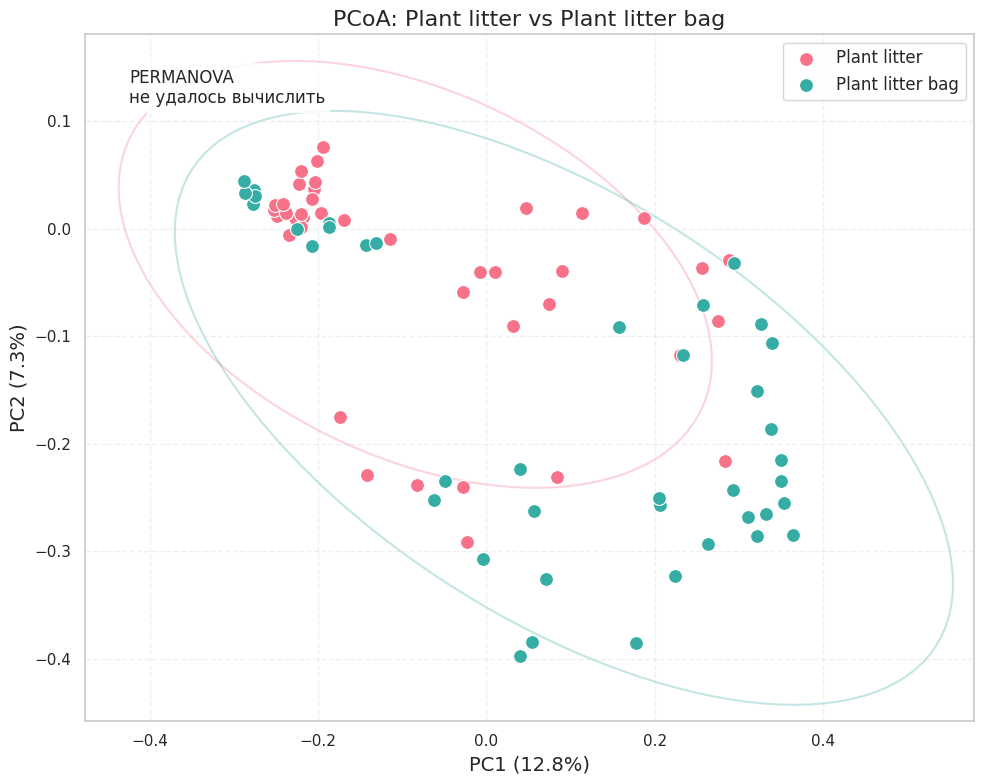


Анализ пары: Plant litter vs Standard wood
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_vs_Standard_wood.png


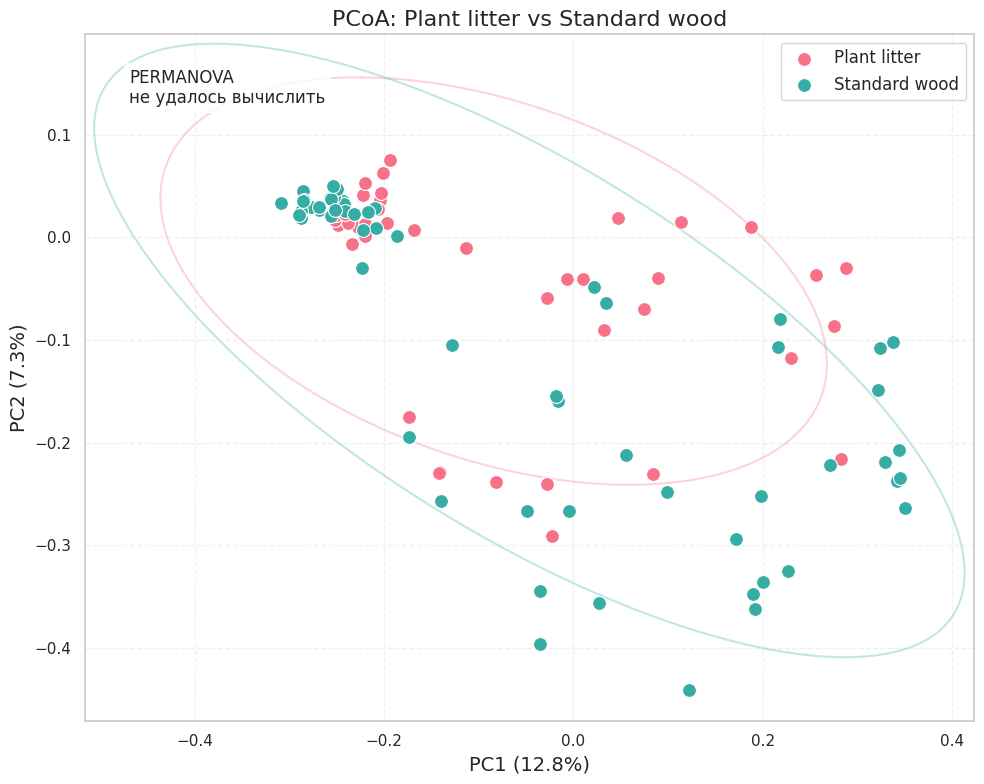


Анализ пары: Plant litter vs Mycorrhizal roots
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_vs_Mycorrhizal_roots.png


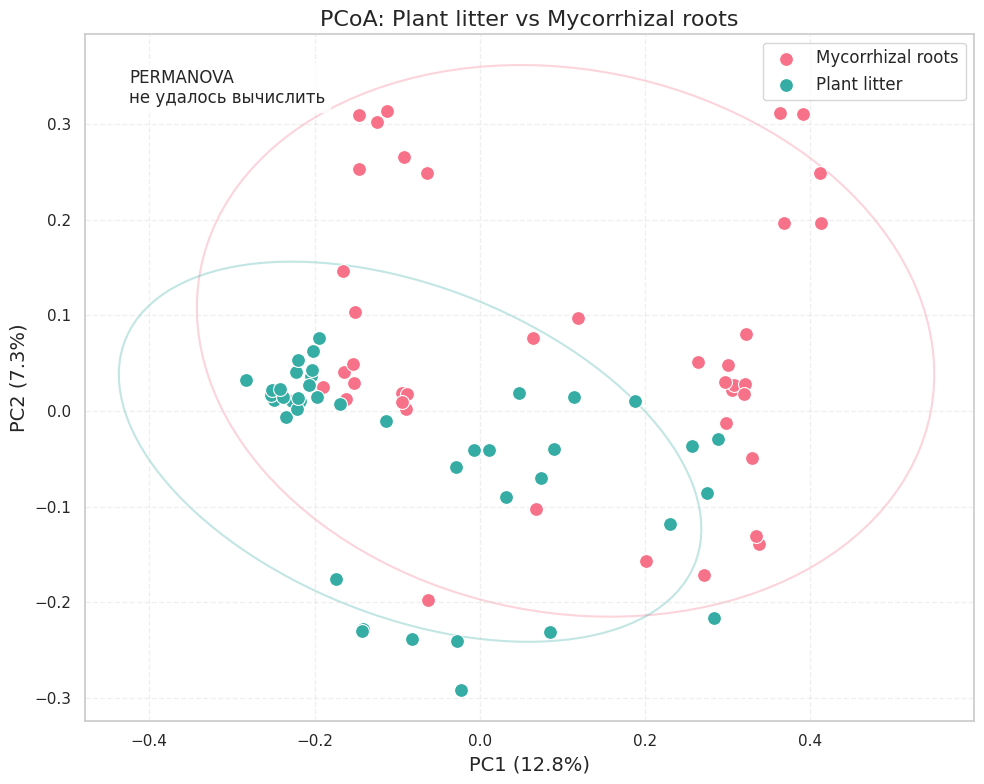


Анализ пары: Plant litter vs Peat (disturbed)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_vs_Peat_disturbed.png


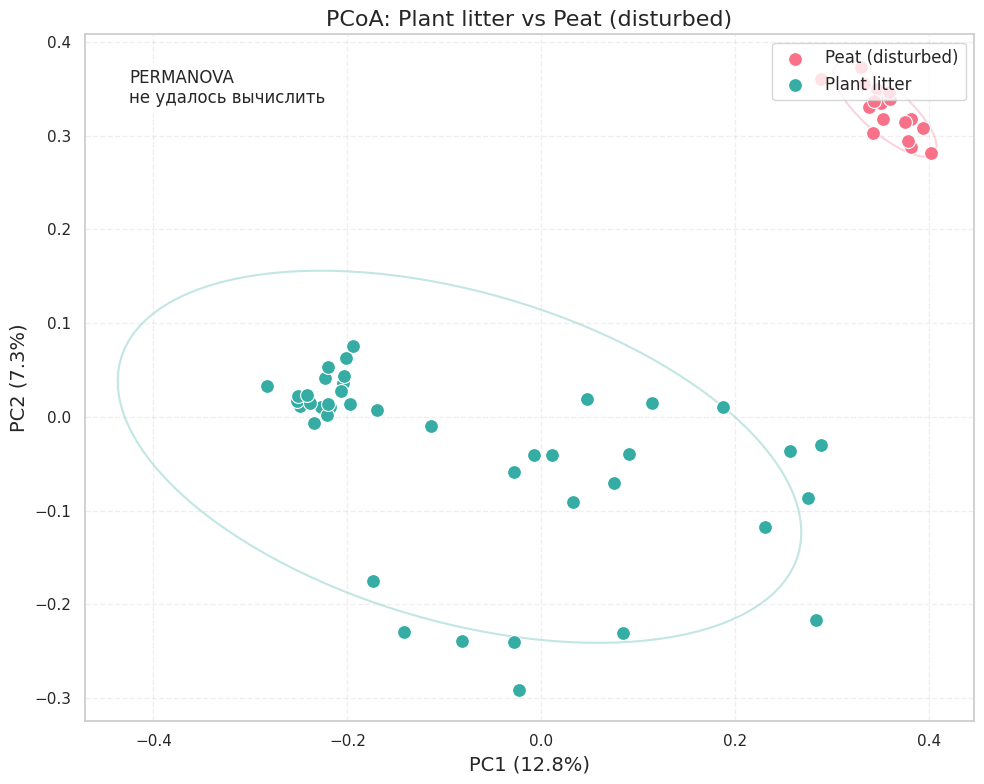


Анализ пары: Plant litter vs Peat (anoxic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_vs_Peat_anoxic.png


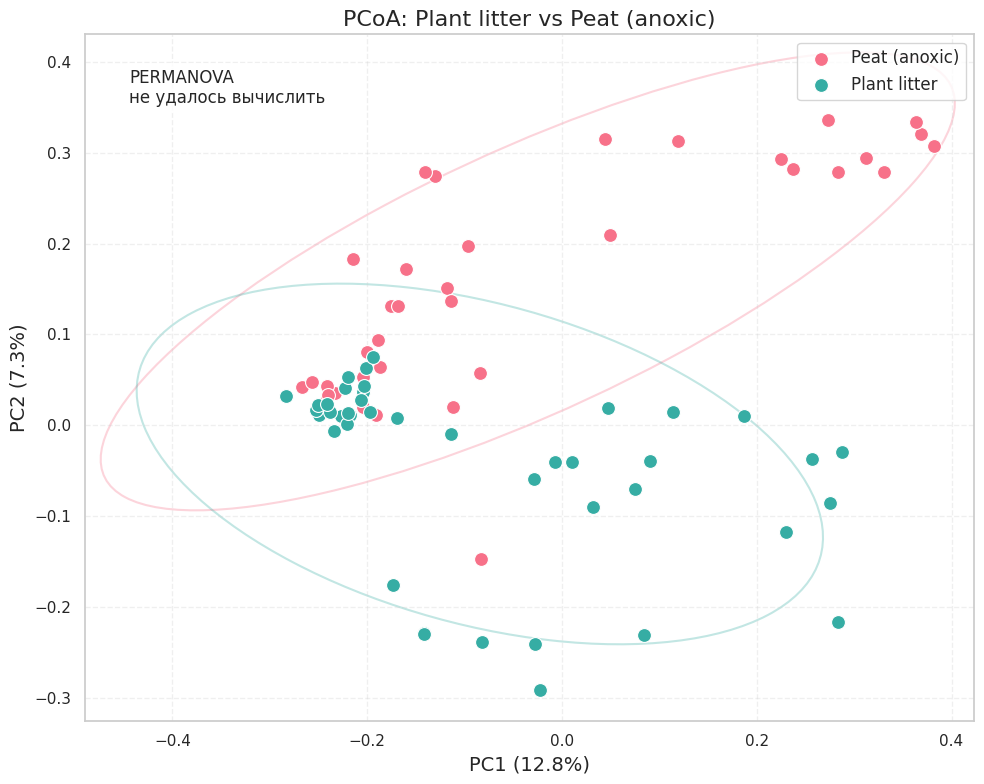


Анализ пары: Plant litter vs Peat (oxygenic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_vs_Peat_oxygenic.png


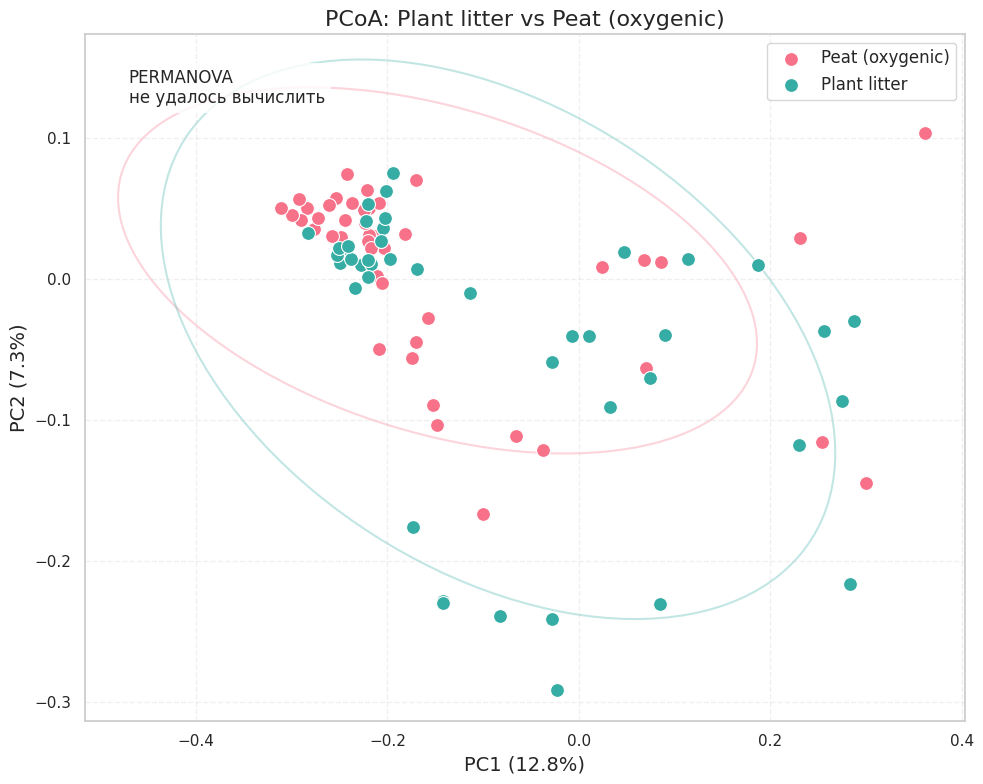


Анализ пары: Plant litter bag vs Standard wood
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_bag_vs_Standard_wood.png


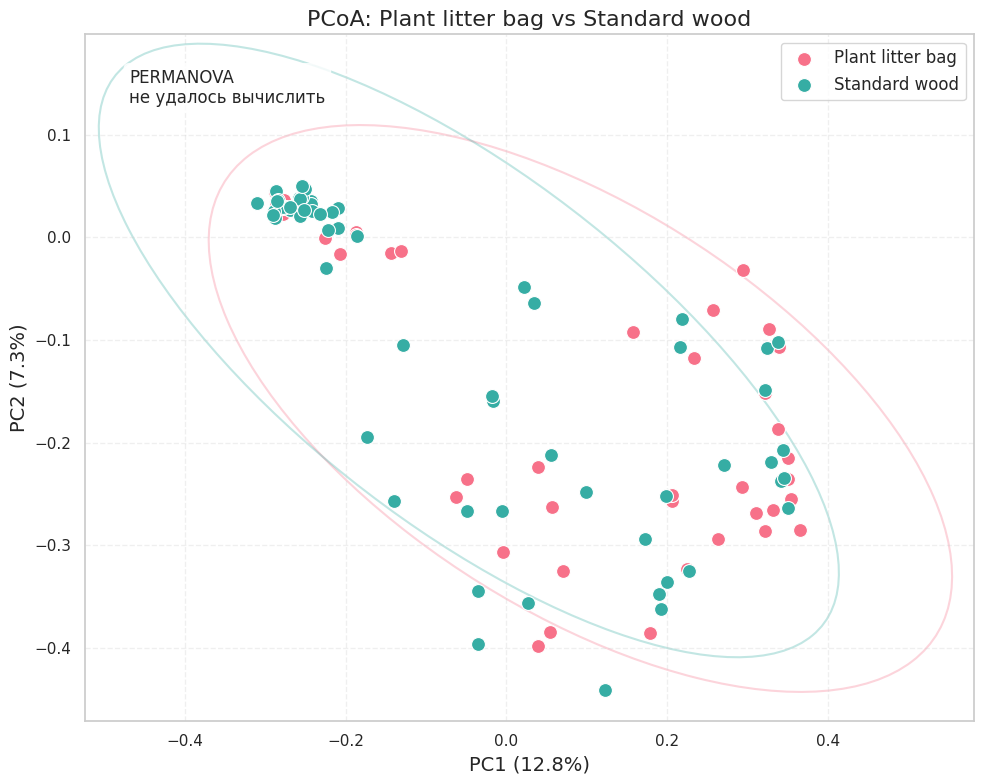


Анализ пары: Plant litter bag vs Mycorrhizal roots
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_bag_vs_Mycorrhizal_roots.png


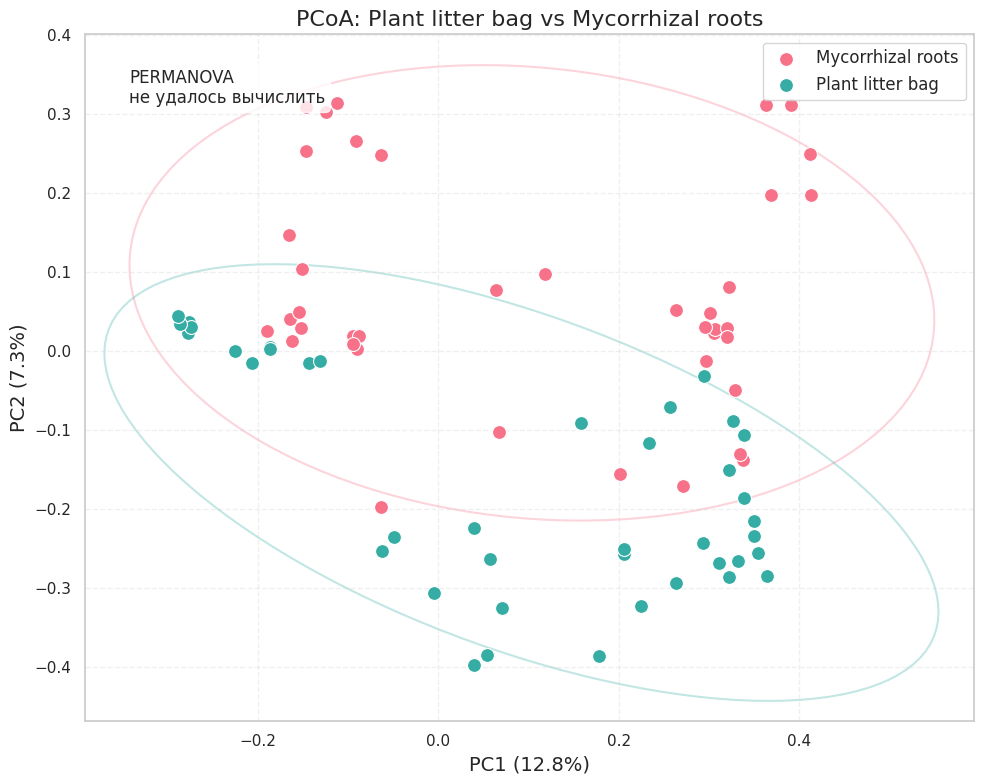


Анализ пары: Plant litter bag vs Peat (disturbed)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_bag_vs_Peat_disturbed.png


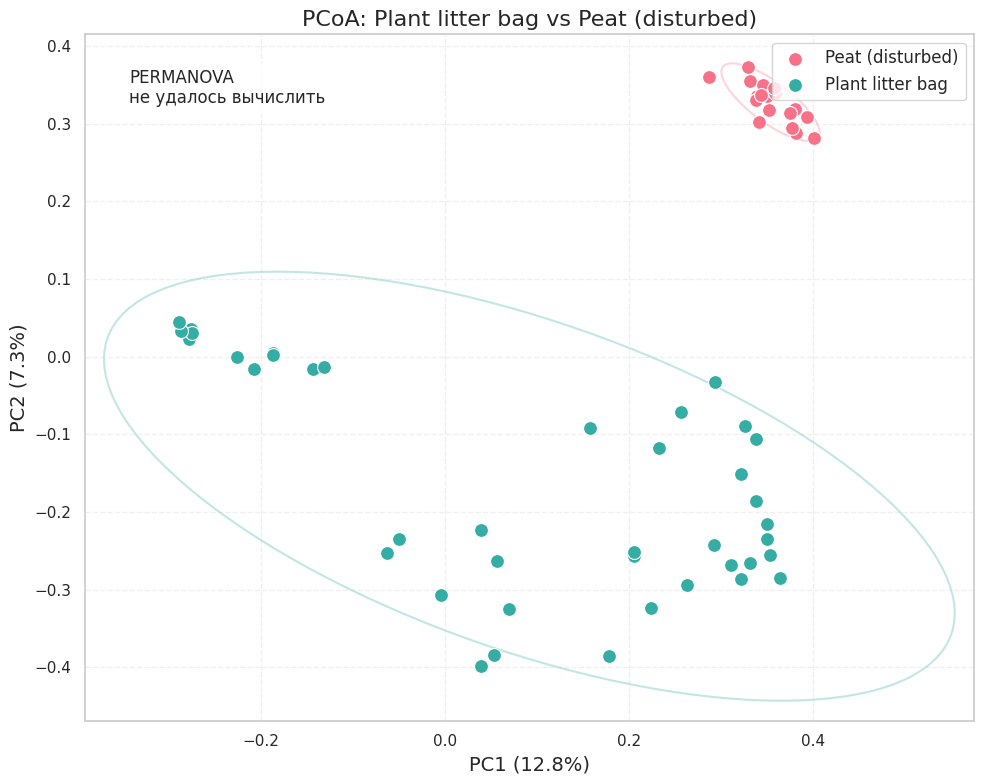


Анализ пары: Plant litter bag vs Peat (anoxic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_bag_vs_Peat_anoxic.png


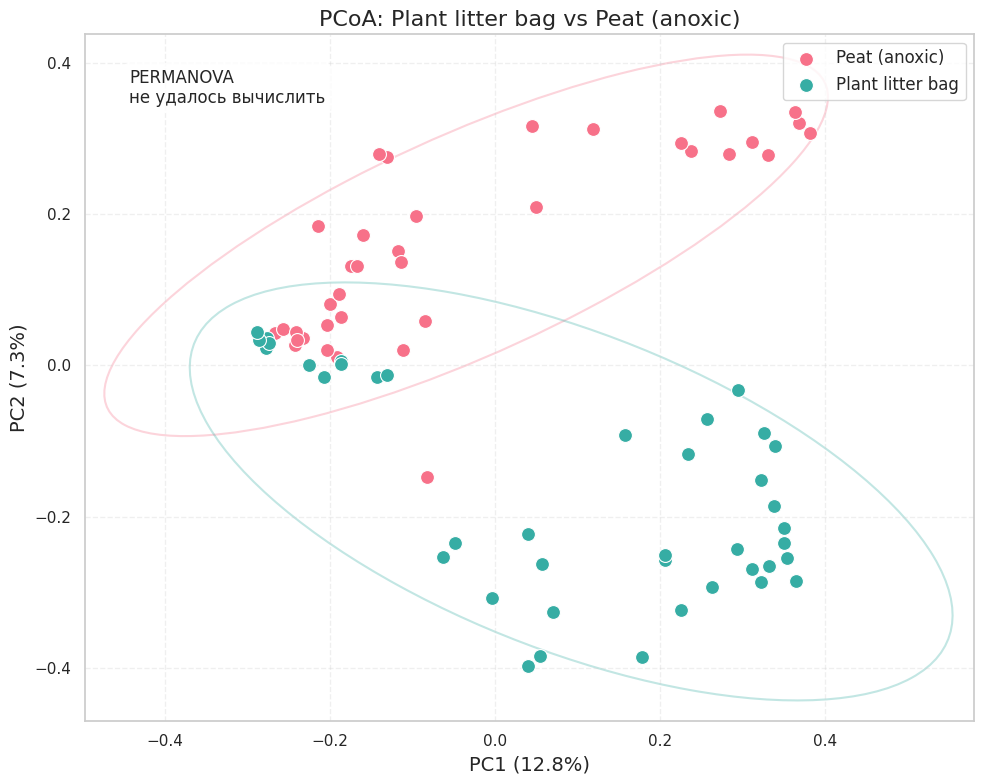


Анализ пары: Plant litter bag vs Peat (oxygenic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Plant_litter_bag_vs_Peat_oxygenic.png


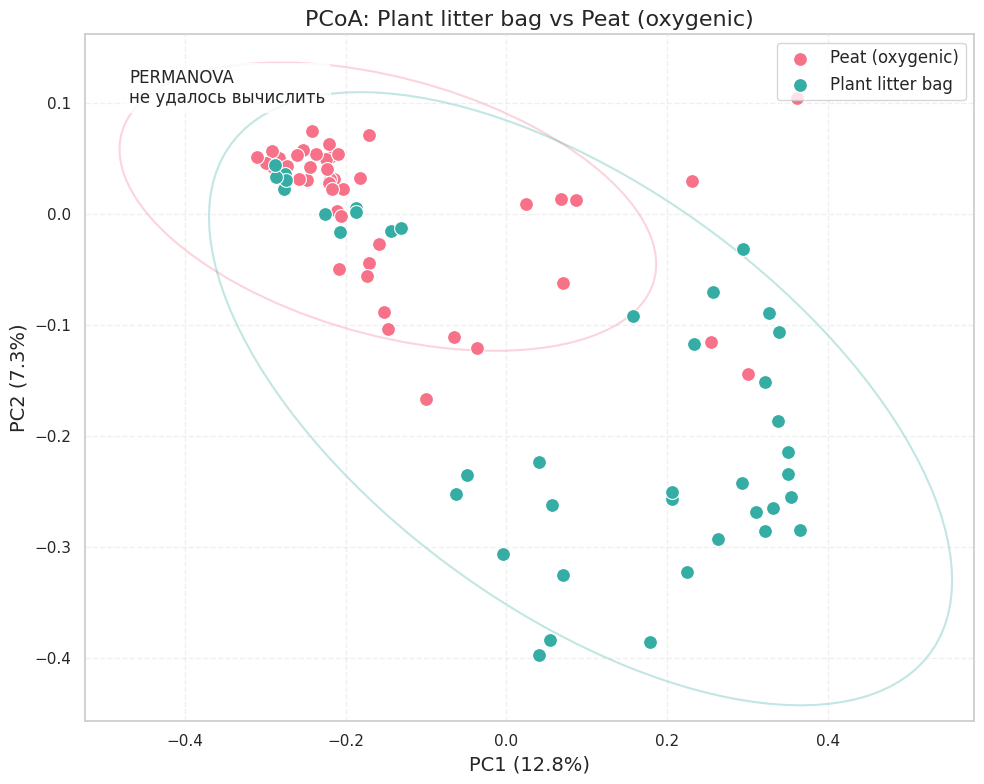


Анализ пары: Standard wood vs Mycorrhizal roots
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Standard_wood_vs_Mycorrhizal_roots.png


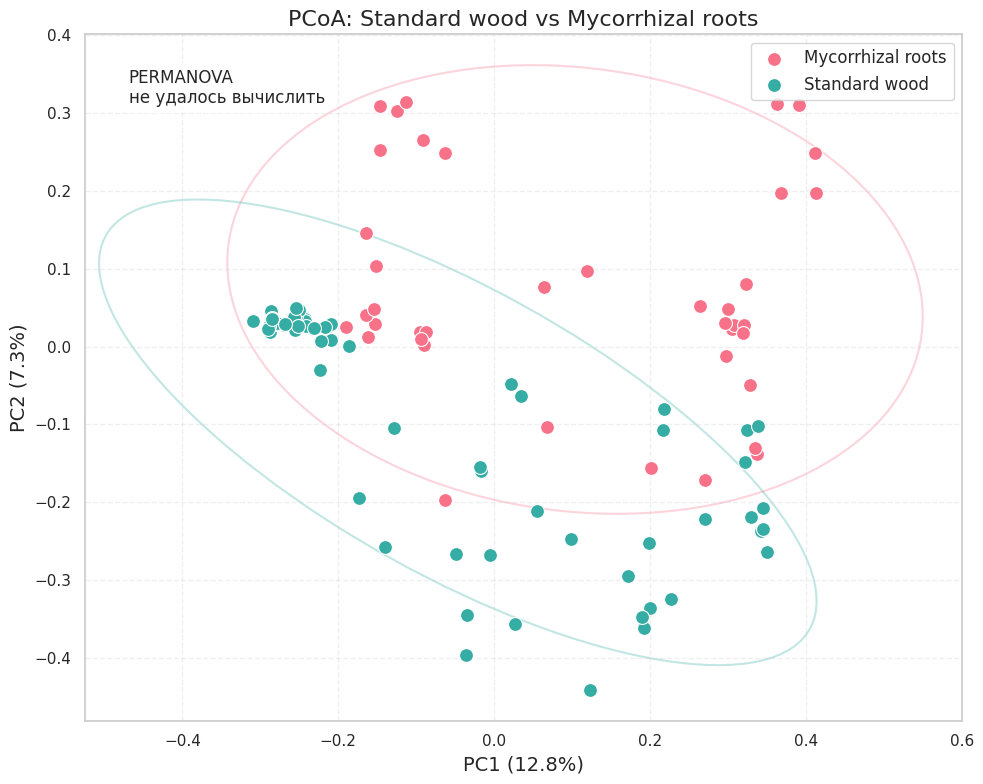


Анализ пары: Standard wood vs Peat (disturbed)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Standard_wood_vs_Peat_disturbed.png


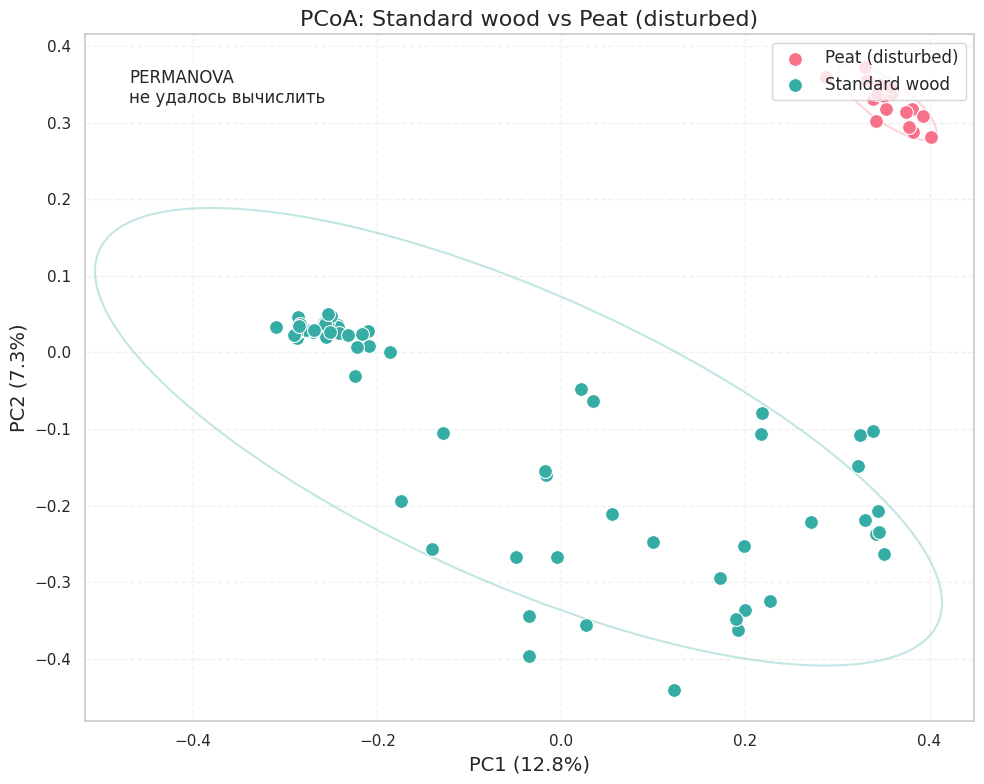


Анализ пары: Standard wood vs Peat (anoxic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Standard_wood_vs_Peat_anoxic.png


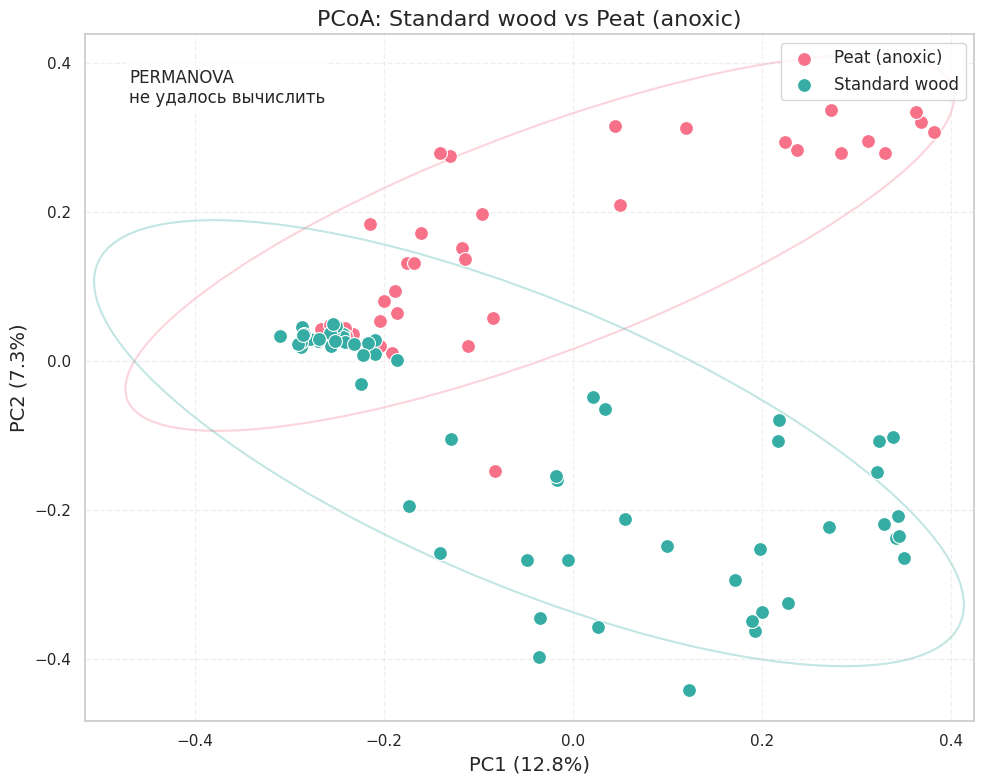


Анализ пары: Standard wood vs Peat (oxygenic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Standard_wood_vs_Peat_oxygenic.png


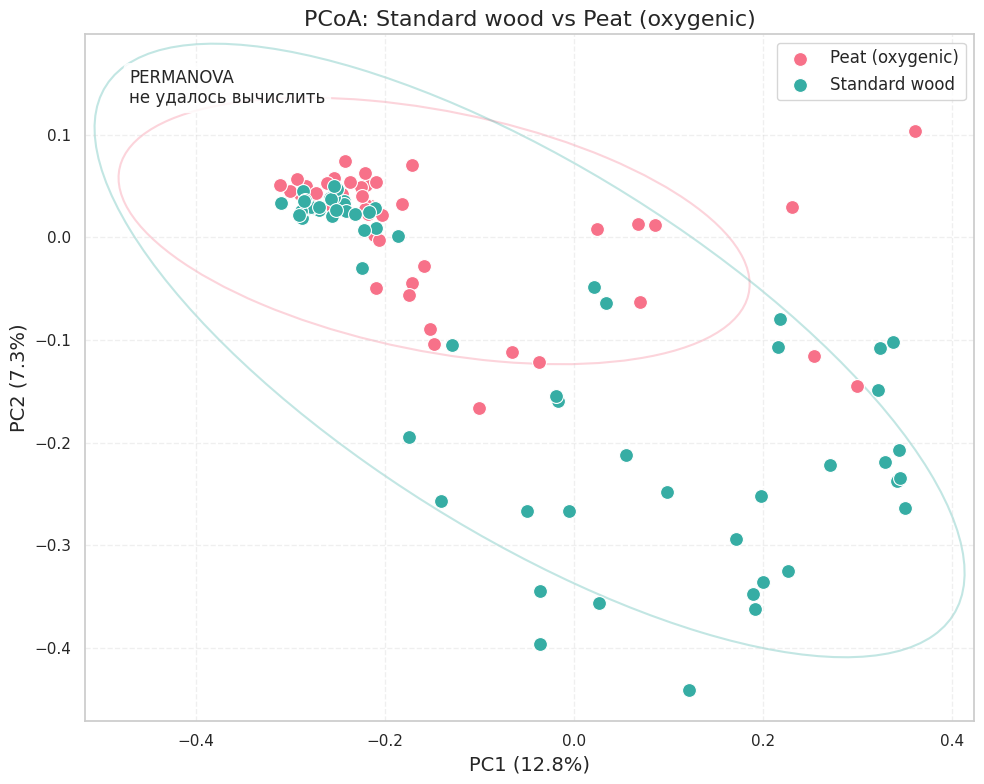


Анализ пары: Mycorrhizal roots vs Peat (disturbed)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Mycorrhizal_roots_vs_Peat_disturbed.png


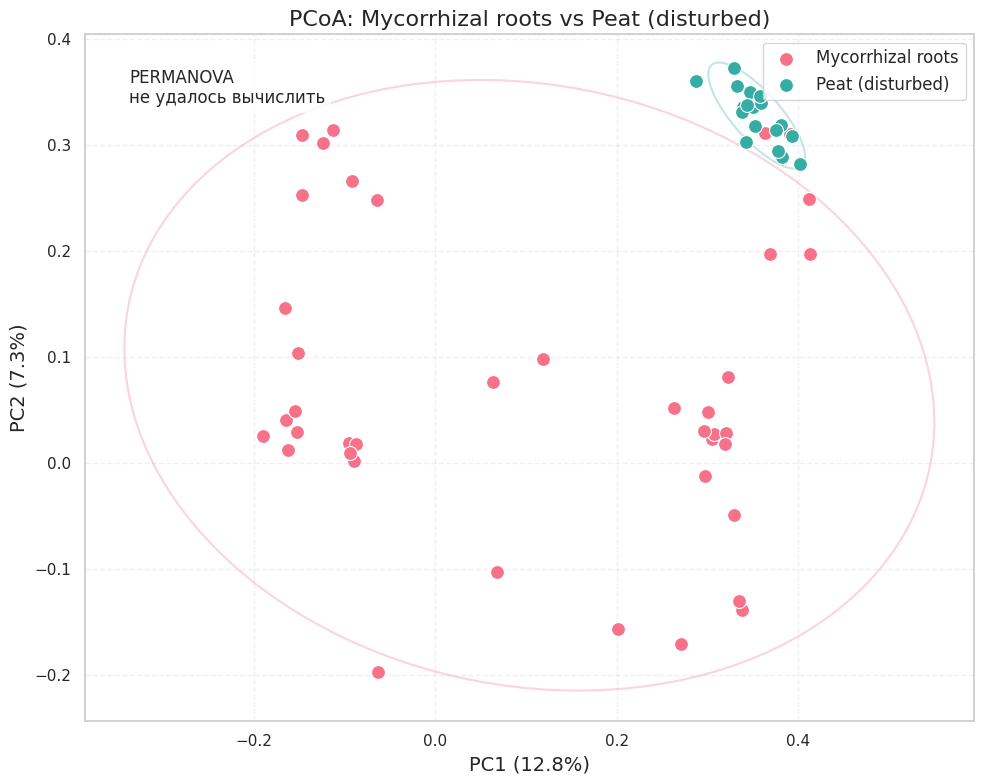


Анализ пары: Mycorrhizal roots vs Peat (anoxic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Mycorrhizal_roots_vs_Peat_anoxic.png


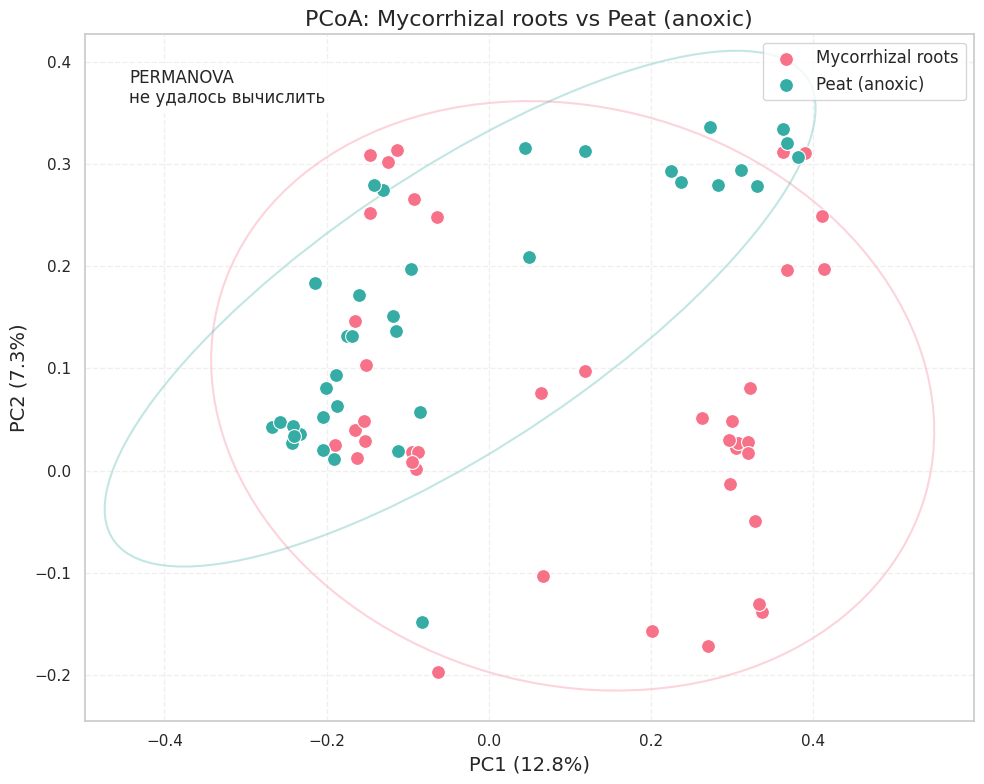


Анализ пары: Mycorrhizal roots vs Peat (oxygenic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Mycorrhizal_roots_vs_Peat_oxygenic.png


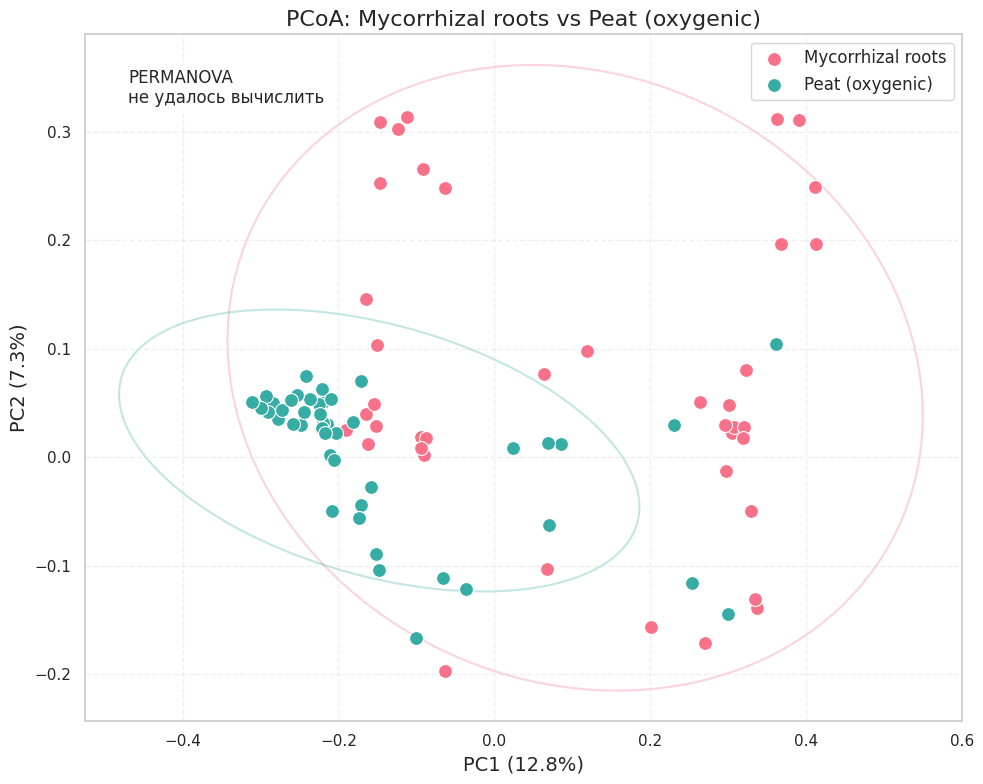


Анализ пары: Peat (disturbed) vs Peat (anoxic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Peat_disturbed_vs_Peat_anoxic.png


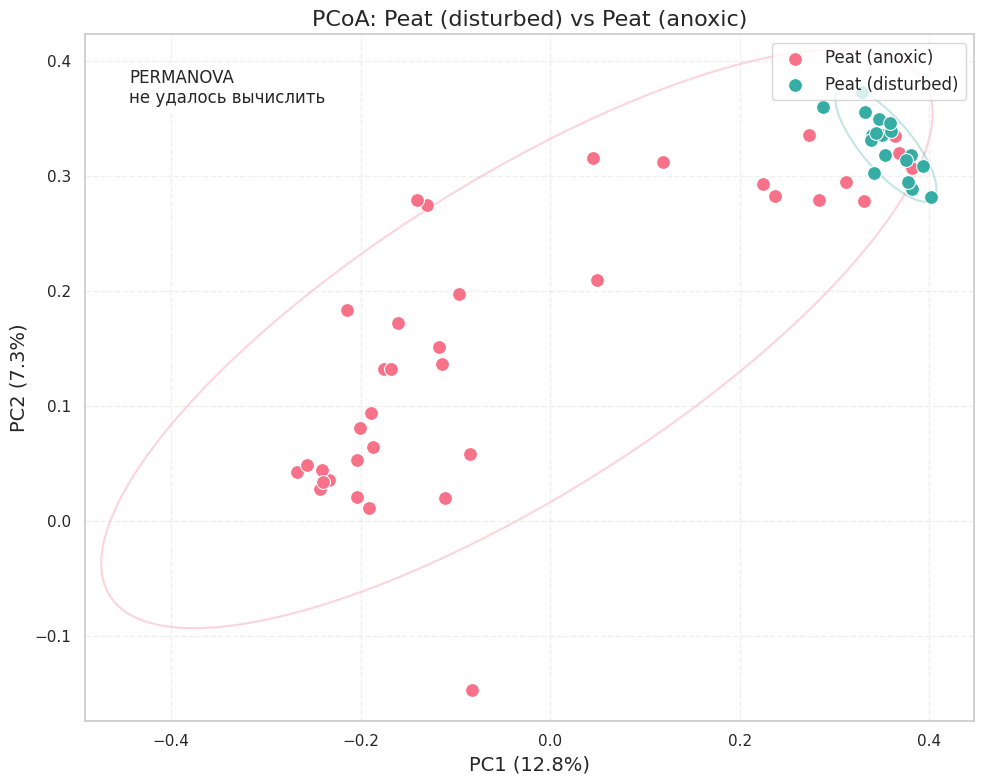


Анализ пары: Peat (disturbed) vs Peat (oxygenic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Peat_disturbed_vs_Peat_oxygenic.png


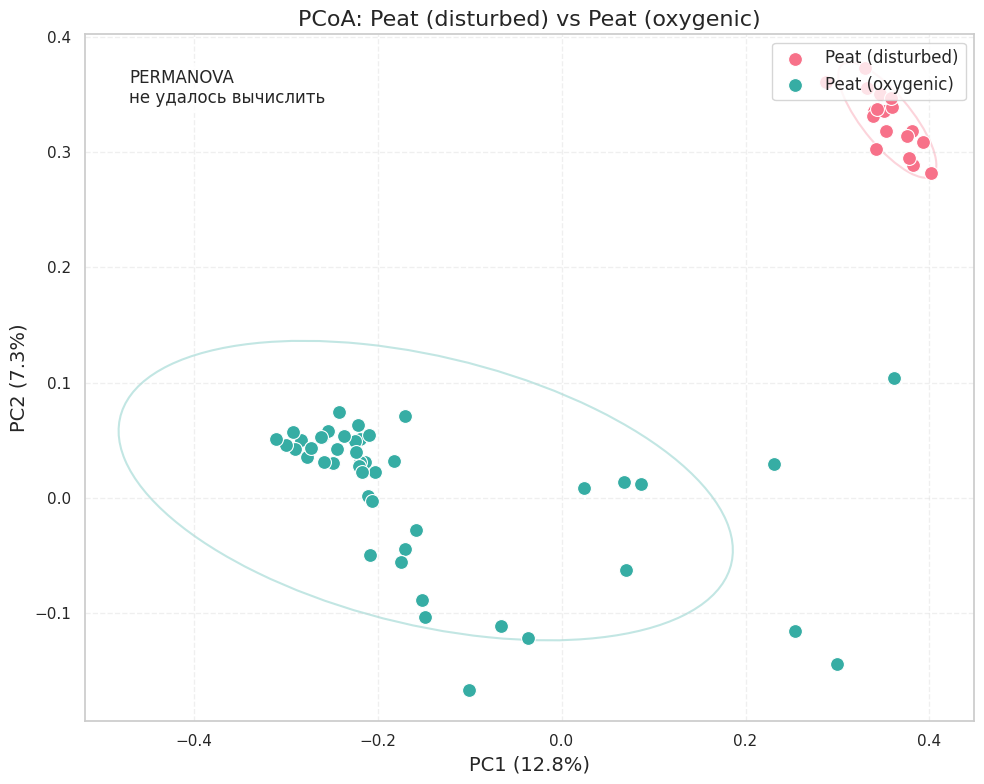


Анализ пары: Peat (anoxic) vs Peat (oxygenic)
Ошибка при выполнении PERMANOVA: name 'permanova' is not defined


/tmp/ipython-input-2457044405.py:112: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
/tmp/ipython-input-2457044405.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)


График сохранен: ordination_results/Peat_anoxic_vs_Peat_oxygenic.png


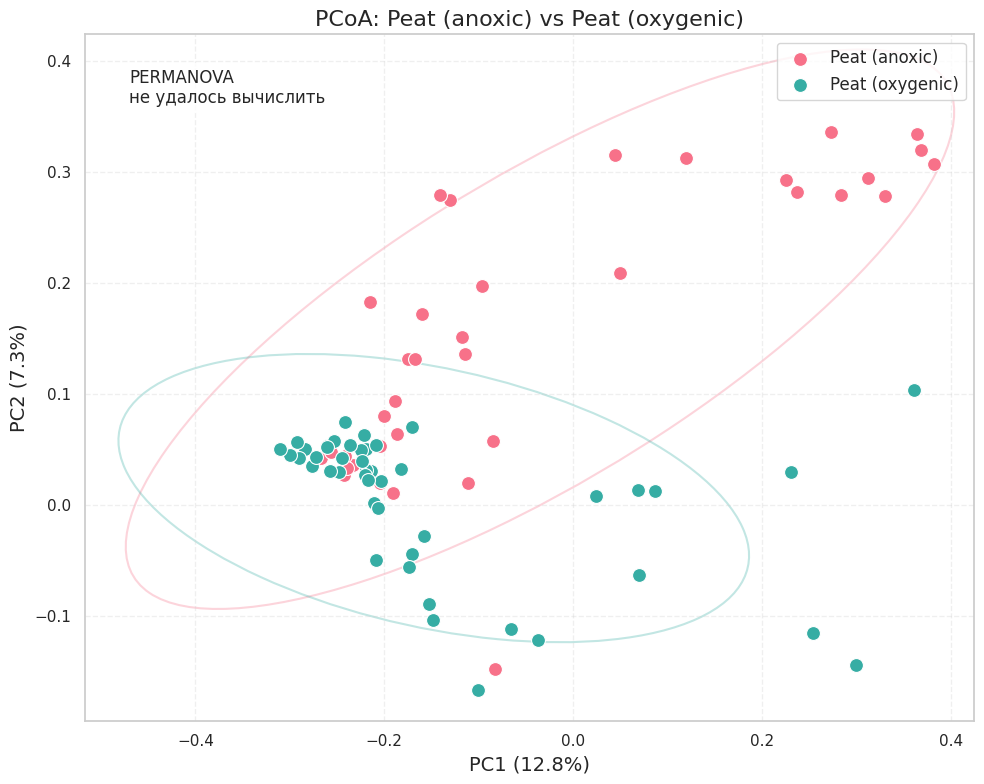


Анализ завершен! Все графики сохранены в папку 'ordination_results'


In [65]:
import os
from itertools import combinations
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from skbio.stats.distance import DistanceMatrix

def plot_pairwise_pcoa(bc_dist_all, pcoa_results_all, metadata, substrate_names):
    """
    Визуализация PCoA для попарных сравнений между субстратами

    Parameters:
        bc_dist_all: предварительно рассчитанная матрица расстояний
        pcoa_results_all: результаты PCoA анализа
        metadata: DataFrame с метаданными
        substrate_names: словарь для переименования субстратов
    """
    # 1. Создаем папку для сохранения результатов
    os.makedirs('ordination_results', exist_ok=True)
    print("Создана папка 'ordination_results' для сохранения графиков")

    # 2. Подготовка данных
    metadata = metadata.copy()
    metadata['substrate'] = metadata['substrate'].map(substrate_names)
    unique_substrates = metadata['substrate'].dropna().unique()

    # 3. Создаем все возможные пары субстратов
    substrate_pairs = list(combinations(unique_substrates, 2))

    # 4. Для каждой пары выполняем визуализацию
    for s1, s2 in substrate_pairs:
        print(f"\nАнализ пары: {s1} vs {s2}")

        # Фильтруем пробы только для текущей пары субстратов
        mask = metadata['substrate'].isin([s1, s2])
        current_samples = metadata[mask]['SampleID'].tolist()

        # Проверяем, что есть достаточное количество проб
        if len(current_samples) < 4:
            print(f"Пропускаем {s1} vs {s2}: недостаточно проб ({len(current_samples)})")
            continue

        # Фильтруем матрицу расстояний для текущей пары
        try:
            current_dist = bc_dist_all.filter(current_samples)
        except Exception as e:
            print(f"Ошибка при фильтрации матрицы расстояний: {str(e)}")
            continue

        # Выполняем PERMANOVA анализ для получения p и F
        try:
            perm_res = permanova(
                distance_matrix=current_dist,
                grouping=metadata.set_index('SampleID').loc[current_samples, 'substrate'],
                permutations=999
            )
            p_value = perm_res['p-value']
            f_value = perm_res['test statistic']
            stats_text = f"PERMANOVA\nF = {f_value:.2f}\np = {p_value:.4f}"
        except Exception as e:
            print(f"Ошибка при выполнении PERMANOVA: {str(e)}")
            stats_text = "PERMANOVA\nне удалось вычислить"
            p_value = np.nan
            f_value = np.nan

        # Фильтруем результаты PCoA для текущих проб
        pcoa_samples = pcoa_results_all.samples.loc[current_samples].copy()
        pcoa_samples['substrate'] = metadata.set_index('SampleID').loc[current_samples, 'substrate'].values

        # Визуализация
        plt.figure(figsize=(10, 8))
        ax = plt.gca()

        # Параметры стиля
        palette = sns.color_palette("husl", 2)
        point_size = 100

        # Рисуем точки и эллипсы для каждой группы
        for i, (substrate, group) in enumerate(pcoa_samples.groupby('substrate')):
            # Точки
            sns.scatterplot(
                x='PC1',
                y='PC2',
                data=group,
                color=palette[i],
                label=substrate,
                s=point_size,
                ax=ax
            )
            # Эллипсы доверия (только если достаточное количество точек)
            if len(group) > 2:
                confidence_ellipse(
                    x=group['PC1'],
                    y=group['PC2'],
                    ax=ax,
                    n_std=2,
                    edgecolor=palette[i],
                    linewidth=1.5,
                    alpha=0.3,
                    zorder=0
                )

        # Добавляем результаты PERMANOVA в угол графика
        plt.text(0.05, 0.95, stats_text,
                 transform=ax.transAxes,
                 fontsize=12,
                 verticalalignment='top',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

        # Настройка графиков
        plt.xlabel(f'PC1 ({pcoa_results_all.proportion_explained[0]*100:.1f}%)', fontsize=14)
        plt.ylabel(f'PC2 ({pcoa_results_all.proportion_explained[1]*100:.1f}%)', fontsize=14)
        plt.title(f'PCoA: {s1} vs {s2}', fontsize=16)

        plt.legend(
            loc='upper right',
            fontsize=12,
            bbox_to_anchor=(1.0, 1.0)
        )
        plt.grid(linestyle='--', alpha=0.3)
        plt.tight_layout()

        # Сохраняем график в папку
        filename = f"{s1}_vs_{s2}.png".replace(" ", "_").replace("(", "").replace(")", "")
        save_path = os.path.join('ordination_results', filename)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"График сохранен: {save_path}")

        plt.show()
        plt.close()

    print("\nАнализ завершен! Все графики сохранены в папку 'ordination_results'")

# Вызов функции с уже рассчитанными данными
plot_pairwise_pcoa(bc_dist_all, pcoa_results_all, metadata, substrate_names)

## SPECIES RICHNESS CURVES AND DIVERSITY INDICES


### Species richness curves with standard deviations for total and substrates

Общее число уникальных SH в данных: 4964


All samples:   0%|          | 0/285 [00:00<?, ?it/s]

mycopins:   0%|          | 0/60 [00:00<?, ?it/s]

peatupper:   0%|          | 0/46 [00:00<?, ?it/s]

mycorrhiza:   0%|          | 0/40 [00:00<?, ?it/s]

litter:   0%|          | 0/44 [00:00<?, ?it/s]

peatstrat:   0%|          | 0/36 [00:00<?, ?it/s]

peatspill:   0%|          | 0/19 [00:00<?, ?it/s]

litter bag:   0%|          | 0/40 [00:00<?, ?it/s]

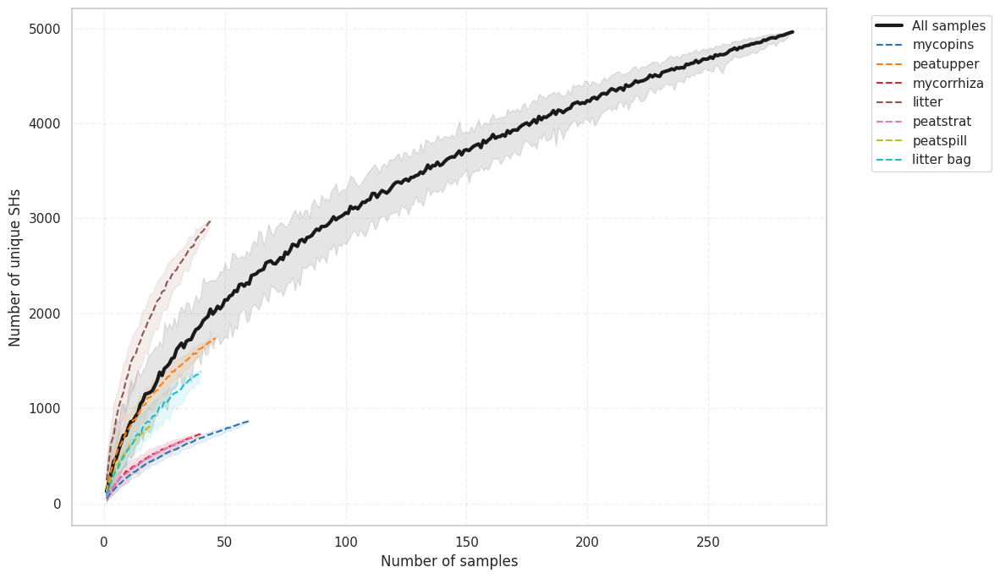

In [66]:
## Кривая видового богатства для всех проб и по отдельности для субстратов
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from sklearn.utils import resample

def plot_correct_species_accumulation(count_data, metadata, substrate_col='substrate', n_bootstraps=50):
    """
    Строит корректные кривые накопления видов

    Параметры:
    - count_data: DataFrame в длинном формате (SampleID, SH, count)
    - metadata: DataFrame с метаданными (должен содержать SampleID и substrate_col)
    """
    # 1. Подготовка данных
    ## Проверяем уникальность SH
    print(f"Общее число уникальных SH в данных: {count_data['SH'].nunique()}")

    ## Создаем бинарную матрицу присутствия (1) / отсутствия (0)
    binary_presence = count_data.groupby(['SampleID', 'SH'])['Count'].any().astype(int).unstack()

    ## Соединяем с метаданными
    data = binary_presence.merge(
        metadata[['SampleID', substrate_col]].drop_duplicates(),
        left_index=True,
        right_on='SampleID',
        how='left'
    ).set_index('SampleID')

    # 2. Функция для расчета кривой
    def calculate_curve(df, name):
        samples = df.index.tolist()
        accum = []

        for n in tqdm(range(1, len(samples)+1), desc=name):
            n_sh = []
            for _ in range(n_bootstraps):
                # Выбираем случайные пробы
                subset = resample(samples, n_samples=n, replace=False)
                # Считаем УНИКАЛЬНЫЕ SH в этих пробах
                unique_sh = df.loc[subset].drop(substrate_col, axis=1).sum().astype(bool).sum()
                n_sh.append(unique_sh)

            accum.append({
                'n_samples': n,
                'mean_sh': np.mean(n_sh),
                'ci_lower': np.percentile(n_sh, 2.5),
                'ci_upper': np.percentile(n_sh, 97.5)
            })
        return pd.DataFrame(accum)

    # 3. Расчет кривых
    substrates = data[substrate_col].dropna().unique()
    results = {}

    ## Общая кривая
    results['All'] = calculate_curve(data, "All samples")

    ## По субстратам
    for substrate in substrates:
        subset = data[data[substrate_col] == substrate]
        if len(subset) > 1:  # Нужно минимум 2 пробы
            results[substrate] = calculate_curve(subset, str(substrate))

    # 4. Визуализация
    plt.figure(figsize=(12, 7))

    ## Основная кривая
    plt.plot(results['All']['n_samples'], results['All']['mean_sh'],
             'k-', lw=3, label='All samples')
    plt.fill_between(results['All']['n_samples'],
                    results['All']['ci_lower'],
                    results['All']['ci_upper'],
                    color='gray', alpha=0.2)

    ## Кривые по субстратам
    colors = plt.cm.tab10(np.linspace(0, 1, len(substrates)))
    for (substrate, df), color in zip(
        [(k,v) for k,v in results.items() if k != 'All'],
        colors
    ):
        plt.plot(df['n_samples'], df['mean_sh'],
                 '--', color=color, label=substrate)
        plt.fill_between(df['n_samples'],
                        df['ci_lower'],
                        df['ci_upper'],
                        color=color, alpha=0.1)

    plt.xlabel('Number of samples', fontsize=12)
    plt.ylabel('Number of unique SHs', fontsize=12)
    plt.title(f'', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.grid(ls='--', alpha=0.3)
    plt.tight_layout()

    return results

# Пример использования:
results = plot_correct_species_accumulation(
    count_data=data,  # DataFrame с колонками: SampleID, SH, count
    metadata=metadata,      # DataFrame с SampleID и субстратами
    substrate_col='substrate'
)

### Diversity indices by samples and overall

In [71]:
import pandas as pd
import numpy as np
from skbio.diversity.alpha import chao1, shannon, simpson, observed_otus

def calculate_ecosystem_alpha_diversity(long_format_data, count_col='Count'):
    """
    Расчет альфа-разнообразия для всей экосистемы (объединение всех проб)
    """
    # 1. Суммируем все данные по видам (SH)
    ecosystem_data = long_format_data.groupby('SH')[count_col].sum().reset_index()

    # 2. Получаем вектор обилий для всей экосистемы
    species_counts = ecosystem_data[count_col].values
    nonzero_counts = species_counts[species_counts > 0]

    # 3. Расчет индексов для всей экосистемы
    obs_otus = observed_otus(species_counts)
    shannon_idx = shannon(nonzero_counts, base=2)
    simpson_idx = simpson(nonzero_counts)

    # 4. Расчет оценки Чао1
    singles = (nonzero_counts == 1).sum()
    doubles = (nonzero_counts == 2).sum()
    chao_est = chao1(nonzero_counts) if (singles > 0 and doubles > 0) else obs_otus
    coverage = (obs_otus / chao_est) * 100 if chao_est > 0 else 100

    # 5. Создание результата
    result = {
        'Ecosystem_Level': 'All_Ecosystem',
        'Observed_Species': obs_otus,
        'Chao1_Estimate': chao_est,
        'Coverage_Perc': coverage,
        'Shannon_Index': shannon_idx,
        'Simpson_Index': simpson_idx,
        'Total_Individuals': species_counts.sum(),
        'Total_Samples': long_format_data['SampleID'].nunique()
    }

    # 6. Вывод результатов
    print("\n" + "="*60)
    print("ALPHA DIVERSITY FOR ENTIRE ECOSYSTEM")
    print("="*60)
    print(f"Observed Species: {obs_otus}")
    print(f"Chao1 Estimate: {chao_est:.1f}")
    print(f"Coverage: {coverage:.1f}%")
    print(f"Shannon Index (H'): {shannon_idx:.3f}")
    print(f"Simpson Index: {simpson_idx:.3f}")
    print(f"Total Individuals: {species_counts.sum()}")
    print(f"Total Samples: {long_format_data['SampleID'].nunique()}")
    print("="*60)

    # 7. Сохранение в файл
    ecosystem_df = pd.DataFrame([result])
    ecosystem_df.to_csv('alpha_diversity_ecosystem.csv', index=False)
    print("\nResults saved to: alpha_diversity_ecosystem.csv")

    return ecosystem_df

def calculate_alpha_diversity(long_format_data, metadata, count_col='Count', sample_col='SampleID', substrate_col='substrate'):
    """
    Расчет альфа-разнообразия с красивым выводом таблицы
    """
    # 1. Преобразование в широкий формат
    wide_data = long_format_data.pivot_table(
        index=sample_col,
        columns='SH',
        values=count_col,
        aggfunc='sum',
        fill_value=0
    ).reset_index()

    # 2. Подготовка данных
    metadata = metadata.copy()
    metadata.loc[:, sample_col] = metadata[sample_col].astype(str)
    samples = wide_data[sample_col].astype(str)
    species_counts = wide_data.drop(columns=[sample_col]).values

    # 3. Расчет индексов
    results = []
    for i, sample_id in enumerate(samples):
        counts = species_counts[i]
        nonzero_counts = counts[counts > 0]

        obs_otus = observed_otus(counts)
        shannon_idx = shannon(nonzero_counts, base=2)
        simpson_idx = simpson(nonzero_counts)

        singles = (nonzero_counts == 1).sum()
        doubles = (nonzero_counts == 2).sum()
        chao_est = chao1(nonzero_counts) if (singles > 0 and doubles > 0) else obs_otus
        coverage = (obs_otus / chao_est) * 100 if chao_est > 0 else 100

        sub = metadata.loc[metadata[sample_col] == sample_id, substrate_col].values[0]

        results.append({
            sample_col: sample_id,
            'Observed_Species': obs_otus,
            'Chao1_Estimate': chao_est,
            'Coverage_Perc': coverage,
            'Shannon_Index': shannon_idx,
            'Simpson_Index': simpson_idx,
            substrate_col: sub
        })

    # 4. Создание таблицы по площадкам
    result_df = pd.DataFrame(results)

    # 5. Агрегация по субстратам
    agg_stats = result_df.groupby(substrate_col).agg({
        'Observed_Species': ['mean', 'std'],
        'Shannon_Index': ['mean', 'std'],
        'Chao1_Estimate': ['mean', 'std'],
        'Coverage_Perc': ['mean', 'std'],
        sample_col: 'count'
    }).reset_index()

    # 6. Добавляем строку для всех образцов
    all_samples_stats = pd.DataFrame({
        substrate_col: ['All samples'],
        ('Observed_Species', 'mean'): [result_df['Observed_Species'].mean()],
        ('Observed_Species', 'std'): [result_df['Observed_Species'].std()],
        ('Shannon_Index', 'mean'): [result_df['Shannon_Index'].mean()],
        ('Shannon_Index', 'std'): [result_df['Shannon_Index'].std()],
        ('Chao1_Estimate', 'mean'): [result_df['Chao1_Estimate'].mean()],
        ('Chao1_Estimate', 'std'): [result_df['Chao1_Estimate'].std()],
        ('Coverage_Perc', 'mean'): [result_df['Coverage_Perc'].mean()],
        ('Coverage_Perc', 'std'): [result_df['Coverage_Perc'].std()],
        (sample_col, 'count'): [len(result_df)]
    })

    # 7. Объединяем таблицы
    all_samples_stats.columns = agg_stats.columns
    agg_stats = pd.concat([agg_stats, all_samples_stats], ignore_index=True)

    # 8. Форматируем вывод
    display_df = pd.DataFrame({
        'Substrate': agg_stats[substrate_col],
        'Observed SH': agg_stats['Observed_Species']['mean'].round(0).astype(int).astype(str) +
                      " (±" + agg_stats['Observed_Species']['std'].round(0).astype(int).astype(str) + ")",
        'Shannon': agg_stats['Shannon_Index']['mean'].round(2).astype(str) +
                  " (±" + agg_stats['Shannon_Index']['std'].round(2).astype(str) + ")",
        'Chao1': agg_stats['Chao1_Estimate']['mean'].round(0).astype(int).astype(str) +
                " (±" + agg_stats['Chao1_Estimate']['std'].round(0).astype(int).astype(str) + ")",
        'Coverage, %': agg_stats['Coverage_Perc']['mean'].round(1).astype(str) +
                      " (±" + agg_stats['Coverage_Perc']['std'].round(1).astype(str) + ")",
        'N samples': agg_stats[sample_col]['count'].astype(int)
    })

    # 9. Выводим красивую таблицу
    from IPython.display import display
    print("\nAlpha Diversity Metrics by Substrate:")
    display(display_df.style
            .set_properties(**{'text-align': 'center'})
            .set_table_styles([{
                'selector': 'th',
                'props': [('text-align', 'center')]
            }]))

    # 10. Сохранение результатов
    result_df.to_csv('alpha_diversity_by_sample.csv', index=False)
    agg_stats.to_csv('alpha_diversity_by_substrate.csv', index=False)

    print("\nResults saved to:")
    print("- alpha_diversity_by_sample.csv")
    print("- alpha_diversity_by_substrate.csv")

    # 11. Расчет для всей экосистемы (ПЕРЕМЕЩЕНО ПЕРЕД RETURN!)
    print("\n" + "="*60)
    print("CALCULATING ECOSYSTEM-LEVEL DIVERSITY")
    print("="*60)

    ecosystem_results = calculate_ecosystem_alpha_diversity(
        long_format_data=long_format_data,
        count_col=count_col
    )

    return result_df, agg_stats, ecosystem_results

# Пример использования (обновленный):
div_samples, div_substrates, div_ecosystem = calculate_alpha_diversity(
    long_format_data=data,
    metadata=metadata,
    count_col='Count',
    sample_col='SampleID',
    substrate_col='substrate'
)


Alpha Diversity Metrics by Substrate:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,Substrate,Observed SH,Shannon,Chao1,"Coverage, %",N samples
0,litter,258 (±134),3.8 (±0.95),431 (±221),59.0 (±9.3),44
1,litter bag,93 (±52),3.14 (±0.74),167 (±89),57.0 (±10.1),40
2,mycopins,47 (±20),2.52 (±0.84),67 (±30),73.2 (±14.4),60
3,mycorrhiza,68 (±39),2.99 (±0.6),99 (±56),70.4 (±14.5),40
4,peatspill,121 (±42),4.36 (±0.89),170 (±65),73.2 (±11.8),19
5,peatstrat,65 (±22),3.67 (±0.5),82 (±30),81.7 (±14.3),36
6,peatupper,150 (±74),3.44 (±1.08),212 (±104),71.6 (±10.9),46
7,All samples,113 (±97),3.29 (±0.98),174 (±161),69.2 (±14.6),285



Results saved to:
- alpha_diversity_by_sample.csv
- alpha_diversity_by_substrate.csv

CALCULATING ECOSYSTEM-LEVEL DIVERSITY

ALPHA DIVERSITY FOR ENTIRE ECOSYSTEM
Observed Species: 4964
Chao1 Estimate: 6953.3
Coverage: 71.4%
Shannon Index (H'): 7.120
Simpson Index: 0.979
Total Individuals: 2783596.0
Total Samples: 285

Results saved to: alpha_diversity_ecosystem.csv


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


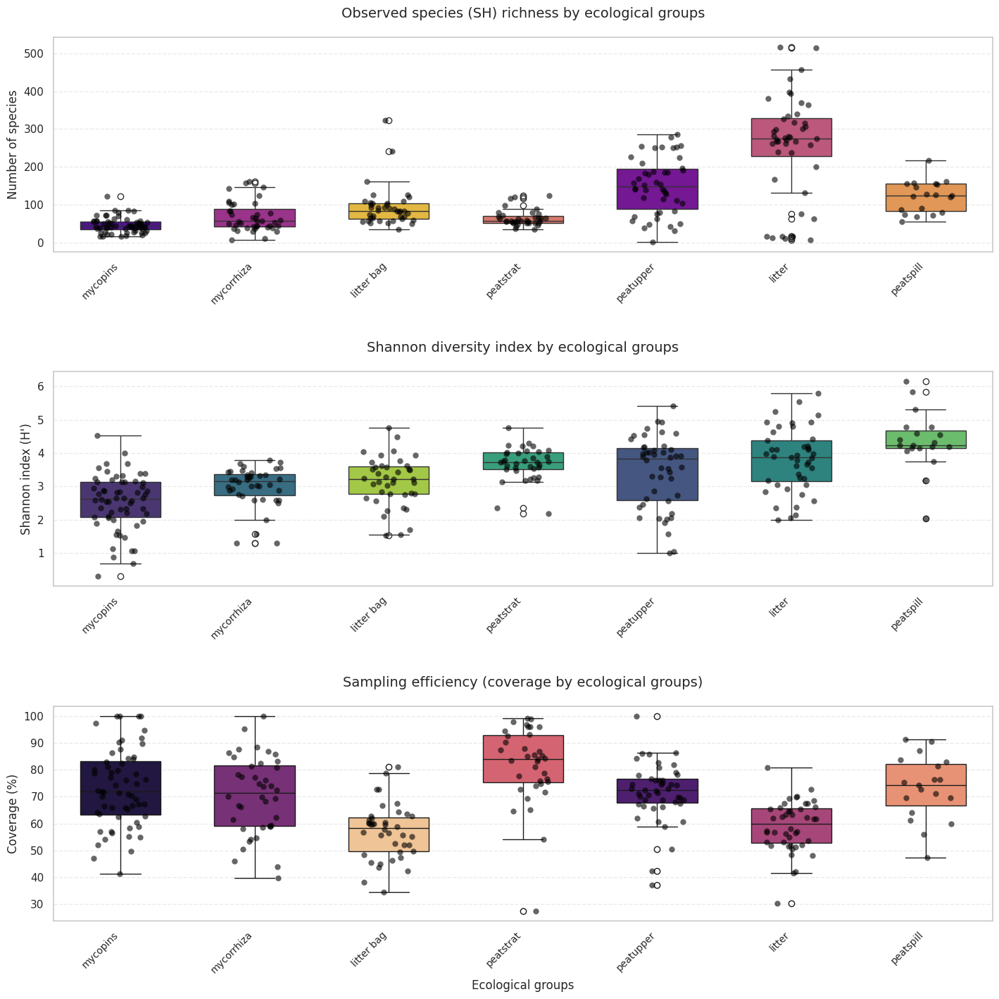

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [68]:
# Визуализация индексов разнообразия, рассчитанных по субстратам
import matplotlib.pyplot as plt
import seaborn as sns

def plot_diversity_metrics(result_df, substrate_col='substrate'):
    """
    Visualize alpha-diversity metrics:
    - Shannon diversity index
    - Sampling coverage efficiency
    - Observed species richness
    """
    # Check required columns
    required_cols = ['Observed_Species', 'Shannon_Index', 'Coverage_Perc', substrate_col]
    if not all(col in result_df.columns for col in required_cols):
        missing = [col for col in required_cols if col not in result_df.columns]
        raise ValueError(f"Missing columns: {missing}")

    # Sort ecological groups by median Shannon index
    substrate_order = result_df.groupby(substrate_col)['Shannon_Index'].median().sort_values().index

    # Figure setup
    plt.figure(figsize=(15, 15))

    # Visualization settings for each metric
    plot_config = {
            'Observed_Species': {
            'palette': "plasma",
            'title': "Observed species (SH) richness by ecological groups",
            'ylabel': "Number of species"
        },
            'Shannon_Index': {
            'palette': "viridis",
            'title': "Shannon diversity index by ecological groups",
            'ylabel': "Shannon index (H')"
        },
        'Coverage_Perc': {
            'palette': "magma",
            'title': "Sampling efficiency (coverage by ecological groups)",
            'ylabel': "Coverage (%)"
        }

    }

    # Create three plots
    for i, (metric, config) in enumerate(plot_config.items(), 1):
        plt.subplot(3, 1, i)

        # Boxplot
        sns.boxplot(
            data=result_df,
            x=substrate_col,
            y=metric,
            order=substrate_order,
            palette=config['palette'],
            width=0.6,
            linewidth=1,
            hue=substrate_col,
            legend=False
        )

        # Individual points
        sns.stripplot(
            data=result_df,
            x=substrate_col,
            y=metric,
            order=substrate_order,
            color='black',
            alpha=0.6,
            size=6,
            jitter=0.2
        )

        # Titles and labels
        plt.title(config['title'], fontsize=14, pad=20)
        plt.ylabel(config['ylabel'], fontsize=12)
        plt.xlabel('' if i < 3 else 'Ecological groups', fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.grid(axis='y', linestyle='--', alpha=0.4)

    plt.tight_layout(pad=3.0)
    plt.show()

# Example usage:
plot_diversity_metrics(div_samples, 'substrate')

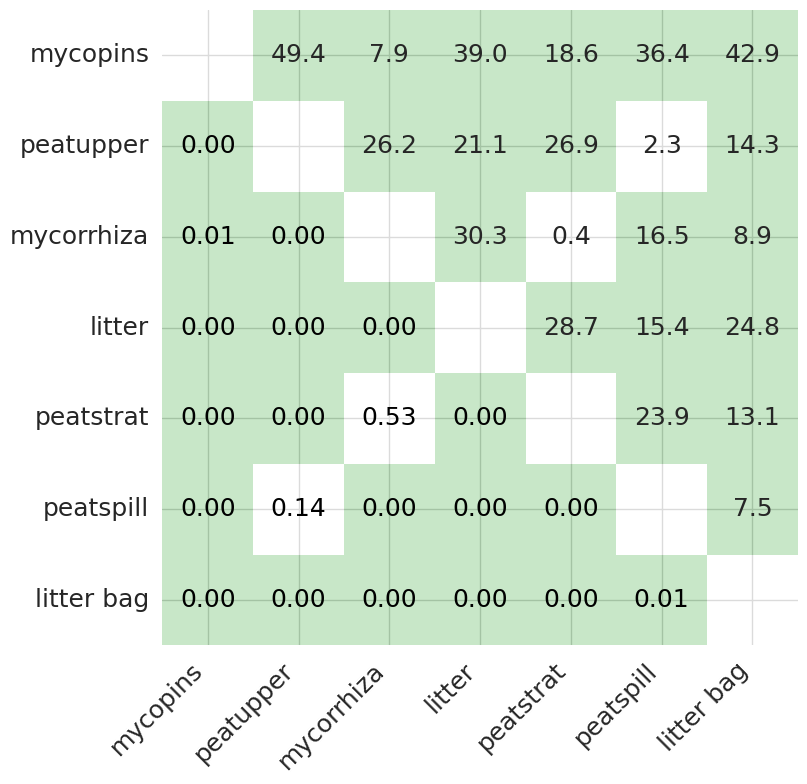

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


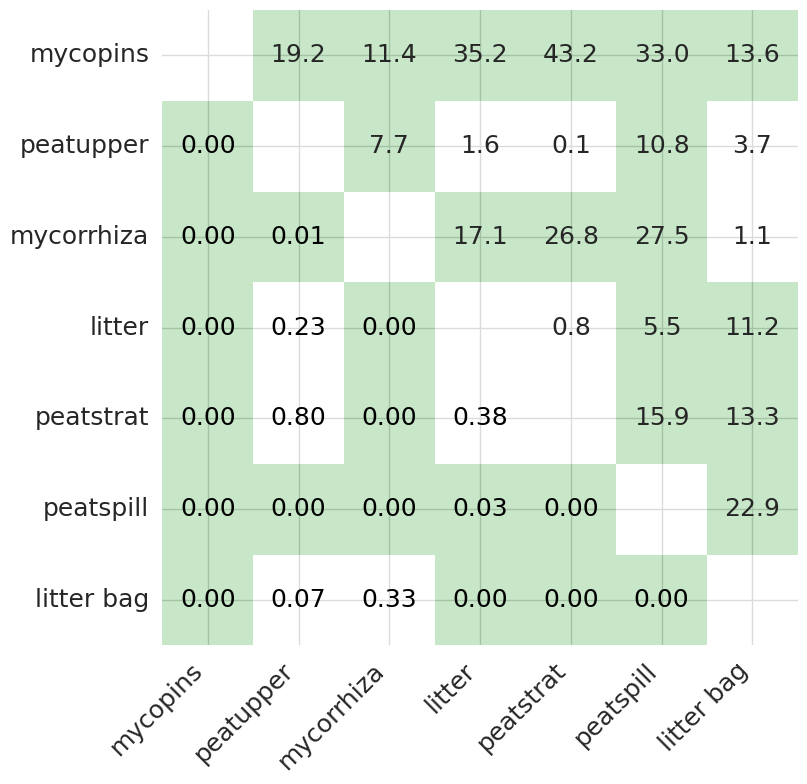

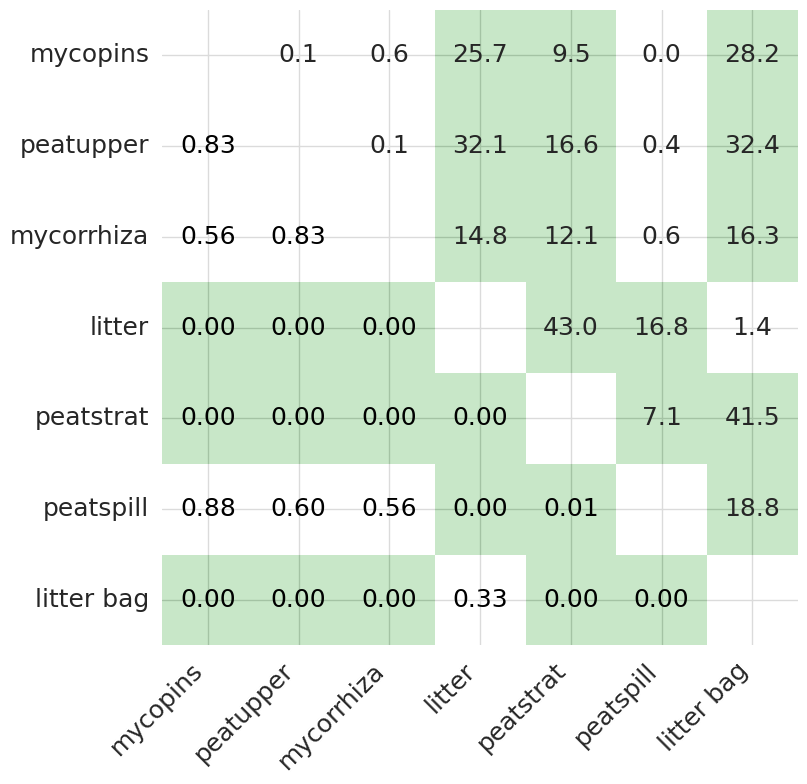

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [69]:
# Матрица сравнения индексов по субстратам

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import kruskal
from statsmodels.stats.multitest import multipletests
import numpy as np
import pandas as pd

def plot_kruskal_matrices(result_df, substrate_col='substrate'):
    """
    Plot separate Kruskal-Wallis matrices with green highlighting
    for significant p-values in BOTH triangles
    """
    # Check required columns
    required_cols = ['Observed_Species', 'Shannon_Index', 'Coverage_Perc', substrate_col]
    if not all(col in result_df.columns for col in required_cols):
        missing = [col for col in required_cols if col not in result_df.columns]
        raise ValueError(f"Missing columns: {missing}")

    substrates = result_df[substrate_col].unique()
    metrics = {
        'Observed_Species': 'Observed Species Richness',
        'Shannon_Index': 'Shannon Diversity Index',
        'Coverage_Perc': 'Sampling Coverage Efficiency'
    }

    for metric, title in metrics.items():
        plt.figure(figsize=(10, 8))
        ax = plt.gca()

        groups = [result_df[result_df[substrate_col] == sub][metric].values
                 for sub in substrates]
        h_stat, p_value = kruskal(*groups)

        if p_value < 0.05:
            n = len(substrates)
            p_matrix = np.ones((n, n))
            f_matrix = np.zeros((n, n))

            # Fill matrices with pairwise comparisons
            for j in range(n):
                for k in range(j+1, n):
                    f_val, p_val = kruskal(groups[j], groups[k])
                    p_matrix[j,k] = p_val
                    f_matrix[j,k] = f_val
                    p_matrix[k,j] = p_val  # Mirror p-values to lower triangle

            # Apply FDR correction to upper triangle only
            upper_tri_p = p_matrix[np.triu_indices(n, k=1)]
            reject, pvals_corrected, _, _ = multipletests(upper_tri_p, method='fdr_bh')
            p_matrix[np.triu_indices(n, k=1)] = pvals_corrected

            # Create combined significance mask (upper + lower)
            sig_matrix = (p_matrix < 0.05).astype(int)

            # Custom colormap: [white, green] with transparency
            cmap = [(1, 1, 1, 0.3), (0.29, 0.69, 0.29, 0.3)]

            sns.heatmap(
                sig_matrix,
                cmap=cmap,
                annot=False,
                mask=None,
                cbar=False,
                square=True,
                ax=ax
            )

            # Add p-values to lower triangle (green background if significant)
            for j in range(n):
                for k in range(j):
                    p = p_matrix[k,j]
                    color = 'black' if p >= 0.05 else 'black'
                    ax.text(k+0.5, j+0.5, f'{p:.2f}',
                           ha='center', va='center',
                           fontsize=18, color=color)

            # Add F-values to upper triangle
            for j in range(n):
                for k in range(j+1, n):
                    f_val = f_matrix[j,k]
                    ax.text(k+0.5, j+0.5, f'{f_val:.1f}',
                           ha='center', va='center', fontsize=18)

            ax.set_xticks(np.arange(n) + 0.5)
            ax.set_xticklabels(substrates, rotation=45, ha='right', fontsize=18)
            ax.set_yticks(np.arange(n) + 0.5)
            ax.set_yticklabels(substrates, rotation=0, fontsize=18)

            plt.title(f'',
                     fontsize=14, pad=20)

        else:
            ax.text(0.5, 0.5, 'No significant differences found\n(p ≥ 0.05)',
                   ha='center', va='center', fontsize=18)
            ax.axis('off')
            plt.title(f'{title}\n(No significant differences)', fontsize=18, pad=20)

        plt.tight_layout()
        plt.show()

# Usage:
plot_kruskal_matrices(div_samples, 'substrate')

# ANALYSIS OF ENVIRONMENTAL PARAMETERS BY GROUPS OF SUBSTRATES

## ANALYSIS OF WOOD-DECAY FUNGUS COMMUNITY USING STANDARD SUBSTRATES (MYCOPINS)


Анализ для субстрата: mycopins
Фильтрация данных...
Отобрано проб: 60
Доступные факторы для анализа:
- series: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14.]
- Year: [2022 2023]
- plantHost: ['Pinus sylvestris' 'Larix sibirica' 'Betula']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: series


/usr/local/lib/python3.11/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.14701794600260962 whereas the largest positive one is 4.713511616491358.
  warn(
/tmp/ipython-input-2793216413.py:93: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)
/tmp/ipython-input-2793216413.py:141: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To

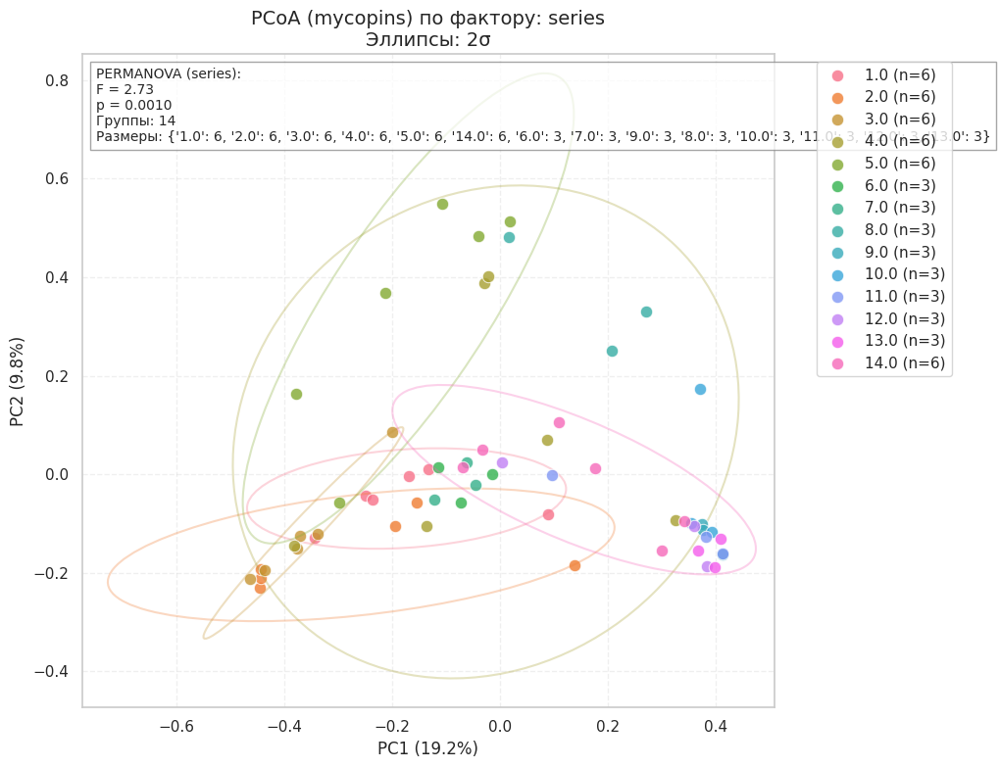


Анализ для фактора: Year


/tmp/ipython-input-2793216413.py:141: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-2793216413.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


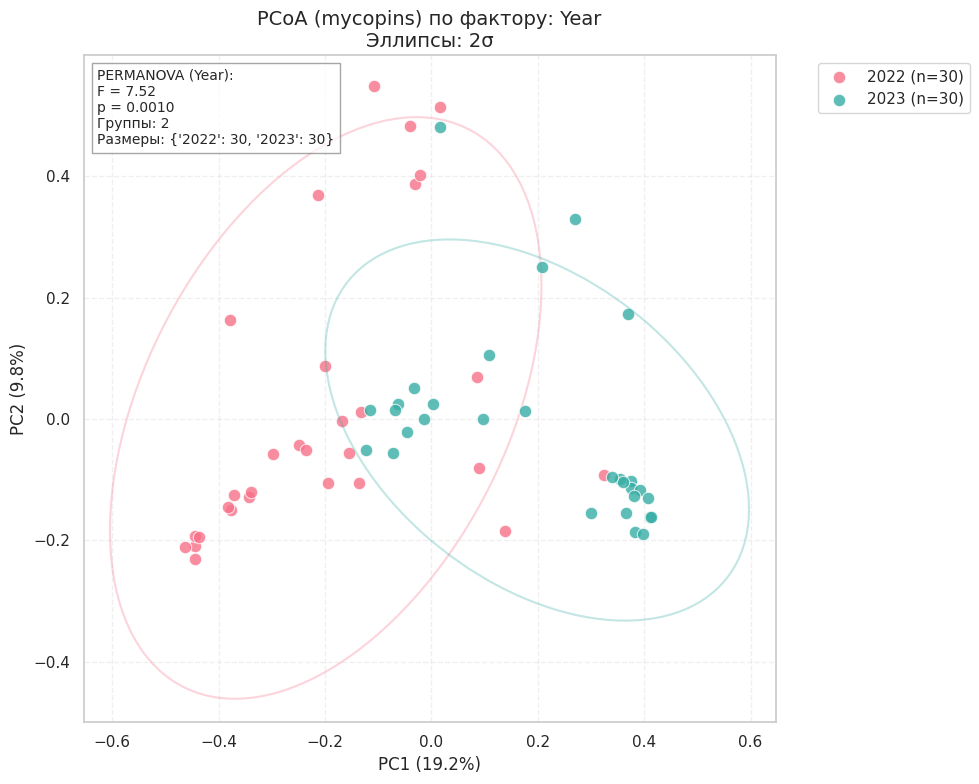


Анализ для фактора: plantHost


/tmp/ipython-input-2793216413.py:141: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-2793216413.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


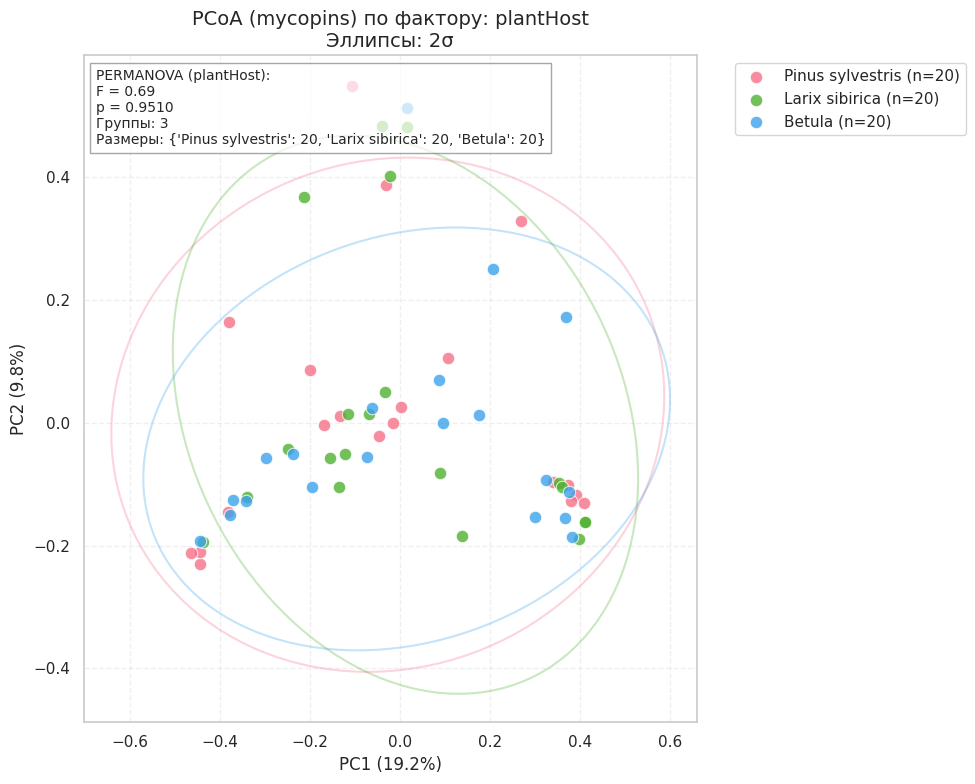


Результаты PERMANOVA сохранены в файл: permanova_stats_mycopins.csv
  Substrate     Factor   F-value  p-value N_groups  \
0  mycopins     series  2.725600    0.001       14   
1  mycopins       Year  7.515515    0.001        2   
2  mycopins  plantHost  0.694081    0.951        3   

                                         Group_sizes  
0  {'1.0': 6, '2.0': 6, '3.0': 6, '4.0': 6, '5.0'...  
1                           {'2022': 30, '2023': 30}  
2  {'Pinus sylvestris': 20, 'Larix sibirica': 20,...  


In [ ]:
# PCOA and PERMANOVA ANALYSIS FOR mycopins (series, Year, plantHost)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Инициализация глобальной переменной для хранения результатов
if 'permanova_results' not in globals():
    permanova_results = pd.DataFrame(columns=['Substrate', 'Factor', 'F-value', 'p-value', 'N_groups', 'Group_sizes'])

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных
current_substrate = 'mycopins'
print(f"Анализ для субстрата: {current_substrate}")
print("Фильтрация данных...")

filtered_samples = metadata[metadata['substrate'] == current_substrate]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- series: {filtered_metadata['series'].unique()}")
print(f"- Year: {filtered_metadata['Year'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    global permanova_results

    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].astype(str).values
    groups = samples[factor].dropna().unique()
    group_counts = samples[factor].value_counts()

    # Вычисление PERMANOVA
    try:
        if len(group_counts) < 2 or any(group_counts < 3):
            raise ValueError("Слишком мало групп или образцов в группах")

        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )

        # Добавляем результаты в глобальный DataFrame
        new_result = pd.DataFrame({
            'Substrate': [current_substrate],
            'Factor': [factor],
            'F-value': [perm_res['test statistic']],
            'p-value': [perm_res['p-value']],
            'N_groups': [len(groups)],
            'Group_sizes': [str(group_counts.to_dict())]
        })

        permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)

        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}\n"
                     f"Размеры: {group_counts.to_dict()}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"
        print(f"Ошибка для фактора {factor}: {str(e)}")

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)', fontsize=12)
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)', fontsize=12)
    plt.title(f'PCoA ({current_substrate}) по фактору: {factor}\nЭллипсы: {n_std}σ', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
factors_to_analyze = ['series', 'Year', 'plantHost']
for factor in factors_to_analyze:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

# 6. Сохранение результатов PERMANOVA
output_filename = f'permanova_stats_{current_substrate}.csv'
permanova_results[permanova_results['Substrate'] == current_substrate].to_csv(
    output_filename, index=False, float_format='%.5f'
)
print(f"\nРезультаты PERMANOVA сохранены в файл: {output_filename}")
print(permanova_results[permanova_results['Substrate'] == current_substrate])

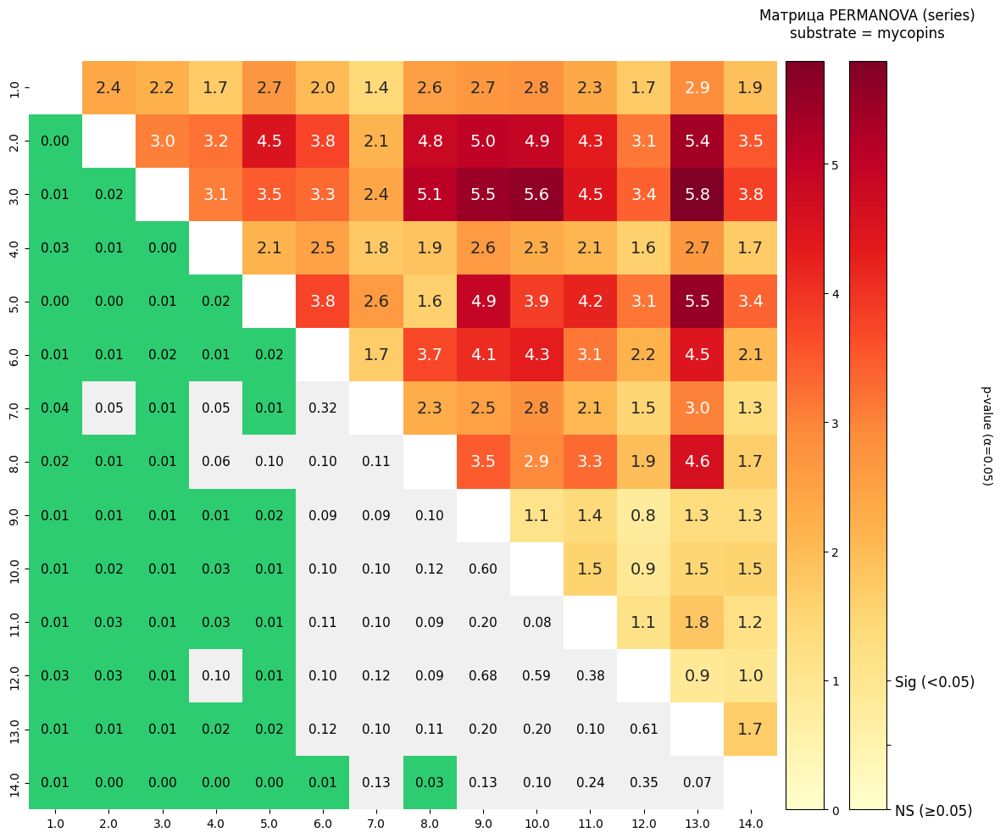

In [ ]:
# Матрица попарных сравнений

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.distance import permanova
from itertools import combinations
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

def build_series_permanova_matrix(bc_dist, metadata, permutations=999, alpha=0.05):
    """
    Строит матрицу PERMANOVA для фактора series с цветовыми шкалами справа

    Parameters:
        bc_dist: матрица расстояний (отфильтрованная по mycopins)
        metadata: метаданные (отфильтрованные)
        permutations: количество перестановок
        alpha: уровень значимости
    """
    # 1. Подготовка данных
    series_values = sorted(metadata['series'].dropna().unique())
    permanova_matrix = pd.DataFrame(np.nan, index=series_values, columns=series_values)

    # 2. Вычисление PERMANOVA для всех пар
    for (i, s1), (j, s2) in combinations(enumerate(series_values), 2):
        ids1 = metadata[metadata['series'] == s1]['SampleID'].tolist()
        ids2 = metadata[metadata['series'] == s2]['SampleID'].tolist()

        if len(ids1) >= 3 and len(ids2) >= 3:
            try:
                subset_dm = bc_dist.filter(ids1 + ids2)
                result = permanova(
                    distance_matrix=subset_dm,
                    grouping=np.array([s1]*len(ids1) + [s2]*len(ids2)),
                    permutations=permutations
                )
                permanova_matrix.loc[s1, s2] = result['test statistic']
                permanova_matrix.loc[s2, s1] = result['p-value']
            except Exception as e:
                print(f"Ошибка {s1} vs {s2}: {str(e)}")

# 3. Визуализация с исправлениями
    plt.figure(figsize=(12, 10))
    ax = plt.gca()

    # Зеленая цветовая карта для p-values
    p_cmap = LinearSegmentedColormap.from_list('p_cmap', ['#f0f0f0', '#2ecc71'])

    # Маски для треугольников
    mask_upper = np.triu(np.ones_like(permanova_matrix, dtype=bool), k=1)
    mask_lower = np.tril(np.ones_like(permanova_matrix, dtype=bool), k=-1)

    # Верхний треугольник - F-значения
    f_plot = sns.heatmap(
        permanova_matrix.where(mask_upper),
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        mask=~mask_upper,
        square=True,
        annot_kws={"size": 14},
        vmin=0,
        cbar=False,
        ax=ax
    )

    # Нижний треугольник - p-values с округлением до 0.01
    p_plot = sns.heatmap(
        (permanova_matrix.where(mask_lower) < alpha).astype(float),
        annot=permanova_matrix.where(mask_lower).round(2),  # Округление до сотых
        fmt=".2f",  # Формат вывода с двумя знаками
        cmap=p_cmap,
        mask=~mask_lower,
        square=True,
        annot_kws={"size": 11, "color": "black"},
        vmin=0,
        vmax=1,
        cbar=False,
        ax=ax
    )

    # Добавляем цветовые шкалы справа
    divider = make_axes_locatable(ax)

    # Шкала для F-значений (красная)
    cax_f = divider.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(f_plot.get_children()[0], cax=cax_f, orientation='vertical')
    cax_f.set_ylabel('F-statistic', rotation=270, labelpad=15)

    # Шкала для p-values (зеленая)
    cax_p = divider.append_axes("right", size="5%", pad=0.3)
    p_colorbar = plt.colorbar(p_plot.get_children()[0], cax=cax_p, orientation='vertical')
    p_colorbar.set_label(f'p-value (α={alpha})', rotation=270, labelpad=15)
    p_colorbar.set_ticks([0, 0.5, 1])
    p_colorbar.set_ticklabels(['NS (≥0.05)', '', 'Sig (<0.05)'])

    # Настройки графика
    plt.title('Матрица PERMANOVA (series)\nsubstrate = mycopins', pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.tight_layout()

    # Сохранение
    plt.savefig('permanova_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    return permanova_matrix

# Пример использования:
if __name__ == "__main__":
    # Фильтрация данных
    filtered_samples = metadata[metadata['substrate'] == 'mycopins']['SampleID']
    filtered_data = normalized_data[filtered_samples]
    filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

    # Расчет матрицы расстояний
    bc_dist = beta_diversity('braycurtis', filtered_data.T,
                           ids=filtered_metadata['SampleID'].tolist())

    # Построение матрицы
    series_matrix = build_series_permanova_matrix(
        bc_dist=bc_dist,
        metadata=filtered_metadata,
        permutations=999,
        alpha=0.05
    )

## ANALYSIS OF THE MYCORRHIZA ROOT COMMUNITY OF TWO TREE SPECIES (MYCORRHIZA)


Анализ для субстрата: mycorrhiza
Фильтрация данных...
Отобрано проб: 40
Доступные факторы для анализа:
- season: ['spring' 'autumn']
- locality: ['Mukhrino' 'Shapsha']
- plantHost: ['Pinus sylvestris' 'Pinus sibirica']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: season


/usr/local/lib/python3.11/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.0621951409758397 whereas the largest positive one is 2.2371777138291318.
  warn(
/tmp/ipython-input-21-4153670184.py:145: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-21-4153670184.py:146: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_e

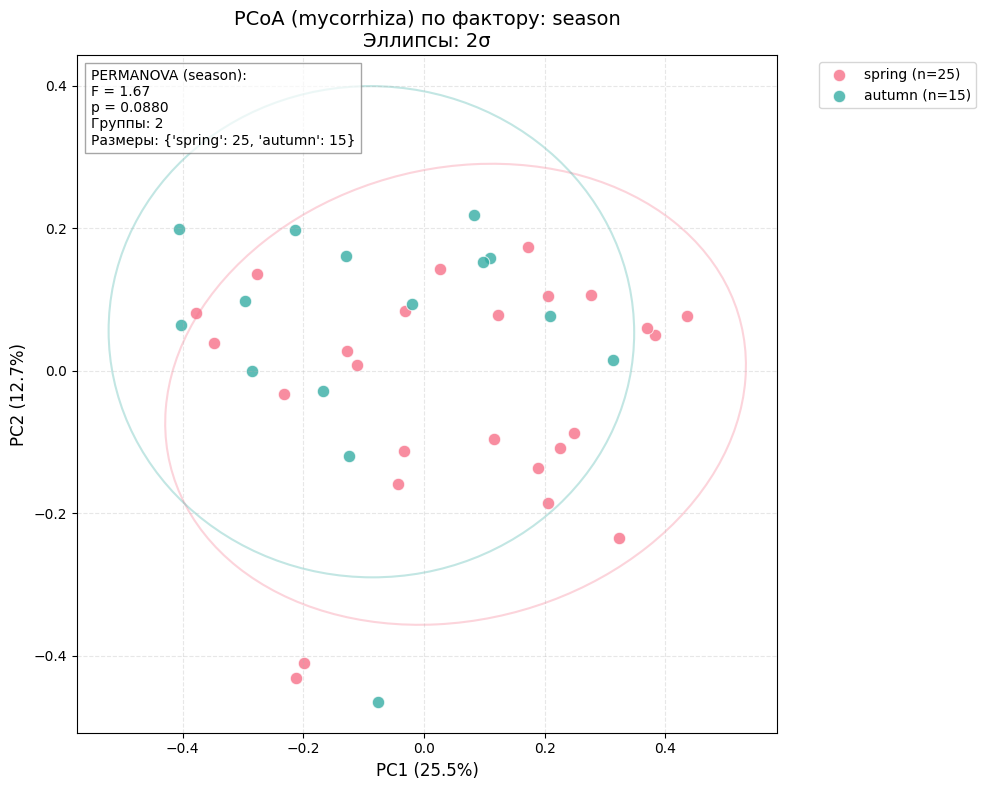


Анализ для фактора: locality


/tmp/ipython-input-21-4153670184.py:145: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-21-4153670184.py:146: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


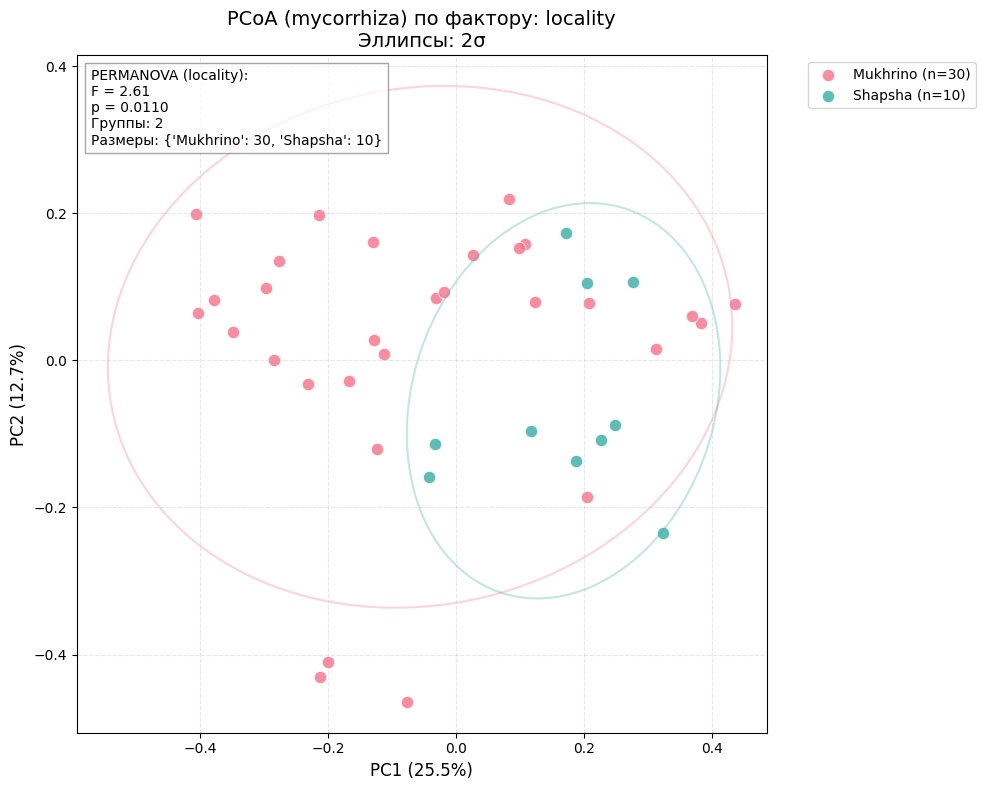


Анализ для фактора: plantHost


/tmp/ipython-input-21-4153670184.py:145: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-21-4153670184.py:146: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


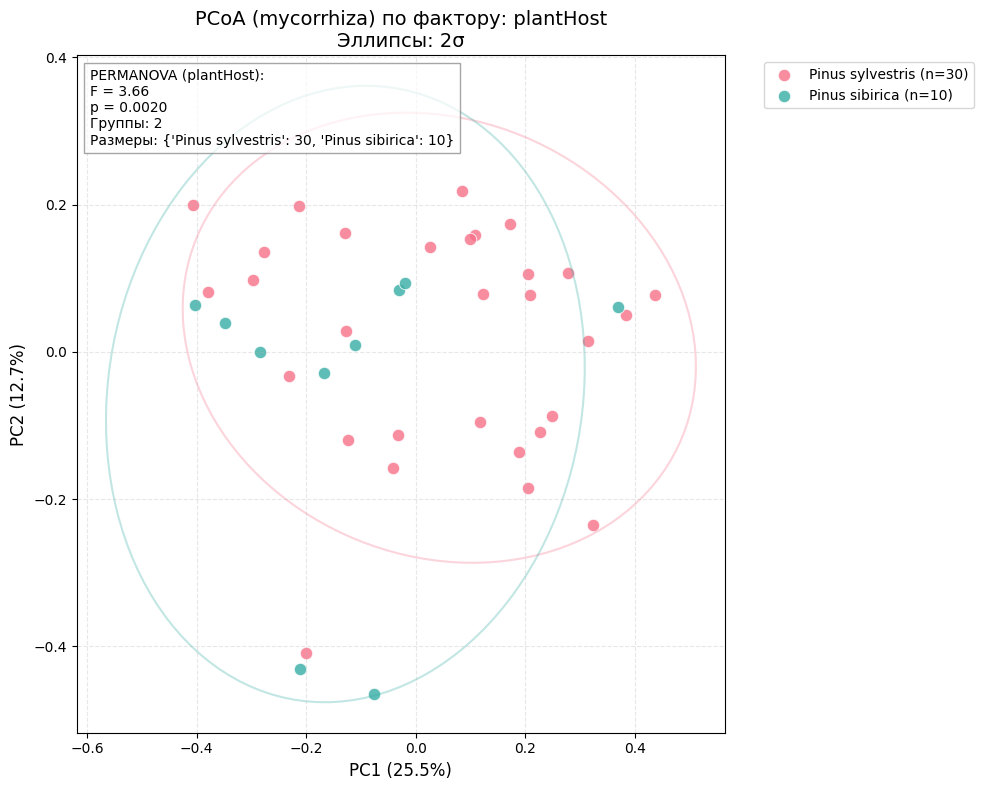


Результаты PERMANOVA сохранены в файл: permanova_stats_mycorrhiza.csv
    Substrate     Factor   F-value  p-value N_groups  \
3  mycorrhiza     season  1.672410    0.088        2   
4  mycorrhiza   locality  2.607938    0.011        2   
5  mycorrhiza  plantHost  3.656505    0.002        2   

                                      Group_sizes  
3                    {'spring': 25, 'autumn': 15}  
4                 {'Mukhrino': 30, 'Shapsha': 10}  
5  {'Pinus sylvestris': 30, 'Pinus sibirica': 10}  


In [ ]:
# АНАЛИЗ PCoA и PERMANOVA ДЛЯ СУБСТРАТА mycorrhiza
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Инициализация глобальной переменной для хранения результатов
if 'permanova_results' not in globals():
    permanova_results = pd.DataFrame(columns=['Substrate', 'Factor', 'F-value', 'p-value', 'N_groups'])

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных
current_substrate = 'mycorrhiza'
print(f"Анализ для субстрата: {current_substrate}")
print("Фильтрация данных...")

# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, season, locality, plantHost

filtered_samples = metadata[metadata['substrate'] == current_substrate]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- season: {filtered_metadata['season'].unique()}")
print(f"- locality: {filtered_metadata['locality'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    global permanova_results

    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].astype(str).values
    groups = samples[factor].dropna().unique()
    group_counts = samples[factor].value_counts()

    # Вычисление PERMANOVA
    try:
        if len(group_counts) < 2 or any(group_counts < 3):
            raise ValueError("Слишком мало групп или образцов в группах")

        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )

        # Добавляем результаты в глобальный DataFrame
        new_result = pd.DataFrame({
            'Substrate': [current_substrate],
            'Factor': [factor],
            'F-value': [perm_res['test statistic']],
            'p-value': [perm_res['p-value']],
            'N_groups': [len(groups)],
            'Group_sizes': [str(group_counts.to_dict())]
        })

        permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)

        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}\n"
                     f"Размеры: {group_counts.to_dict()}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"
        print(f"Ошибка для фактора {factor}: {str(e)}")

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)', fontsize=12)
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)', fontsize=12)
    plt.title(f'PCoA ({current_substrate}) по фактору: {factor}\nЭллипсы: {n_std}σ', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
factors_to_analyze = ['season', 'locality', 'plantHost']
for factor in factors_to_analyze:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

# 6. Сохранение результатов PERMANOVA
output_filename = f'permanova_stats_{current_substrate}.csv'
permanova_results[permanova_results['Substrate'] == current_substrate].to_csv(
    output_filename, index=False, float_format='%.5f'
)
print(f"\nРезультаты PERMANOVA сохранены в файл: {output_filename}")
print(permanova_results[permanova_results['Substrate'] == current_substrate])

Фильтрация данных...
Отобрано проб: 30
Доступные факторы для анализа:
- season: ['spring' 'autumn']
- locality: ['Mukhrino' 'Shapsha']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: season


/usr/local/lib/python3.11/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.04779615510617611 whereas the largest positive one is 1.703088965525191.
  warn(
/tmp/ipython-input-22-3426581497.py:119: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-22-3426581497.py:120: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_e

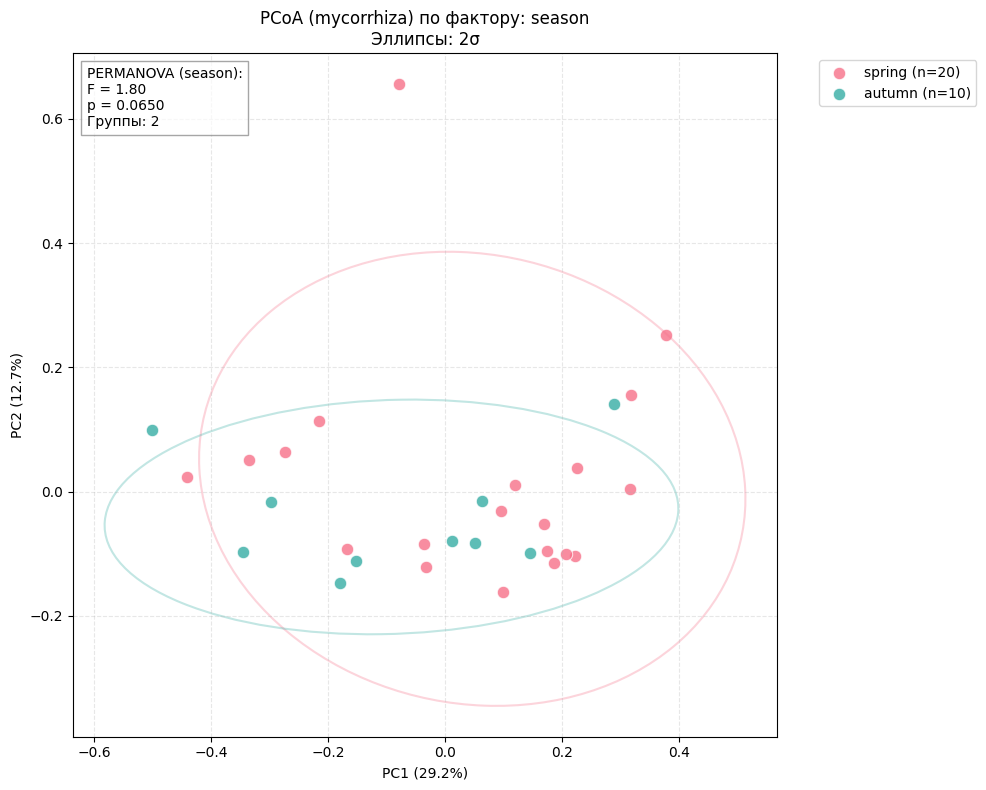


Анализ для фактора: locality


/tmp/ipython-input-22-3426581497.py:119: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-22-3426581497.py:120: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


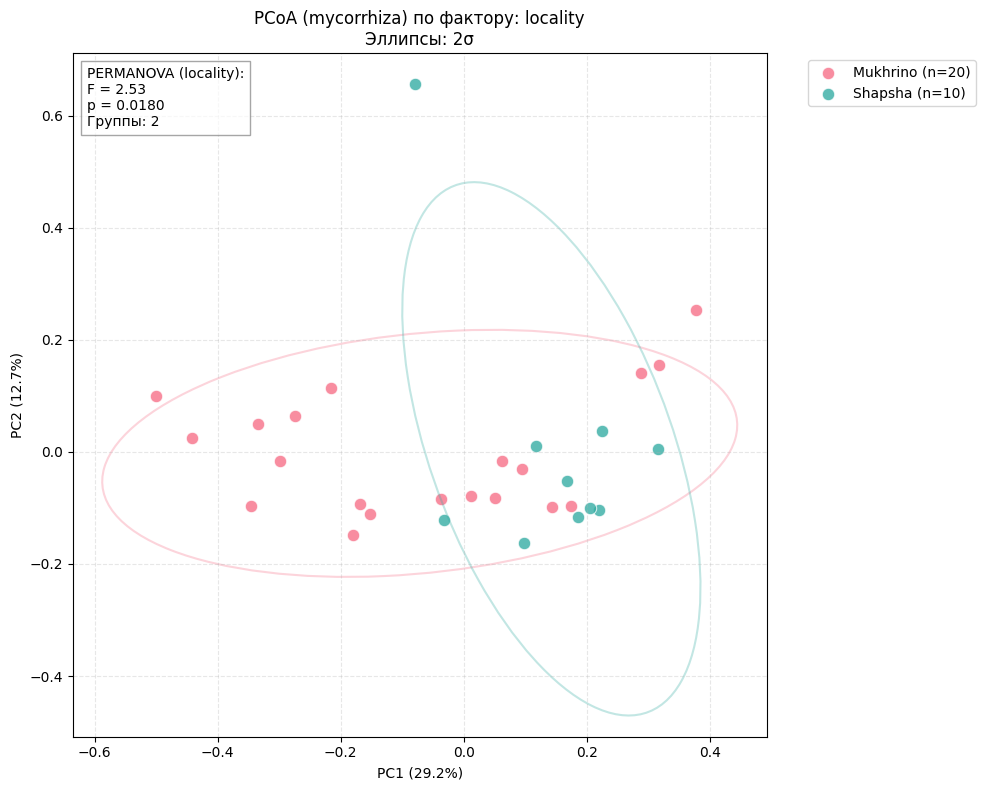

In [ ]:
# То же самое, без учета кедра (он был только на Мухрино и мешает сравнивать локалитет)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'mycorrhiza') &
    (metadata['plantHost'] == 'Pinus sylvestris')
]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- season: {filtered_metadata['season'].unique()}")
print(f"- locality: {filtered_metadata['locality'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['season', 'locality']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

Фильтрация данных...
Отобрано проб: 30
Доступные факторы для анализа:
- season: ['spring' 'autumn']
- locality: ['Mukhrino']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: season


/usr/local/lib/python3.11/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.0497184980480918 whereas the largest positive one is 1.7727575347781772.
  warn(
/tmp/ipython-input-23-2848862322.py:119: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-23-2848862322.py:120: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_e

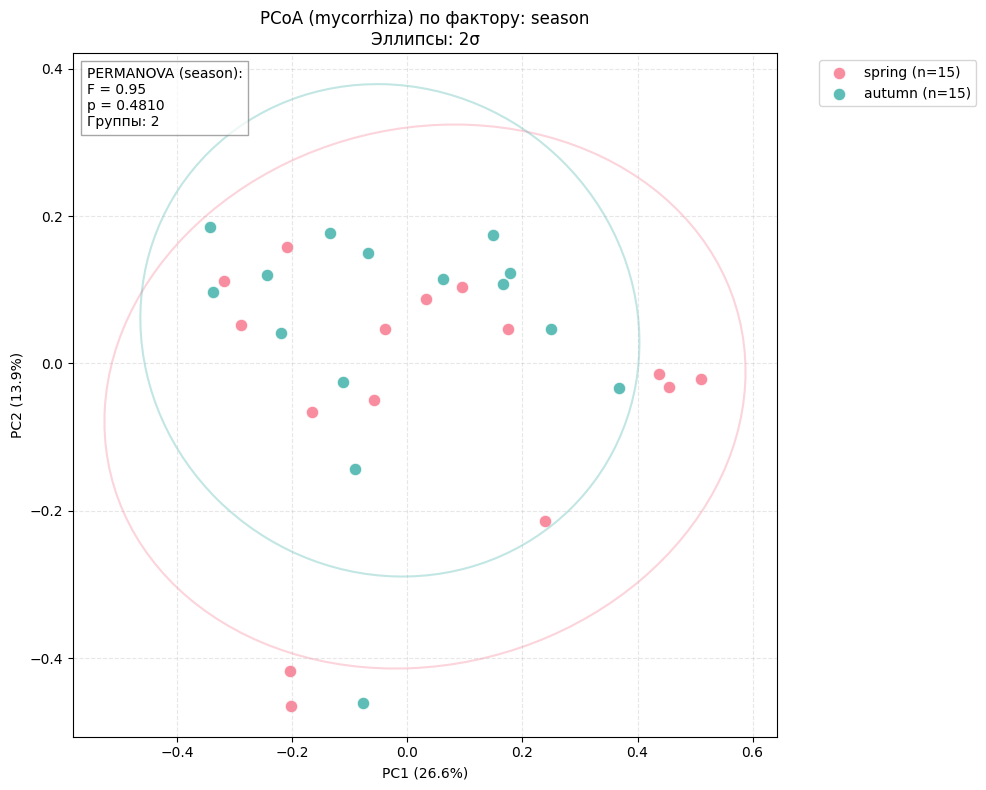


Анализ для фактора: plantHost


/tmp/ipython-input-23-2848862322.py:119: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-23-2848862322.py:120: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


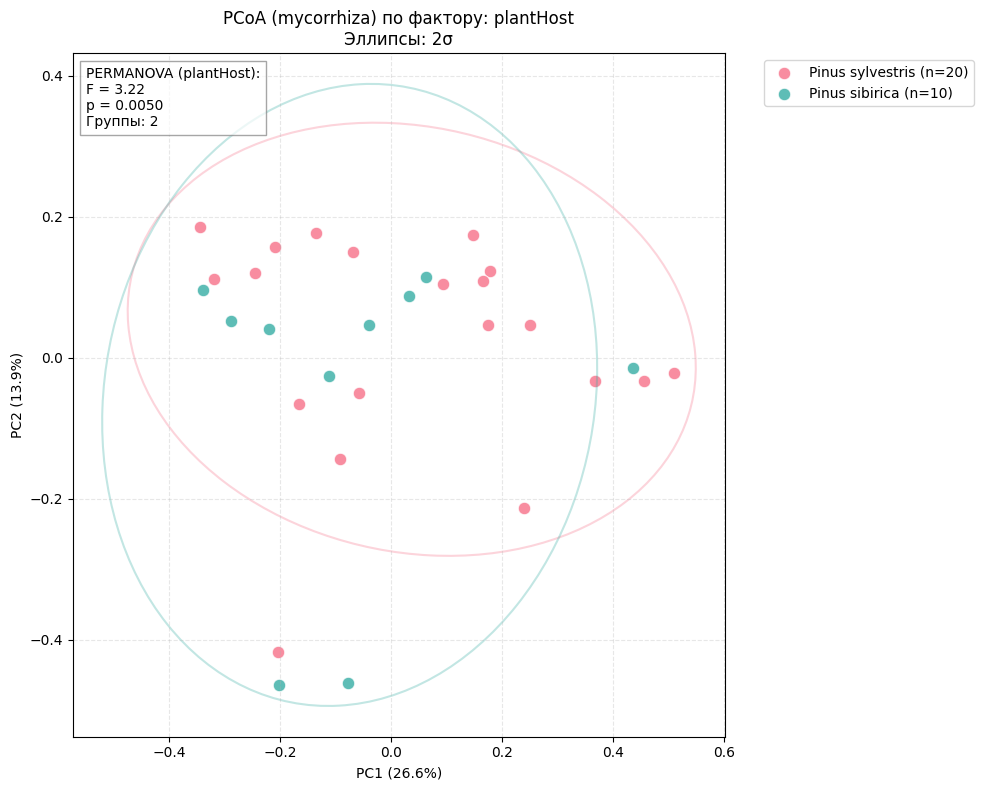

In [ ]:
# То же самое, без учета Шапши
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'mycorrhiza') &
    (metadata['locality'] == 'Mukhrino')
]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- season: {filtered_metadata['season'].unique()}")
print(f"- locality: {filtered_metadata['locality'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['season', 'plantHost']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

Фильтрация данных...
Отобрано проб: 10
Доступные факторы для анализа:
- conservation: ['Freeze drying' 'Freezing']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: conservation


/usr/local/lib/python3.11/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.006306988226426065 whereas the largest positive one is 0.6251312632961513.
  warn(
/tmp/ipython-input-24-3727657137.py:121: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-24-3727657137.py:122: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion

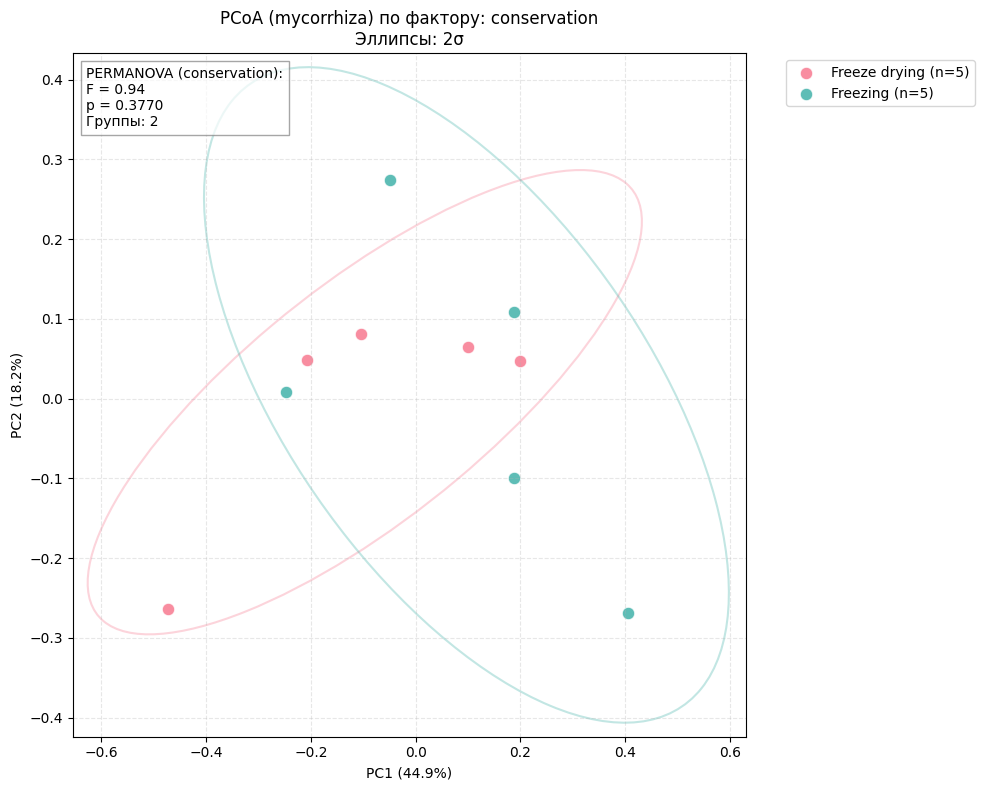

In [ ]:
#  Влияние консервации на сообщество

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'mycorrhiza') &
    (metadata['plantHost'] == 'Pinus sylvestris') &
    (metadata['season'] == 'autumn')
]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- conservation: {filtered_metadata['conservation'].unique()}")


# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['conservation']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

## ANALYSIS OF ANAEROBIC PEAT COMMUNITY FROM -1.5 TO 5 M DEPTH (PEATSTRA)


Анализ для субстрата: peatstrat
Фильтрация данных...
Отобрано проб: 36
Доступные факторы для анализа:
- depth: ['-790' '-770' '-735' '-730' '-685' '-650' '-635' '-625' '-550' '-450'
 '-390' '-370' '-365' '-350' '-325' '-270' '-250' '-150']
- habitat: ['Sphagnum lawn' 'Treed bog']
- depthModified: [4. 3. 2. 1.]

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: habitat


/tmp/ipython-input-25-2174080152.py:141: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-25-2174080152.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


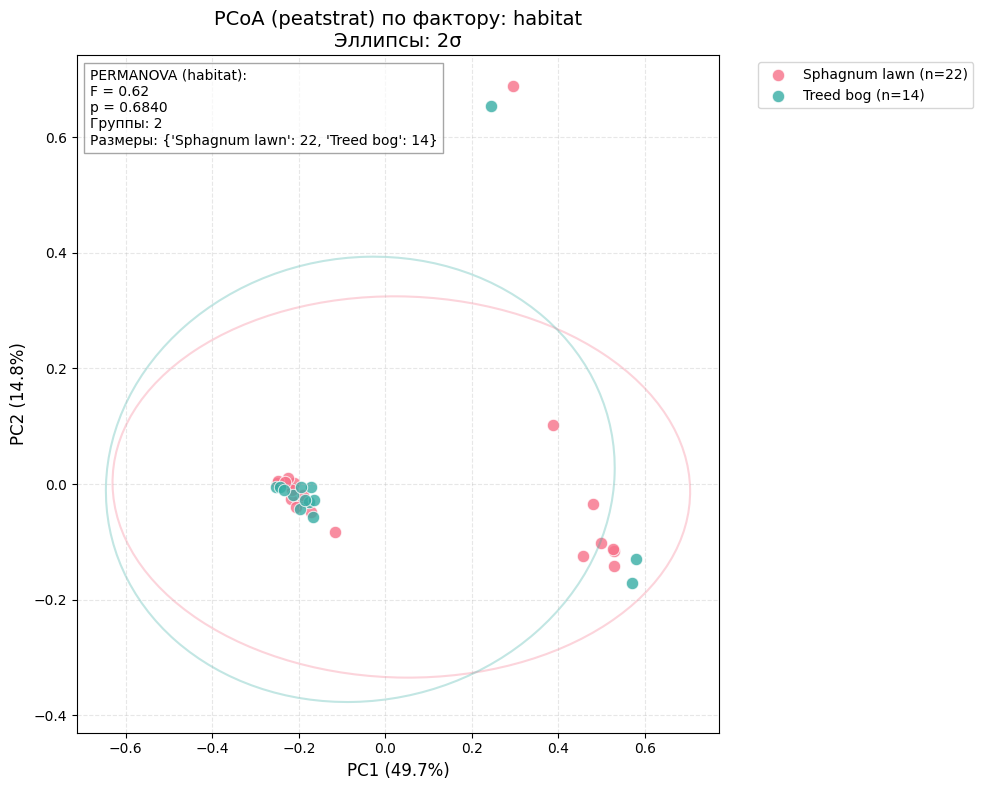


Анализ для фактора: depth
Ошибка для фактора depth: Слишком мало групп или образцов в группах


/tmp/ipython-input-25-2174080152.py:141: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-25-2174080152.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


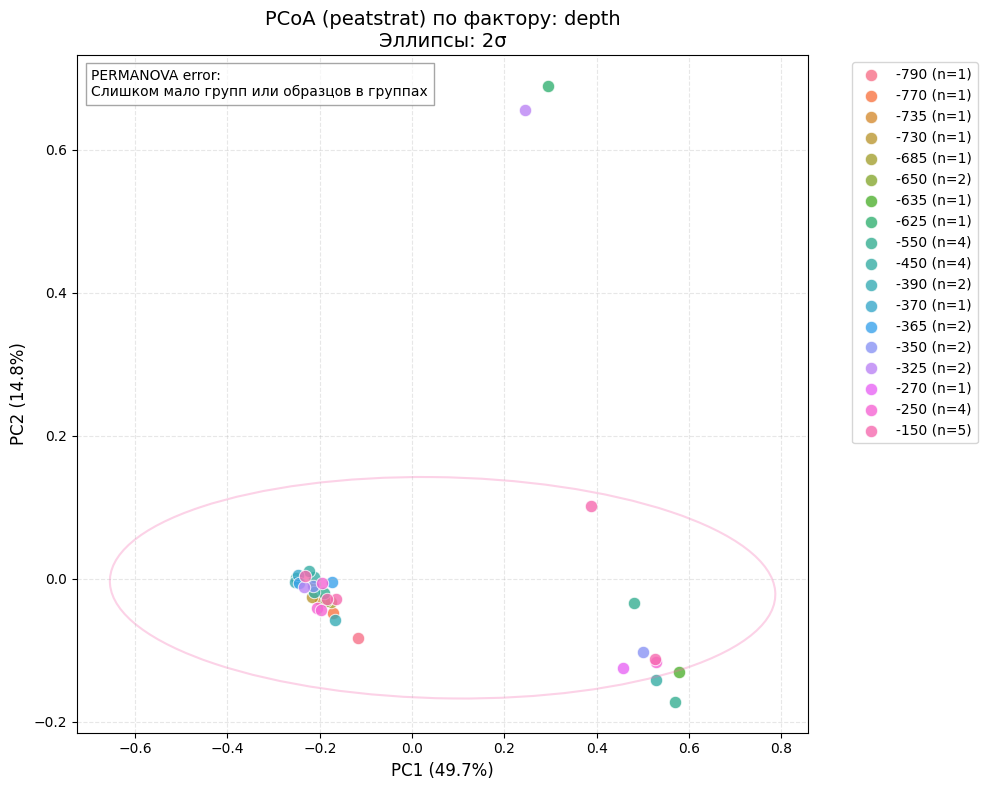


Анализ для фактора: depthModified


/tmp/ipython-input-25-2174080152.py:141: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-25-2174080152.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


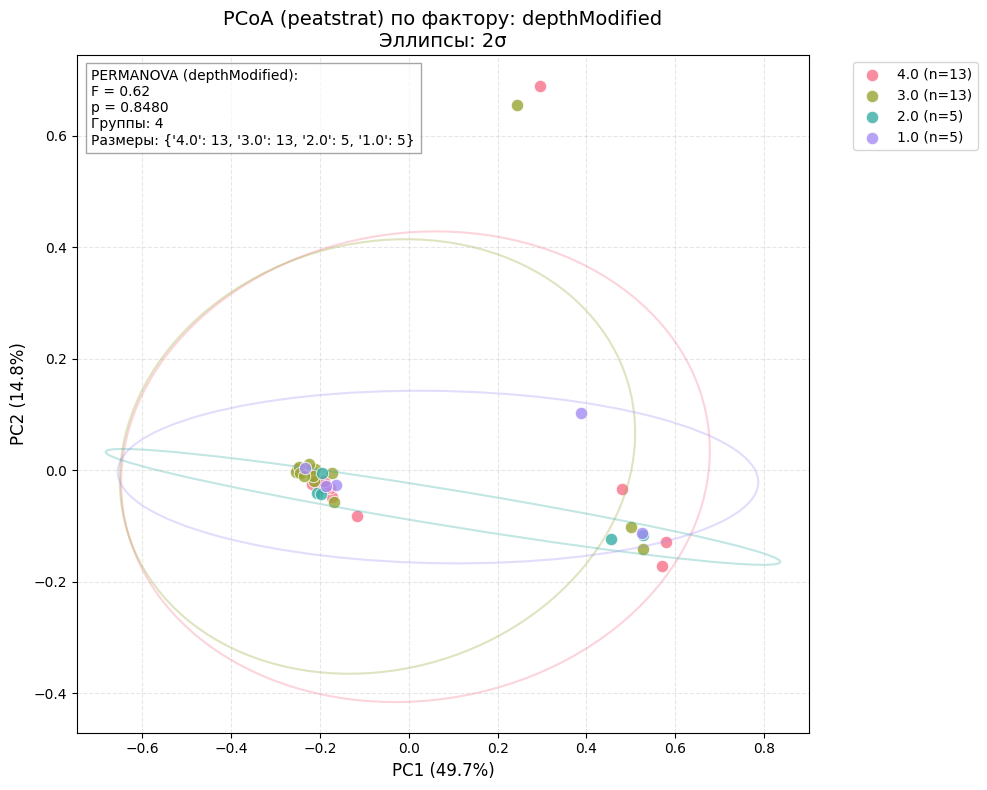


Результаты PERMANOVA сохранены в файл: permanova_stats_peatstrat.csv
   Substrate         Factor   F-value  p-value N_groups  \
6  peatstrat        habitat  0.615728    0.684        2   
7  peatstrat  depthModified  0.620870    0.848        4   

                                  Group_sizes  
6      {'Sphagnum lawn': 22, 'Treed bog': 14}  
7  {'4.0': 13, '3.0': 13, '2.0': 5, '1.0': 5}  


In [ ]:
# Анализ PCoA и PERMANOVA для субстрата peatstrat (habitat, depth, depthModified)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Инициализация глобальной переменной для хранения результатов
if 'permanova_results' not in globals():
    permanova_results = pd.DataFrame(columns=['Substrate', 'Factor', 'F-value', 'p-value', 'N_groups', 'Group_sizes'])

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных
current_substrate = 'peatstrat'
print(f"Анализ для субстрата: {current_substrate}")
print("Фильтрация данных...")

filtered_samples = metadata[metadata['substrate'] == current_substrate]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- depth: {filtered_metadata['depth'].unique()}")
print(f"- habitat: {filtered_metadata['habitat'].unique()}")
print(f"- depthModified: {filtered_metadata['depthModified'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    global permanova_results

    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].astype(str).values
    groups = samples[factor].dropna().unique()
    group_counts = samples[factor].value_counts()

    # Вычисление PERMANOVA
    try:
        if len(group_counts) < 2 or any(group_counts < 3):
            raise ValueError("Слишком мало групп или образцов в группах")

        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )

        # Добавляем результаты в глобальный DataFrame
        new_result = pd.DataFrame({
            'Substrate': [current_substrate],
            'Factor': [factor],
            'F-value': [perm_res['test statistic']],
            'p-value': [perm_res['p-value']],
            'N_groups': [len(groups)],
            'Group_sizes': [str(group_counts.to_dict())]
        })

        permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)

        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}\n"
                     f"Размеры: {group_counts.to_dict()}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"
        print(f"Ошибка для фактора {factor}: {str(e)}")

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)', fontsize=12)
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)', fontsize=12)
    plt.title(f'PCoA ({current_substrate}) по фактору: {factor}\nЭллипсы: {n_std}σ', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
factors_to_analyze = ['habitat', 'depth', 'depthModified']
for factor in factors_to_analyze:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

# 6. Сохранение результатов PERMANOVA
output_filename = f'permanova_stats_{current_substrate}.csv'
permanova_results[permanova_results['Substrate'] == current_substrate].to_csv(
    output_filename, index=False, float_format='%.5f'
)
print(f"\nРезультаты PERMANOVA сохранены в файл: {output_filename}")
print(permanova_results[permanova_results['Substrate'] == current_substrate])

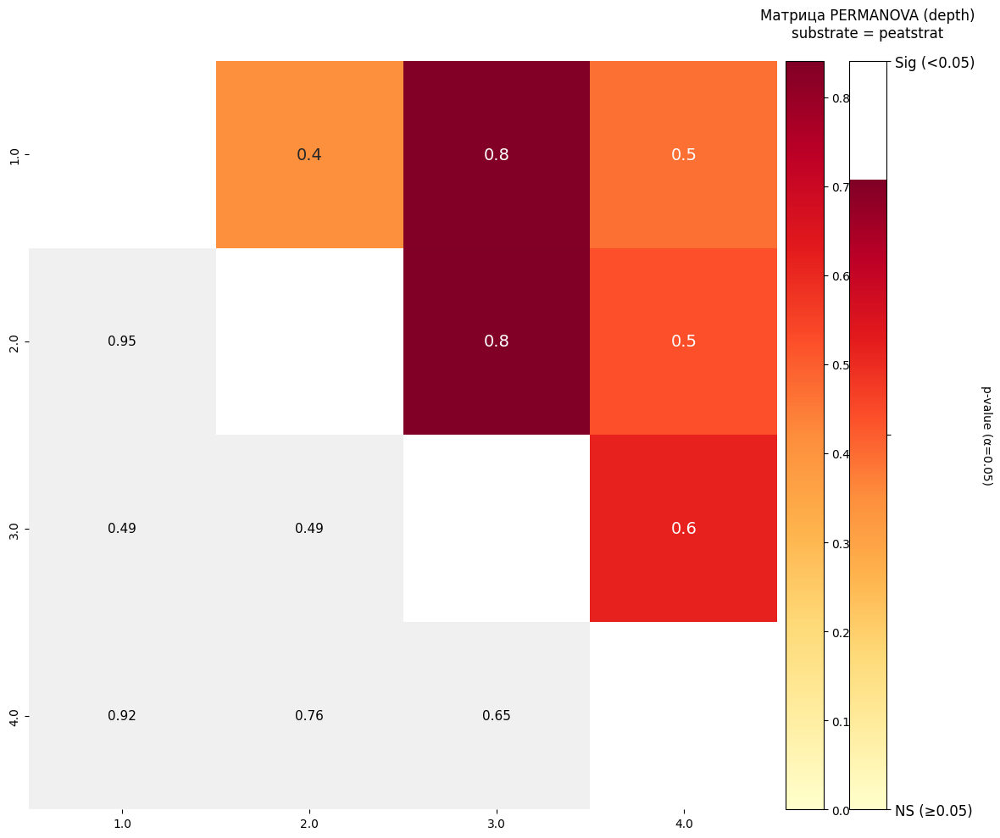

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.distance import permanova
from itertools import combinations
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

def build_depth_permanova_matrix(bc_dist, metadata, permutations=999, alpha=0.05):
    """
    Строит матрицу PERMANOVA для фактора series с цветовыми шкалами справа

    Parameters:
        bc_dist: матрица расстояний (отфильтрованная по mycopins)
        metadata: метаданные (отфильтрованные)
        permutations: количество перестановок
        alpha: уровень значимости
    """
    # 1. Подготовка данных
    depth_values = sorted(metadata['depthModified'].dropna().unique())
    permanova_matrix = pd.DataFrame(np.nan, index=depth_values, columns=depth_values)

    # 2. Вычисление PERMANOVA для всех пар
    for (i, s1), (j, s2) in combinations(enumerate(depth_values), 2):
        ids1 = metadata[metadata['depthModified'] == s1]['SampleID'].tolist()
        ids2 = metadata[metadata['depthModified'] == s2]['SampleID'].tolist()

        if len(ids1) >= 3 and len(ids2) >= 3:
            try:
                subset_dm = bc_dist.filter(ids1 + ids2)
                result = permanova(
                    distance_matrix=subset_dm,
                    grouping=np.array([s1]*len(ids1) + [s2]*len(ids2)),
                    permutations=permutations
                )
                permanova_matrix.loc[s1, s2] = result['test statistic']
                permanova_matrix.loc[s2, s1] = result['p-value']
            except Exception as e:
                print(f"Ошибка {s1} vs {s2}: {str(e)}")

# 3. Визуализация с исправлениями
    plt.figure(figsize=(12, 10))
    ax = plt.gca()

    # Зеленая цветовая карта для p-values
    p_cmap = LinearSegmentedColormap.from_list('p_cmap', ['#f0f0f0', '#2ecc71'])

    # Маски для треугольников
    mask_upper = np.triu(np.ones_like(permanova_matrix, dtype=bool), k=1)
    mask_lower = np.tril(np.ones_like(permanova_matrix, dtype=bool), k=-1)

    # Верхний треугольник - F-значения
    f_plot = sns.heatmap(
        permanova_matrix.where(mask_upper),
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        mask=~mask_upper,
        square=True,
        annot_kws={"size": 14},
        vmin=0,
        cbar=False,
        ax=ax
    )

    # Нижний треугольник - p-values с округлением до 0.01
    p_plot = sns.heatmap(
        (permanova_matrix.where(mask_lower) < alpha).astype(float),
        annot=permanova_matrix.where(mask_lower).round(2),  # Округление до сотых
        fmt=".2f",  # Формат вывода с двумя знаками
        cmap=p_cmap,
        mask=~mask_lower,
        square=True,
        annot_kws={"size": 11, "color": "black"},
        vmin=0,
        vmax=1,
        cbar=False,
        ax=ax
    )

    # Добавляем цветовые шкалы справа
    divider = make_axes_locatable(ax)

    # Шкала для F-значений (красная)
    cax_f = divider.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(f_plot.get_children()[0], cax=cax_f, orientation='vertical')
    cax_f.set_ylabel('F-statistic', rotation=270, labelpad=15)

    # Шкала для p-values (зеленая)
    cax_p = divider.append_axes("right", size="5%", pad=0.3)
    p_colorbar = plt.colorbar(p_plot.get_children()[0], cax=cax_p, orientation='vertical')
    p_colorbar.set_label(f'p-value (α={alpha})', rotation=270, labelpad=15)
    p_colorbar.set_ticks([0, 0.5, 1])
    p_colorbar.set_ticklabels(['NS (≥0.05)', '', 'Sig (<0.05)'])

    # Настройки графика
    plt.title('Матрица PERMANOVA (depth)\nsubstrate = peatstrat', pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.tight_layout()

    # Сохранение
    plt.savefig('permanova_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    return permanova_matrix

# Пример использования:
if __name__ == "__main__":
    # Фильтрация данных
    filtered_samples = metadata[metadata['substrate'] == 'peatstrat']['SampleID']
    filtered_data = normalized_data[filtered_samples]
    filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

    # Расчет матрицы расстояний
    bc_dist = beta_diversity('braycurtis', filtered_data.T,
                           ids=filtered_metadata['SampleID'].tolist())

    # Построение матрицы
    series_matrix = build_depth_permanova_matrix(
        bc_dist=bc_dist,
        metadata=filtered_metadata,
        permutations=999,
        alpha=0.05
    )

## ANALYSIS OF AEROBIC PEAT COMMUNITY FROM 0 TO -30 CM DEPTH (PEATUPPER)


Анализ для субстрата: peatupper
Фильтрация данных...
Отобрано проб: 46
Доступные факторы для анализа:
- month: [8. 5. 7. 9.]
- habitat: ['Sphagnum lawn' 'Treed bog']
- depth: ['- 0-2 cm' '- 10-15 cm' '- 2-5 cm' '- 25-30 cm']
- plantHost: ['Sphagnum jensenii' 'Sphagnum fuscum' 'Sphagnum angustifolium'
 'Sphagnum magellanicum' 'Sphagnum papillosum' 'Sphagnum balticum']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: habitat


/tmp/ipython-input-27-2906958485.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-27-2906958485.py:143: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


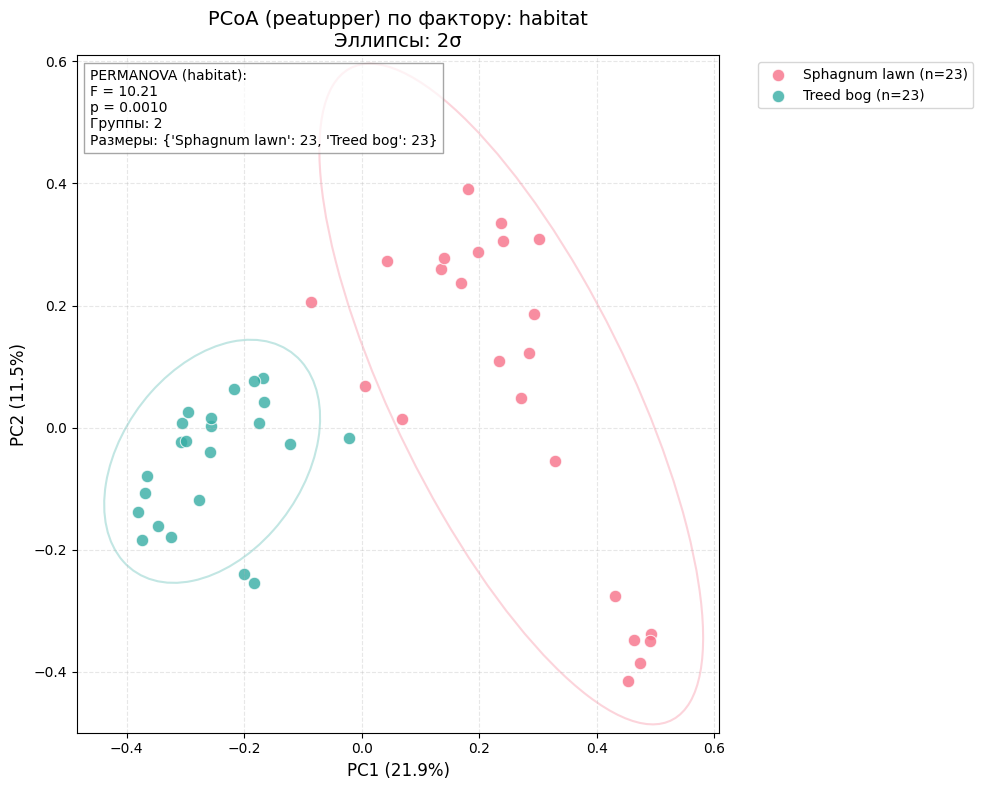


Анализ для фактора: depth


/tmp/ipython-input-27-2906958485.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-27-2906958485.py:143: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


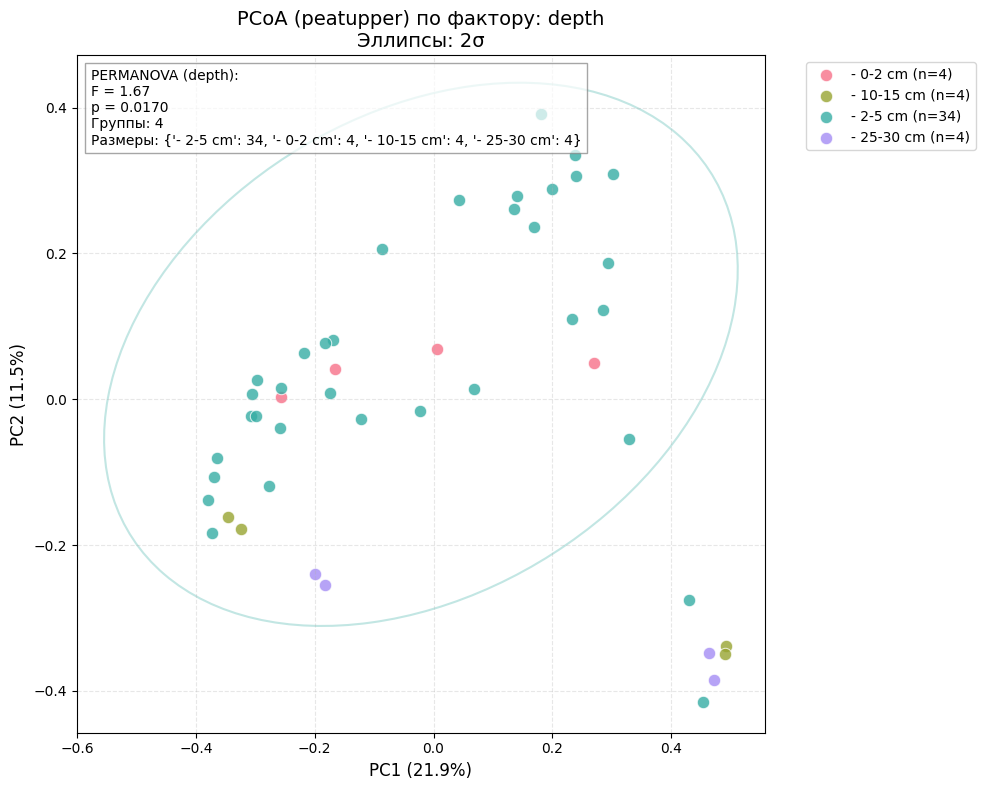


Анализ для фактора: month


/tmp/ipython-input-27-2906958485.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-27-2906958485.py:143: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


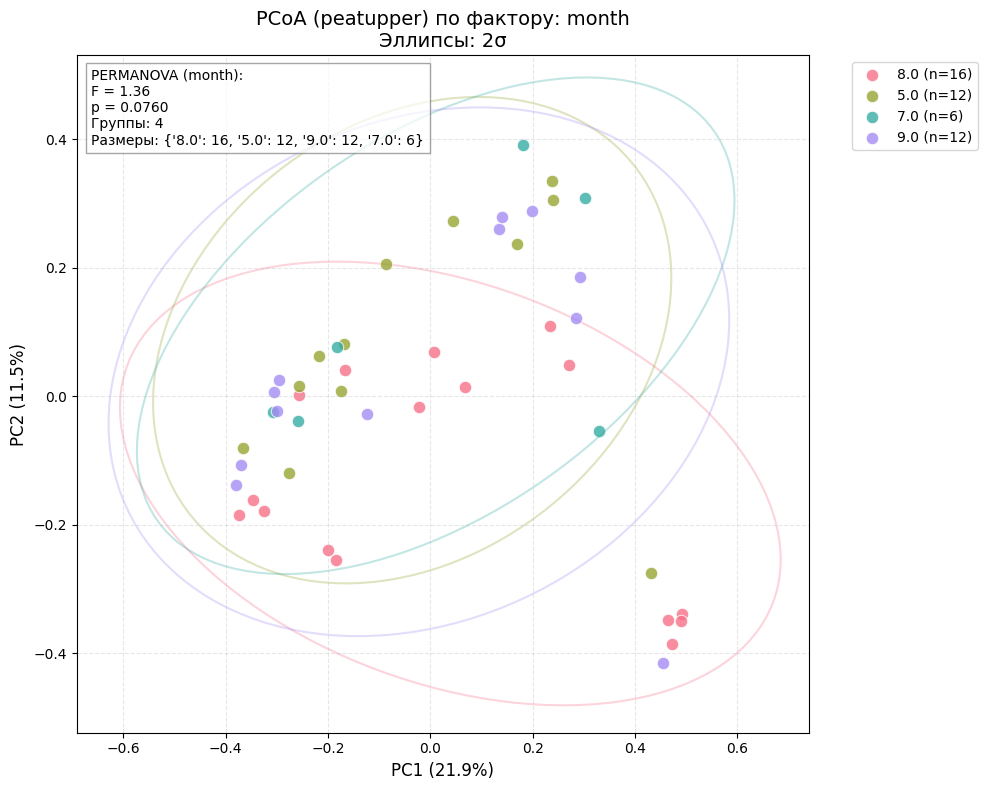


Анализ для фактора: plantHost


/tmp/ipython-input-27-2906958485.py:142: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-27-2906958485.py:143: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


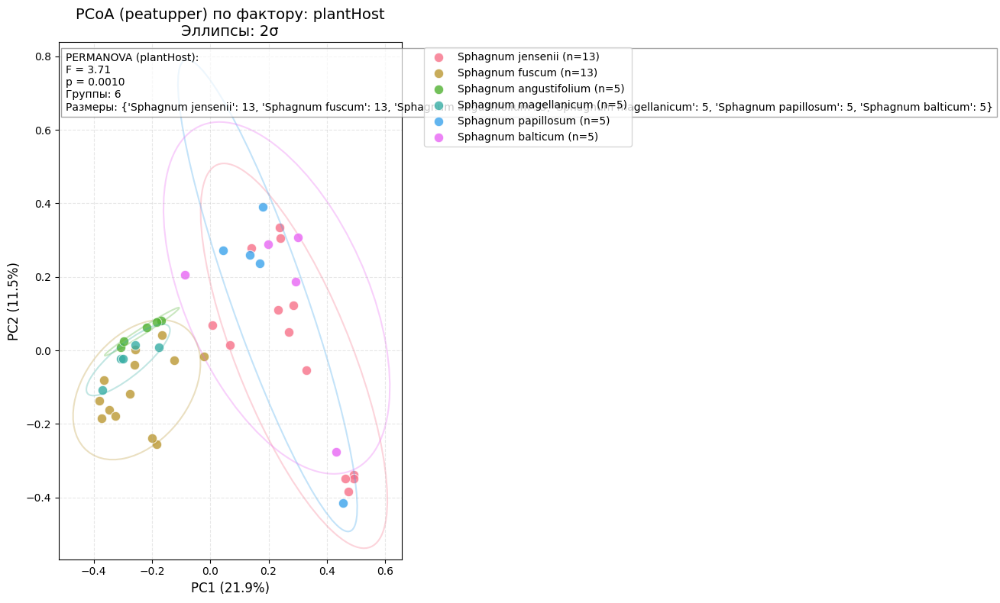


Результаты PERMANOVA сохранены в файл: permanova_stats_peatupper.csv
    Substrate     Factor    F-value  p-value N_groups  \
8   peatupper    habitat  10.210709    0.001        2   
9   peatupper      depth   1.670287    0.017        4   
10  peatupper      month   1.357181    0.076        4   
11  peatupper  plantHost   3.713403    0.001        6   

                                          Group_sizes  
8              {'Sphagnum lawn': 23, 'Treed bog': 23}  
9   {'- 2-5 cm': 34, '- 0-2 cm': 4, '- 10-15 cm': ...  
10        {'8.0': 16, '5.0': 12, '9.0': 12, '7.0': 6}  
11  {'Sphagnum jensenii': 13, 'Sphagnum fuscum': 1...  


In [ ]:
# Анализ PCoA и PERMANOVA для субстрата peatupper (habitat, depth, month, plantHost)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Инициализация глобальной переменной для хранения результатов
if 'permanova_results' not in globals():
    permanova_results = pd.DataFrame(columns=['Substrate', 'Factor', 'F-value', 'p-value', 'N_groups', 'Group_sizes'])

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных
current_substrate = 'peatupper'
print(f"Анализ для субстрата: {current_substrate}")
print("Фильтрация данных...")

filtered_samples = metadata[metadata['substrate'] == current_substrate]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- month: {filtered_metadata['month'].unique()}")
print(f"- habitat: {filtered_metadata['habitat'].unique()}")
print(f"- depth: {filtered_metadata['depth'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    global permanova_results

    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].astype(str).values
    groups = samples[factor].dropna().unique()
    group_counts = samples[factor].value_counts()

    # Вычисление PERMANOVA
    try:
        if len(group_counts) < 2 or any(group_counts < 3):
            raise ValueError("Слишком мало групп или образцов в группах")

        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )

        # Добавляем результаты в глобальный DataFrame
        new_result = pd.DataFrame({
            'Substrate': [current_substrate],
            'Factor': [factor],
            'F-value': [perm_res['test statistic']],
            'p-value': [perm_res['p-value']],
            'N_groups': [len(groups)],
            'Group_sizes': [str(group_counts.to_dict())]
        })

        permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)

        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}\n"
                     f"Размеры: {group_counts.to_dict()}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"
        print(f"Ошибка для фактора {factor}: {str(e)}")

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)', fontsize=12)
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)', fontsize=12)
    plt.title(f'PCoA ({current_substrate}) по фактору: {factor}\nЭллипсы: {n_std}σ', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
factors_to_analyze = ['habitat', 'depth', 'month', 'plantHost']
for factor in factors_to_analyze:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

# 6. Сохранение результатов PERMANOVA
output_filename = f'permanova_stats_{current_substrate}.csv'
permanova_results[permanova_results['Substrate'] == current_substrate].to_csv(
    output_filename, index=False, float_format='%.5f'
)
print(f"\nРезультаты PERMANOVA сохранены в файл: {output_filename}")
print(permanova_results[permanova_results['Substrate'] == current_substrate])

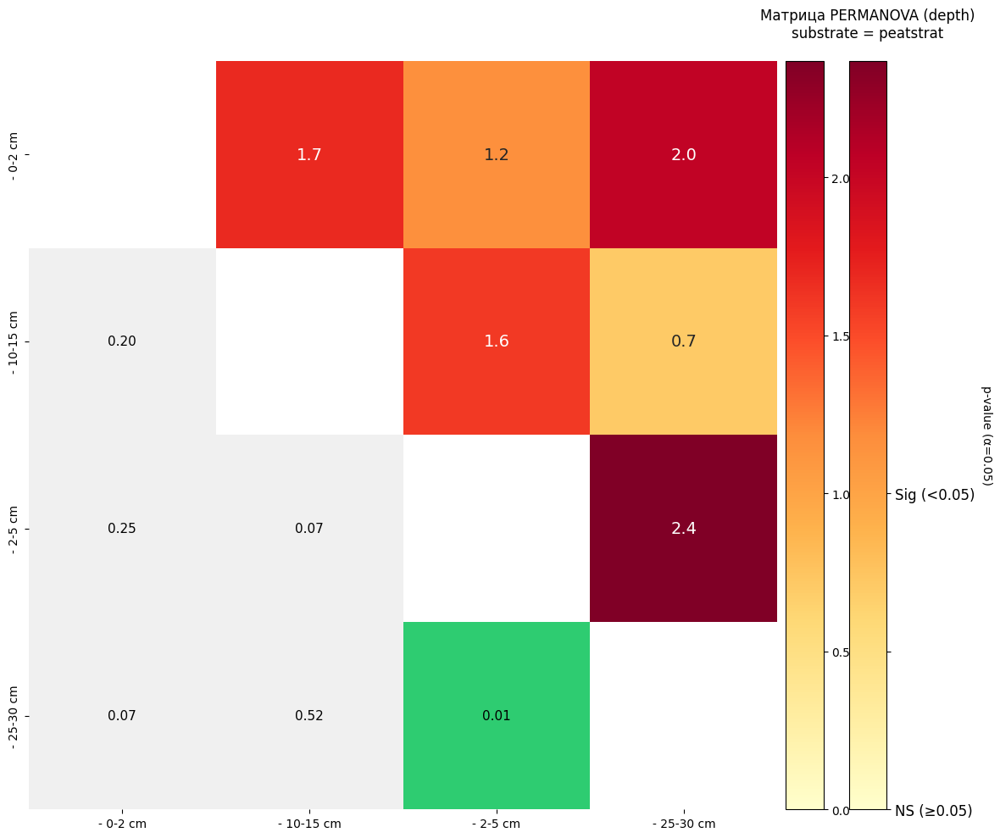

In [ ]:
# Матрица сходства для depth

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.distance import permanova
from itertools import combinations
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

def build_depth_permanova_matrix(bc_dist, metadata, permutations=999, alpha=0.05):
    """
    Строит матрицу PERMANOVA для фактора series с цветовыми шкалами справа

    Parameters:
        bc_dist: матрица расстояний (отфильтрованная по mycopins)
        metadata: метаданные (отфильтрованные)
        permutations: количество перестановок
        alpha: уровень значимости
    """
    # 1. Подготовка данных
    depth_values = sorted(metadata['depth'].dropna().unique())
    permanova_matrix = pd.DataFrame(np.nan, index=depth_values, columns=depth_values)

    # 2. Вычисление PERMANOVA для всех пар
    for (i, s1), (j, s2) in combinations(enumerate(depth_values), 2):
        ids1 = metadata[metadata['depth'] == s1]['SampleID'].tolist()
        ids2 = metadata[metadata['depth'] == s2]['SampleID'].tolist()

        if len(ids1) >= 3 and len(ids2) >= 3:
            try:
                subset_dm = bc_dist.filter(ids1 + ids2)
                result = permanova(
                    distance_matrix=subset_dm,
                    grouping=np.array([s1]*len(ids1) + [s2]*len(ids2)),
                    permutations=permutations
                )
                permanova_matrix.loc[s1, s2] = result['test statistic']
                permanova_matrix.loc[s2, s1] = result['p-value']
            except Exception as e:
                print(f"Ошибка {s1} vs {s2}: {str(e)}")

# 3. Визуализация с исправлениями
    plt.figure(figsize=(12, 10))
    ax = plt.gca()

    # Зеленая цветовая карта для p-values
    p_cmap = LinearSegmentedColormap.from_list('p_cmap', ['#f0f0f0', '#2ecc71'])

    # Маски для треугольников
    mask_upper = np.triu(np.ones_like(permanova_matrix, dtype=bool), k=1)
    mask_lower = np.tril(np.ones_like(permanova_matrix, dtype=bool), k=-1)

    # Верхний треугольник - F-значения
    f_plot = sns.heatmap(
        permanova_matrix.where(mask_upper),
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        mask=~mask_upper,
        square=True,
        annot_kws={"size": 14},
        vmin=0,
        cbar=False,
        ax=ax
    )

    # Нижний треугольник - p-values с округлением до 0.01
    p_plot = sns.heatmap(
        (permanova_matrix.where(mask_lower) < alpha).astype(float),
        annot=permanova_matrix.where(mask_lower).round(2),  # Округление до сотых
        fmt=".2f",  # Формат вывода с двумя знаками
        cmap=p_cmap,
        mask=~mask_lower,
        square=True,
        annot_kws={"size": 11, "color": "black"},
        vmin=0,
        vmax=1,
        cbar=False,
        ax=ax
    )

    # Добавляем цветовые шкалы справа
    divider = make_axes_locatable(ax)

    # Шкала для F-значений (красная)
    cax_f = divider.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(f_plot.get_children()[0], cax=cax_f, orientation='vertical')
    cax_f.set_ylabel('F-statistic', rotation=270, labelpad=15)

    # Шкала для p-values (зеленая)
    cax_p = divider.append_axes("right", size="5%", pad=0.3)
    p_colorbar = plt.colorbar(p_plot.get_children()[0], cax=cax_p, orientation='vertical')
    p_colorbar.set_label(f'p-value (α={alpha})', rotation=270, labelpad=15)
    p_colorbar.set_ticks([0, 0.5, 1])
    p_colorbar.set_ticklabels(['NS (≥0.05)', '', 'Sig (<0.05)'])

    # Настройки графика
    plt.title('Матрица PERMANOVA (depth)\nsubstrate = peatstrat', pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.tight_layout()

    # Сохранение
    plt.savefig('permanova_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    return permanova_matrix

# Пример использования:
if __name__ == "__main__":
    # Фильтрация данных
    filtered_samples = metadata[metadata['substrate'] == 'peatupper']['SampleID']
    filtered_data = normalized_data[filtered_samples]
    filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

    # Расчет матрицы расстояний
    bc_dist = beta_diversity('braycurtis', filtered_data.T,
                           ids=filtered_metadata['SampleID'].tolist())

    # Построение матрицы
    series_matrix = build_depth_permanova_matrix(
        bc_dist=bc_dist,
        metadata=filtered_metadata,
        permutations=999,
        alpha=0.05
    )

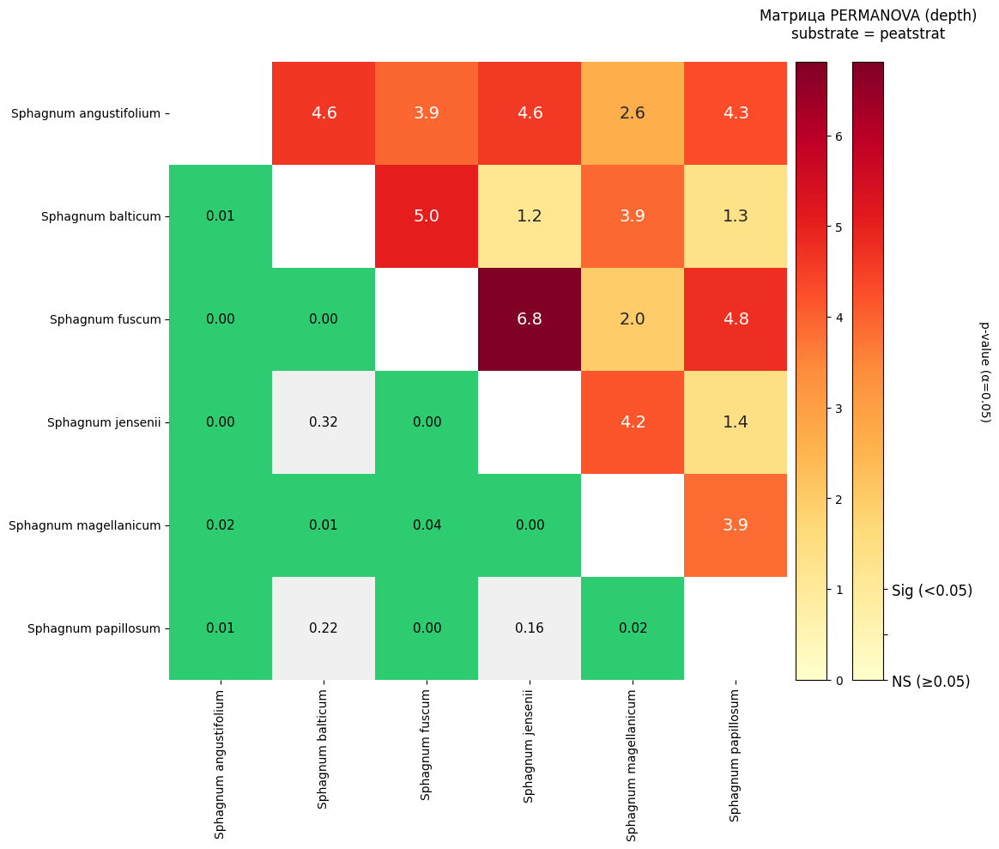

In [ ]:
# Матрица сходства для depth

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.distance import permanova
from itertools import combinations
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

def build_depth_permanova_matrix(bc_dist, metadata, permutations=999, alpha=0.05):
    """
    Строит матрицу PERMANOVA для фактора series с цветовыми шкалами справа

    Parameters:
        bc_dist: матрица расстояний (отфильтрованная по mycopins)
        metadata: метаданные (отфильтрованные)
        permutations: количество перестановок
        alpha: уровень значимости
    """
    # 1. Подготовка данных
    depth_values = sorted(metadata['plantHost'].dropna().unique())
    permanova_matrix = pd.DataFrame(np.nan, index=depth_values, columns=depth_values)

    # 2. Вычисление PERMANOVA для всех пар
    for (i, s1), (j, s2) in combinations(enumerate(depth_values), 2):
        ids1 = metadata[metadata['plantHost'] == s1]['SampleID'].tolist()
        ids2 = metadata[metadata['plantHost'] == s2]['SampleID'].tolist()

        if len(ids1) >= 3 and len(ids2) >= 3:
            try:
                subset_dm = bc_dist.filter(ids1 + ids2)
                result = permanova(
                    distance_matrix=subset_dm,
                    grouping=np.array([s1]*len(ids1) + [s2]*len(ids2)),
                    permutations=permutations
                )
                permanova_matrix.loc[s1, s2] = result['test statistic']
                permanova_matrix.loc[s2, s1] = result['p-value']
            except Exception as e:
                print(f"Ошибка {s1} vs {s2}: {str(e)}")

# 3. Визуализация с исправлениями
    plt.figure(figsize=(12, 10))
    ax = plt.gca()

    # Зеленая цветовая карта для p-values
    p_cmap = LinearSegmentedColormap.from_list('p_cmap', ['#f0f0f0', '#2ecc71'])

    # Маски для треугольников
    mask_upper = np.triu(np.ones_like(permanova_matrix, dtype=bool), k=1)
    mask_lower = np.tril(np.ones_like(permanova_matrix, dtype=bool), k=-1)

    # Верхний треугольник - F-значения
    f_plot = sns.heatmap(
        permanova_matrix.where(mask_upper),
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        mask=~mask_upper,
        square=True,
        annot_kws={"size": 14},
        vmin=0,
        cbar=False,
        ax=ax
    )

    # Нижний треугольник - p-values с округлением до 0.01
    p_plot = sns.heatmap(
        (permanova_matrix.where(mask_lower) < alpha).astype(float),
        annot=permanova_matrix.where(mask_lower).round(2),  # Округление до сотых
        fmt=".2f",  # Формат вывода с двумя знаками
        cmap=p_cmap,
        mask=~mask_lower,
        square=True,
        annot_kws={"size": 11, "color": "black"},
        vmin=0,
        vmax=1,
        cbar=False,
        ax=ax
    )

    # Добавляем цветовые шкалы справа
    divider = make_axes_locatable(ax)

    # Шкала для F-значений (красная)
    cax_f = divider.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(f_plot.get_children()[0], cax=cax_f, orientation='vertical')
    cax_f.set_ylabel('F-statistic', rotation=270, labelpad=15)

    # Шкала для p-values (зеленая)
    cax_p = divider.append_axes("right", size="5%", pad=0.3)
    p_colorbar = plt.colorbar(p_plot.get_children()[0], cax=cax_p, orientation='vertical')
    p_colorbar.set_label(f'p-value (α={alpha})', rotation=270, labelpad=15)
    p_colorbar.set_ticks([0, 0.5, 1])
    p_colorbar.set_ticklabels(['NS (≥0.05)', '', 'Sig (<0.05)'])

    # Настройки графика
    plt.title('Матрица PERMANOVA (depth)\nsubstrate = peatstrat', pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.tight_layout()

    # Сохранение
    plt.savefig('permanova_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    return permanova_matrix

# Пример использования:
if __name__ == "__main__":
    # Фильтрация данных
    filtered_samples = metadata[metadata['substrate'] == 'peatupper']['SampleID']
    filtered_data = normalized_data[filtered_samples]
    filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

    # Расчет матрицы расстояний
    bc_dist = beta_diversity('braycurtis', filtered_data.T,
                           ids=filtered_metadata['SampleID'].tolist())

    # Построение матрицы
    series_matrix = build_depth_permanova_matrix(
        bc_dist=bc_dist,
        metadata=filtered_metadata,
        permutations=999,
        alpha=0.05
    )

Фильтрация данных...
Отобрано проб: 34
Доступные факторы для анализа:
- month: [5. 7. 8. 9.]
- habitat: ['Treed bog' 'Sphagnum lawn']
- plantHost: ['Sphagnum angustifolium' 'Sphagnum magellanicum' 'Sphagnum fuscum'
 'Sphagnum jensenii' 'Sphagnum papillosum' 'Sphagnum balticum']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: habitat


/tmp/ipython-input-30-2159612266.py:122: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-30-2159612266.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


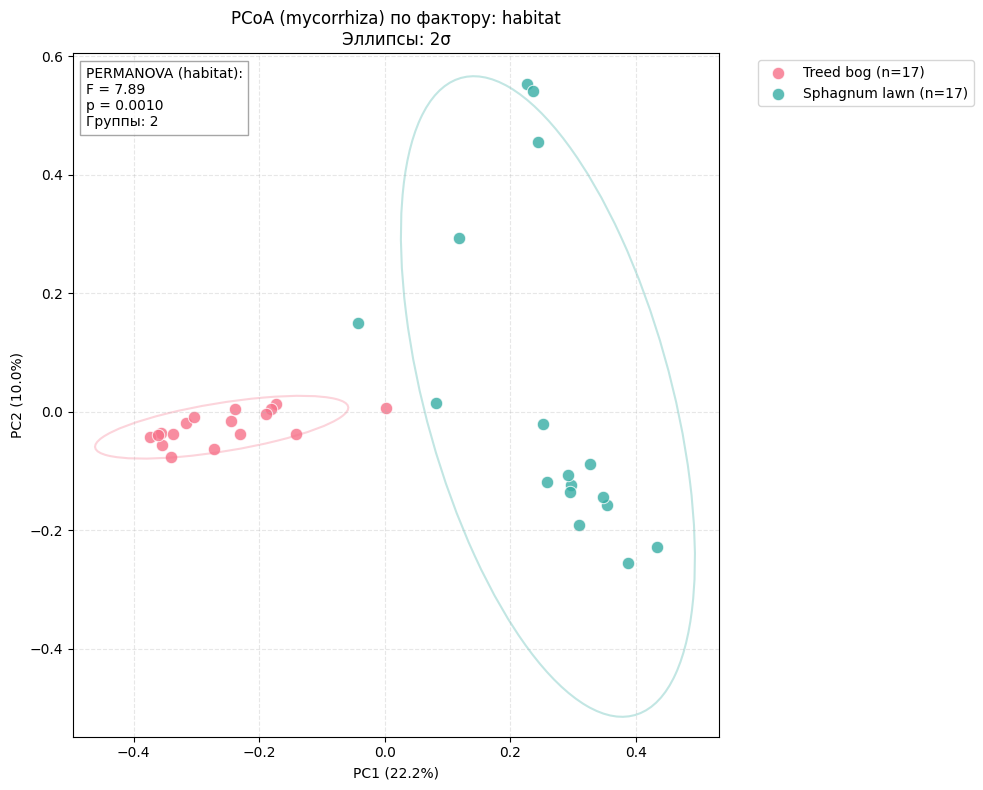


Анализ для фактора: month


/tmp/ipython-input-30-2159612266.py:122: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-30-2159612266.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


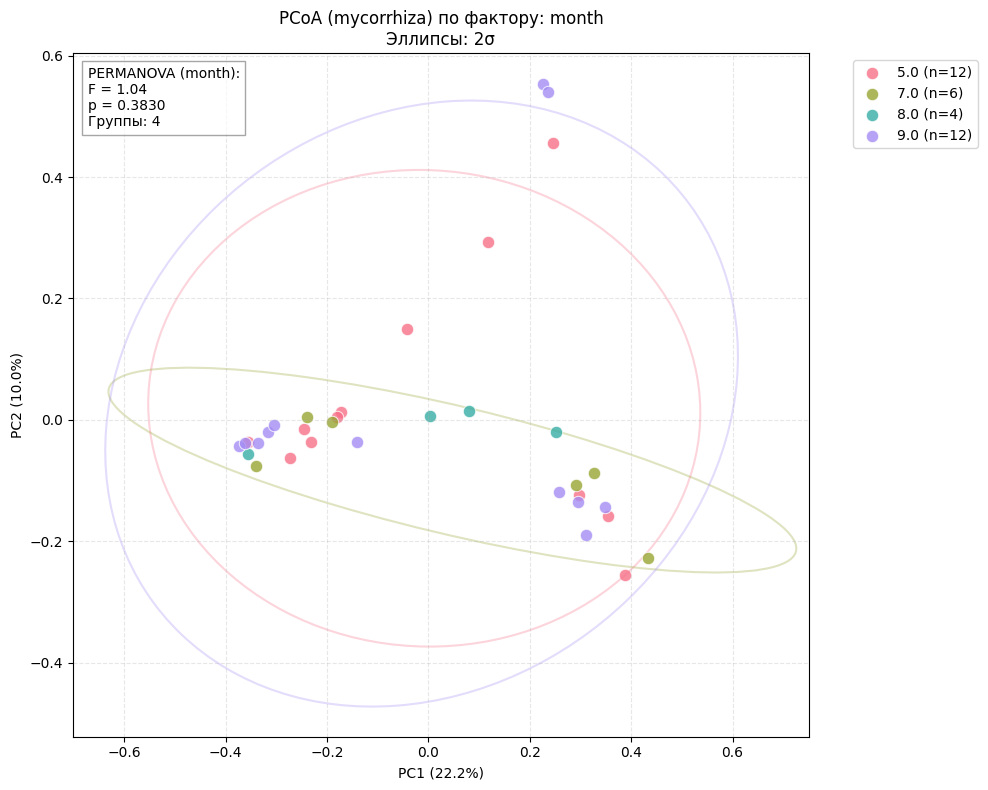


Анализ для фактора: plantHost


/tmp/ipython-input-30-2159612266.py:122: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-30-2159612266.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


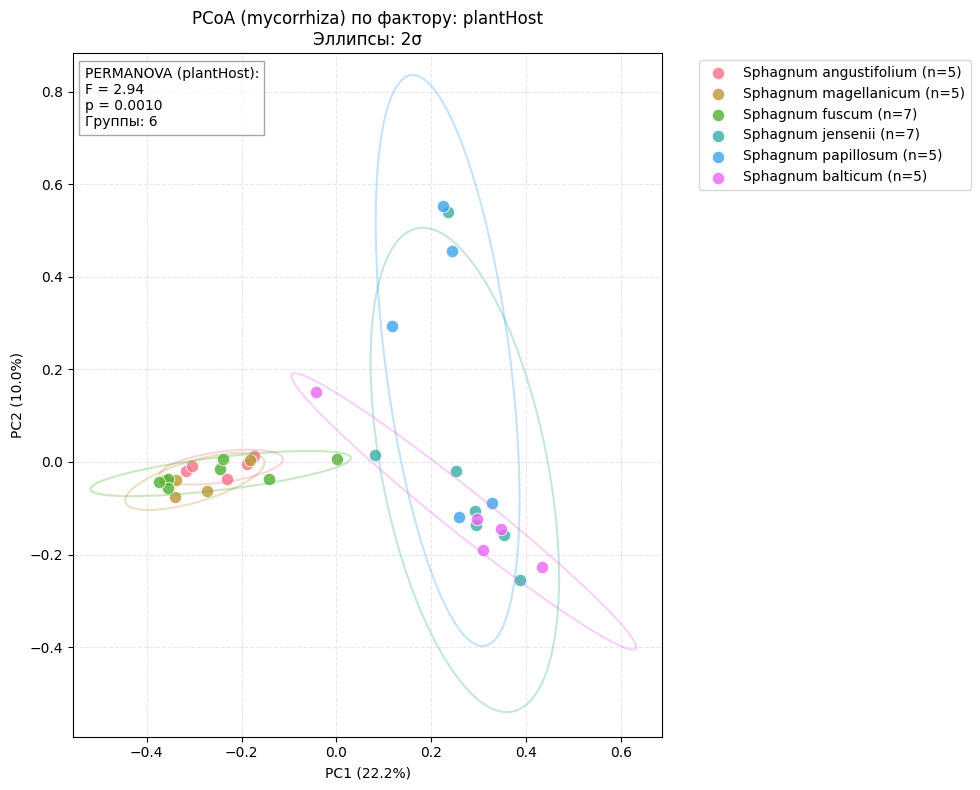

In [ ]:
# То же самое для верхнего слоя ()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'peatupper') &
    (metadata['depth'] == '- 2-5 cm')
]['SampleID']

filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- month: {filtered_metadata['month'].unique()}")
print(f"- habitat: {filtered_metadata['habitat'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['habitat','month', 'plantHost']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

Фильтрация данных...
Отобрано проб: 16
Доступные факторы для анализа:
- depth: ['- 0-2 cm' '- 10-15 cm' '- 2-5 cm' '- 25-30 cm']
- habitat: ['Sphagnum lawn' 'Treed bog']
- plantHost: ['Sphagnum jensenii' 'Sphagnum fuscum']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: habitat


/tmp/ipython-input-31-1130680259.py:122: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-31-1130680259.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


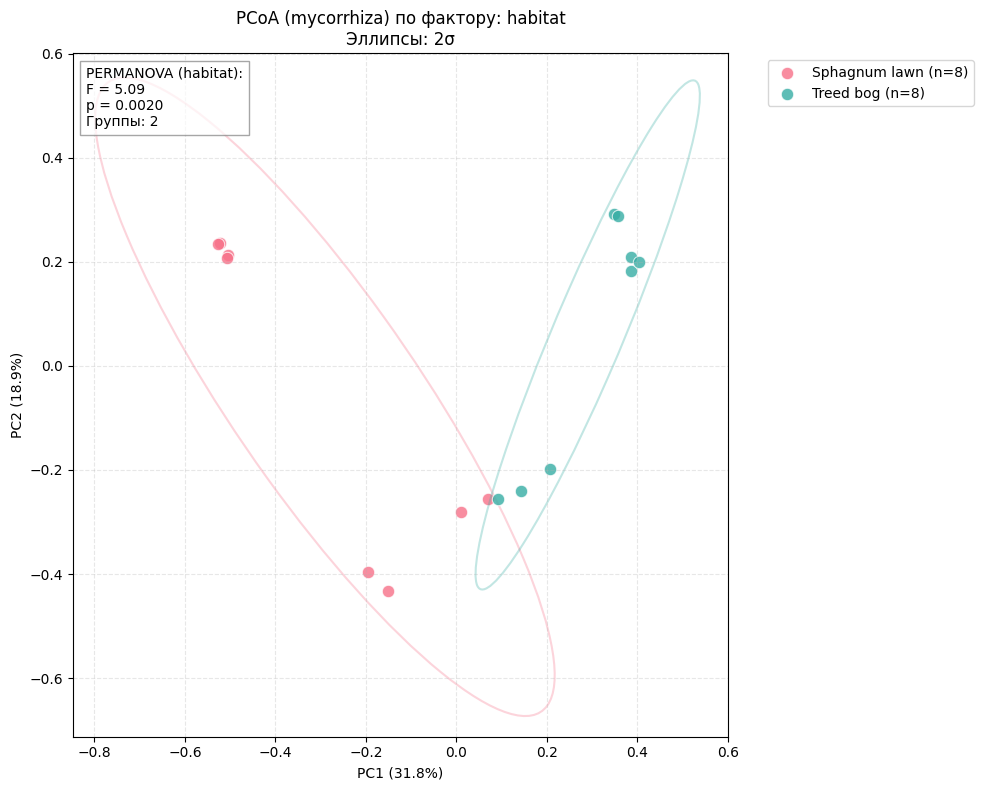


Анализ для фактора: depth


/tmp/ipython-input-31-1130680259.py:122: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-31-1130680259.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


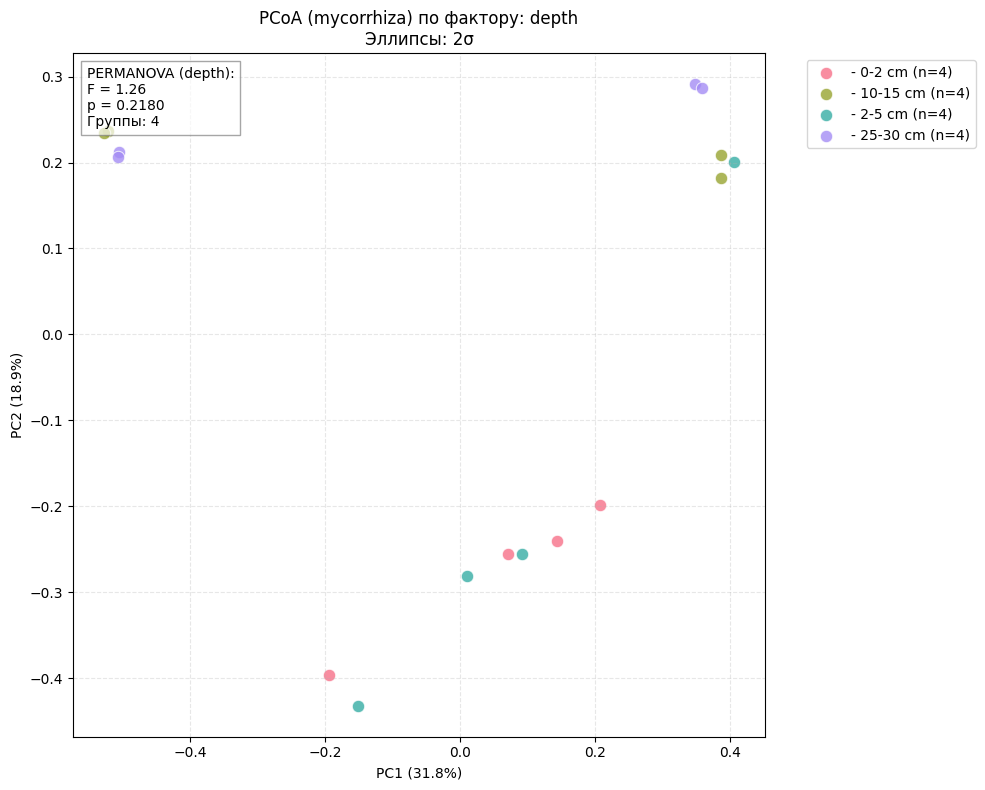

In [ ]:
# То же самое, то только для августа (были отобраны по глубинам)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'peatupper') &
    (metadata['month'] == 8)
]['SampleID']

filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- depth: {filtered_metadata['depth'].unique()}")
print(f"- habitat: {filtered_metadata['habitat'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['habitat','depth']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

Фильтрация данных...
Отобрано проб: 12
Доступные факторы для анализа:
- depth: ['- 2-5 cm']
- habitat: ['Treed bog' 'Sphagnum lawn']
- plantHost: ['Sphagnum angustifolium' 'Sphagnum magellanicum' 'Sphagnum fuscum'
 'Sphagnum jensenii' 'Sphagnum papillosum' 'Sphagnum balticum']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: samplingApproach


/tmp/ipython-input-32-3551762584.py:122: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-32-3551762584.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


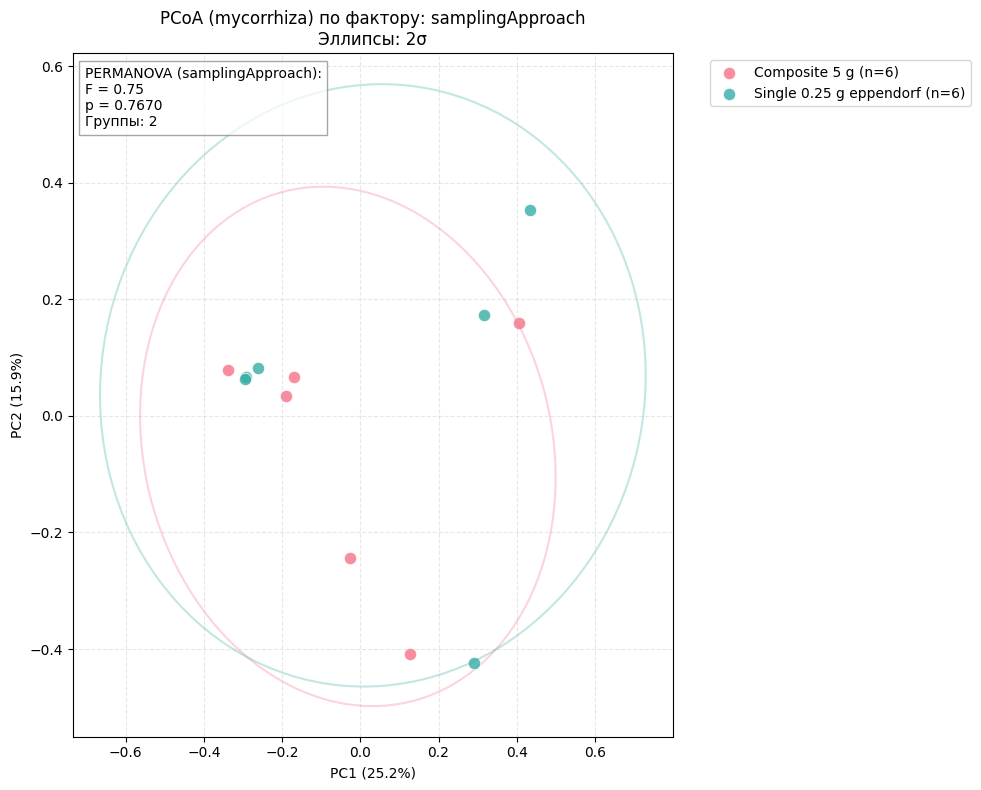

In [ ]:
# То же самое, то только чтобы проверить протокол отбора проб (только в мае)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'peatupper') &
    (metadata['month'] == 5)
]['SampleID']

filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- depth: {filtered_metadata['depth'].unique()}")
print(f"- habitat: {filtered_metadata['habitat'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['samplingApproach']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

## ANALYSIS OF PEAT COMMUNITY INFLUENCED BY OIL AND SALT SPILL (PEATSPILL)

Анализ для субстрата: peatspill
Фильтрация данных...
Отобрано проб: 19
Доступные факторы для анализа:
- locality: ['Pyt-Yakh' 'Pochechuyka']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: locality


/tmp/ipython-input-33-611199232.py:139: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-33-611199232.py:140: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


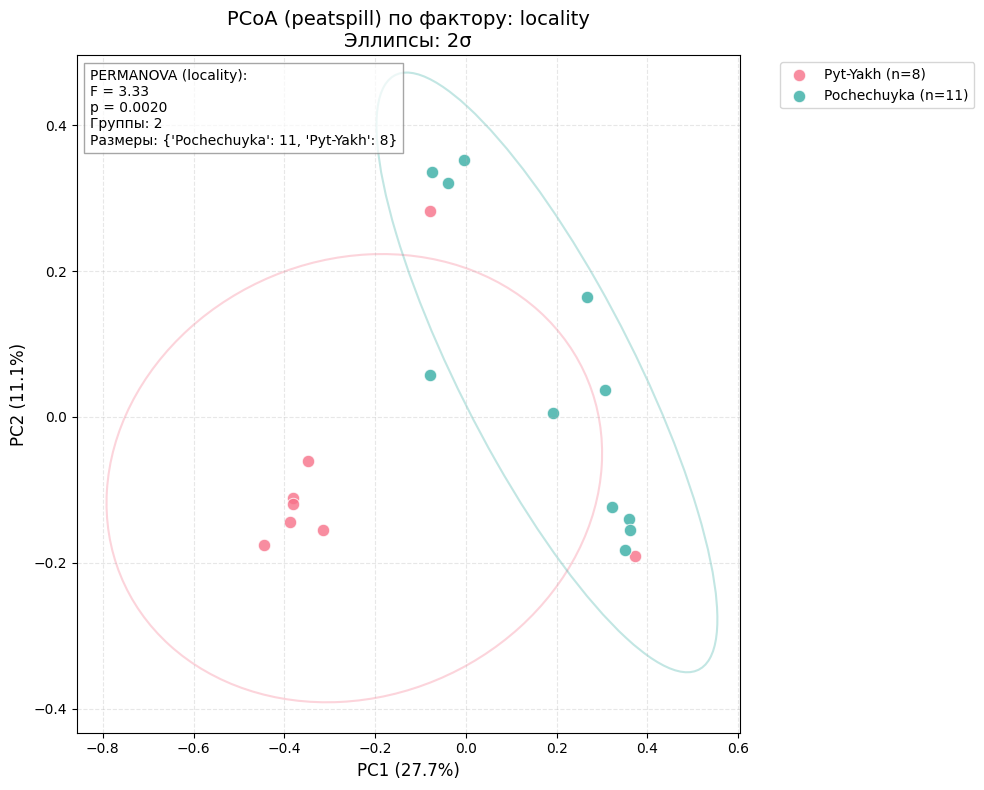


Результаты PERMANOVA сохранены в файл: permanova_stats_peatspill.csv
    Substrate    Factor   F-value  p-value N_groups  \
12  peatspill  locality  3.332109    0.002        2   

                           Group_sizes  
12  {'Pochechuyka': 11, 'Pyt-Yakh': 8}  


In [ ]:
# Анализ PCoA и PERMANOVA для субстрата peatspill (locality)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Инициализация глобальной переменной для хранения результатов
if 'permanova_results' not in globals():
    permanova_results = pd.DataFrame(columns=['Substrate', 'Factor', 'F-value', 'p-value', 'N_groups', 'Group_sizes'])

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных
current_substrate = 'peatspill'
print(f"Анализ для субстрата: {current_substrate}")
print("Фильтрация данных...")

filtered_samples = metadata[metadata['substrate'] == current_substrate]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- locality: {filtered_metadata['locality'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    global permanova_results

    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].astype(str).values
    groups = samples[factor].dropna().unique()
    group_counts = samples[factor].value_counts()

    # Вычисление PERMANOVA
    try:
        if len(group_counts) < 2 or any(group_counts < 3):
            raise ValueError("Слишком мало групп или образцов в группах")

        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )

        # Добавляем результаты в глобальный DataFrame
        new_result = pd.DataFrame({
            'Substrate': [current_substrate],
            'Factor': [factor],
            'F-value': [perm_res['test statistic']],
            'p-value': [perm_res['p-value']],
            'N_groups': [len(groups)],
            'Group_sizes': [str(group_counts.to_dict())]
        })

        permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)

        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}\n"
                     f"Размеры: {group_counts.to_dict()}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"
        print(f"Ошибка для фактора {factor}: {str(e)}")

    # Визуализация
    palette = sns.color_palette("husl", len(groups))

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=1.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)', fontsize=12)
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)', fontsize=12)
    plt.title(f'PCoA ({current_substrate}) по фактору: {factor}\nЭллипсы: {n_std}σ', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
factors_to_analyze = ['locality']
for factor in factors_to_analyze:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

# 6. Сохранение результатов PERMANOVA
output_filename = f'permanova_stats_{current_substrate}.csv'
permanova_results[permanova_results['Substrate'] == current_substrate].to_csv(
    output_filename, index=False, float_format='%.5f'
)
print(f"\nРезультаты PERMANOVA сохранены в файл: {output_filename}")
print(permanova_results[permanova_results['Substrate'] == current_substrate])

## ANALYSIS OF THE LITTER COMMUNITY OF DIFFERENT SPECIES OF BOG PLANTS (LITTER), INCLUDING A LIITER BAG DECOMPOSITION EXPERIMENT

Анализ для субстрата: litter
Фильтрация данных...
Отобрано проб: 44
Доступные факторы для анализа:
- month: [5. 7. 9. 6. 8.]
- Year: [2022 2024]
- plantHost: ['Rubus chamaemorus' 'Chamaedaphne calyculata' 'Ledum palustre'
 'Andromeda polifolia' 'Eriophorum vaginatum' 'Scheuchzeria palustris'
 'Oxycoccus palustris']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: month


/tmp/ipython-input-62-495431679.py:138: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-62-495431679.py:139: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


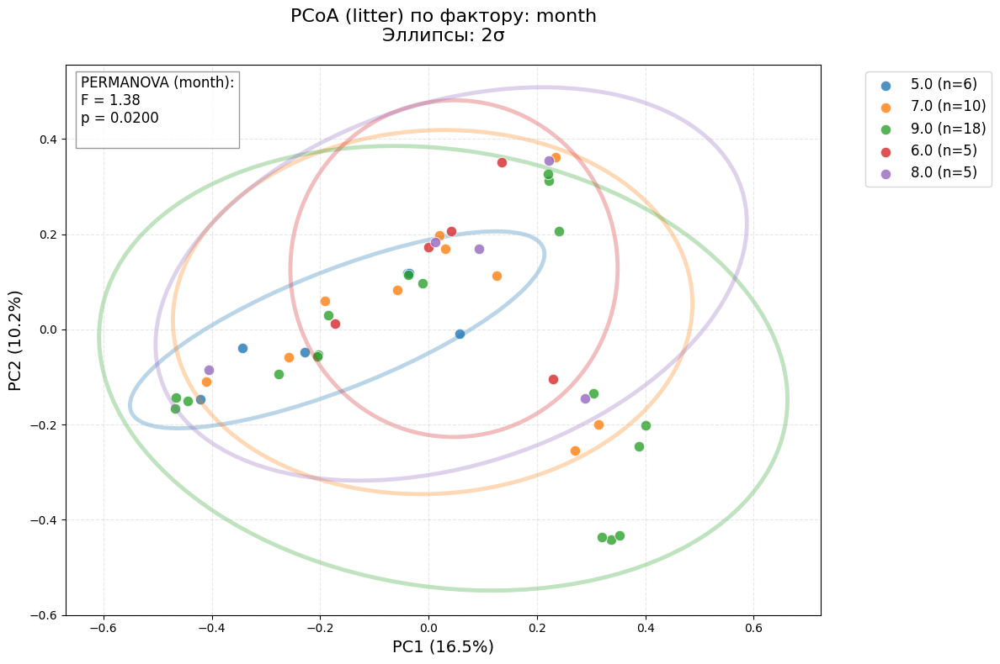


Анализ для фактора: Year


/tmp/ipython-input-62-495431679.py:138: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-62-495431679.py:139: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


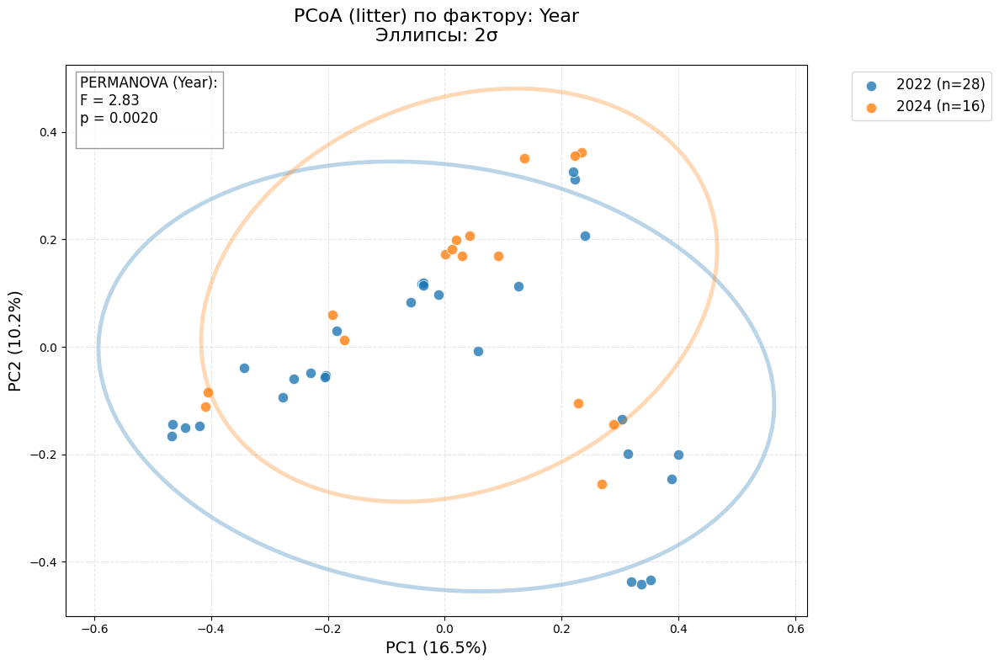


Анализ для фактора: plantHost


/tmp/ipython-input-62-495431679.py:138: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-62-495431679.py:139: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


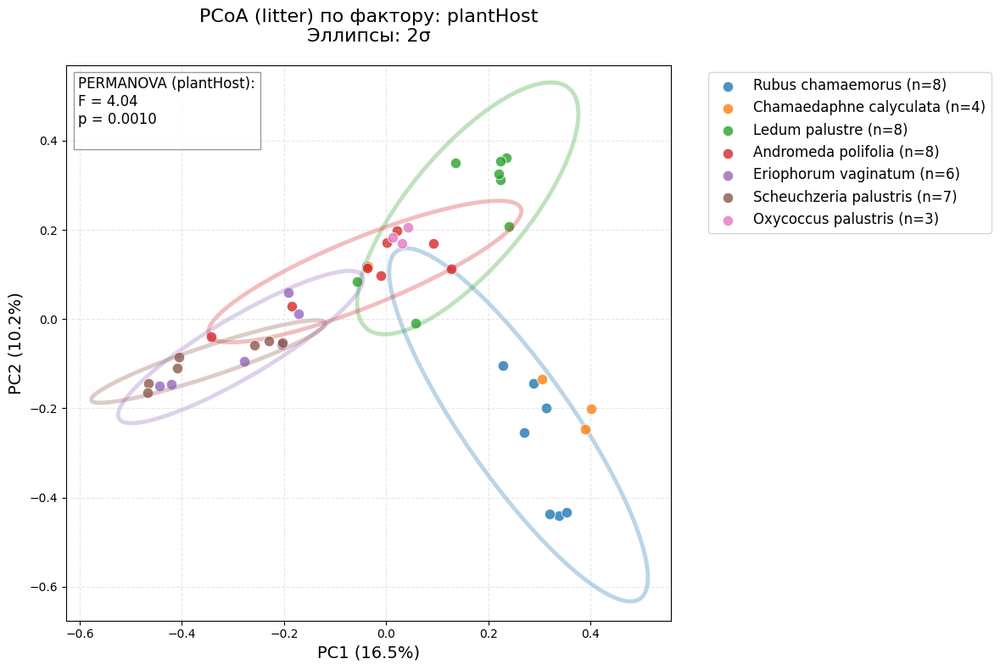


Результаты PERMANOVA сохранены в файл: permanova_stats_litter.csv
   Substrate     Factor   F-value  p-value N_groups  \
13    litter      month  1.380295    0.021        5   
14    litter       Year  2.830017    0.001        2   
15    litter  plantHost  4.036304    0.001        7   
17    litter      month  1.380295    0.025      NaN   
18    litter       Year  2.830017    0.001      NaN   
19    litter  plantHost  4.036304    0.001      NaN   
20    litter      month  1.380295    0.020      NaN   
21    litter       Year  2.830017    0.002      NaN   
22    litter  plantHost  4.036304    0.001      NaN   

                                          Group_sizes  
13  {'9.0': 18, '7.0': 10, '5.0': 6, '6.0': 5, '8....  
14                           {'2022': 28, '2024': 16}  
15  {'Rubus chamaemorus': 8, 'Ledum palustre': 8, ...  
17                                                NaN  
18                                                NaN  
19                                            

In [ ]:
# Анализ PCoA и PERMANOVA для субстрата litter (month, Year, plantHost)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Инициализация глобальной переменной для хранения результатов
if 'permanova_results' not in globals():
    permanova_results = pd.DataFrame(columns=['Substrate', 'Factor', 'F-value', 'p-value', 'N_groups', 'Group_sizes'])

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных
current_substrate = 'litter'
print(f"Анализ для субстрата: {current_substrate}")
print("Фильтрация данных...")

filtered_samples = metadata[metadata['substrate'] == current_substrate]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- month: {filtered_metadata['month'].unique()}")
print(f"- Year: {filtered_metadata['Year'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    global permanova_results

    plt.figure(figsize=(12, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].astype(str).values
    groups = samples[factor].dropna().unique()
    group_counts = samples[factor].value_counts()

    # Вычисление PERMANOVA
    try:
        if len(group_counts) < 2 or any(group_counts < 3):
            raise ValueError("Слишком мало групп или образцов в группах")

        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )

        # Добавляем результаты в глобальный DataFrame
        new_result = pd.DataFrame({
            'Substrate': [current_substrate],
            'Factor': [factor],
            'F-value': [perm_res['test statistic']],
            'p-value': [perm_res['p-value']]
        })

        permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)

        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
        )
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"
        print(f"Ошибка для фактора {factor}: {str(e)}")

    # Визуализация
    palette = sns.color_palette("tab10", n_colors=7)

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=3.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=12,
             bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)', fontsize=14)
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)', fontsize=14)
    plt.title(f'PCoA ({current_substrate}) по фактору: {factor}\nЭллипсы: {n_std}σ', fontsize=16, pad=20)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
factors_to_analyze = ['month', 'Year', 'plantHost']
for factor in factors_to_analyze:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

# 6. Сохранение результатов PERMANOVA
output_filename = f'permanova_stats_{current_substrate}.csv'
permanova_results[permanova_results['Substrate'] == current_substrate].to_csv(
    output_filename, index=False, float_format='%.5f'
)
print(f"\nРезультаты PERMANOVA сохранены в файл: {output_filename}")
print(permanova_results[permanova_results['Substrate'] == current_substrate])

Анализ для субстрата: litter
Фильтрация данных...
Отобрано проб: 44
Доступные факторы для анализа:
- month: [5. 7. 9. 6. 8.]
- Year: [2022 2024]
- plantHost: ['Rubus chamaemorus' 'Chamaedaphne calyculata' 'Ledum palustre'
 'Andromeda polifolia' 'Eriophorum vaginatum' 'Scheuchzeria palustris'
 'Oxycoccus palustris']

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: plantHost


/tmp/ipython-input-72-2864714409.py:138: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-72-2864714409.py:139: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


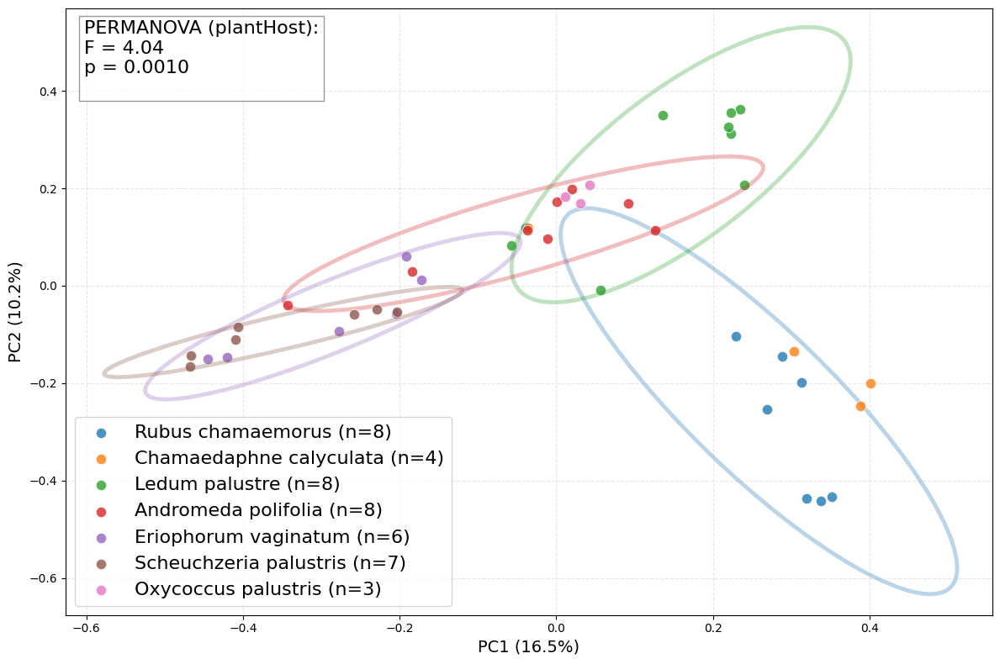


Результаты PERMANOVA сохранены в файл: permanova_stats_litter.csv
   Substrate     Factor   F-value  p-value N_groups  \
13    litter      month  1.380295    0.021        5   
14    litter       Year  2.830017    0.001        2   
15    litter  plantHost  4.036304    0.001        7   
17    litter      month  1.380295    0.025      NaN   
18    litter       Year  2.830017    0.001      NaN   
19    litter  plantHost  4.036304    0.001      NaN   
20    litter      month  1.380295    0.020      NaN   
21    litter       Year  2.830017    0.002      NaN   
22    litter  plantHost  4.036304    0.001      NaN   
23    litter  plantHost  4.036304    0.001      NaN   
24    litter  plantHost  4.036304    0.001      NaN   
25    litter  plantHost  4.036304    0.001      NaN   
26    litter  plantHost  4.036304    0.001      NaN   
27    litter  plantHost  4.036304    0.001      NaN   
28    litter  plantHost  4.036304    0.001      NaN   
29    litter  plantHost  4.036304    0.001      NaN  

In [ ]:
# Анализ PCoA и PERMANOVA для субстрата litter (отдельно plantHost)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Инициализация глобальной переменной для хранения результатов
if 'permanova_results' not in globals():
    permanova_results = pd.DataFrame(columns=['Substrate', 'Factor', 'F-value', 'p-value', 'N_groups', 'Group_sizes'])

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных
current_substrate = 'litter'
print(f"Анализ для субстрата: {current_substrate}")
print("Фильтрация данных...")

filtered_samples = metadata[metadata['substrate'] == current_substrate]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- month: {filtered_metadata['month'].unique()}")
print(f"- Year: {filtered_metadata['Year'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    global permanova_results

    plt.figure(figsize=(12, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].astype(str).values
    groups = samples[factor].dropna().unique()
    group_counts = samples[factor].value_counts()

    # Вычисление PERMANOVA
    try:
        if len(group_counts) < 2 or any(group_counts < 3):
            raise ValueError("Слишком мало групп или образцов в группах")

        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )

        # Добавляем результаты в глобальный DataFrame
        new_result = pd.DataFrame({
            'Substrate': [current_substrate],
            'Factor': [factor],
            'F-value': [perm_res['test statistic']],
            'p-value': [perm_res['p-value']]
        })

        permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)

        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
        )
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"
        print(f"Ошибка для фактора {factor}: {str(e)}")

    # Визуализация
    palette = sns.color_palette("tab10", n_colors=7)

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=3.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=16,
             bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)', fontsize=14)
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)', fontsize=14)
    plt.title(f'', fontsize=16, pad=20)
    plt.legend(loc='lower left', fontsize=16)
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
factors_to_analyze = ['plantHost']
for factor in factors_to_analyze:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

# 6. Сохранение результатов PERMANOVA
output_filename = f'permanova_stats_{current_substrate}.csv'
permanova_results[permanova_results['Substrate'] == current_substrate].to_csv(
    output_filename, index=False, float_format='%.5f'
)
print(f"\nРезультаты PERMANOVA сохранены в файл: {output_filename}")
print(permanova_results[permanova_results['Substrate'] == current_substrate])

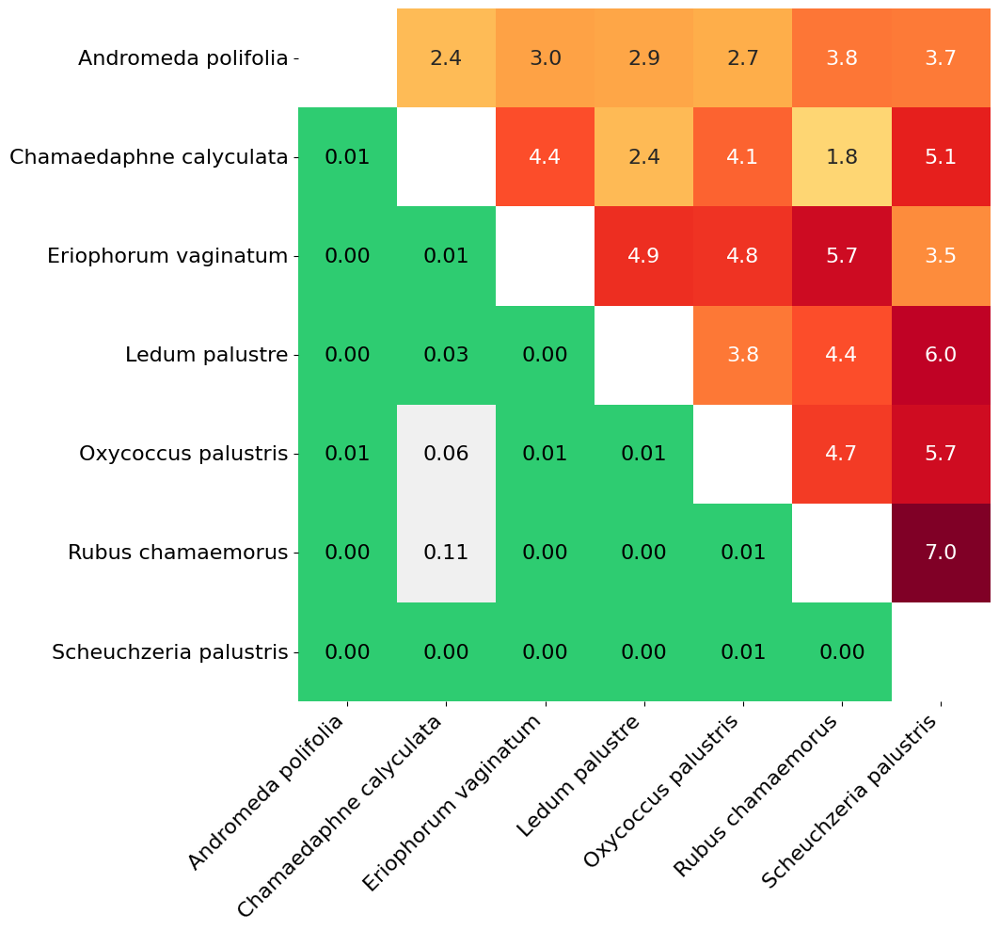

In [ ]:
# Матрица сходства для разных видов растений

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.distance import permanova
from itertools import combinations
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

def build_depth_permanova_matrix(bc_dist, metadata, permutations=999, alpha=0.05):
    """
    Строит матрицу PERMANOVA для фактора series с цветовыми шкалами справа

    Parameters:
        bc_dist: матрица расстояний (отфильтрованная по mycopins)
        metadata: метаданные (отфильтрованные)
        permutations: количество перестановок
        alpha: уровень значимости
    """
    # 1. Подготовка данных
    depth_values = sorted(metadata['plantHost'].dropna().unique())
    permanova_matrix = pd.DataFrame(np.nan, index=depth_values, columns=depth_values)

    # 2. Вычисление PERMANOVA для всех пар
    for (i, s1), (j, s2) in combinations(enumerate(depth_values), 2):
        ids1 = metadata[metadata['plantHost'] == s1]['SampleID'].tolist()
        ids2 = metadata[metadata['plantHost'] == s2]['SampleID'].tolist()

        if len(ids1) >= 3 and len(ids2) >= 3:
            try:
                subset_dm = bc_dist.filter(ids1 + ids2)
                result = permanova(
                    distance_matrix=subset_dm,
                    grouping=np.array([s1]*len(ids1) + [s2]*len(ids2)),
                    permutations=permutations
                )
                permanova_matrix.loc[s1, s2] = result['test statistic']
                permanova_matrix.loc[s2, s1] = result['p-value']
            except Exception as e:
                print(f"Ошибка {s1} vs {s2}: {str(e)}")

# 3. Визуализация с исправлениями
    plt.figure(figsize=(12, 10))
    ax = plt.gca()

    # Зеленая цветовая карта для p-values
    p_cmap = LinearSegmentedColormap.from_list('p_cmap', ['#f0f0f0', '#2ecc71'])

    # Маски для треугольников
    mask_upper = np.triu(np.ones_like(permanova_matrix, dtype=bool), k=1)
    mask_lower = np.tril(np.ones_like(permanova_matrix, dtype=bool), k=-1)

    # Верхний треугольник - F-значения
    f_plot = sns.heatmap(
        permanova_matrix.where(mask_upper),
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        mask=~mask_upper,
        square=True,
        annot_kws={"size": 16},
        vmin=0,
        cbar=False,
        ax=ax
    )

    # Нижний треугольник - p-values с округлением до 0.01
    p_plot = sns.heatmap(
        (permanova_matrix.where(mask_lower) < alpha).astype(float),
        annot=permanova_matrix.where(mask_lower).round(2),  # Округление до сотых
        fmt=".2f",  # Формат вывода с двумя знаками
        cmap=p_cmap,
        mask=~mask_lower,
        square=True,
        annot_kws={"size": 16, "color": "black"},
        vmin=0,
        vmax=1,
        cbar=False,
        ax=ax
    )

    # Добавляем цветовые шкалы справа
    divider = make_axes_locatable(ax)

    # Настройки графика
    plt.title('', pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=16)
    plt.yticks(rotation=0, fontsize=16)
    plt.tight_layout()

    # Сохранение
    plt.savefig('permanova_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    return permanova_matrix

# Пример использования:
if __name__ == "__main__":
    # Фильтрация данных по двум субстратам
    filtered_samples = metadata[
        (metadata['substrate'] == 'litter')
    ]['SampleID']

    filtered_data = normalized_data[filtered_samples]
    filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()


    # Расчет матрицы расстояний
    bc_dist = beta_diversity('braycurtis', filtered_data.T,
                           ids=filtered_metadata['SampleID'].tolist())

    # Построение матрицы
    series_matrix = build_depth_permanova_matrix(
        bc_dist=bc_dist,
        metadata=filtered_metadata,
        permutations=999,
        alpha=0.051
    )

Фильтрация данных...
Отобрано проб: 84
Доступные факторы для анализа:
- month: [ 5.  7.  9.  6.  8. nan]
- Year: [2022 2024]
- plantHost: ['Rubus chamaemorus' 'Chamaedaphne calyculata' 'Ledum palustre'
 'Andromeda polifolia' 'Eriophorum vaginatum' 'Scheuchzeria palustris'
 'Oxycoccus palustris' 'Sphagnum balticum' 'Sphagnum fuscum'
 'Carex limosa' nan]

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: substrate


/usr/local/lib/python3.11/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.059709069662772174 whereas the largest positive one is 3.5853902530504516.
  warn(
/tmp/ipython-input-35-3174631593.py:122: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-35-3174631593.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion

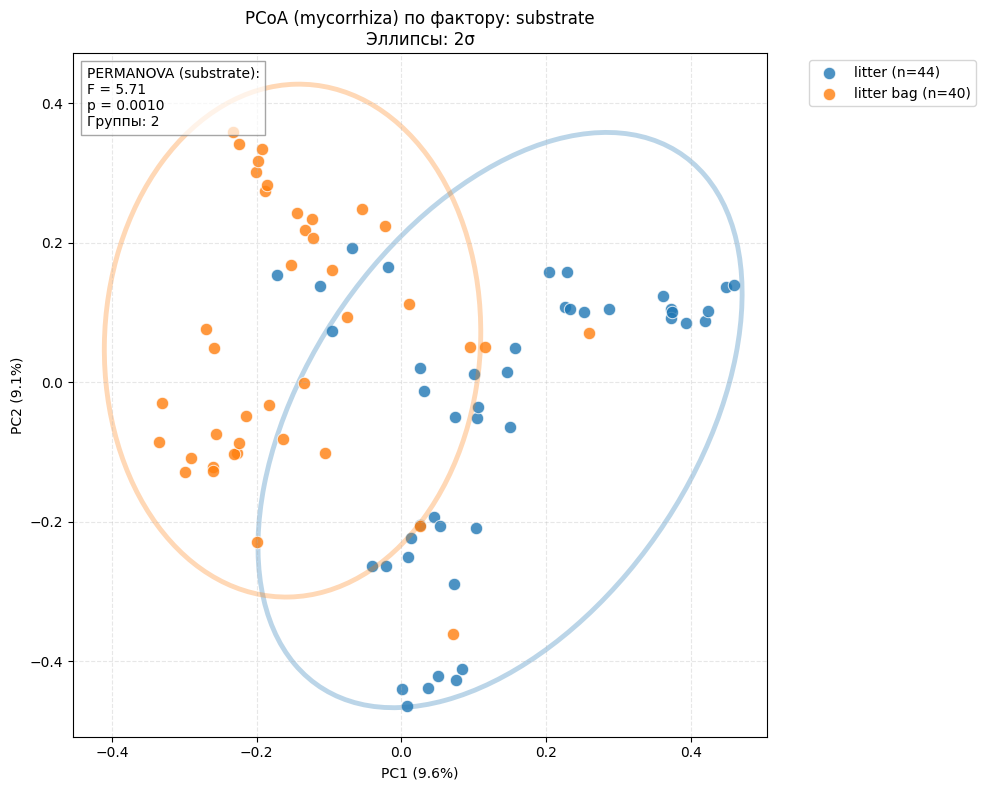

In [ ]:
# Анализ только опада и мешочков

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'litter') |
    (metadata['substrate'] == 'litter bag')
]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- month: {filtered_metadata['month'].unique()}")
print(f"- Year: {filtered_metadata['Year'].unique()}")
print(f"- plantHost: {filtered_metadata['plantHost'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("tab10", n_colors=7)


    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=3.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['substrate']:
    if factor in metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

Анализ для опада и мешочков по сериям
Фильтрация данных...
Отобрано проб: 84
Доступные факторы для анализа:
- series: [1. 6. 4. 3. 2. 0.]
- month: [ 5.  7.  9.  6.  8. nan]
- Year: [2022 2024]

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: series


/usr/local/lib/python3.11/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.05970906966277204 whereas the largest positive one is 3.5853902530504493.
  warn(
/tmp/ipython-input-80-1612298772.py:143: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-80-1612298772.py:144: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_

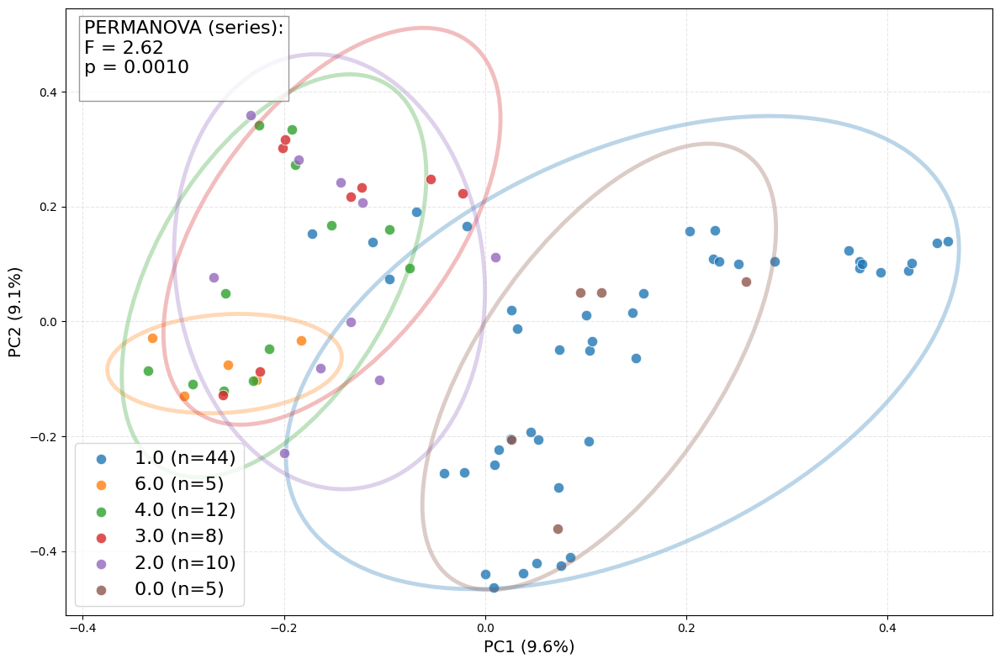


Результаты PERMANOVA сохранены в файл: permanova_stats_litter_and_bag.csv
         Substrate  Factor   F-value  p-value N_groups  \
16  litter_and_bag  series  2.623988    0.001        6   
33  litter_and_bag  series  2.623988    0.001        6   
34  litter_and_bag  series  2.623988    0.001        6   
35  litter_and_bag  series  2.623988    0.001        6   
36  litter_and_bag  series  2.623988    0.001        6   
37  litter_and_bag  series  2.623988    0.001        6   
38  litter_and_bag  series  2.623988    0.001        6   
39  litter_and_bag  series  2.623988    0.001        6   

                                          Group_sizes  
16  {'1.0': 44, '4.0': 12, '2.0': 10, '3.0': 8, '6...  
33  {'1.0': 44, '4.0': 12, '2.0': 10, '3.0': 8, '6...  
34  {'1.0': 44, '4.0': 12, '2.0': 10, '3.0': 8, '6...  
35  {'1.0': 44, '4.0': 12, '2.0': 10, '3.0': 8, '6...  
36  {'1.0': 44, '4.0': 12, '2.0': 10, '3.0': 8, '6...  
37  {'1.0': 44, '4.0': 12, '2.0': 10, '3.0': 8, '6...  
38  {'1.0'

In [ ]:
# Анализ PCoA и PERMANOVA для опада и мешочков по сериям (времени)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Инициализация глобальной переменной для хранения результатов
if 'permanova_results' not in globals():
    permanova_results = pd.DataFrame(columns=['Substrate', 'Factor', 'F-value', 'p-value', 'N_groups', 'Group_sizes'])

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных
current_substrate = 'litter_and_bag'
print(f"Анализ для опада и мешочков по сериям")
print("Фильтрация данных...")

filtered_samples = metadata[
    (metadata['substrate'] == 'litter') |
    (metadata['substrate'] == 'litter bag')
]['SampleID']
filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- series: {filtered_metadata['series'].unique()}")
print(f"- month: {filtered_metadata['month'].unique()}")
print(f"- Year: {filtered_metadata['Year'].unique()}")

# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    global permanova_results

    plt.figure(figsize=(12, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].astype(str).values
    groups = samples[factor].dropna().unique()
    group_counts = samples[factor].value_counts()

    # Вычисление PERMANOVA
    try:
        if len(group_counts) < 2 or any(group_counts < 3):
            raise ValueError("Слишком мало групп или образцов в группах")

        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )

        # Добавляем результаты в глобальный DataFrame
        new_result = pd.DataFrame({
            'Substrate': [current_substrate],
            'Factor': [factor],
            'F-value': [perm_res['test statistic']],
            'p-value': [perm_res['p-value']],
            'N_groups': [len(groups)],
            'Group_sizes': [str(group_counts.to_dict())]
        })

        permanova_results = pd.concat([permanova_results, new_result], ignore_index=True)

        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
        )
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"
        print(f"Ошибка для фактора {factor}: {str(e)}")

    # Визуализация
    palette = sns.color_palette("tab10", n_colors=7)

    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=3.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=16,
             bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)', fontsize=14)
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)', fontsize=14)
    plt.title(f'', fontsize=16, pad=20)
    plt.legend(loc='lower left', fontsize=16)
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
factors_to_analyze = ['series']  # Основной фактор - серии (время)
for factor in factors_to_analyze:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

# 6. Сохранение результатов PERMANOVA
output_filename = f'permanova_stats_{current_substrate}.csv'
permanova_results[permanova_results['Substrate'] == current_substrate].to_csv(
    output_filename, index=False, float_format='%.5f'
)
print(f"\nРезультаты PERMANOVA сохранены в файл: {output_filename}")
print(permanova_results[permanova_results['Substrate'] == current_substrate])

Фильтрация данных...
Отобрано проб: 50
Доступные факторы для анализа:
- series: [1. 4. 3. 2.]

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: series


/tmp/ipython-input-37-3269923579.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-37-3269923579.py:124: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


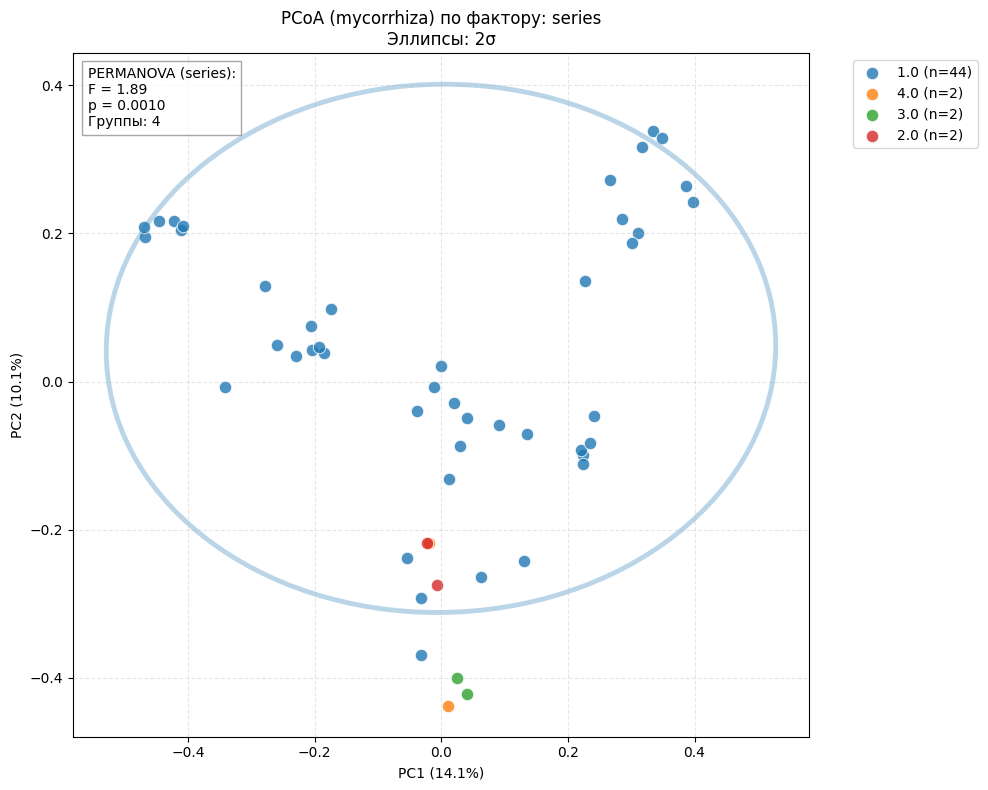

In [ ]:
# Анализ по фактору series (только Ledum palustre)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'litter') |
    (metadata['substrate'] == 'litter bag') &
    (metadata['plantHost'] == 'Ledum palustre')
]['SampleID']

filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- series: {filtered_metadata['series'].unique()}")


# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("tab10", n_colors=10)


    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=3.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['series']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

Фильтрация данных...
Отобрано проб: 51
Доступные факторы для анализа:
- series: [1. 4. 3. 2. 0.]

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: series


/tmp/ipython-input-38-487521434.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-38-487521434.py:124: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_explained[1]*100


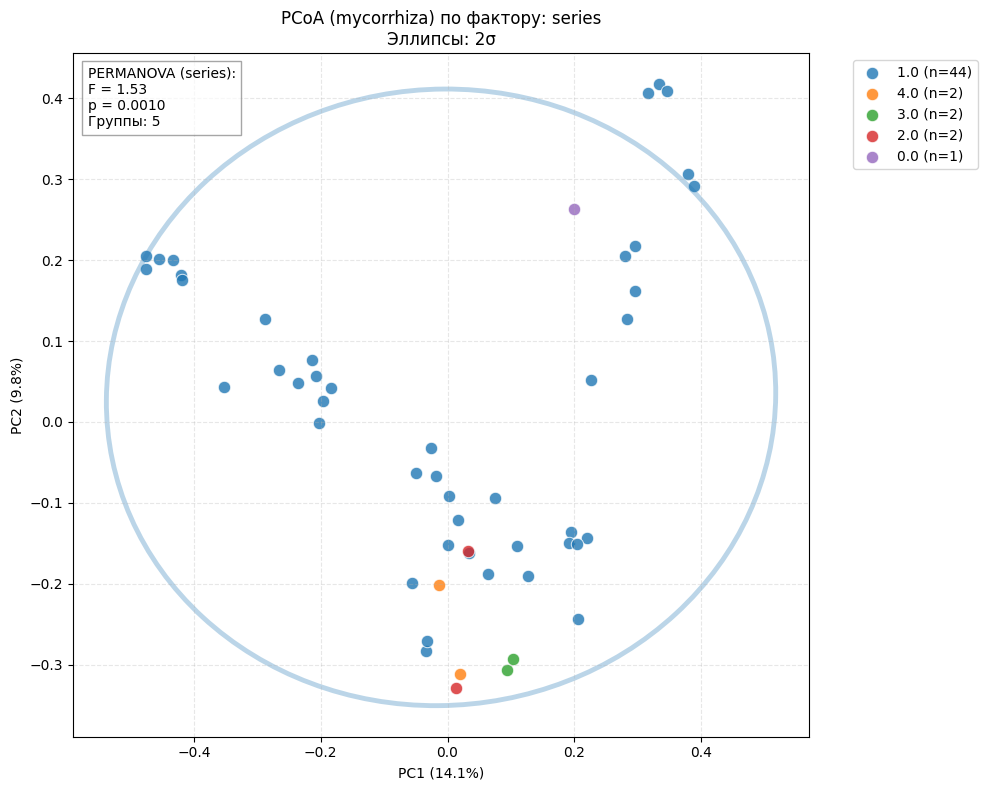

In [ ]:
# Анализ по фактору series (только Chamaedaphne calyculata)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'litter') |
    (metadata['substrate'] == 'litter bag') &
    (metadata['plantHost'] == 'Chamaedaphne calyculata')
]['SampleID']

filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- series: {filtered_metadata['series'].unique()}")


# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("tab10", n_colors=10)


    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=3.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['series']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

Фильтрация данных...
Отобрано проб: 52
Доступные факторы для анализа:
- series: [1. 6. 4. 2. 0.]

Расчет матрицы расстояний...
Выполнение PCoA...

Анализ для фактора: series


/usr/local/lib/python3.11/dist-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.03345067862330764 whereas the largest positive one is 3.1506969553768007.
  warn(
/tmp/ipython-input-39-1400720764.py:123: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc1_var = pcoa_results.proportion_explained[0]*100
/tmp/ipython-input-39-1400720764.py:124: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pc2_var = pcoa_results.proportion_

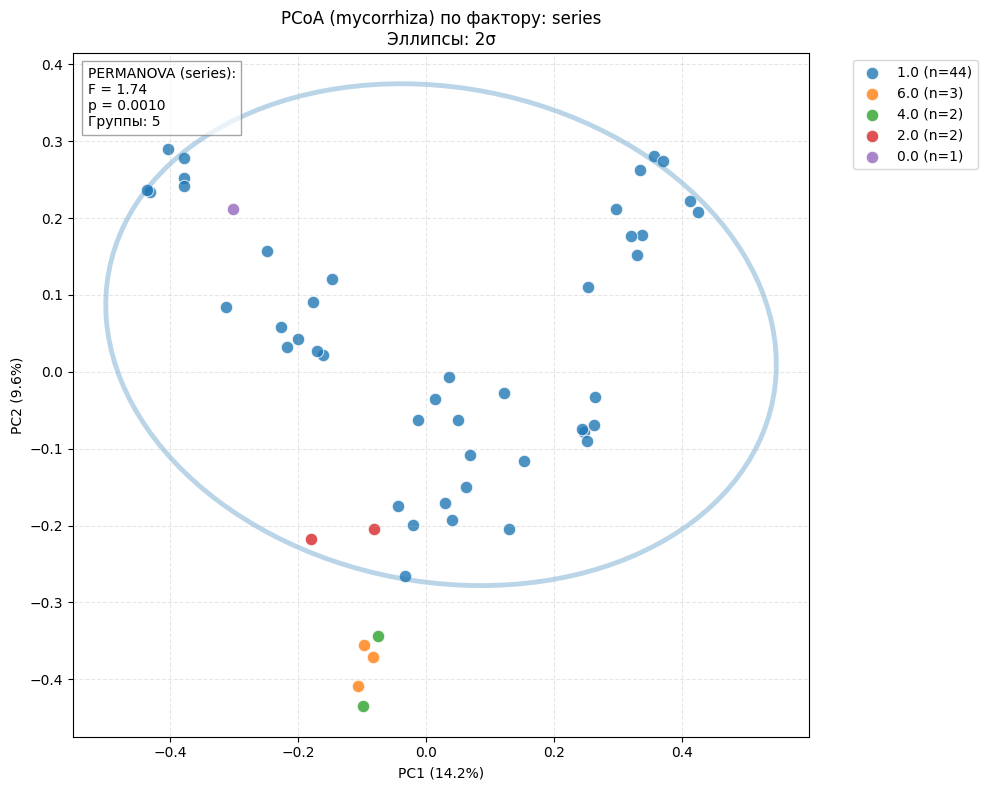

In [ ]:
# Анализ по фактору series (только Er vag)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Функция для эллипсов доверия
def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):
    """Добавляет эллипс доверия на график"""
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x*2, height=ell_radius_y*2,
                     facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# 1. Загрузка и фильтрация данных (примерные имена столбцов - уточните при необходимости)
# Предполагаем, что данные уже загружены в переменные:
# normalized_data - нормализованные OTU (столбцы - пробы, строки - OTU)
# metadata - метаданные с колонками: SampleID, substrate, series, Year, plantHost

print("Фильтрация данных...")
filtered_samples = metadata[
    (metadata['substrate'] == 'litter') |
    (metadata['substrate'] == 'litter bag') &
    (metadata['plantHost'] == 'Eriophorum vaginatum')
]['SampleID']

filtered_data = normalized_data[filtered_samples]
filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()

print(f"Отобрано проб: {len(filtered_samples)}")
print("Доступные факторы для анализа:")
print(f"- series: {filtered_metadata['series'].unique()}")


# 2. Расчет матрицы расстояний Брея-Кертиса
print("\nРасчет матрицы расстояний...")
bc_dist = beta_diversity(
    'braycurtis',
    filtered_data.T,
    ids=filtered_metadata['SampleID'].tolist()
)

# 3. PCoA анализ
print("Выполнение PCoA...")
pcoa_results = pcoa(bc_dist)

# 4. Функция для визуализации с PERMANOVA
def plot_pcoa_with_stats(factor, n_std=2, permutations=999):
    """Визуализация PCoA с эллипсами и PERMANOVA"""
    plt.figure(figsize=(10, 8))
    ax = plt.gca()

    # Подготовка данных
    samples = pcoa_results.samples.copy()
    samples[factor] = filtered_metadata.set_index('SampleID')[factor].values
    groups = samples[factor].dropna().unique()

    # Вычисление PERMANOVA
    try:
        perm_res = permanova(
            distance_matrix=bc_dist,
            grouping=samples[factor],
            permutations=permutations
        )
        stats_text = (f"PERMANOVA ({factor}):\n"
                     f"F = {perm_res['test statistic']:.2f}\n"
                     f"p = {perm_res['p-value']:.4f}\n"
                     f"Группы: {len(groups)}")
    except Exception as e:
        stats_text = f"PERMANOVA error:\n{str(e)}"

    # Визуализация
    palette = sns.color_palette("tab10", n_colors=10)


    for i, group in enumerate(groups):
        group_data = samples[samples[factor] == group]

        # Точки
        sns.scatterplot(
            x='PC1', y='PC2',
            data=group_data,
            color=palette[i],
            label=f"{group} (n={len(group_data)})",
            s=80,
            alpha=0.8,
            ax=ax
        )

        # Эллипсы (если >=5 проб)
        if len(group_data) >= 5:
            confidence_ellipse(
                x=group_data['PC1'],
                y=group_data['PC2'],
                ax=ax,
                n_std=n_std,
                edgecolor=palette[i],
                linewidth=3.5,
                alpha=0.3
            )

    # Добавление статистики
    plt.text(0.02, 0.98, stats_text,
             transform=ax.transAxes,
             ha='left', va='top',
             fontsize=10,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

    # Настройки графика
    pc1_var = pcoa_results.proportion_explained[0]*100
    pc2_var = pcoa_results.proportion_explained[1]*100

    plt.xlabel(f'PC1 ({pc1_var:.1f}%)')
    plt.ylabel(f'PC2 ({pc2_var:.1f}%)')
    plt.title(f'PCoA (mycorrhiza) по фактору: {factor}\nЭллипсы: {n_std}σ')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# 5. Запуск анализа для каждого фактора
for factor in ['series']:
    if factor in filtered_metadata.columns:
        print(f"\nАнализ для фактора: {factor}")
        plot_pcoa_with_stats(factor)
    else:
        print(f"\nФактор {factor} не найден в данных. Пропускаем.")

Фильтрация данных...
Проверка соответствия SampleID...
Доступно проб для анализа: 84
Распределение по series:
series
1.0    44
4.0    12
2.0    10
3.0     8
6.0     5
0.0     5
Name: count, dtype: int64

Расчет индексов...

Первые 5 строк результатов:
  SampleID   Shannon  Observed_OTUs  series
0      700  1.606487             51     4.0
1      705  1.907505            103     3.0
2      727  1.172239             35     0.0
3      155  2.840343            318     1.0
4      708  2.274304             70     3.0

Визуализация результатов...


/tmp/ipython-input-91-2815620319.py:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-91-2815620319.py:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


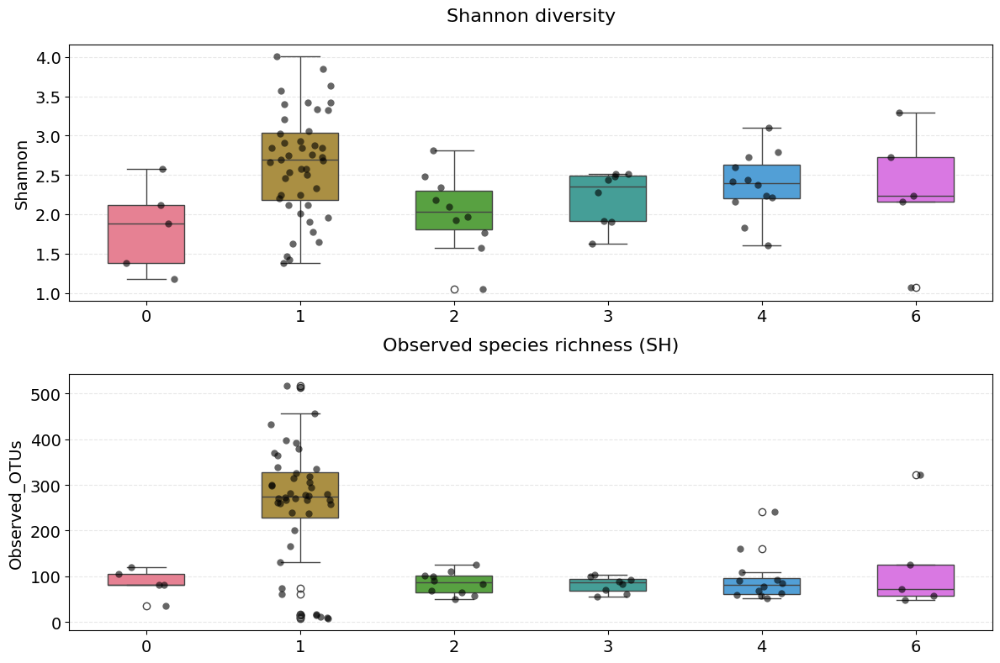


Статистический анализ:

Метрика: Shannon
        count      mean       std       min       25%       50%       75%  \
series                                                                      
0         5.0  1.826777  0.565188  1.172239  1.384259  1.878098  2.121507   
1        44.0  2.633859  0.660526  1.383946  2.182925  2.690801  3.038053   
2        10.0  2.020661  0.493569  1.049689  1.809032  2.031969  2.303431   
3         8.0  2.207765  0.343953  1.623573  1.916416  2.357420  2.486485   
4        12.0  2.374766  0.411294  1.606487  2.202760  2.392921  2.628157   
6         5.0  2.297584  0.821447  1.072147  2.159089  2.234892  2.731018   

             max  
series            
0       2.577782  
1       4.012735  
2       2.811961  
3       2.509599  
4       3.105491  
6       3.290775  

Метрика: Observed_OTUs
        count        mean         std   min     25%    50%     75%    max
series                                                                   
0         5.0   8

/tmp/ipython-input-91-2815620319.py:146: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(results.groupby('series')[metric].describe())
/tmp/ipython-input-91-2815620319.py:146: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(results.groupby('series')[metric].describe())


In [ ]:
# Индексы разнообразия по сериям мешочков
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.diversity import alpha_diversity

# 1. Фильтрация данных
print("Фильтрация данных...")
filtered_samples = metadata[
    metadata['substrate'].isin(['litter', 'litter bag'])
].copy()

# Проверка наличия данных
if filtered_samples.empty:
    raise ValueError("Нет данных после фильтрации!")

# 2. Проверка соответствия SampleID
print("Проверка соответствия SampleID...")
available_samples = list(set(filtered_samples['SampleID']) & set(normalized_data.columns))
if not available_samples:
    raise ValueError("Нет совпадений между SampleID в метаданных и нормализованных данных!")

filtered_samples = filtered_samples[filtered_samples['SampleID'].isin(available_samples)].reset_index(drop=True)
filtered_data = normalized_data[available_samples]

print(f"Доступно проб для анализа: {len(available_samples)}")
print("Распределение по series:")
print(filtered_samples['series'].value_counts())

# 3. Расчет альфа-разнообразия
print("\nРасчет индексов...")
try:
    # Проверка данных
    if filtered_data.empty:
        raise ValueError("Нет данных для расчета индексов!")

    # Преобразуем IDs в список строк
    sample_ids = filtered_data.columns.astype(str).tolist()

    # Расчет индексов
    shannon = alpha_diversity('shannon', filtered_data.T.values, ids=sample_ids)
    obs_otus = alpha_diversity('observed_otus', filtered_data.T.values, ids=sample_ids)

    # Создаем DataFrame с результатами
    results = pd.DataFrame({
        'SampleID': sample_ids,
        'Shannon': shannon,
        'Observed_OTUs': obs_otus
    })

    # Объединяем с метаданными (убедимся, что SampleID - столбец, а не индекс)
    results = results.merge(
        filtered_samples[['SampleID', 'series']].astype({'SampleID': str}),
        on='SampleID',
        how='left'
    )

    # Проверка результатов
    if results[['Shannon', 'Observed_OTUs']].isna().all().all():
        raise ValueError("Все значения индексов равны NaN - проверьте входные данные!")

    print("\nПервые 5 строк результатов:")
    print(results.head())

except Exception as e:
    print(f"Ошибка при расчете индексов: {str(e)}")
    raise

# 4. Визуализация
print("\nВизуализация результатов...")
if results.empty:
    raise ValueError("Нет данных для визуализации!")

plt.figure(figsize=(12, 8))

# Функция для создания графиков
def plot_metric(data, metric, title, ax, color_palette):
    # Удаляем NaN
    plot_data = data.dropna(subset=[metric])

    if plot_data.empty:
        print(f"Нет данных для {metric}!")
        return

    # Сортируем series для правильного порядка на графике
    plot_data = plot_data.sort_values('series')

    sns.boxplot(
        x='series',
        y=metric,
        data=plot_data,
        palette=color_palette,
        width=0.5,
        ax=ax
    )

    sns.stripplot(
        x='series',
        y=metric,
        data=plot_data,
        color='black',
        alpha=0.6,
        size=6,
        jitter=0.2,
        ax=ax
    )

    ax.set_title(title, pad=20, fontsize=16)  # Увеличиваем размер шрифта заголовка
    ax.set_ylabel(metric, fontsize=14)  # Увеличиваем размер шрифта подписи оси y
    ax.set_xlabel('')  # Убираем подпись оси x
    ax.tick_params(axis='both', which='major', labelsize=14)  # Настраиваем размер шрифта меток
    ax.grid(axis='y', linestyle='--', alpha=0.3)

# Цветовая палитра для разных значений series
palette = sns.color_palette("husl", len(results['series'].unique()))

# График 1: Индекс Шеннона
ax1 = plt.subplot(2, 1, 1)
plot_metric(results, 'Shannon', 'Shannon diversity', ax1, palette)

# График 2: Видовое богатство
ax2 = plt.subplot(2, 1, 2)
plot_metric(results, 'Observed_OTUs', 'Observed species richness (SH)', ax2, palette)

plt.tight_layout()
plt.show()

# 5. Статистический анализ
if not results.empty:
    print("\nСтатистический анализ:")
    for metric in ['Shannon', 'Observed_OTUs']:
        if metric in results.columns:
            print(f"\nМетрика: {metric}")
            print(results.groupby('series')[metric].describe())

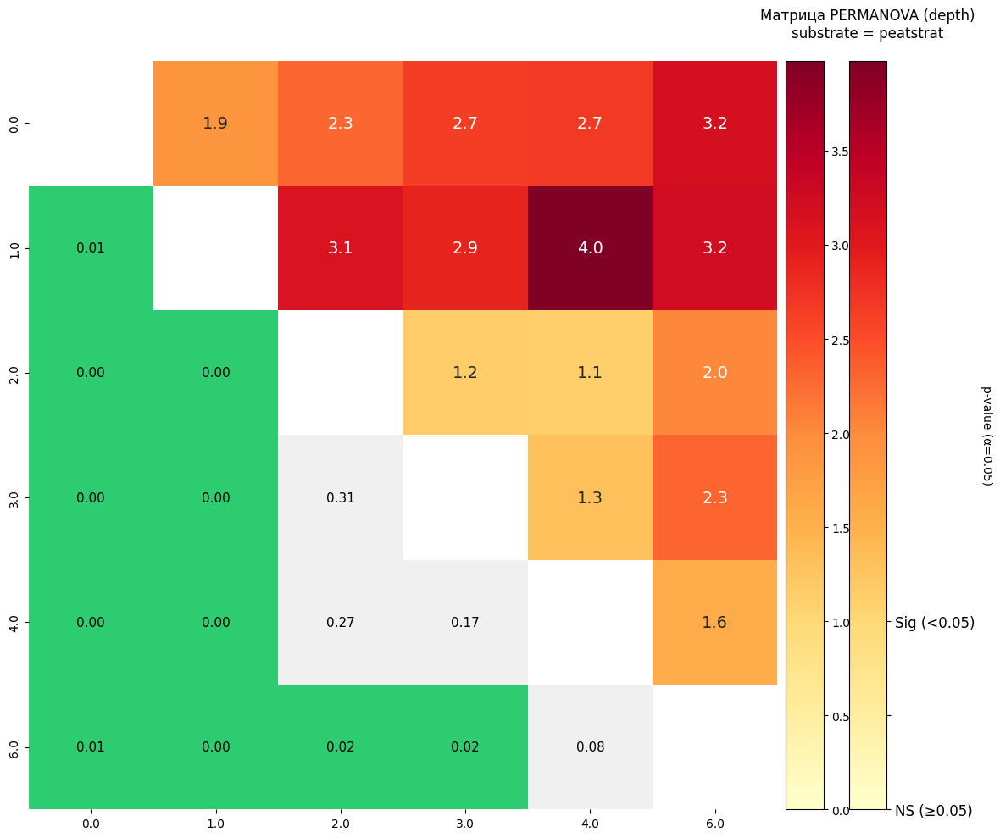

In [ ]:
# Матрица сходства для лет разложения (включая опад и мешочки)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.distance import permanova
from itertools import combinations
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

def build_depth_permanova_matrix(bc_dist, metadata, permutations=999, alpha=0.05):
    """
    Строит матрицу PERMANOVA для фактора series с цветовыми шкалами справа

    Parameters:
        bc_dist: матрица расстояний (отфильтрованная по mycopins)
        metadata: метаданные (отфильтрованные)
        permutations: количество перестановок
        alpha: уровень значимости
    """
    # 1. Подготовка данных
    depth_values = sorted(metadata['series'].dropna().unique())
    permanova_matrix = pd.DataFrame(np.nan, index=depth_values, columns=depth_values)

    # 2. Вычисление PERMANOVA для всех пар
    for (i, s1), (j, s2) in combinations(enumerate(depth_values), 2):
        ids1 = metadata[metadata['series'] == s1]['SampleID'].tolist()
        ids2 = metadata[metadata['series'] == s2]['SampleID'].tolist()

        if len(ids1) >= 3 and len(ids2) >= 3:
            try:
                subset_dm = bc_dist.filter(ids1 + ids2)
                result = permanova(
                    distance_matrix=subset_dm,
                    grouping=np.array([s1]*len(ids1) + [s2]*len(ids2)),
                    permutations=permutations
                )
                permanova_matrix.loc[s1, s2] = result['test statistic']
                permanova_matrix.loc[s2, s1] = result['p-value']
            except Exception as e:
                print(f"Ошибка {s1} vs {s2}: {str(e)}")

# 3. Визуализация с исправлениями
    plt.figure(figsize=(12, 10))
    ax = plt.gca()

    # Зеленая цветовая карта для p-values
    p_cmap = LinearSegmentedColormap.from_list('p_cmap', ['#f0f0f0', '#2ecc71'])

    # Маски для треугольников
    mask_upper = np.triu(np.ones_like(permanova_matrix, dtype=bool), k=1)
    mask_lower = np.tril(np.ones_like(permanova_matrix, dtype=bool), k=-1)

    # Верхний треугольник - F-значения
    f_plot = sns.heatmap(
        permanova_matrix.where(mask_upper),
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        mask=~mask_upper,
        square=True,
        annot_kws={"size": 14},
        vmin=0,
        cbar=False,
        ax=ax
    )

    # Нижний треугольник - p-values с округлением до 0.01
    p_plot = sns.heatmap(
        (permanova_matrix.where(mask_lower) < alpha).astype(float),
        annot=permanova_matrix.where(mask_lower).round(2),  # Округление до сотых
        fmt=".2f",  # Формат вывода с двумя знаками
        cmap=p_cmap,
        mask=~mask_lower,
        square=True,
        annot_kws={"size": 11, "color": "black"},
        vmin=0,
        vmax=1,
        cbar=False,
        ax=ax
    )

    # Добавляем цветовые шкалы справа
    divider = make_axes_locatable(ax)

    # Шкала для F-значений (красная)
    cax_f = divider.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(f_plot.get_children()[0], cax=cax_f, orientation='vertical')
    cax_f.set_ylabel('F-statistic', rotation=270, labelpad=15)

    # Шкала для p-values (зеленая)
    cax_p = divider.append_axes("right", size="5%", pad=0.3)
    p_colorbar = plt.colorbar(p_plot.get_children()[0], cax=cax_p, orientation='vertical')
    p_colorbar.set_label(f'p-value (α={alpha})', rotation=270, labelpad=15)
    p_colorbar.set_ticks([0, 0.5, 1])
    p_colorbar.set_ticklabels(['NS (≥0.05)', '', 'Sig (<0.05)'])

    # Настройки графика
    plt.title('Матрица PERMANOVA (depth)\nsubstrate = peatstrat', pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.tight_layout()

    # Сохранение
    plt.savefig('permanova_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    return permanova_matrix

# Пример использования:
if __name__ == "__main__":
    # Фильтрация данных по двум субстратам
    filtered_samples = metadata[
        (metadata['substrate'] == 'litter') |
        (metadata['substrate'] == 'litter bag')
    ]['SampleID']

    filtered_data = normalized_data[filtered_samples]
    filtered_metadata = metadata[metadata['SampleID'].isin(filtered_samples)].copy()


    # Расчет матрицы расстояний
    bc_dist = beta_diversity('braycurtis', filtered_data.T,
                           ids=filtered_metadata['SampleID'].tolist())

    # Построение матрицы
    series_matrix = build_depth_permanova_matrix(
        bc_dist=bc_dist,
        metadata=filtered_metadata,
        permutations=999,
        alpha=0.05
    )

# ECOLOGICAL GROUPS BASED ON FunGuild



In [ ]:
# Преобразование таблицы в нужный формат для скрипта FunGuild

import pandas as pd

# Загрузка данных (если нужно)
# data = pd.read_csv('your_file.tsv', sep='\t')

# Создаем копию исходных данных для работы
otu_table = data.copy()

# 1. Группируем данные по OTU_ID и SampleName, суммируя Count
otu_table = otu_table.groupby(['SH', 'SampleID'])['Count'].sum().unstack(fill_value=0)

# 2. Сбрасываем индекс, чтобы OTU_ID стал колонкой
otu_table = otu_table.reset_index()

# 4. Создаем таксономическую строку для каждого OTU
# Берем первую запись для каждого OTU (так как таксономия должна быть одинаковой для одного OTU)
taxonomy_data = data.drop_duplicates('SH').set_index('SH')

# Собираем таксономию из Sklearn (можно заменить на Blast при необходимости)
taxonomy_cols = [
    'Kingdom Sklearn', 'Phylum Sklearn', 'Class Sklearn',
    'Order Sklearn', 'Family Sklearn', 'Genus Sklearn', 'Species Sklearn'
]
prefixes = ['k__', 'p__', 'c__', 'o__', 'f__', 'g__', 's__']

# Функция для создания строки таксономии
def create_taxonomy(row):
    tax_parts = []
    for col, prefix in zip(taxonomy_cols, prefixes):
        value = str(row[col]).replace(' ', '_')  # Заменяем пробелы на подчеркивания
        if pd.isna(value) or value == 'nan':
            value = 'unidentified'
        tax_parts.append(f"{prefix}{value}")
    return ';'.join(tax_parts)

# Добавляем колонку taxonomy
otu_table['taxonomy'] = otu_table['SH'].map(
    lambda x: create_taxonomy(taxonomy_data.loc[x])
)

# 5. Переименовываем колонки с образцами в sample1, sample2 и т.д.
#sample_cols = [col for col in otu_table.columns if col not in ['ID', 'taxonomy']]
#otu_table.columns = ['ID'] + [f'sample{i+1}' for i in range(len(sample_cols))] + ['taxonomy']

# 6. Сохраняем результат
otu_table_guilds = otu_table

# Пример вывода первых строк
print(otu_table_guilds.head())

# Сохранение в файл (если нужно)
otu_table_guilds.to_csv('otu_table_guilds.tsv', sep='\t', index=False)

otu_table


SampleID                                         SH    1    2    3    4    5  \
0            SH0001579.10FU_KX461969_reps_singleton  0.0  0.0  0.0  0.0  0.0   
1         SH0001652.10FU_UDB01931429_reps_singleton  0.0  0.0  0.0  0.0  0.0   
2         SH0001807.10FU_UDB02777268_reps_singleton  0.0  0.0  0.0  0.0  0.0   
3         SH0001823.10FU_UDB03008422_reps_singleton  0.0  0.0  0.0  0.0  0.0   
4         SH0001824.10FU_UDB03389824_reps_singleton  0.0  0.0  0.0  0.0  0.0   

SampleID    6    7    8    9  ...  771  772  773  774  775  776  777  778  \
0         0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  1.0  1.0  3.0  2.0   
1         0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2         0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3         0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4         0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

SampleID  779                                           

SampleID,SH,1,2,3,4,5,6,7,8,9,...,771,772,773,774,775,776,777,778,779,taxonomy
0,SH0001579.10FU_KX461969_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,3.0,2.0,0.0,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Hel...
1,SH0001652.10FU_UDB01931429_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...
2,SH0001807.10FU_UDB02777268_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__unidentified;o__unid...
3,SH0001823.10FU_UDB03008422_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__unidentified;o__unid...
4,SH0001824.10FU_UDB03389824_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__unidentified;o__unid...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4958,SH1957084.10FU_DQ677655_refs,0.0,0.0,0.0,0.0,0.0,0.0,17.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...
4959,SH1957257.10FU_EU280098_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...
4960,SH1957645.10FU_MH287489_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...
4961,SH1957671.10FU_DQ083015_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...


In [ ]:
from google.colab import drive
import pandas as pd
import sys
import os

# Подключите Google Drive
drive.mount('/content/drive')

# Пути к файлам (замените на свои)
SCRIPT_PATH = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/FUNGuild/Guilds_v1.1.py'
OTU_TABLE_PATH = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/FUNGuild/otu_table_guilds.tsv'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Чтение вашей таблицы в Pandas

otu_table = pd.read_csv(OTU_TABLE_PATH,\
                 sep='\t',
                index_col=0)

otu_table

,1,2,3,4,5,6,7,8,9,10,...,771,772,773,774,775,776,777,778,779,taxonomy
SH,,,,,,,,,,,,,,,,,,,,,
SH0001579.10FU_KX461969_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,3.0,2.0,0.0,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Hel...
SH0001652.10FU_UDB01931429_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...
SH0001807.10FU_UDB02777268_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__unidentified;o__unid...
SH0001823.10FU_UDB03008422_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__unidentified;o__unid...
SH0001824.10FU_UDB03389824_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__unidentified;o__unid...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SH1957084.10FU_DQ677655_refs,0.0,0.0,0.0,0.0,0.0,0.0,17.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...
SH1957257.10FU_EU280098_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...
SH1957645.10FU_MH287489_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,k__Fungi;p__Ascomycota;c__Sordariomycetes;o__H...


In [ ]:
# Добавьте путь к скрипту в систему
sys.path.append(os.path.dirname(SCRIPT_PATH))

# Если скрипт не поддерживает импорт, используйте subprocess
import subprocess
result = subprocess.run(
    ['python', SCRIPT_PATH, '-otu', OTU_TABLE_PATH, '-db', 'fungi'],
    capture_output=True,
    text=True
)
print(result.stdout)  # Вывод результатов

FunGuild v1.1 Beta
Connecting with FUNGuild database ...

Reading in the OTU table: '/content/drive/MyDrive/Colab Notebooks/IT_expedition/FUNGuild/otu_table_guilds.tsv'

Searching the FUNGuild database...
10%
20%
30%
40%
50%
60%
70%
80%
90%
100%

Found 3495 matching taxonomy records in the database.
Dereplicating and sorting the result...
FunGuild tried to assign function to 4963 OTUs in '/content/drive/MyDrive/Colab Notebooks/IT_expedition/FUNGuild/otu_table_guilds.tsv'.
FUNGuild made assignments on 2090 OTUs.
Result saved to '/content/drive/MyDrive/Colab Notebooks/IT_expedition/FUNGuild/otu_table_guilds.guilds.txt'

Total calculating time: 43.77 seconds.



In [ ]:
# Загружаем готовую таблицу в сессию
OTU_TABLE_PATH_ready = '/content/drive/MyDrive/Colab Notebooks/IT_expedition/FUNGuild/otu_table_guilds.guilds.txt'

In [ ]:
# Загружаем готовую таблицу в сессию

guilds_raw = pd.read_csv(OTU_TABLE_PATH_ready,\
                 sep='\t',
                index_col=0)

guilds_raw

,1,2,3,4,5,6,7,8,9,10,...,taxonomy,Taxon,Taxon Level,Trophic Mode,Guild,Growth Morphology,Trait,Confidence Ranking,Notes,Citation/Source
SH,,,,,,,,,,,,,,,,,,,,,
SH1255416.10FU_AY762619_refs,0.0,0.0,0.0,97.0,0.0,1.0,0.0,0.0,220.0,630.0,...,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Hel...,Hyaloscyphaceae,9,Saprotroph,Plant Saprotroph-Wood Saprotroph,Microfungus,NaN,Probable,Saprobic on woody and herbaceous material (Can...,"Cannon PF, Kirk PM. 2007. Fungal Families of t..."
SH1290110.10FU_MW764165_reps,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,k__Fungi;p__Ascomycota;c__Dothideomycetes;o__D...,-,-,-,-,-,-,-,Unassigned,-
SH0083069.10FU_MH909060_reps_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Hel...,Mollisia,13,Pathotroph-Saprotroph-Symbiotroph,Endophyte-|Plant Pathogen|-Plant Saprotroph,Microfungus-Pezizoid,Soft Rot,Probable,As foliar_endophyte (Põlme et al. 2020); As li...,"James TY, et al. 2006. Nature 443:818-822 ((ht..."
SH1255185.10FU_UDB03457430_reps,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,4.0,0.0,...,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Hel...,Hyaloscyphaceae,9,Saprotroph,Plant Saprotroph-Wood Saprotroph,Microfungus,NaN,Probable,Saprobic on woody and herbaceous material (Can...,"Cannon PF, Kirk PM. 2007. Fungal Families of t..."
SH1786802.10FU_KJ663825_refs,0.0,0.0,0.0,0.0,0.0,1.0,2.0,3.0,0.0,0.0,...,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Pha...,Phacidium,13,Pathotroph-Symbiotroph,Endophyte-|Plant Pathogen|,Microfungus,NaN,Probable,As foliar_endophyte (Põlme et al. 2020); Decay...,"Tedersoo L, et al. 2014. Science 346:e1256688 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SH1861456.10FU_KT037522_refs,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,k__Fungi;p__Ascomycota;c__Dothideomycetes;o__D...,-,-,-,-,-,-,-,Unassigned,-
SH1896828.10FU_KY979754_refs_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,k__Fungi;p__Ascomycota;c__Dothideomycetes;o__u...,-,-,-,-,-,-,-,Unassigned,-
SH1933271.10FU_MN688634_refs_singleton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,k__Fungi;p__Ascomycota;c__unidentified;o__unid...,-,-,-,-,-,-,-,Unassigned,-


In [ ]:
# Чистка таблицы от лишних пробелов в значениях (Trophic Mode)

import pandas as pd
import re

def clean_trophic_mode(value):
    if pd.isna(value):
        return pd.NA

    # Приводим к строке и очищаем
    value = str(value).strip()
    value = re.sub(r'\s+', ' ', value)  # Удаляем двойные пробелы
    value = re.sub(r'\s*-\s*', '-', value)  # Чистим вокруг дефисов

    # Специфические замены (добавляем новые случаи)
    replacements = {
        'pathotroph-saprotroph': 'Pathotroph-Saprotroph',
        'saprotroph-symbiotroph': 'Saprotroph-Symbiotroph',
        'pathotroph-symbiotroph': 'Pathotroph-Symbiotroph',
        'pathotroph-pathotroph-saprotroph': 'Pathotroph-Saprotroph',
        'symbiotroph-saprotroph-symbiotroph': 'Saprotroph-Symbiotroph'
    }

    # Приводим к нижнему регистру для сравнения
    lower_val = value.lower()
    if lower_val in replacements:
        return replacements[lower_val]

    # Стандартная обработка для остальных случаев
    if '-' in value:
        parts = sorted(set(value.lower().split('-')))  # Удаляем дубли внутри
        value = '-'.join(parts).capitalize()

    return value.capitalize()

# Применяем ко всему столбцу
guilds_raw['Trophic Mode'] = guilds_raw['Trophic Mode'].apply(clean_trophic_mode)

# Проверяем результат
print("Уникальные значения после очистки:")
print(guilds_raw['Trophic Mode'].value_counts(dropna=False))

# Дополнительная проверка специальных случаев
special_cases = ['Pathotroph-saprotroph', 'Saprotroph-symbiotroph', 'Pathotroph-symbiotroph']
for case in special_cases:
    cleaned = clean_trophic_mode(case)
    print(f"{case} -> {cleaned}")

Уникальные значения после очистки:
Trophic Mode
                                     2873
Saprotroph                            606
Pathotroph-saprotroph-symbiotroph     480
Pathotroph-Saprotroph                 319
Symbiotroph                           263
Saprotroph-Symbiotroph                222
Pathotroph                            134
Pathotroph-Symbiotroph                 66
Name: count, dtype: int64
Pathotroph-saprotroph -> Pathotroph-Saprotroph
Saprotroph-symbiotroph -> Saprotroph-Symbiotroph
Pathotroph-symbiotroph -> Pathotroph-Symbiotroph


In [ ]:
# Нормализуем полученную матрицу


# Выделяем только числовые столбцы с пробами (исключаем таксономические колонки)
sample_columns = guilds_raw.columns[guilds_raw.columns.str.isdigit()]  # или явно указать: sample_columns = ['1','2','3',...]

# Копируем только числовую часть таблицы
abundance_data = guilds_raw[sample_columns].copy()

# Нормализация: для каждой пробы переводим в проценты
normalized_data = abundance_data.div(abundance_data.sum(axis=0)) * 100

# Объединяем с таксономическими данными
guilds = pd.concat([
    normalized_data,
    guilds_raw.drop(sample_columns, axis=1)
], axis=1)

# Проверка результата
print("После нормализации (сумма по каждому столбцу должна быть ~100%):")
print(normalized_data.sum(axis=0).round(2))

# Сохранение (если нужно)
# result_df.to_csv('normalized_table.tsv', sep='\t')

display(guilds.head())

После нормализации (сумма по каждому столбцу должна быть ~100%):
1      100.0
2      100.0
3      100.0
4      100.0
5      100.0
       ...  
775    100.0
776    100.0
777    100.0
778    100.0
779    100.0
Length: 285, dtype: float64


,1,2,3,4,5,6,7,8,9,10,...,taxonomy,Taxon,Taxon Level,Trophic Mode,Guild,Growth Morphology,Trait,Confidence Ranking,Notes,Citation/Source
SH,,,,,,,,,,,,,,,,,,,,,
SH1255416.10FU_AY762619_refs,0.0,0.0,0.000000,17.477477,0.000000,0.028678,0.000000,0.000000,2.615001,26.559865,...,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Hel...,Hyaloscyphaceae,9,Saprotroph,Plant Saprotroph-Wood Saprotroph,Microfungus,NaN,Probable,Saprobic on woody and herbaceous material (Can...,"Cannon PF, Kirk PM. 2007. Fungal Families of t..."
SH1290110.10FU_MW764165_reps,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,k__Fungi;p__Ascomycota;c__Dothideomycetes;o__D...,-,-,,-,-,-,-,Unassigned,-
SH0083069.10FU_MH909060_reps_singleton,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Hel...,Mollisia,13,Pathotroph-saprotroph-symbiotroph,Endophyte-|Plant Pathogen|-Plant Saprotroph,Microfungus-Pezizoid,Soft Rot,Probable,As foliar_endophyte (Põlme et al. 2020); As li...,"James TY, et al. 2006. Nature 443:818-822 ((ht..."
SH1255185.10FU_UDB03457430_reps,0.0,0.0,0.040733,0.000000,0.108696,0.000000,0.000000,0.008370,0.047545,0.000000,...,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Hel...,Hyaloscyphaceae,9,Saprotroph,Plant Saprotroph-Wood Saprotroph,Microfungus,NaN,Probable,Saprobic on woody and herbaceous material (Can...,"Cannon PF, Kirk PM. 2007. Fungal Families of t..."
SH1786802.10FU_KJ663825_refs,0.0,0.0,0.000000,0.000000,0.000000,0.028678,0.018818,0.025111,0.000000,0.000000,...,k__Fungi;p__Ascomycota;c__Leotiomycetes;o__Pha...,Phacidium,13,Pathotroph-Symbiotroph,Endophyte-|Plant Pathogen|,Microfungus,NaN,Probable,As foliar_endophyte (Põlme et al. 2020); Decay...,"Tedersoo L, et al. 2014. Science 346:e1256688 ..."


In [ ]:
# Для Trophic Mode
guilds['Trophic Mode'].value_counts(normalize=True) * 100



,proportion
Trophic Mode,
,57.888374
Saprotroph,12.210357
Pathotroph-saprotroph-symbiotroph,9.671570
Pathotroph-Saprotroph,6.427564
Symbiotroph,5.299214
Saprotroph-Symbiotroph,4.473101
Pathotroph,2.699980
Pathotroph-Symbiotroph,1.329841


In [ ]:
# Для Growth Morphogy
guilds['Growth Morphology'].value_counts(normalize=True) * 100

,proportion
Growth Morphology,
-,58.099090
Microfungus,20.505561
Agaricoid,4.570273
Yeast,2.871587
Corticioid,2.386249
Thallus,1.375126
Clavarioid,1.253792
Microfungus-Pezizoid,0.970677
Dimorphic-Microfungus,0.950455


<Axes: xlabel='count', ylabel='Trophic Mode'>

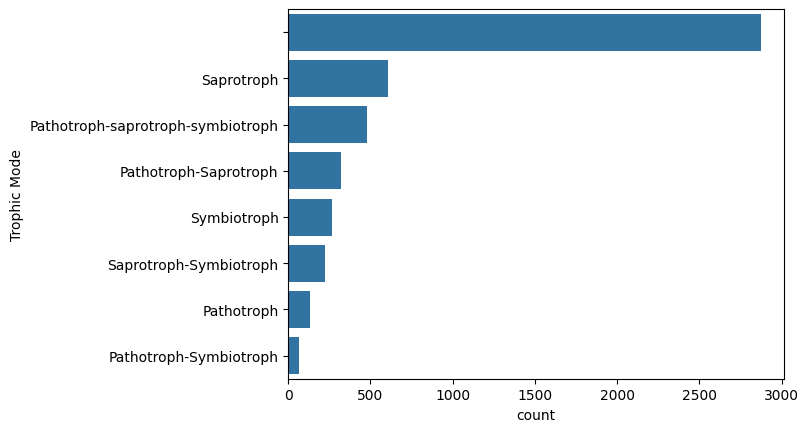

In [ ]:
# Общее число по трофическим группам
import seaborn as sns
sns.countplot(data=guilds, y='Trophic Mode', order=guilds['Trophic Mode'].value_counts().index)

Проверка данных в guilds:
- Размер матрицы: (2090, 295)
- Пример названий проб: ['1', '2', '3', '4', '5']
- Пример таксонов: ['SH1255416.10FU_AY762619_refs', 'SH0083069.10FU_MH909060_reps_singleton', 'SH1255185.10FU_UDB03457430_reps', 'SH1786802.10FU_KJ663825_refs', 'SH1255355.10FU_AJ319078_refs']
- Пример значений: 0.0

Проверка метаданных:
- Количество записей: 285
- Уникальные субстраты: ['litter' 'litter bag' 'mycopins' 'mycorrhiza' 'peatspill' 'peatstrat'
 'peatupper']

Найдено 285 общих проб


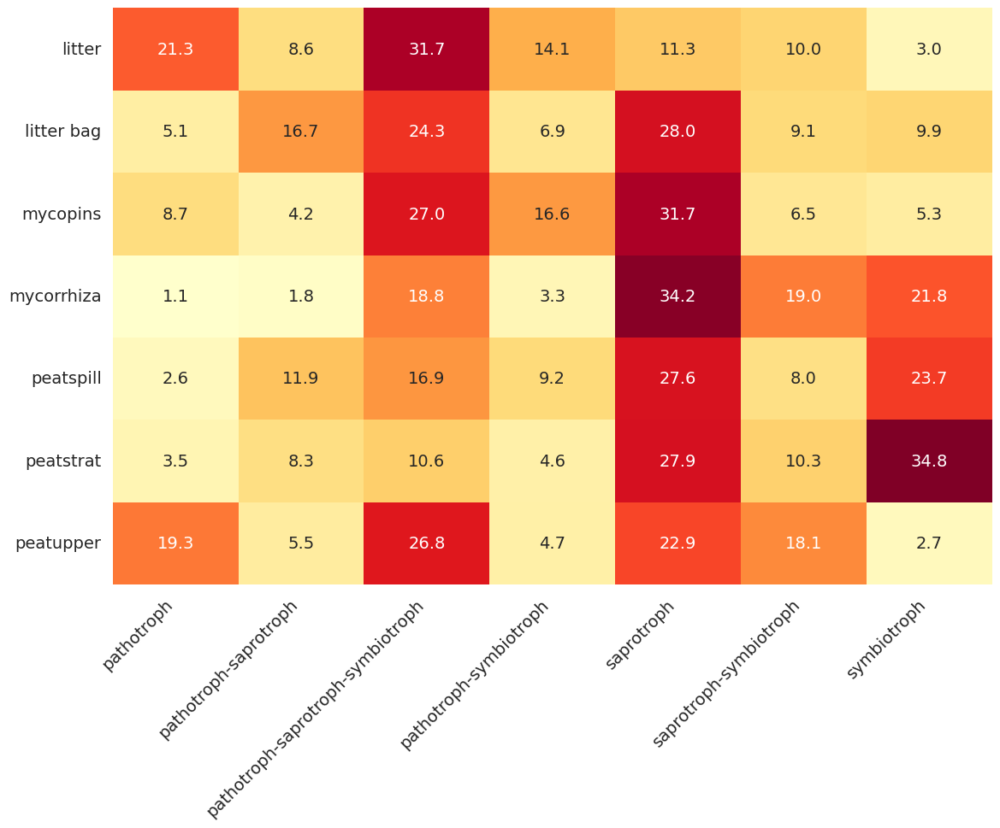


Результаты ANOVA: F = 5.98, p = 0.0001
Есть статистически значимые различия между субстратами


In [ ]:
# Тепловая карта по трофическим группам и субстратам
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import f_oneway

# 1. Исправление предупреждения SettingWithCopyWarning
metadata.loc[:, 'SampleID'] = metadata['SampleID'].astype(str).str.strip()
guilds.columns = guilds.columns.astype(str).str.strip()

# 2. Проверка данных
print("Проверка данных в guilds:")
print("- Размер матрицы:", guilds.shape)
print("- Пример названий проб:", guilds.columns[:5].tolist())
print("- Пример таксонов:", guilds.index[:5].tolist())
print("- Пример значений:", guilds.iloc[0, 0])

print("\nПроверка метаданных:")
print("- Количество записей:", len(metadata))
print("- Уникальные субстраты:", metadata['substrate'].unique())

# 3. Выбор общих проб
common_samples = list(set(guilds.columns) & set(metadata['SampleID']))
print(f"\nНайдено {len(common_samples)} общих проб")

if not common_samples:
    raise ValueError("Нет совпадающих проб между таблицами!")

# 4. Подготовка данных
matrix = guilds[common_samples].copy()
matrix_long = matrix.stack().reset_index()
matrix_long.columns = ['Taxon', 'SampleID', 'Abundance']

# 5. Добавление функциональных признаков
functional_cols = ['Trophic Mode', 'Guild', 'Growth Morphology']
for col in functional_cols:
    matrix_long[col] = matrix_long['Taxon'].map(guilds[col])

# 6. Объединение с метаданными
merged = pd.merge(matrix_long, metadata, on='SampleID')

# 7. Создание сводной таблицы
pivot_table = merged.pivot_table(
    index='substrate',
    columns='Trophic Mode',
    values='Abundance',
    aggfunc='mean',
    fill_value=0
)

# 8. Нормализация
pivot_norm = pivot_table.div(pivot_table.sum(axis=1), axis=0) * 100

# 9. Визуализация с исправлениями
plt.figure(figsize=(12, 10))

# Настройка стиля
sns.set(font_scale=1.4)  # Увеличиваем размер шрифта

# Создаем heatmap без легенды
heatmap = sns.heatmap(
    pivot_norm,
    annot=True,
    fmt=".1f",
    cmap="YlOrRd",
    annot_kws={"size": 14},  # Размер шрифта аннотаций
    cbar=False  # Полностью убираем цветовую шкалу
)

# Настройка подписей осей с поворотом 45 градусов
heatmap.set_xticklabels(
    heatmap.get_xticklabels(),
    fontsize=14,
    rotation=45,  # Угол поворота 45 градусов
    ha='right'    # Выравнивание по правому краю
)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=14)

plt.title("", fontsize=14)
plt.xlabel("", fontsize=14)
plt.ylabel("", fontsize=14)
plt.tight_layout()  # Автоматическая подгонка layout'а
plt.show()

# 10. Статистический анализ
anova_data = [pivot_table[mode].values for mode in pivot_table.columns]
f_val, p_val = f_oneway(*anova_data)

print(f"\nРезультаты ANOVA: F = {f_val:.2f}, p = {p_val:.4f}")
if p_val < 0.05:
    print("Есть статистически значимые различия между субстратами")
else:
    print("Нет значимых различий между субстратами")

/tmp/ipython-input-176-1705019816.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata['SampleID'] = metadata['SampleID'].astype(str).str.strip()


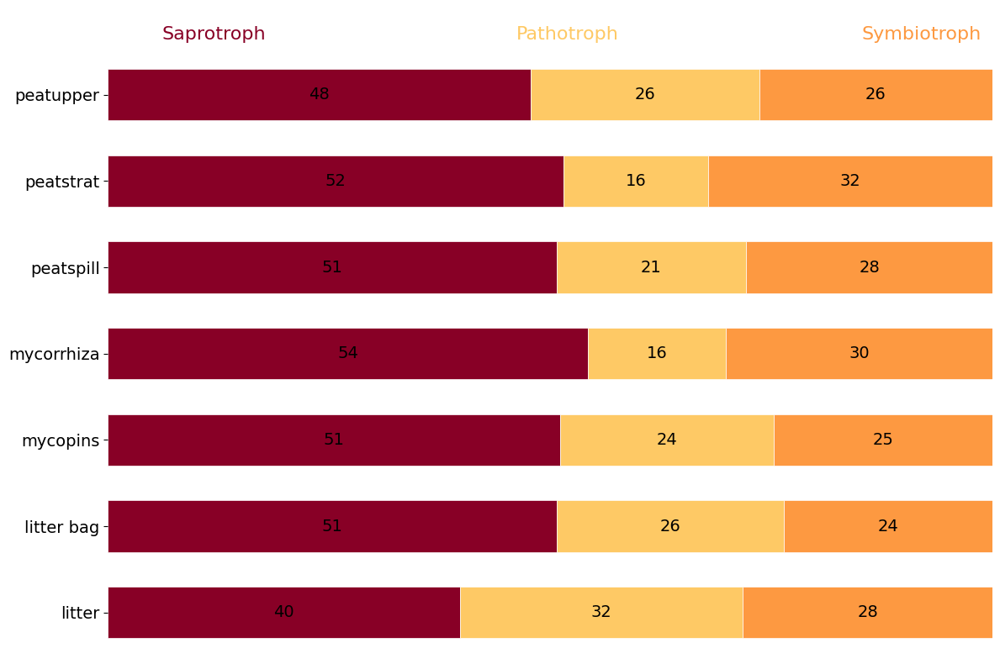


Relative abundance of pure ecological groups by substrates (%):
Split_Trophic  saprotroph  pathotroph  symbiotroph
substrate                                         
litter               39.8        32.0         28.2
litter bag           50.8        25.6         23.6
mycopins             51.1        24.2         24.7
mycorrhiza           54.2        15.6         30.1
peatspill            50.7        21.4         27.9
peatstrat            51.5        16.3         32.2
peatupper            47.8        25.8         26.4


In [ ]:
# Нормализованная столбчатая диаграмма по стандартизованным трофическим группам
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Подготовка данных
guilds['Trophic Mode'] = guilds['Trophic Mode'].str.lower()
guilds = guilds[guilds['Trophic Mode'] != '']
pure_groups = ['saprotroph', 'pathotroph', 'symbiotroph']

def split_mixed_groups(trophic_mode):
    if pd.isna(trophic_mode):
        return []
    return [g.strip() for g in trophic_mode.split('-')]

# 2. Создаем таблицу с долями групп по субстратам
matrix = guilds.T
matrix.index.name = 'SampleID'
matrix.reset_index(inplace=True)

melted = matrix.melt(id_vars='SampleID', var_name='Taxon', value_name='Abundance')
melted['Trophic Mode'] = melted['Taxon'].map(guilds['Trophic Mode'])
melted['Split_Trophic'] = melted['Trophic Mode'].apply(split_mixed_groups)
expanded = melted.explode('Split_Trophic')
expanded = expanded[expanded['Split_Trophic'].isin(pure_groups)]

# Объединяем с метаданными
metadata['SampleID'] = metadata['SampleID'].astype(str).str.strip()
expanded['SampleID'] = expanded['SampleID'].astype(str).str.strip()
merged = pd.merge(expanded, metadata[['SampleID', 'substrate']], on='SampleID')

# 3. Расчет долей для stacked plot
stacked_data = merged.groupby(['substrate', 'Split_Trophic'])['Abundance'].sum().unstack()
stacked_data = stacked_data.div(stacked_data.sum(axis=1), axis=0) * 100
stacked_data = stacked_data[pure_groups]
stacked_data = stacked_data.apply(pd.to_numeric, errors='coerce')

# 4. Визуализация с подписями групп вверху
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'none'
plt.rcParams['axes.facecolor'] = 'none'

fig, ax = plt.subplots(figsize=(12, 8), facecolor='none')

# Убираем все рамки вокруг графика
for spine in ax.spines.values():
    spine.set_visible(False)  # Эта строка убирает все границы

# Порядок и цвета групп
group_order = ['saprotroph', 'pathotroph', 'symbiotroph']
custom_palette = {
    'saprotroph': '#880026',
    'pathotroph': '#FEC965',
    'symbiotroph': '#FD9941'
}

substrates = stacked_data.index
y_pos = np.arange(len(substrates))
bar_height = 0.6
bottom = np.zeros(len(substrates))

# Рисуем столбцы
for group in group_order:
    ax.barh(
        y_pos,
        stacked_data[group],
        height=bar_height,
        left=bottom,
        color=custom_palette[group],
        edgecolor='white',
        linewidth=0.5
    )
    bottom += stacked_data[group]

# Добавляем подписи групп вверху внутри области графика
title_pad = 0.2  # Отступ заголовка от верха
for i, group in enumerate(group_order):
    ax.text(
        12 + i*40,  # Распределяем по горизонтали
        len(substrates) - 0.4,  # Поднимаем чуть выше верхнего столбца
        group.capitalize(),
        color=custom_palette[group],
        fontsize=16,
        ha='center',
        va='bottom'
    )

# Настройки графика
ax.set_yticks(y_pos)
ax.set_yticklabels(substrates, fontsize=14)
ax.set_xticks([])
ax.set_title('',
             fontsize=16, pad=20)
ax.set_xlim(0, 100)
ax.set_ylim(-0.5, len(substrates))  # Оставляем немного места сверху
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Подписи значений внутри столбцов
for i, (substrate, row) in enumerate(stacked_data.iterrows()):
    cumulative = 0
    for group in group_order:
        value = row[group]
        if value > 4:
            ax.text(
                cumulative + value/2,
                i,
                f'{int(round(value))}',
                ha='center',
                va='center',
                color='black',
                fontsize=14
            )
        cumulative += value

plt.tight_layout()
plt.show()

# 5. Вывод таблицы с результатами
print("\nRelative abundance of pure ecological groups by substrates (%):")
print(stacked_data.round(1))

In [ ]:
# Оценка статистических различий между субстратами по трофическим группам

# 5. Статистический анализ (ANOVA)
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd

print("\nСтатистический анализ различий между субстратами:")

# Преобразуем данные для ANOVA и убедимся, что Abundance - числовой тип
anova_data = merged.copy()
anova_data['Abundance'] = pd.to_numeric(anova_data['Abundance'], errors='coerce')  # Преобразуем в числовой тип
anova_data = anova_data.dropna(subset=['Abundance'])  # Удаляем пропущенные значения

# Для каждой экологической группы проводим ANOVA
for group in pure_groups:
    print(f"\nАнализ для группы: {group.capitalize()}")

    # Фильтруем данные по текущей группе
    group_data = anova_data[anova_data['Split_Trophic'] == group]

    # Проверяем, есть ли достаточно данных
    if len(group_data) < 3 or len(group_data['substrate'].unique()) < 2:
        print("Недостаточно данных для анализа")
        continue

    # Подготовка данных для ANOVA
    substrates = group_data['substrate'].unique()
    anova_groups = [group_data[group_data['substrate'] == s]['Abundance'].values for s in substrates]

    # Проводим one-way ANOVA
    try:
        f_val, p_val = f_oneway(*anova_groups)
        print(f"One-way ANOVA: F = {f_val:.3f}, p = {p_val:.4f}")

        # Интерпретация результата
        if p_val < 0.05:
            print("Обнаружены статистически значимые различия между субстратами (p < 0.05)")

            # Post-hoc тест Тьюки для попарного сравнения
            print("\nPost-hoc тест Тьюки:")
            # Убедимся, что нет пропущенных значений и тип данных правильный
            tukey_data = group_data[['Abundance', 'substrate']].dropna()
            tukey_data['Abundance'] = pd.to_numeric(tukey_data['Abundance'], errors='coerce')
            tukey_data = tukey_data.dropna()

            if len(tukey_data) > 0:
                tukey = pairwise_tukeyhsd(
                    endog=tukey_data['Abundance'],
                    groups=tukey_data['substrate'],
                    alpha=0.05
                )
                print(tukey)
            else:
                print("Недостаточно данных для post-hoc анализа")
        else:
            print("Статистически значимых различий между субстратами не обнаружено (p > 0.05)")
    except Exception as e:
        print(f"Ошибка при выполнении ANOVA: {str(e)}")

# 6. Вывод таблицы с результатами
print("\nОтносительное обилие чистых экологических групп по субстратам (%):")
print(stacked_data.round(1))


Статистический анализ различий между субстратами:

Анализ для группы: Saprotroph
One-way ANOVA: F = 2.752, p = 0.0113
Обнаружены статистически значимые различия между субстратами (p < 0.05)

Post-hoc тест Тьюки:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
  group1     group2   meandiff p-adj   lower   upper  reject
------------------------------------------------------------
    litter litter bag   0.0042 0.9816 -0.0107  0.0192  False
    litter   mycopins   0.0089 0.4642 -0.0047  0.0225  False
    litter mycorrhiza   0.0155 0.0363  0.0006  0.0305   True
    litter  peatspill   0.0035 0.9981 -0.0153  0.0223  False
    litter  peatstrat  -0.0029 0.9981 -0.0182  0.0125  False
    litter  peatupper   0.0029  0.997 -0.0115  0.0173  False
litter bag   mycopins   0.0046 0.9586 -0.0093  0.0186  False
litter bag mycorrhiza   0.0113 0.3104  -0.004  0.0266  False
litter bag  peatspill  -0.0007    1.0 -0.0198  0.0184  False
litter bag  peatstrat  -0.0071 0.8393 -0.0228  0.0086  

# INDICATOR SPECIES ANALYSIS

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import pointbiserialr
from statsmodels.stats.multitest import multipletests

### 1. Подготовка данных ###
# Создаем таксономическую таблицу
taxonomy_df = (data[['SH', 'Kingdom Sklearn', 'Phylum Sklearn',
                    'Class Sklearn', 'Order Sklearn',
                    'Family Sklearn', 'Genus Sklearn',
                    'Species Sklearn']]
              .drop_duplicates(subset=['SH'])
              .set_index('SH'))

# Переименовываем колонки
taxonomy_df.columns = ['Kingdom', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

# Создаем OTU-таблицу (широкий формат)
normalized_data = (data.pivot_table(index='SH',
                                  columns='SampleID',
                                  values='Count',
                                  fill_value=0))

# Нормализация (если еще не сделано)
normalized_data = normalized_data.div(normalized_data.sum(axis=0), axis=1)

### 2. Фильтрация синглтонов ###
min_samples = 2  # Минимальное число образцов
min_abundance = 0.001  # Минимальная относительная численность

# Фильтр по числу образцов
otu_presence = (normalized_data > 0).sum(axis=1)
filtered_data = normalized_data[otu_presence >= min_samples]

# Фильтр по численности
max_abundance = filtered_data.max(axis=1)
filtered_data = filtered_data[max_abundance >= min_abundance]

print(f"После фильтрации осталось {len(filtered_data)} OTU из {len(normalized_data)}")

### 3. Очистка таксономии ###
def clean_taxonomy(row):
    ranks = ['Kingdom', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']
    for rank in ranks:
        if pd.notna(row[rank]):
            val = str(row[rank])
            if '_sp' in val and rank == 'Species':
                row[rank] = np.nan
            if '_Incertae_sedis' in val:
                row[rank] = np.nan
            if any(x in val.lower() for x in ['uncultured', 'unidentified']):
                row[rank] = np.nan
    return row

taxonomy_df = taxonomy_df.apply(clean_taxonomy, axis=1)

### 4. Анализ индикаторных видов ###
def indicator_species_analysis(otu_table, metadata, taxonomy_df, group_column='substrate'):
    substrates = metadata[group_column].unique()
    results = []

    for otu in otu_table.index:
        if otu not in taxonomy_df.index:
            continue

        tax_row = taxonomy_df.loc[otu]

        for substrate in substrates:
            group_vector = (metadata[group_column] == substrate).astype(int)
            otu_vector = otu_table.loc[otu].values

            if sum(otu_vector[group_vector == 1]) > 0:
                r, p_value = pointbiserialr(group_vector, otu_vector)
            else:
                r, p_value = 0, 1

            results.append({
                'OTU': otu,
                'Substrate': substrate,
                'Correlation': r,
                'p_value': p_value,
                'Mean_abundance': otu_vector[group_vector == 1].mean(),
                **tax_row.to_dict()
            })

    results_df = pd.DataFrame(results)

    # Коррекция FDR
    _, pvals_corrected, _, _ = multipletests(results_df['p_value'], method='fdr_bh')
    results_df['p_value_adj'] = pvals_corrected

    return results_df.sort_values(['Substrate', 'Correlation'], ascending=[True, False])

# Выполняем анализ
indicators = indicator_species_analysis(filtered_data, metadata, taxonomy_df)

### 5. Фильтрация значимых результатов ###
significant = indicators[indicators['p_value_adj'] < 0.05]

### 6. Добавление максимального таксономического уровня ###
def add_max_resolution(df):
    ranks = ['Kingdom', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']
    def get_max_res(row):
        for rank in reversed(ranks):
            if pd.notna(row[rank]):
                return rank
        return 'Undefined'

    df['Max_Resolution'] = df.apply(get_max_res, axis=1)
    return df

significant = add_max_resolution(significant)

### 7. Сохранение результатов ###
output_cols = ['Substrate', 'OTU', 'Kingdom', 'Phylum', 'Class', 'Order',
              'Family', 'Genus', 'Species', 'Max_Resolution', 'Correlation',
              'p_value', 'p_value_adj', 'Mean_abundance']

significant[output_cols].to_csv(
    'final_indicator_species.csv',
    index=False,
    float_format='%.5f'
)

print(f"Анализ завершен. Найдено {len(significant)} значимых индикаторных видов")
print("Результаты сохранены в final_indicator_species.csv")

После фильтрации осталось 2530 OTU из 4963
Анализ завершен. Найдено 978 значимых индикаторных видов
Результаты сохранены в final_indicator_species.csv


/tmp/ipython-input-84-1864831549.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Max_Resolution'] = df.apply(get_max_res, axis=1)


Сводная таблица:
            N_indicators  Mean_Rpb  Median_abundance
Substrate                                           
litter                73  0.227619          0.001257
litter bag            90  0.227398          0.000698
mycopins             139  0.209110          0.000505
mycorrhiza            80  0.228377          0.001788
peatspill             78  0.292333          0.001352
peatstrat            161  0.234032          0.000459
peatupper            357  0.235655          0.000251


/tmp/ipython-input-93-1347855953.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipython-input-93-1347855953.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 9.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 31.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 2

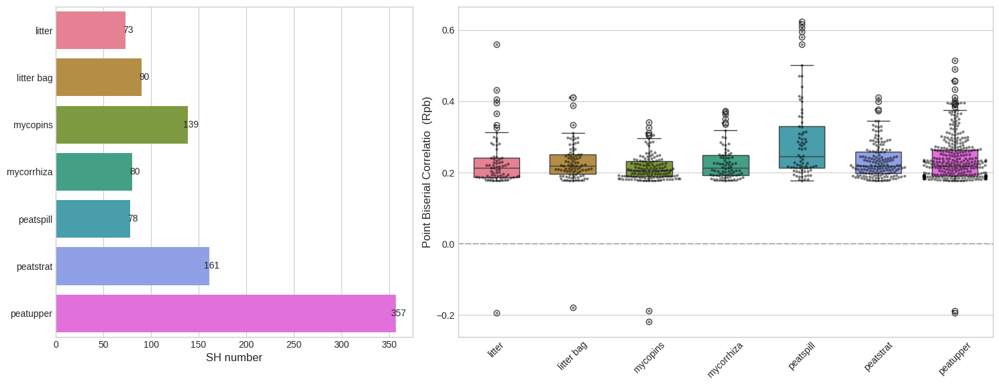

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

### 1. Создаем сводную таблицу ###
summary_table = (significant.groupby('Substrate')
                 .agg(
                     N_indicators=('OTU', 'count'),
                     Mean_Rpb=('Correlation', 'mean'),
                     Median_abundance=('Mean_abundance', 'median')
                 )
)
print("Сводная таблица:")
print(summary_table)

### 2. Визуализация ###
plt.style.use('seaborn-v0_8-whitegrid')  # Исправленное название стиля
cmap = "husl"

# Создаем фигуру с 2 субплoтами
fig = plt.figure(figsize=(15, 6))
gs = GridSpec(1, 2, width_ratios=[1, 1.5])

# График 1: Количество индикаторных видов
ax1 = plt.subplot(gs[0])
sns.barplot(
    data=summary_table.reset_index(),
    x='N_indicators',
    y='Substrate',
    palette=cmap,
    ax=ax1
)
ax1.set_title('', fontsize=14, pad=20)
ax1.set_xlabel('SH number', fontsize=12)
ax1.set_ylabel('')

for p in ax1.patches:
    ax1.annotate(
        f"{int(p.get_width())}",
        (p.get_width() + 3, p.get_y() + p.get_height()/2),
        ha='center',
        va='center',
        fontsize=10
    )

# График 2: Распределение Rpb
ax2 = plt.subplot(gs[1])
sns.boxplot(
    data=significant,
    x='Substrate',
    y='Correlation',
    palette=cmap,
    width=0.6,
    ax=ax2
)
sns.swarmplot(
    data=significant,
    x='Substrate',
    y='Correlation',
    color='black',
    alpha=0.5,
    size=3,
    ax=ax2
)
ax2.set_title('', fontsize=14, pad=20)
ax2.set_xlabel('')
ax2.set_ylabel('Point Biserial Correlatio  (Rpb)', fontsize=12)
ax2.axhline(0, color='grey', linestyle='--', alpha=0.5)
ax2.tick_params(axis='x', rotation=45)

plt.suptitle('',
             fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('filtered_indicators_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import pandas as pd

# 1. Фильтрация по корреляции R >= 0.3
filtered_species = significant[significant['Correlation'] >= 0.3].copy()

# 2. Функция для определения названия таксона (без метки уровня)
def get_taxon_name(row):
    ranks = ['Species', 'Genus', 'Family', 'Order', 'Class', 'Phylum', 'Kingdom']
    for rank in ranks:
        if pd.notna(row[rank]):
            taxon = str(row[rank]).replace('_sp', '').replace('_Incertae_sedis', '').strip()
            if taxon and taxon != 'nan':
                return taxon
    return "Undefined"

# 3. Создаем столбец с названием таксона
filtered_species['TaxonName'] = filtered_species.apply(get_taxon_name, axis=1)

# 4. Группируем по субстрату и объединяем названия
summary_table = (filtered_species.groupby('Substrate')['TaxonName']
                 .apply(lambda x: ', '.join(sorted(x.unique())))  # unique() для исключения дубликатов
                 .reset_index(name='SpeciesList'))

# 5. Добавляем количество уникальных таксонов
summary_table['N_species'] = filtered_species.groupby('Substrate')['TaxonName'].nunique().values

# 6. Сортируем по убыванию количества видов
summary_table = summary_table.sort_values('N_species', ascending=False)

# 7. Выводим результат
print("Сводная таблица индикаторных видов (R ≥ 0.3):")
display(summary_table)

# 8. Сохранение в файл
summary_table.to_csv('high_correlation_species_list.csv', index=False)

Сводная таблица индикаторных видов (R ≥ 0.3):


,Substrate,SpeciesList,N_species
6,peatupper,"Agaricales, Agaricomycetes, Alatospora, Ascomycota, Cenococcum, Chalara, Cladophialophora, Coniochaeta, Cystoderma_carcharias, Eurotiales, Fungi, GS11, Glomeraceae, Helotiales, Hyaloscyphaceae, Hymenochaetales, Leptodontidium_trabinellum, Linnemannia, Luellia, Microbotryomycetes, Oidiodendron, Polyozellus_umbrinus, Russula, Russula_cremicolor, Saccharomycetales, Sordariales, Talaromyces, Thelephora_bryophila, Thelephora_eucoerulea, Thelephoraceae, Trechispora, Tremella, Umbelopsis_dimorpha, Venturiales",34
4,peatspill,"Archaeorhizomyces, Ascomycota, Chaetothyriales, Clavulinaceae, Fellozyma_cerberi, Fungi, Helotiales, Infundichalara_minuta, Inocybe, Leptodontidium, Mollisia_cinerea, Niesslia_exilis, Piskurozyma_taiwanensis, Pleurotus_ostreatus, Talaromyces_rugulosus, Trichoderma, Tubaria_romagnesiana",17
5,peatstrat,"Ascomycota, Cladophialophora, Dothideomycetes, Fungi, Helotiales, Lecanoromycetes, Mortierella_pulchella, Mucor, Mucor_merdicola, Tremellodendropsidales, Umbelopsis, Umbelopsis_angularis",12
3,mycorrhiza,"Ascomycota, Athelia, Fungi, Heterophaeomoniella_pinifoliorum, Hyaloscypha, Hyaloscyphaceae, Penicillium_thomii, Pleurotus_ostreatus",8
0,litter,"Ascomycota, Curvibasidium_cygneicollum, Dothideales, Helotiales, Penicillium_thomii, Phaeomoniella, Tremella_encephala",7
1,litter bag,"Cortinarius, Helotiales, Hyaloscyphaceae, Meliniomyces, Oidiodendron_majus, Rhizoscyphus",6
2,mycopins,"Cystofilobasidiales, Fungi, Lecanorales, Leotiomycetes, Meliniomyces",5
